In [95]:
import os
import re
import sys
import pandas as pd
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
#import plotly.express as px
#import plotly.graph_objects as go
#from plotly.subplots import make_subplots

In [4]:
file = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Consensus_frequency.xlsx'
df = pd.read_excel(file)

In [5]:
df.shape

(106950, 85)

In [47]:
# サンプルの散布図 ---
def scatter_with_dist(df, x_label, y_label, outfile):
    #file = r'C:\Users\T22178\Desktop\test/BG_k9.xlsx'
    #df = pd.read_excel(file)

    #file = r'C:\Users\T22178\Desktop\test/BG_k9_top100.xlsx'
    #df_top = pd.read_excel(file)
    #top100_xy = df[df['Seq'].isin(df_top['Seq'].to_list())]

    left, width = 0.1, 0.65 #散布図の左余白と、幅を定義
    bottom, height = 0.1, 0.65 #散布図の下余白と、高さを定義
    spacing = 0.05 #散布図とヒストグラムの間隔
    fig_scatter = [left, bottom, width, height] #散布図の定義
    fig_histx = [left, bottom + height + spacing, width, 0.2] #上のヒストグラムの定義
    fig_histy = [left + width + spacing, bottom, 0.2, height] #右のヒストグラムの定義

    fig = plt.figure(figsize=(8, 8)) #描写領域を正方形で生成

    ax = fig.add_axes(fig_scatter) #図1として散布図領域を生成
    ax_histx = fig.add_axes(fig_histx, sharex=ax) #上のヒストグラム領域を生成
    ax_histy = fig.add_axes(fig_histy, sharey=ax) #右のヒストグラム領域を生成
    ax_histx.tick_params(axis="x", labelbottom=False) #x軸ラベル無し
    ax_histy.tick_params(axis="y", labelleft=False) #y軸ラベル無し

    x = df[x_label].to_numpy()
    y = df[y_label].to_numpy()
    xymax = max(np.max(x), np.max(y)) + 1 #xとyの最大値を定義
    binwidth = 0.1 #binの値幅を定義。
    bins = np.arange(0, xymax, binwidth) #binの個数を定義

    ax.set_xlim([0, xymax])
    ax.set_ylim([0, xymax])
    ax.scatter(x, y, color='gray', s=2.0)
    #ax.scatter(top100_xy[x_label], top100_xy[y_label], color='red', s=2.0, label='top100')
    ax.plot([0, xymax], [0, xymax], color='darkturquoise', linestyle='--', label='FC=1')
    ax.plot(bins, 1.5*bins, color='dodgerblue', linestyle='--', label='FC=1.5')
    ax.plot(bins, 2.0*bins, color='blue', linestyle='--', label='FC=2')

    #r = df.loc[:, x_label:y_label].corr(method='pearson').iloc[0, 1]
    #lm = LinearRegression().fit(x.reshape(-1, 1), y)
    #ax.plot(x, lm.predict(x.reshape(-1, 1)), color='purple', linestyle='--', label='r='+str(round(r, 2)))

    ax_histx.hist(x, bins=bins, color='gray') #xについてのヒストグラム作成
    ax_histy.hist(y, bins=bins, orientation='horizontal', color='gray') #yについてのヒストグラム作成

    #ax.set_xlabel(x_label)
    #ax.set_ylabel(y_label)
    ax.set_xlabel(f'log10(({x_label})x10000)')
    ax.set_ylabel(f'log10(({y_label})x10000)')

    ax.legend(
        bbox_to_anchor=(1.3, 1.4),
        loc='upper right',
        #borderaxespad=0,
        fontsize=8
    )

    plt.tick_params(labelsize=8)
    plt.show()
    #plt.savefig(outfile)

In [21]:
# rep1 freq
# 各サンプルで投与前後を対応を考えて、投与前で少なくとも1個存在する配列を対象とする
file = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Consensus_frequency.xlsx'
df_rep1 = pd.read_excel(file, sheet_name='100-131')
FC_col_1 = []
for cols in df_rep1.columns:
    if 'Freq' in cols: FC_col_1.append(cols)
info = df_rep1.loc[:, 'Header_ID']
freq = df_rep1.loc[:, FC_col_1]
rep1 = pd.concat([info, freq], axis=1)

# rep2 freq
# 各サンプルで投与前後を対応を考えて、投与前で少なくとも1個存在する配列を対象とする
df_rep2 = pd.read_excel(file, sheet_name='200-231')
FC_col_2 = []
for cols in df_rep2.columns:
    if 'Freq' in cols: FC_col_2.append(cols)
info = df_rep2.loc[:, 'Header_ID']
freq = df_rep2.loc[:, FC_col_2]
rep2 = pd.concat([info, freq], axis=1)

In [22]:
rep1

,Header_ID,PG4699_01_a_Freq,PG4699_02_a_Freq,PG4699_03_a_Freq,PG4699_04_a_Freq,PG4699_05_a_Freq,PG4699_06_a_Freq,PG4699_07_a_Freq,PG4699_08_a_Freq,PG4699_09_a_Freq,...,PG4699_12_a_Freq,PG4699_13_a_Freq,PG4699_14_a_Freq,PG4699_15_a_Freq,PG4699_16_a_Freq,PG4699_17_a_Freq,PG4699_18_a_Freq,PG4699_19_a_Freq,PG4699_20_a_Freq,PG4699_43_a_Freq
0,Seq_1555,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.0,6.807454e-07
1,Seq_2558,1.306474e-06,0.000050,0.000000e+00,1.103056e-06,5.839075e-07,0.000000e+00,0.0,1.767359e-06,0.000001,...,0.000003,0.000001,0.000000e+00,1.582847e-06,0.000001,0.000001,0.000003,6.176050e-07,0.0,6.807454e-07
2,Seq_2981,6.532370e-07,0.000002,0.000000e+00,1.103056e-06,0.000000e+00,1.420603e-06,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000002,0.000001,0.000000,6.176050e-07,0.0,1.361491e-06
3,Seq_3576,0.000000e+00,0.000000,0.000000e+00,5.515279e-07,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,7.914235e-07,0.000000,0.000000,0.000000,6.176050e-07,0.0,6.807454e-07
4,Seq_5419,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.0,6.807454e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106945,Seq_10752376,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,6.176050e-07,0.0,1.361491e-06
106946,Seq_10752392,6.532370e-07,0.000000,5.780410e-07,0.000000e+00,0.000000e+00,7.103014e-07,0.0,5.891197e-07,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000001,0.000000,0.000000e+00,0.0,6.807454e-07
106947,Seq_10752402,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,7.011364e-07,0.000000e+00,0.000000,0.000000,0.000000,4.940840e-06,0.0,2.042236e-06
106948,Seq_10752795,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.0,6.807454e-07


In [23]:
df_10000 = rep1.iloc[:, 1:] * 10000
df_10000_m = df_10000.replace(0, 1)

In [24]:
df_10000_m

,PG4699_01_a_Freq,PG4699_02_a_Freq,PG4699_03_a_Freq,PG4699_04_a_Freq,PG4699_05_a_Freq,PG4699_06_a_Freq,PG4699_07_a_Freq,PG4699_08_a_Freq,PG4699_09_a_Freq,PG4699_10_a_Freq,...,PG4699_12_a_Freq,PG4699_13_a_Freq,PG4699_14_a_Freq,PG4699_15_a_Freq,PG4699_16_a_Freq,PG4699_17_a_Freq,PG4699_18_a_Freq,PG4699_19_a_Freq,PG4699_20_a_Freq,PG4699_43_a_Freq
0,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.0,0.006807
1,0.013065,0.501878,1.00000,0.011031,0.005839,1.000000,1.0,0.017674,0.012648,0.011829,...,0.026907,0.014649,1.000000,0.015828,0.011488,0.01211,0.025823,0.006176,1.0,0.006807
2,0.006532,0.023899,1.00000,0.011031,1.000000,0.014206,1.0,1.000000,1.000000,0.029572,...,1.000000,1.000000,1.000000,1.000000,0.022977,0.01211,1.000000,0.006176,1.0,0.013615
3,1.000000,1.000000,1.00000,0.005515,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,0.007914,1.000000,1.00000,1.000000,0.006176,1.0,0.006807
4,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.0,0.006807
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106945,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,0.006176,1.0,0.013615
106946,0.006532,1.000000,0.00578,1.000000,1.000000,0.007103,1.0,0.005891,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.01211,1.000000,1.000000,1.0,0.006807
106947,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.007011,1.000000,1.000000,1.00000,1.000000,0.049408,1.0,0.020422
106948,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.0,0.006807


In [32]:
outdir = 'A:/PROJECT/PG4699/200_INFO/03_ratio'

df_10000 = rep1.iloc[:, 1:] * 10000
df_10000_m = df_10000.replace(0, 1)
df_log10 = np.log10(df_10000_m)
data = pd.concat([rep1.iloc[:, 0],df_log10], axis=1)

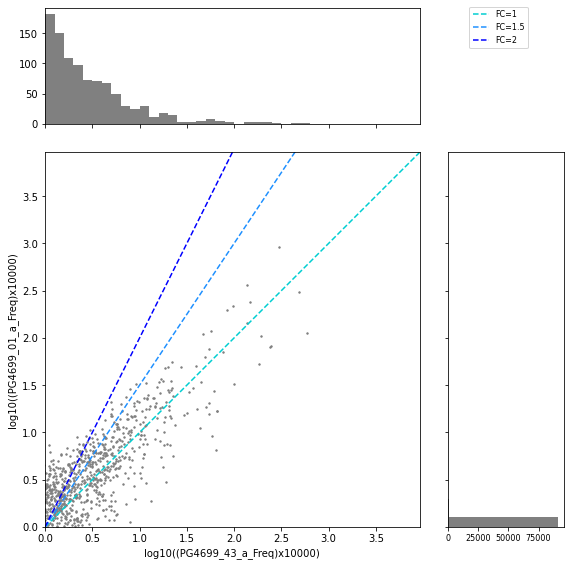

In [48]:
x_label = 'PG4699_43_a_Freq'
y_label = 'PG4699_01_a_Freq'
name1 = re.compile(r'(.*)_a').search(y_label).group(1)
name2 = re.compile(r'PG.*_(.*_a)_Freq').search(x_label).group(1)
name = name1 + '_' + name2 + '_scatter.png'
outfile = os.path.join(outdir, name)
scatter_with_dist(data, x_label, y_label, outfile)

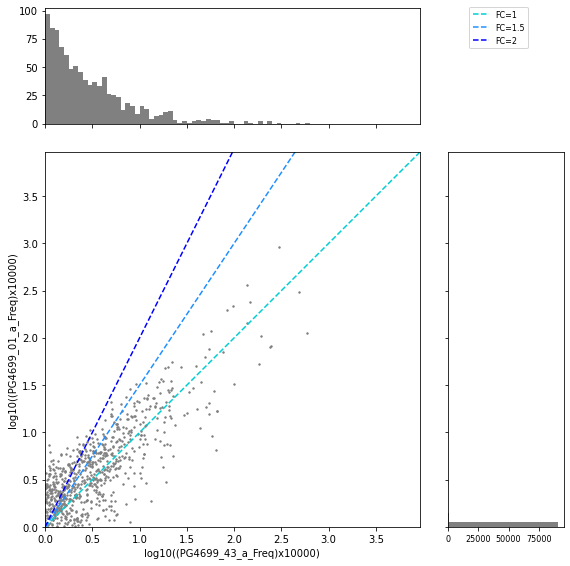

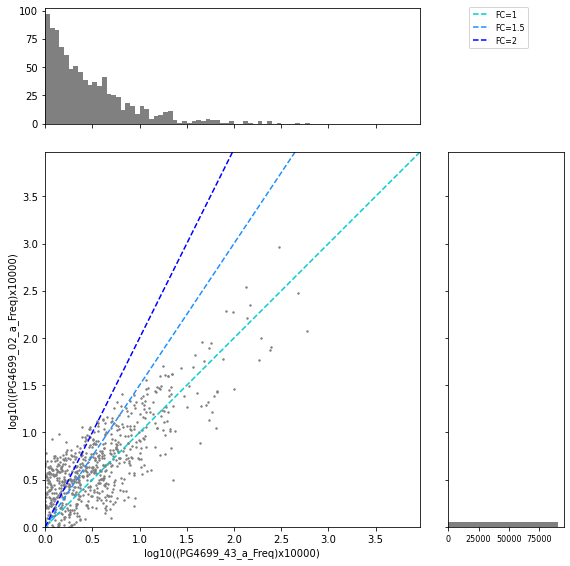

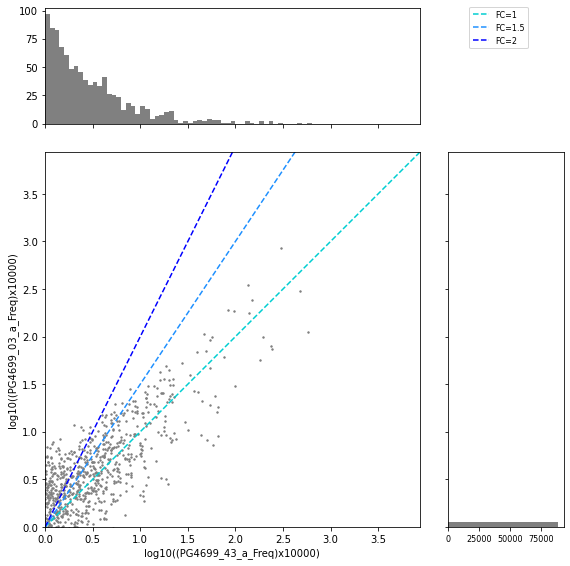

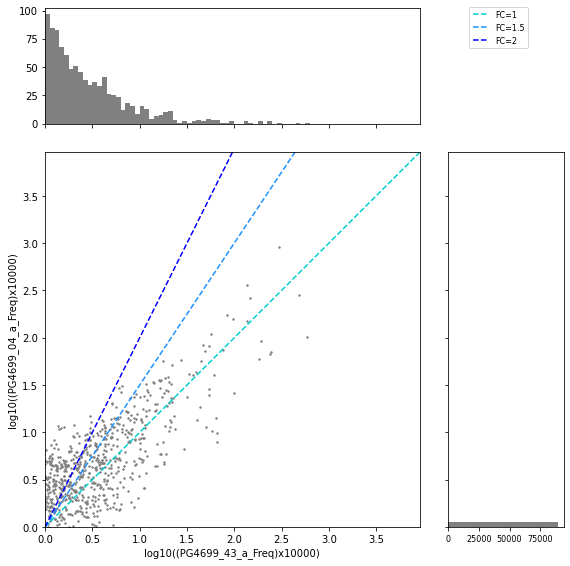

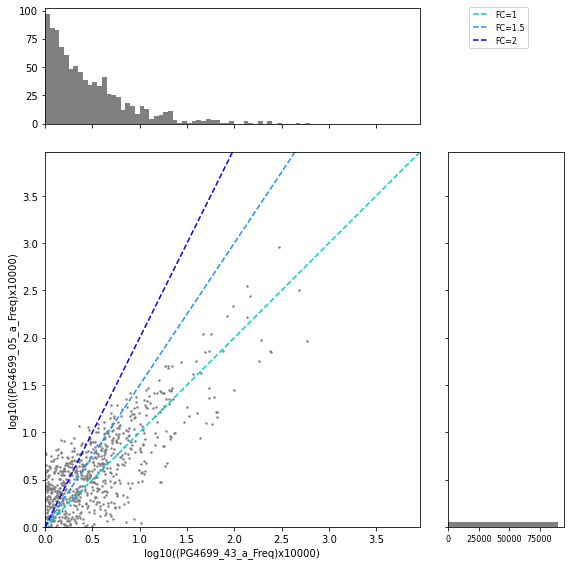

...

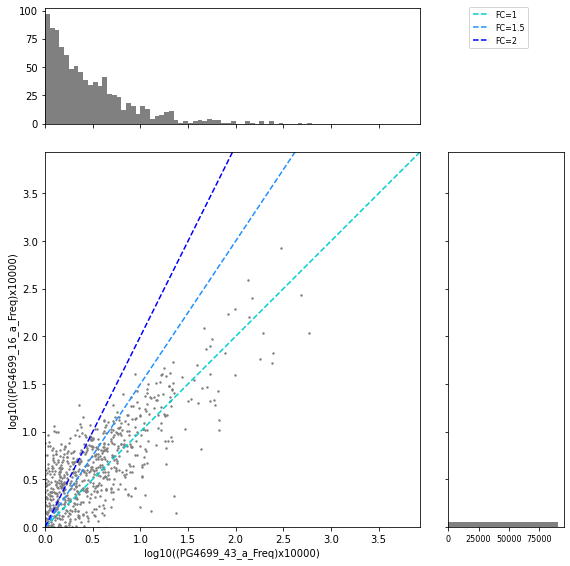

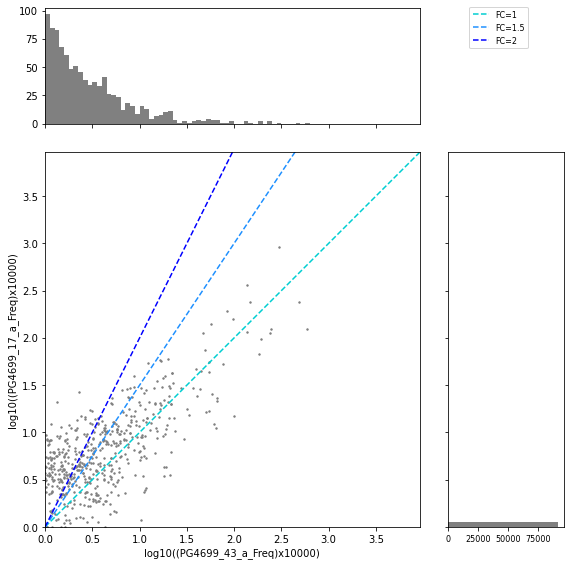

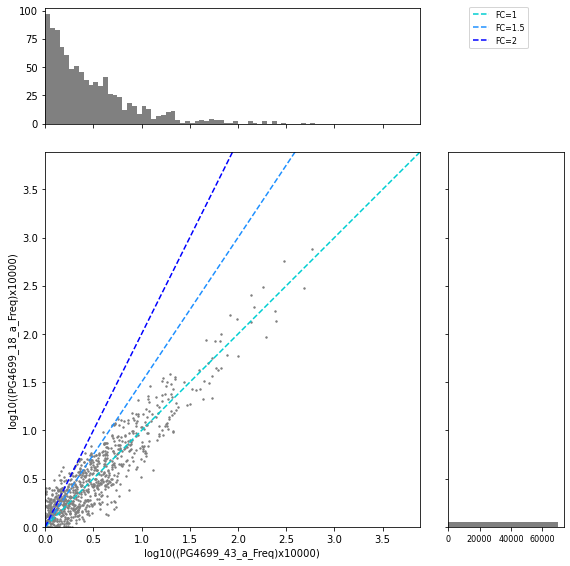

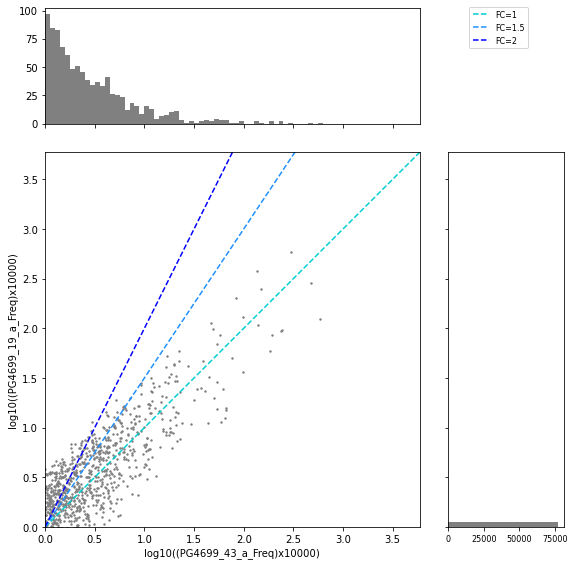

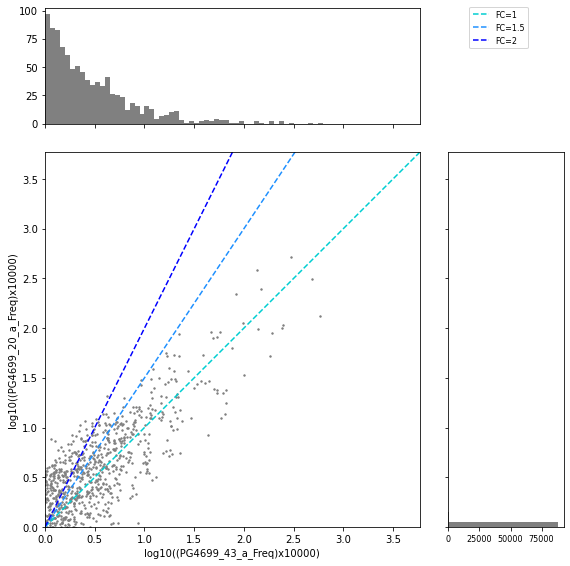

In [30]:
x_label = 'PG4699_43_a_Freq'
for i, label in enumerate(FC_col_1):
    if i < len(FC_col_1) -1:
        y_label = label
        name1 = re.compile(r'(.*)_a').search(y_label).group(1)
        name2 = re.compile(r'PG.*_(.*_a)_Freq').search(x_label).group(1)
        name = name1 + '_' + name2 + '_scatter.png'
        outfile = os.path.join(outdir, name)
        scatter_with_dist(data, x_label, y_label, outfile)
    

In [50]:
df_10000 = rep2.iloc[:, 1:] * 10000
df_10000_m = df_10000.replace(0, 1)
df_log10 = np.log10(df_10000_m)
data = pd.concat([rep2.iloc[:, 0],df_log10], axis=1)

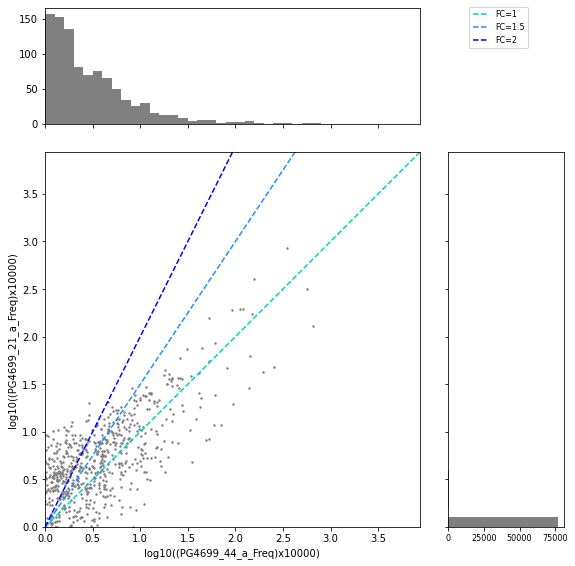

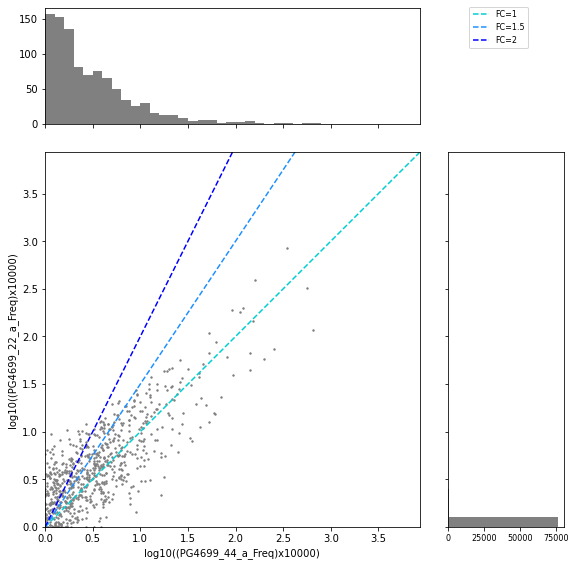

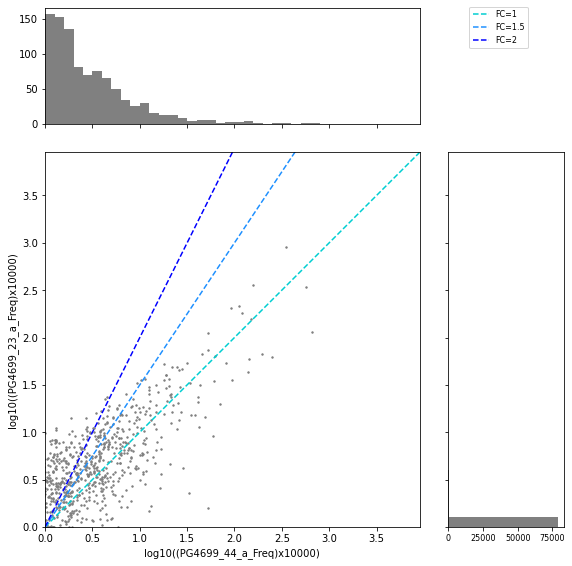

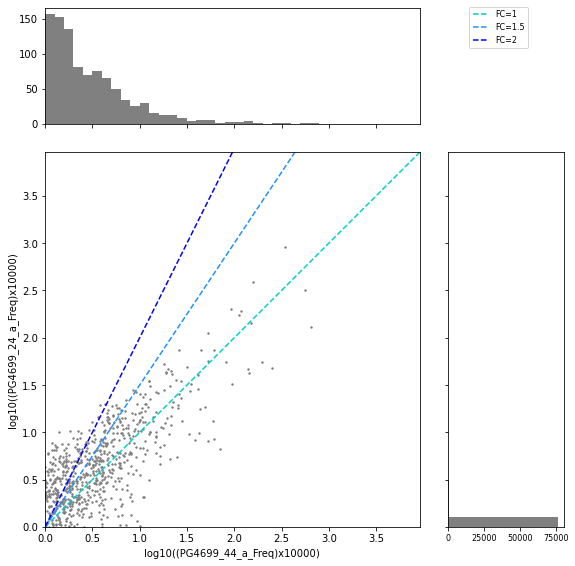

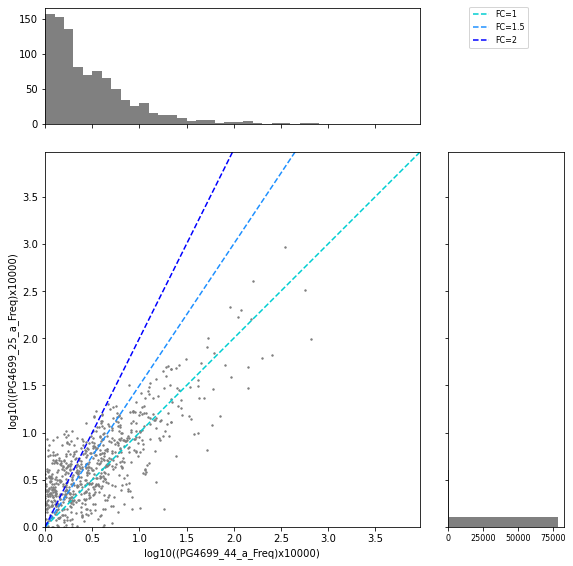

...

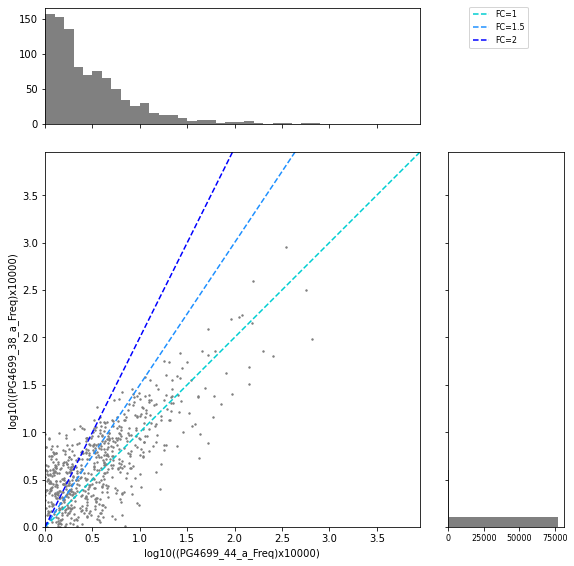

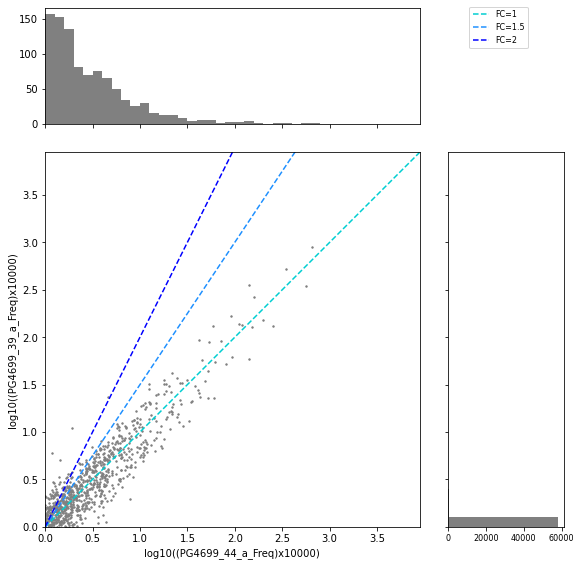

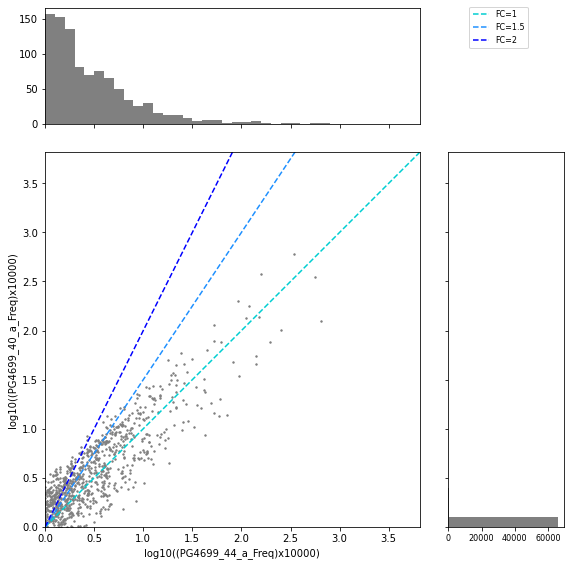

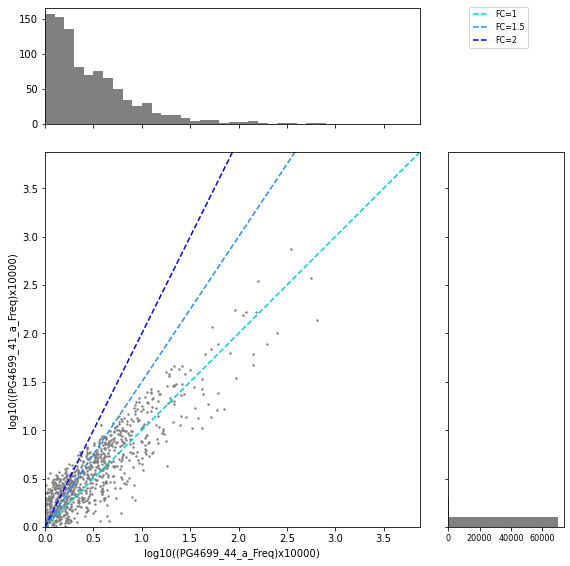

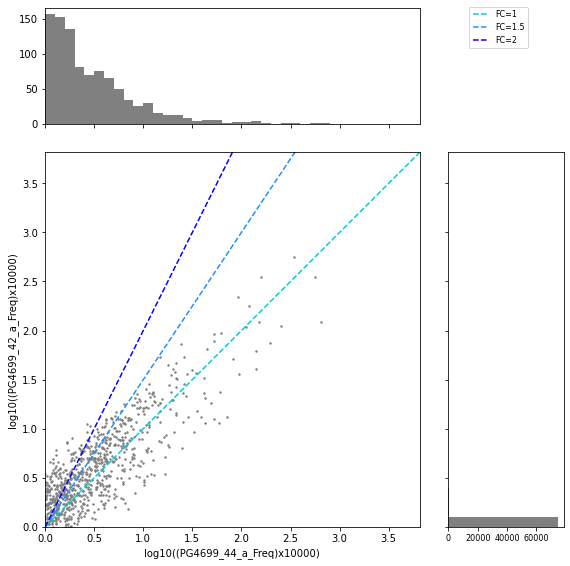

In [51]:
x_label = 'PG4699_44_a_Freq'
for i, label in enumerate(FC_col_2):
    if i < len(FC_col_2) -1:
        y_label = label
        name1 = re.compile(r'(.*)_a').search(y_label).group(1)
        name2 = re.compile(r'PG.*_(.*_a)_Freq').search(x_label).group(1)
        name = name1 + '_' + name2 + '_scatter.png'
        outfile = os.path.join(outdir, name)
        scatter_with_dist(data, x_label, y_label, outfile)

In [52]:
import seaborn as sns

In [53]:
df_rep1

,Header_ID,Reverse_complementary (Sequence Read),Sequence (Target Sequence),PG4699_01_a_Count,PG4699_02_a_Count,PG4699_03_a_Count,PG4699_04_a_Count,PG4699_05_a_Count,PG4699_06_a_Count,PG4699_07_a_Count,...,PG4699_16_43_a_FC,PG4699_16_43_a_FDR,PG4699_17_43_a_FC,PG4699_17_43_a_FDR,PG4699_18_43_a_FC,PG4699_18_43_a_FDR,PG4699_19_43_a_FC,PG4699_19_43_a_FDR,PG4699_20_43_a_FC,PG4699_20_43_a_FDR
0,Seq_1555,AAAAAGACGGGGGGTACTTGGGAGGCT,AGCCTCCCAAGTACCCCCCGTCTTTTT,0,0,0,0,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.0,1.0
1,Seq_2558,AAAAATAATGGGACGCATTGGGAGCAG,CTGCTCCCAATGCGTCCCATTATTTTT,2,63,0,2,1,0,0,...,1.687632,0.0,1.778955,0.0,3.793392,0.0,0.907248,0.0,0.0,1.0
2,Seq_2981,AAAAATACTGGGTCTCAGTGGGAGGTG,CACCTCCCACTGAGACCCAGTATTTTT,1,3,0,2,0,2,0,...,1.687632,0.0,0.889477,0.0,0.000000,1.0,0.453624,0.0,0.0,1.0
3,Seq_3576,AAAAATGTGGGGAAGCAGTGGGAGTGT,ACACTCCCACTGCTTCCCCACATTTTT,0,0,0,1,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.907248,0.0,0.0,1.0
4,Seq_5419,AAAACGCCGGGGCCGAGTTGGGAGATT,AATCTCCCAACTCGGCCCCGGCGTTTT,0,0,0,0,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106945,Seq_10752376,TTTTTGTCGGGGGTTGAGTGGGAGGCT,AGCCTCCCACTCAACCCCCGACAAAAA,0,0,0,0,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.453624,0.0,0.0,1.0
106946,Seq_10752392,TTTTTGTCTGGGAATAATTGGGAGATG,CATCTCCCAATTATTCCCAGACAAAAA,1,0,1,0,0,1,0,...,0.000000,1.0,1.778955,0.0,0.000000,1.0,0.000000,1.0,0.0,1.0
106947,Seq_10752402,TTTTTGTCTGGGACTACTTGGGAGACT,AGTCTCCCAAGTAGTCCCAGACAAAAA,0,0,0,0,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,2.419328,0.0,0.0,1.0
106948,Seq_10752795,TTTTTTGGGGGGCCGAGTTGGGAGATT,AATCTCCCAACTCGGCCCCCCAAAAAA,0,0,0,0,0,0,0,...,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.000000,1.0,0.0,1.0


In [54]:
FC_col_1 = []
for cols in df_rep1.columns:
    if 'FC' in cols: FC_col_1.append(cols)
info = df_rep1.loc[:, 'Header_ID']
freq = df_rep1.loc[:, FC_col_1]
rep1 = pd.concat([info, freq], axis=1)

# rep2 freq
# 各サンプルで投与前後を対応を考えて、投与前で少なくとも1個存在する配列を対象とする
FC_col_2 = []
for cols in df_rep2.columns:
    if 'FC' in cols: FC_col_2.append(cols)
info = df_rep2.loc[:, 'Header_ID']
freq = df_rep2.loc[:, FC_col_2]
rep2 = pd.concat([info, freq], axis=1)

In [188]:
rep1.iloc[:, 1:]

,PG4699_01_43_a_FC,PG4699_02_43_a_FC,PG4699_03_43_a_FC,PG4699_04_43_a_FC,PG4699_05_43_a_FC,PG4699_06_43_a_FC,PG4699_07_43_a_FC,PG4699_08_43_a_FC,PG4699_09_43_a_FC,PG4699_10_43_a_FC,PG4699_11_43_a_FC,PG4699_12_43_a_FC,PG4699_13_43_a_FC,PG4699_14_43_a_FC,PG4699_15_43_a_FC,PG4699_16_43_a_FC,PG4699_17_43_a_FC,PG4699_18_43_a_FC,PG4699_19_43_a_FC,PG4699_20_43_a_FC
0,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
1,1.919182,73.724783,0.00000,1.620365,0.857747,0.000000,0.0,2.596211,1.857897,1.737647,1.787438,3.95251,2.151978,0.000000,2.325167,1.687632,1.778955,3.793392,0.907248,0.0
2,0.479795,1.755352,0.00000,0.810182,0.000000,1.043417,0.0,0.000000,0.000000,2.172059,0.893719,0.00000,0.000000,0.000000,0.000000,1.687632,0.889477,0.000000,0.453624,0.0
3,0.000000,0.000000,0.00000,0.810182,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.893719,0.00000,0.000000,0.000000,1.162584,0.000000,0.000000,0.000000,0.907248,0.0
4,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106945,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.453624,0.0
106946,0.959591,0.000000,0.84913,0.000000,0.000000,1.043417,0.0,0.865404,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,1.778955,0.000000,0.000000,0.0
106947,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.191625,0.00000,0.000000,0.343318,0.000000,0.000000,0.000000,0.000000,2.419328,0.0
106948,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [189]:
rep2.iloc[:, 1:]

,PG4699_21_44_a_FC,PG4699_22_44_a_FC,PG4699_23_44_a_FC,PG4699_24_44_a_FC,PG4699_25_44_a_FC,PG4699_26_44_a_FC,PG4699_27_44_a_FC,PG4699_28_44_a_FC,PG4699_29_44_a_FC,PG4699_30_44_a_FC,...,PG4699_33_44_a_FC,PG4699_34_44_a_FC,PG4699_35_44_a_FC,PG4699_36_44_a_FC,PG4699_37_44_a_FC,PG4699_38_44_a_FC,PG4699_39_44_a_FC,PG4699_40_44_a_FC,PG4699_41_44_a_FC,PG4699_42_44_a_FC
0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
1,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
2,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
3,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
4,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.380731,0.000000,0.933869,0.000000,0.29459,0.0,0.618292,0.000000,0.000000,0.97712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92605,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.959502,0.0,...,1.142192,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
92606,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.00000
92607,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,6.380532,0.000000,0.00000
92608,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,1.142192,3.787464,24.280600,0.873878,0.88377,0.0,0.927438,6.380532,17.032323,0.00000


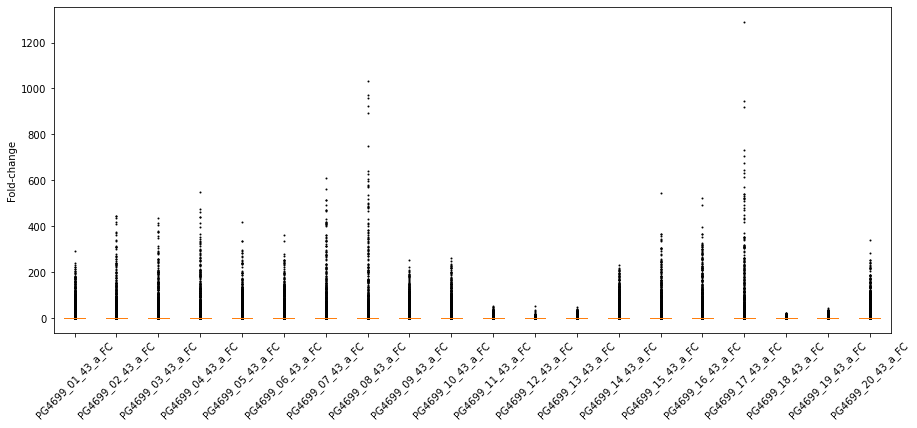

In [69]:
plt.figure(figsize=(15, 6))
flierprops = dict(markersize=1)
plt.boxplot(rep1.iloc[:, 1:], labels=rep1.iloc[:, 1:].columns, flierprops=flierprops)
plt.xticks(rotation=45)
plt.ylabel('Fold-change')
plt.show()

In [207]:
[rep1.iloc[:, 1], rep2.iloc[:, 1]]

[0         0.000000
 1         1.919182
 2         0.479795
 3         0.000000
 4         0.000000
             ...   
 106945    0.000000
 106946    0.959591
 106947    0.000000
 106948    0.000000
 106949    0.000000
 Name: PG4699_01_43_a_FC, Length: 106950, dtype: float64,
 0        0.000000
 1        0.000000
 2        0.000000
 3        0.000000
 4        0.000000
            ...   
 92605    0.000000
 92606    0.000000
 92607    0.000000
 92608    0.000000
 92609    3.028745
 Name: PG4699_21_44_a_FC, Length: 92610, dtype: float64]

In [212]:
val1 = []
for i in range(len(rep1.iloc[:, 1:].columns)):
    num = i+1
    data = rep1.iloc[:, num]
    val1.append(data)
val2 = []
for i in range(len(rep2.iloc[:, 1:].columns)):
    num = i+1
    data = rep2.iloc[:, num]
    val2.append(data)

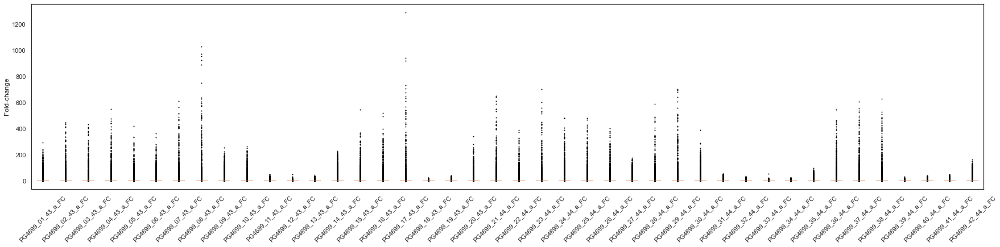

In [221]:
sns.set_style("white")
plt.figure(figsize=(30, 6))
flierprops = dict(markersize=1)
val12 = val1 + val2
label = rep1.iloc[:, 1:].columns.tolist() + rep2.iloc[:, 1:].columns.tolist()
plt.boxplot(val12, labels=label, flierprops=flierprops)
plt.xticks(rotation=45)
plt.ylabel('Fold-change')
plt.show()

In [86]:
file = 'A:/PROJECT/PG4699/000_DOC/L2891-17_AmpliconDNAconc.xlsx'
df = pd.read_excel(file)
sample_df = df.dropna(axis=1, how='all').dropna(axis=0).reset_index(drop=True)
sample_df.columns = sample_df.iloc[0, :]

In [87]:
sample_link = {}
n2_link = {}
for i in range(len(sample_df)):
    if str(sample_df.loc[i, 'Smaple']).isdigit():
        user_id = str(sample_df.loc[i, 'Sample'])
        sample_link[user_id] = sample_df.loc[i, 'Tisse']
        if n2_link.get(sample_df.loc[i, 'Tisse']):
            n2_link[sample_df.loc[i, 'Tisse']] += ',' + user_id
        else:
            n2_link[sample_df.loc[i, 'Tisse']] = user_id

In [88]:
df_sample = pd.DataFrame(list(sample_link.items()), columns=['サンプル名', '組織'])
df_n2 = pd.DataFrame(list(n2_link.items()), columns=['組織', 'サンプル名'])

In [90]:
outfile = 'A:/PROJECT/PG4699/000_DOC/PG4699_samplelist.xlsx'
with pd.ExcelWriter(outfile) as writer:
    df_sample.to_excel(writer, sheet_name='takaraID', index=False)
    df_n2.to_excel(writer, sheet_name='n2', index=False)

In [92]:
file = 'A:/PROJECT/PG4699/000_DOC/PG4699_samplelist.xlsx'
df_sample = pd.read_excel(file, sheet_name='takaraID')
df_n2 = pd.read_excel(file, sheet_name='n2')

In [93]:
df_sample.columns

Index(['Takara ID', 'サンプル名', '組織'], dtype='object')

In [111]:
takaraID = {}
sample = {}
tissue = {}
for i in range(len(df_sample)):
    tID = df_sample.loc[i, 'Takara ID']
    sNa = df_sample.loc[i, 'サンプル名']
    tNa = df_sample.loc[i, '組織']
    takaraID[tID] = sNa
    sample[sNa] = tID
    tissue[tID] = tNa

In [95]:
ID_join = []
for i in range(len(df_n2)):
    tmp = []
    sNa = df_n2.loc[i, 'サンプル名']
    names = sNa.split(',')
    for i in names:
        tmp.append(sample[i])
    IDs = ','.join(tmp)
    ID_join.append(IDs)

df_n2['Takara ID'] = pd.Series(ID_join)

In [99]:
df_n2

,組織,サンプル名,Takara ID
0,Brain-1,"101,201","PG4699_01_a,PG4699_21_a"
1,Brain-2,"102#2,202","PG4699_02_a,PG4699_22_a"
2,Brain-3,"103,203","PG4699_03_a,PG4699_23_a"
3,Brain-4,"104,204","PG4699_04_a,PG4699_24_a"
4,Brain-4_Cerebellum,"104c,204c","PG4699_05_a,PG4699_25_a"
5,Brain-5,"105,205","PG4699_06_a,PG4699_26_a"
6,Striatum,"106,206","PG4699_07_a,PG4699_27_a"
7,Thalamus,"108,208","PG4699_08_a,PG4699_28_a"
8,Cerebellum,"109#2,209","PG4699_09_a,PG4699_29_a"
9,Cortex,"110,210","PG4699_10_a,PG4699_30_a"


In [103]:
import openpyxl
import xlwt

In [109]:
outfile = 'A:/PROJECT/PG4699/000_DOC/PG4699_samplelist.xlsx'
with pd.ExcelWriter(outfile, engine='openpyxl', mode = 'a') as writer:
    df_n2.to_excel(writer, sheet_name='n2_mod', index=False)

In [112]:
tissue

{'PG4699_01_a': 'Brain-1',
 'PG4699_02_a': 'Brain-2',
 'PG4699_03_a': 'Brain-3',
 'PG4699_04_a': 'Brain-4',
 'PG4699_05_a': 'Brain-4_Cerebellum',
 'PG4699_06_a': 'Brain-5',
 'PG4699_07_a': 'Striatum',
 'PG4699_08_a': 'Thalamus',
 'PG4699_09_a': 'Cerebellum',
 'PG4699_10_a': 'Cortex',
 'PG4699_11_a': 'Lung',
 'PG4699_12_a': 'Liver',
 'PG4699_13_a': 'Kideny',
 'PG4699_14_a': 'Optic nerve',
 'PG4699_15_a': 'Cervical spinal cord',
 'PG4699_16_a': 'Thoracic spinal cord',
 'PG4699_17_a': 'Lumber spinal cord',
 'PG4699_18_a': 'Spleen',
 'PG4699_19_a': 'Pancreas',
 'PG4699_20_a': 'DRG',
 'PG4699_21_a': 'Brain-1',
 'PG4699_22_a': 'Brain-2',
 'PG4699_23_a': 'Brain-3',
 'PG4699_24_a': 'Brain-4',
 'PG4699_25_a': 'Brain-4_Cerebellum',
 'PG4699_26_a': 'Brain-5',
 'PG4699_27_a': 'Striatum',
 'PG4699_28_a': 'Thalamus',
 'PG4699_29_a': 'Cerebellum',
 'PG4699_30_a': 'Cortex',
 'PG4699_31_a': 'Heart',
 'PG4699_32_a': 'Lung',
 'PG4699_33_a': 'Liver',
 'PG4699_34_a': 'Kideny',
 'PG4699_35_a': 'Optic nerve'

In [113]:
print(FC_col_1)
print(FC_col_2)

['PG4699_01_43_a_FC', 'PG4699_02_43_a_FC', 'PG4699_03_43_a_FC', 'PG4699_04_43_a_FC', 'PG4699_05_43_a_FC', 'PG4699_06_43_a_FC', 'PG4699_07_43_a_FC', 'PG4699_08_43_a_FC', 'PG4699_09_43_a_FC', 'PG4699_10_43_a_FC', 'PG4699_11_43_a_FC', 'PG4699_12_43_a_FC', 'PG4699_13_43_a_FC', 'PG4699_14_43_a_FC', 'PG4699_15_43_a_FC', 'PG4699_16_43_a_FC', 'PG4699_17_43_a_FC', 'PG4699_18_43_a_FC', 'PG4699_19_43_a_FC', 'PG4699_20_43_a_FC']
['PG4699_21_44_a_FC', 'PG4699_22_44_a_FC', 'PG4699_23_44_a_FC', 'PG4699_24_44_a_FC', 'PG4699_25_44_a_FC', 'PG4699_26_44_a_FC', 'PG4699_27_44_a_FC', 'PG4699_28_44_a_FC', 'PG4699_29_44_a_FC', 'PG4699_30_44_a_FC', 'PG4699_31_44_a_FC', 'PG4699_32_44_a_FC', 'PG4699_33_44_a_FC', 'PG4699_34_44_a_FC', 'PG4699_35_44_a_FC', 'PG4699_36_44_a_FC', 'PG4699_37_44_a_FC', 'PG4699_38_44_a_FC', 'PG4699_39_44_a_FC', 'PG4699_40_44_a_FC', 'PG4699_41_44_a_FC', 'PG4699_42_44_a_FC']


In [270]:
file = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Consensus_frequency.xlsx'
df_rep1 = pd.read_excel(file, sheet_name='100-131')
df_rep2 = pd.read_excel(file, sheet_name='200-231')

In [177]:
Freq_col_1 = []
for cols in df_rep1.columns:
    if 'Freq' in cols: Freq_col_1.append(cols)

Freq_col_2 = []
for cols in df_rep2.columns:
    if 'Freq' in cols: Freq_col_2.append(cols)

In [271]:
FC_col_1 = []
for cols in df_rep1.columns:
    if 'FC' in cols: FC_col_1.append(cols)

FC_col_2 = []
for cols in df_rep2.columns:
    if 'FC' in cols: FC_col_2.append(cols)

In [178]:
df_crep1 = df_rep1.loc[:, Freq_col_1]
df_crep2 = df_rep2.loc[:, Freq_col_2]
print(df_crep1.shape)
print(df_crep2.shape)

(106950, 21)
(92610, 23)


In [273]:
df_crep1 = df_rep1.loc[:, FC_col_1]
df_crep2 = df_rep2.loc[:, FC_col_2]
print(df_crep1.shape)
print(df_crep2.shape)

(106950, 20)
(92610, 22)


In [274]:
df_crep1.head()

,PG4699_01_43_a_FC,PG4699_02_43_a_FC,PG4699_03_43_a_FC,PG4699_04_43_a_FC,PG4699_05_43_a_FC,PG4699_06_43_a_FC,PG4699_07_43_a_FC,PG4699_08_43_a_FC,PG4699_09_43_a_FC,PG4699_10_43_a_FC,PG4699_11_43_a_FC,PG4699_12_43_a_FC,PG4699_13_43_a_FC,PG4699_14_43_a_FC,PG4699_15_43_a_FC,PG4699_16_43_a_FC,PG4699_17_43_a_FC,PG4699_18_43_a_FC,PG4699_19_43_a_FC,PG4699_20_43_a_FC
0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
1,1.919182,73.724783,0.0,1.620365,0.857747,0.000000,0.0,2.596211,1.857897,1.737647,1.787438,3.95251,2.151978,0.0,2.325167,1.687632,1.778955,3.793392,0.907248,0.0
2,0.479795,1.755352,0.0,0.810182,0.000000,1.043417,0.0,0.000000,0.000000,2.172059,0.893719,0.00000,0.000000,0.0,0.000000,1.687632,0.889477,0.000000,0.453624,0.0
3,0.000000,0.000000,0.0,0.810182,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.893719,0.00000,0.000000,0.0,1.162584,0.000000,0.000000,0.000000,0.907248,0.0
4,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [180]:
rep1_rename = {}
for name in df_crep1.columns:
    lotID = re.compile(r'(PG.*)_Freq').search(name).group(1)
    takaraID = lotID
    rep1_rename[name] = tissue[takaraID]

rep2_rename = {}
for name in df_crep2.columns:
    lotID = re.compile(r'(PG.*)_Freq').search(name).group(1)
    takaraID = lotID
    rep2_rename[name] = tissue[takaraID]

In [275]:
rep1_rename = {}
for name in df_crep1.columns:
    lotID = re.compile(r'(PG.*)_.*_a_FC').search(name).group(1)
    takaraID = lotID + '_a'
    rep1_rename[name] = tissue[takaraID]

rep2_rename = {}
for name in df_crep2.columns:
    lotID = re.compile(r'(PG.*)_.*_a_FC').search(name).group(1)
    takaraID = lotID + '_a'
    rep2_rename[name] = tissue[takaraID]

In [276]:
df_crep1 = df_crep1.rename(columns=rep1_rename)
df_crep2 = df_crep2.rename(columns=rep2_rename)

In [277]:
df_crep1

,Brain-1,Brain-2,Brain-3,Brain-4,Brain-4_Cerebellum,Brain-5,Striatum,Thalamus,Cerebellum,Cortex,Lung,Liver,Kideny,Optic nerve,Cervical spinal cord,Thoracic spinal cord,Lumber spinal cord,Spleen,Pancreas,DRG
0,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
1,1.919182,73.724783,0.00000,1.620365,0.857747,0.000000,0.0,2.596211,1.857897,1.737647,1.787438,3.95251,2.151978,0.000000,2.325167,1.687632,1.778955,3.793392,0.907248,0.0
2,0.479795,1.755352,0.00000,0.810182,0.000000,1.043417,0.0,0.000000,0.000000,2.172059,0.893719,0.00000,0.000000,0.000000,0.000000,1.687632,0.889477,0.000000,0.453624,0.0
3,0.000000,0.000000,0.00000,0.810182,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.893719,0.00000,0.000000,0.000000,1.162584,0.000000,0.000000,0.000000,0.907248,0.0
4,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106945,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.453624,0.0
106946,0.959591,0.000000,0.84913,0.000000,0.000000,1.043417,0.0,0.865404,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,1.778955,0.000000,0.000000,0.0
106947,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.191625,0.00000,0.000000,0.343318,0.000000,0.000000,0.000000,0.000000,2.419328,0.0
106948,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


<AxesSubplot:>

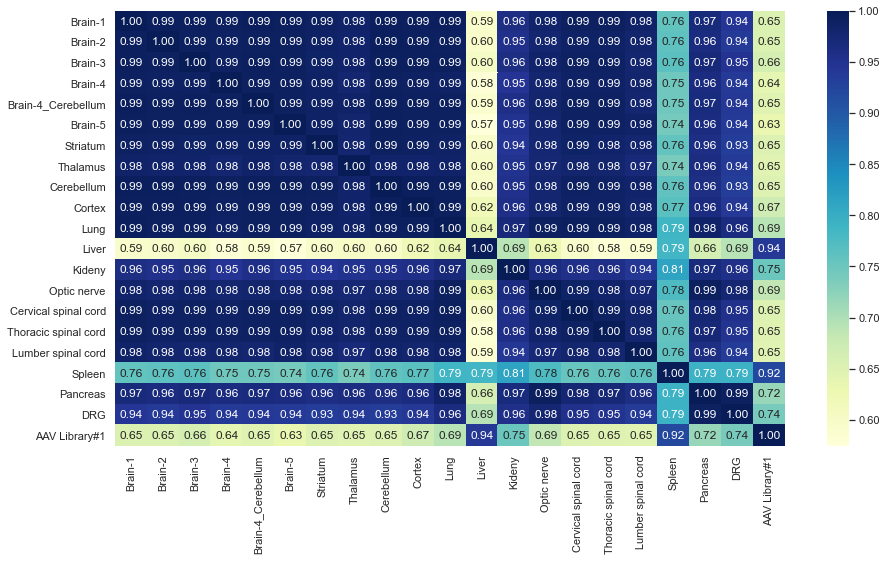

In [182]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep1.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

<AxesSubplot:>

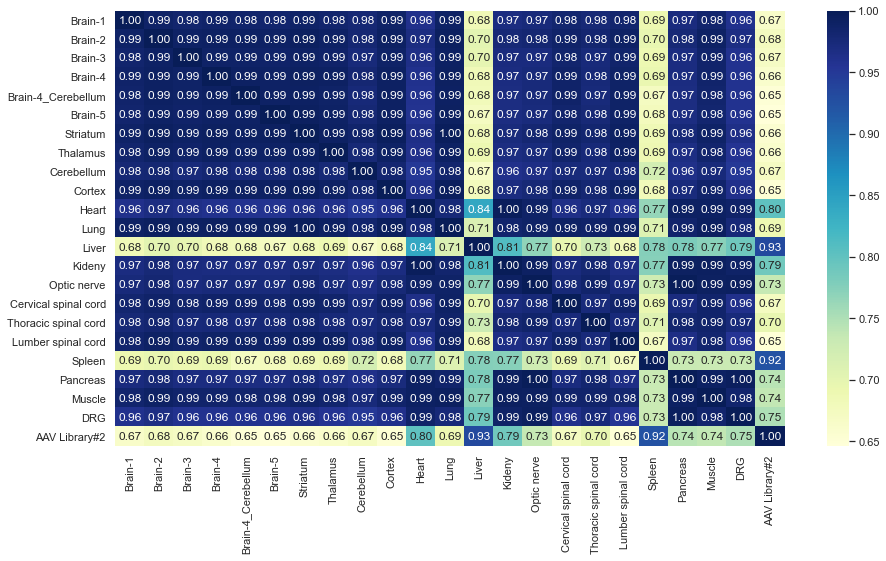

In [183]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep2.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

In [184]:
df_crep12 = pd.concat([df_crep1, df_crep2], axis=1)

<AxesSubplot:>

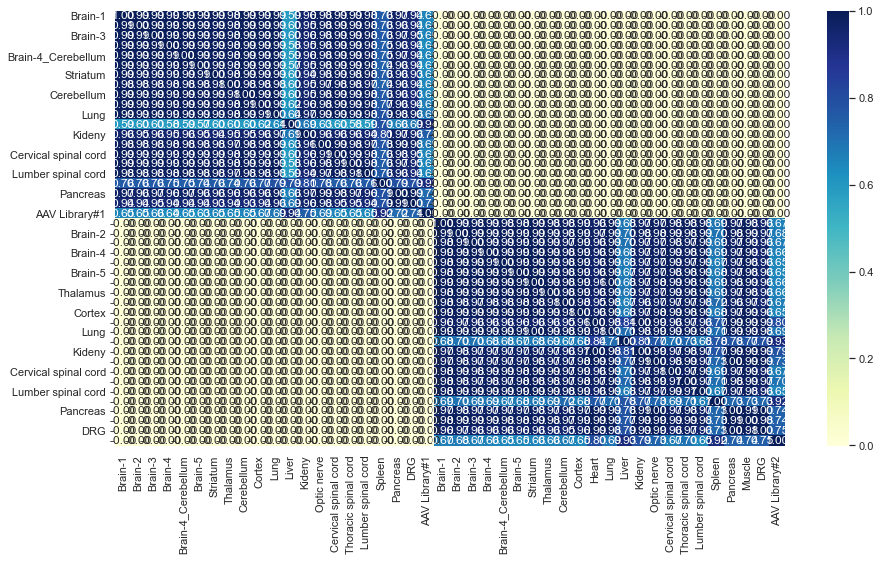

In [186]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep12.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

<AxesSubplot:>

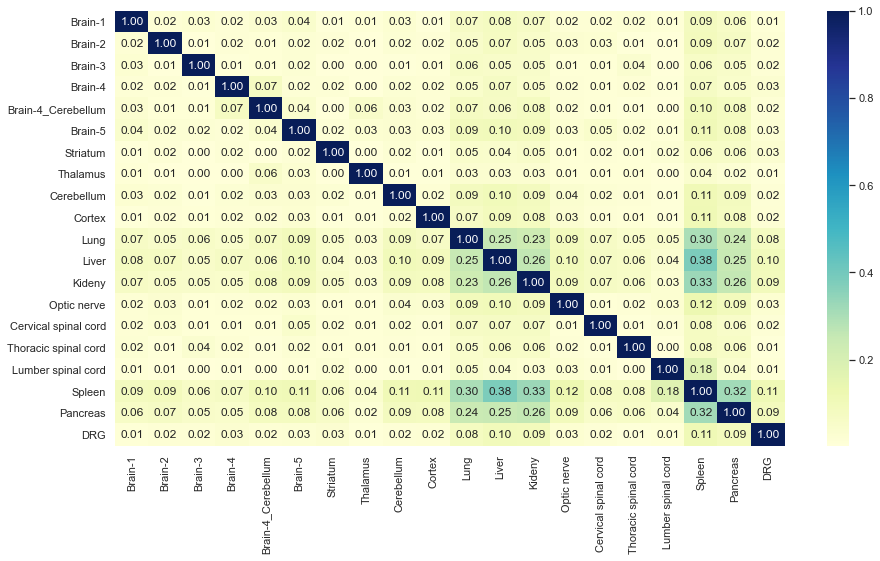

In [278]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep1.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

<AxesSubplot:>

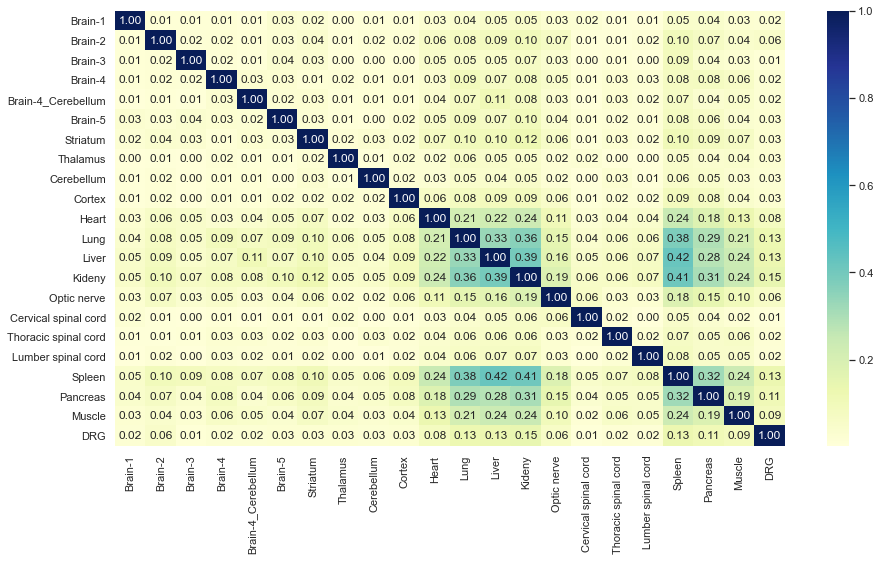

In [279]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep2.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

In [222]:
# 個体間で共通した配列
file = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Common_Consensus_frequency.xlsx'
df_rep1 = pd.read_excel(file, sheet_name='100-131')
df_rep2 = pd.read_excel(file, sheet_name='200-231')

In [257]:
FC_col_1 = []
for cols in df_rep1.columns:
    if 'Freq' in cols: FC_col_1.append(cols)

FC_col_2 = []
for cols in df_rep2.columns:
    if 'Freq' in cols: FC_col_2.append(cols)

In [258]:
FC_col_1

['PG4699_01_a_Freq',
 'PG4699_02_a_Freq',
 'PG4699_03_a_Freq',
 'PG4699_04_a_Freq',
 'PG4699_05_a_Freq',
 'PG4699_06_a_Freq',
 'PG4699_07_a_Freq',
 'PG4699_08_a_Freq',
 'PG4699_09_a_Freq',
 'PG4699_10_a_Freq',
 'PG4699_11_a_Freq',
 'PG4699_12_a_Freq',
 'PG4699_13_a_Freq',
 'PG4699_14_a_Freq',
 'PG4699_15_a_Freq',
 'PG4699_16_a_Freq',
 'PG4699_17_a_Freq',
 'PG4699_18_a_Freq',
 'PG4699_19_a_Freq',
 'PG4699_20_a_Freq',
 'PG4699_43_a_Freq']

In [260]:
df_crep1 = df_rep1.loc[:, FC_col_1]
df_crep2 = df_rep2.loc[:, FC_col_2]
# n = 1 の組織を除外　Heart: 31_a , Muscle: 41_a
df_crep2 = df_crep2.drop(['PG4699_31_a_Freq', 'PG4699_41_a_Freq'], axis=1)

In [261]:
print(df_crep1.shape)
print(df_crep2.shape)

(38618, 21)
(38618, 21)


In [243]:
rep1_rename = {}
for name in df_crep1.columns:
    lotID = re.compile(r'(PG.*)_.*_a_FC').search(name).group(1)
    takaraID = lotID + '_a'
    rep1_rename[name] = tissue[takaraID]

rep2_rename = {}
for name in df_crep2.columns:
    lotID = re.compile(r'(PG.*)_.*_a_FC').search(name).group(1)
    takaraID = lotID + '_a'
    rep2_rename[name] = tissue[takaraID]

In [262]:
rep1_rename = {}
for name in df_crep1.columns:
    lotID = re.compile(r'(PG.*)_a_Freq').search(name).group(1)
    takaraID = lotID + '_a'
    rep1_rename[name] = tissue[takaraID]

rep2_rename = {}
for name in df_crep2.columns:
    lotID = re.compile(r'(PG.*)_a_Freq').search(name).group(1)
    takaraID = lotID + '_a'
    rep2_rename[name] = tissue[takaraID]

In [263]:
print(rep1_rename)
print(rep2_rename)

{'PG4699_01_a_Freq': 'Brain-1', 'PG4699_02_a_Freq': 'Brain-2', 'PG4699_03_a_Freq': 'Brain-3', 'PG4699_04_a_Freq': 'Brain-4', 'PG4699_05_a_Freq': 'Brain-4_Cerebellum', 'PG4699_06_a_Freq': 'Brain-5', 'PG4699_07_a_Freq': 'Striatum', 'PG4699_08_a_Freq': 'Thalamus', 'PG4699_09_a_Freq': 'Cerebellum', 'PG4699_10_a_Freq': 'Cortex', 'PG4699_11_a_Freq': 'Lung', 'PG4699_12_a_Freq': 'Liver', 'PG4699_13_a_Freq': 'Kideny', 'PG4699_14_a_Freq': 'Optic nerve', 'PG4699_15_a_Freq': 'Cervical spinal cord', 'PG4699_16_a_Freq': 'Thoracic spinal cord', 'PG4699_17_a_Freq': 'Lumber spinal cord', 'PG4699_18_a_Freq': 'Spleen', 'PG4699_19_a_Freq': 'Pancreas', 'PG4699_20_a_Freq': 'DRG', 'PG4699_43_a_Freq': 'AAV Library#1'}
{'PG4699_21_a_Freq': 'Brain-1', 'PG4699_22_a_Freq': 'Brain-2', 'PG4699_23_a_Freq': 'Brain-3', 'PG4699_24_a_Freq': 'Brain-4', 'PG4699_25_a_Freq': 'Brain-4_Cerebellum', 'PG4699_26_a_Freq': 'Brain-5', 'PG4699_27_a_Freq': 'Striatum', 'PG4699_28_a_Freq': 'Thalamus', 'PG4699_29_a_Freq': 'Cerebellum', 

In [264]:
df_crep1 = df_crep1.rename(columns=rep1_rename)
df_crep2 = df_crep2.rename(columns=rep2_rename)

In [265]:
df_crep1.shape

(38618, 21)

In [266]:
df_crep2.shape

(38618, 21)

In [267]:
df_crep12 = pd.concat([df_crep1, df_crep2], axis=1)

In [268]:
df_crep12.shape

(38618, 42)

<AxesSubplot:>

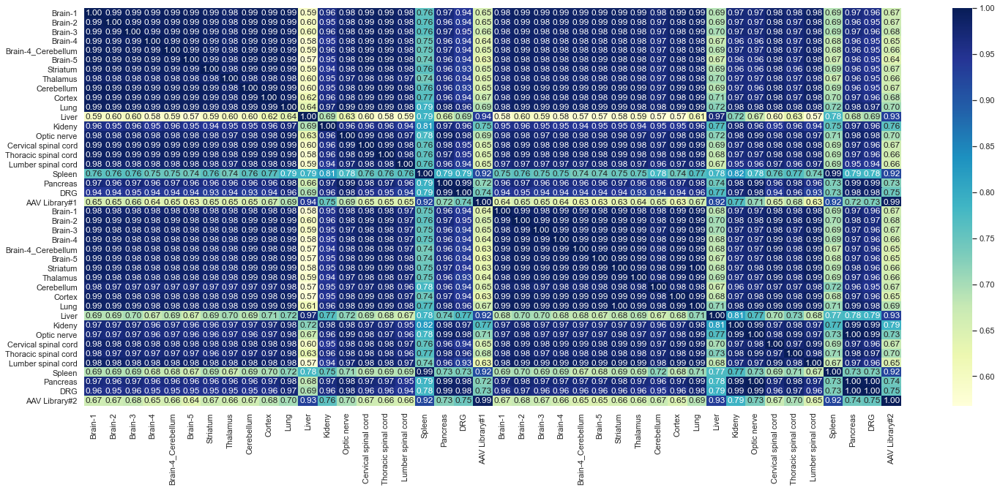

In [269]:
sns.set(rc = {'figure.figsize':(25,10)})
sns.heatmap(df_crep12.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

In [148]:
res = df_crep1.corrwith(df_crep2)

In [149]:
res

Brain-1                -0.001159
Brain-2                 0.017770
Brain-3                -0.001453
Brain-4                -0.001530
Brain-4_Cerebellum      0.003751
Brain-5                 0.022411
Striatum                0.018993
Thalamus               -0.001149
Cerebellum              0.001951
Cortex                  0.004357
Lung                    0.108489
Liver                   0.263428
Kideny                  0.092379
Optic nerve             0.023602
Cervical spinal cord    0.003276
Thoracic spinal cord    0.000517
Lumber spinal cord     -0.002404
Spleen                  0.146095
Pancreas                0.099919
DRG                     0.010217
dtype: float64

In [150]:
df_crep12 = pd.concat([df_crep1, df_crep2], axis=1)

In [151]:
df_crep12

,Brain-1,Brain-2,Brain-3,Brain-4,Brain-4_Cerebellum,Brain-5,Striatum,Thalamus,Cerebellum,Cortex,...,Lung,Liver,Kideny,Optic nerve,Cervical spinal cord,Thoracic spinal cord,Lumber spinal cord,Spleen,Pancreas,DRG
0,1.919182,73.724783,0.000000,1.620365,0.857747,0.000000,0.000000,2.596211,1.857897,1.737647,...,0.000000,1.142192,0.473433,0.466935,0.000000,0.441885,1.560097,1.854876,0.000000,0.000000
1,0.479795,1.755352,0.000000,0.810182,0.000000,1.043417,0.000000,0.000000,0.000000,2.172059,...,0.000000,1.142192,0.946866,0.000000,0.000000,0.000000,1.040065,0.927438,0.000000,1.954241
2,0.000000,0.000000,0.000000,0.810182,0.000000,1.043417,0.000000,0.000000,0.000000,0.868823,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.883770,1.040065,0.927438,0.000000,0.977120
3,0.959591,0.000000,0.000000,0.810182,1.715495,0.000000,0.000000,0.000000,0.000000,0.000000,...,5.475713,0.000000,0.000000,1.867738,0.000000,0.883770,0.000000,0.000000,1.823009,0.000000
4,0.959591,0.000000,0.000000,0.810182,0.000000,3.130252,0.000000,1.730808,0.000000,1.737647,...,0.000000,1.142192,0.000000,0.311290,0.000000,0.294590,0.000000,0.000000,0.303835,0.325707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38613,0.479795,0.000000,0.000000,94.386239,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.737857,0.000000,2.367165,0.000000,0.873878,0.000000,0.000000,0.000000,0.911505,0.000000
38614,0.219037,3.497984,2.741212,0.132095,1.137447,1.757931,1.251424,9.190212,0.797684,0.500518,...,1.220490,0.990817,1.323331,2.812859,1.431897,0.063887,0.037593,1.005655,1.361766,2.436915
38615,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.137061,0.123629,0.132707,0.000000,...,4.015523,1.142192,1.325612,2.614834,0.524327,0.000000,0.000000,0.741950,1.093805,0.000000
38616,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.927438,0.000000,0.000000


In [152]:
r = df_crep12.corr(method='pearson')

In [153]:
r

,Brain-1,Brain-2,Brain-3,Brain-4,Brain-4_Cerebellum,Brain-5,Striatum,Thalamus,Cerebellum,Cortex,...,Lung,Liver,Kideny,Optic nerve,Cervical spinal cord,Thoracic spinal cord,Lumber spinal cord,Spleen,Pancreas,DRG
Brain-1,1.000000,0.020431,0.022017,0.011200,0.020400,0.045096,0.004767,0.007319,0.023915,0.003167,...,0.027379,0.028668,0.024262,0.008890,0.002436,-0.000935,0.029729,0.021206,0.012392,0.007541
Brain-2,0.020431,1.000000,0.001230,0.004275,0.007146,0.021620,0.011781,0.003261,0.011412,0.012521,...,0.034680,0.021207,0.045296,0.007831,0.004416,-0.002503,0.000142,0.013097,0.036839,0.016418
Brain-3,0.022017,0.001230,1.000000,0.004662,0.009008,0.023623,0.001863,0.001476,0.003990,0.000740,...,0.018801,0.018880,0.019463,0.012600,-0.002876,0.001257,0.003914,0.011714,0.009678,-0.002055
Brain-4,0.011200,0.004275,0.004662,1.000000,0.078174,0.011419,0.017361,0.000671,0.019185,0.018840,...,0.019962,0.000638,0.008473,0.013064,0.009255,0.020425,-0.002983,0.007122,0.006344,-0.002709
Brain-4_Cerebellum,0.020400,0.007146,0.009008,0.078174,1.000000,0.032033,0.000437,0.042617,0.033440,0.009608,...,0.021385,0.011859,0.021192,0.003144,0.000461,0.013674,-0.000534,0.020566,0.024752,0.028808
Brain-5,0.045096,0.021620,0.023623,0.011419,0.032033,1.000000,0.014734,0.030108,0.027576,0.019999,...,0.046936,0.034326,0.044542,0.022066,0.014809,0.004417,0.018208,0.031397,0.017855,0.010559
Striatum,0.004767,0.011781,0.001863,0.017361,0.000437,0.014734,1.000000,0.000196,0.029525,0.005729,...,0.029700,0.013468,0.022998,0.015369,-0.002243,0.002367,0.013697,0.036946,0.026854,0.010884
Thalamus,0.007319,0.003261,0.001476,0.000671,0.042617,0.030108,0.000196,1.000000,0.003399,0.005985,...,0.042371,0.014578,0.007421,0.002692,0.001679,0.003609,-0.001684,0.016903,0.033088,0.000842
Cerebellum,0.023915,0.011412,0.003990,0.019185,0.033440,0.027576,0.029525,0.003399,1.000000,0.014266,...,0.035871,0.033479,0.028940,0.006459,-0.003489,0.001551,0.008742,0.023755,0.022598,0.011265
Cortex,0.003167,0.012521,0.000740,0.018840,0.009608,0.019999,0.005729,0.005985,0.014266,1.000000,...,0.033701,0.029953,0.059594,0.006016,-0.002159,-0.003023,0.001773,0.022765,0.022077,0.001174


<AxesSubplot:>

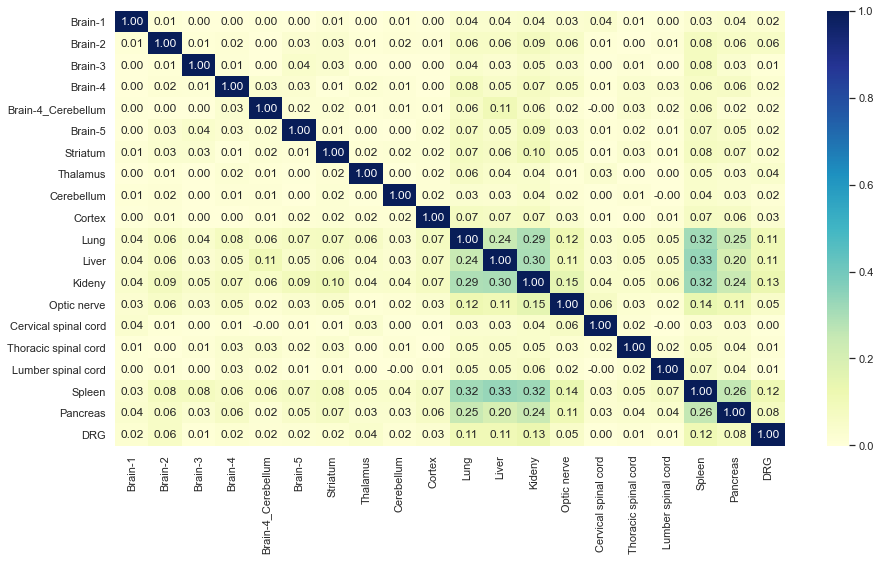

In [175]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_crep2.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

<AxesSubplot:>

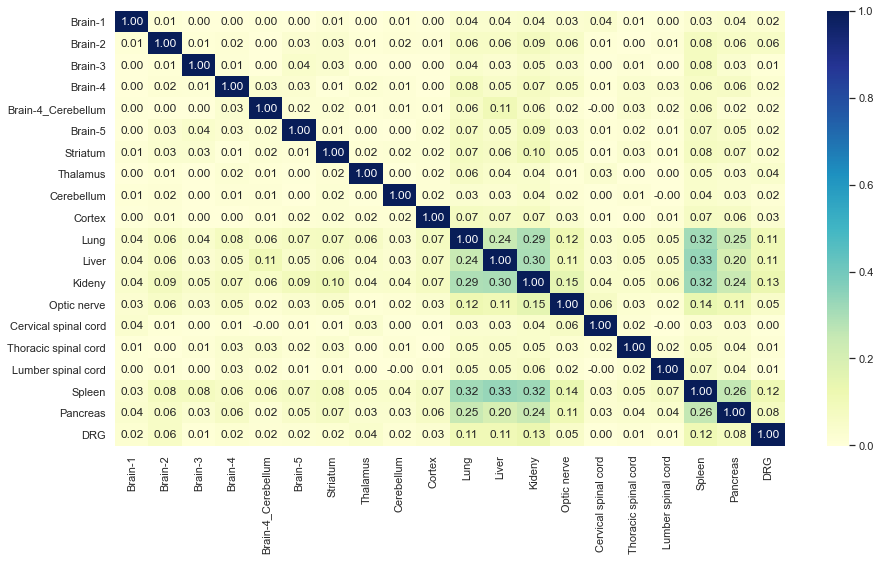

In [174]:
sns.set(rc = {'figure.figsize':(15, 8)})
sns.heatmap(df_crep2.corr(method='pearson'), cmap='YlGnBu', annot=True, fmt='.2f')

In [165]:
res=df_crep1.corrwith(df_crep2) 

In [173]:
res

Brain-1                -0.001159
Brain-2                 0.017770
Brain-3                -0.001453
Brain-4                -0.001530
Brain-4_Cerebellum      0.003751
Brain-5                 0.022411
Striatum                0.018993
Thalamus               -0.001149
Cerebellum              0.001951
Cortex                  0.004357
Lung                    0.108489
Liver                   0.263428
Kideny                  0.092379
Optic nerve             0.023602
Cervical spinal cord    0.003276
Thoracic spinal cord    0.000517
Lumber spinal cord     -0.002404
Spleen                  0.146095
Pancreas                0.099919
DRG                     0.010217
dtype: float64

<AxesSubplot:>

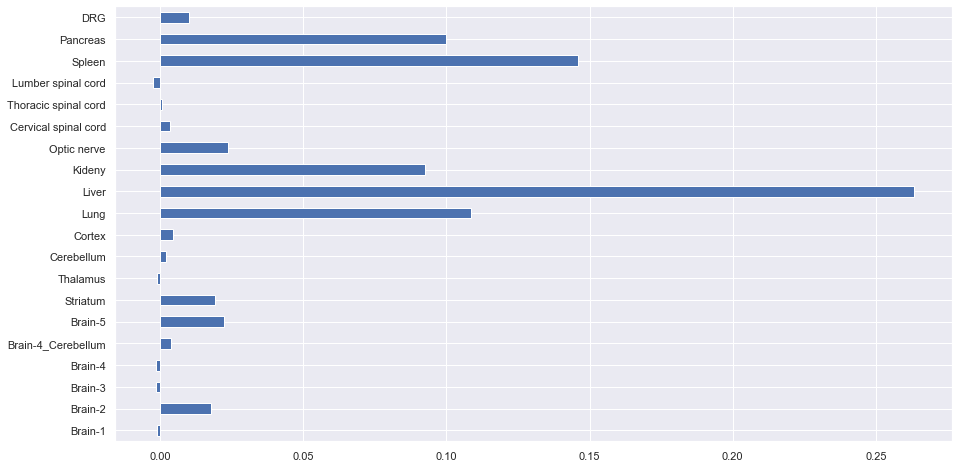

In [171]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
res.plot.barh()

# アミノ酸配列で再解析（20221018）

In [1]:
import os
import re
import sys
import pandas as pd
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt

In [15]:
# rename ---
file = 'A:/PROJECT/PG4699/000_DOC/PG4699_samplelist.xlsx'
df_sample = pd.read_excel(file, sheet_name='takaraID')
df_sample.head()

,Takara ID,サンプル名,組織,組織#個体,組織のグループ分け
0,PG4699_01_a,101,Brain-1,Brain-1#1,NaN
1,PG4699_02_a,102#2,Brain-2,Brain-2#1,NaN
2,PG4699_03_a,103,Brain-3,Brain-3#1,NaN
3,PG4699_04_a,104,Brain-4,Brain-4#1,NaN
4,PG4699_05_a,104c,Brain-4_Cerebellum,Brain-4_Cerebellum#1,NaN


In [16]:
takaraID = {}
sample = {}
tissue = {}
for i in range(len(df_sample)):
    tID = df_sample.loc[i, 'Takara ID']
    sNa = df_sample.loc[i, 'サンプル名']
    tNa = df_sample.loc[i, '組織#個体']
    takaraID[tID] = sNa
    sample[sNa] = tID
    tissue[tID] = tNa
print(tissue)

{'PG4699_01_a': 'Brain-1#1', 'PG4699_02_a': 'Brain-2#1', 'PG4699_03_a': 'Brain-3#1', 'PG4699_04_a': 'Brain-4#1', 'PG4699_05_a': 'Brain-4_Cerebellum#1', 'PG4699_06_a': 'Brain-5#1', 'PG4699_07_a': 'Striatum#1', 'PG4699_08_a': 'Thalamus#1', 'PG4699_09_a': 'Cerebellum#1', 'PG4699_10_a': 'Cortex#1', 'PG4699_11_a': 'Lung#1', 'PG4699_12_a': 'Liver#1', 'PG4699_13_a': 'Kidney#1', 'PG4699_14_a': 'Optic nerve#1', 'PG4699_15_a': 'Cervical spinal cord#1', 'PG4699_16_a': 'Thoracic spinal cord#1', 'PG4699_17_a': 'Lumber spinal cord#1', 'PG4699_18_a': 'Spleen#1', 'PG4699_19_a': 'Pancreas#1', 'PG4699_20_a': 'DRG#1', 'PG4699_21_a': 'Brain-1#2', 'PG4699_22_a': 'Brain-2#2', 'PG4699_23_a': 'Brain-3#2', 'PG4699_24_a': 'Brain-4#2', 'PG4699_25_a': 'Brain-4_Cerebellum#2', 'PG4699_26_a': 'Brain-5#2', 'PG4699_27_a': 'Striatum#2', 'PG4699_28_a': 'Thalamus#2', 'PG4699_29_a': 'Cerebellum#2', 'PG4699_30_a': 'Cortex#2', 'PG4699_31_a': 'Heart#2', 'PG4699_32_a': 'Lung#2', 'PG4699_33_a': 'Liver#2', 'PG4699_34_a': 'Kidne

In [18]:
# intialization 
insert_cnt = 'A:/PROJECT/PG4699/200_INFO/02_cnt/*a.txt'
insert_cnts = sorted(glob.glob(insert_cnt))
uniq_seq = {}
sample_list = []
for i in range(len(insert_cnts)):
    #sample_id = re.compile(f'02_cnt\/(.*)\.txt').search(insert_cnts[i]).group(1)
    #sample_list.append(sample_id)
    with open(insert_cnts[i], 'r') as wf:
        for line in wf.readlines():
            line = line.rstrip('\n')
            tmp = line.split()
            uniq_seq[tmp[1]] = '-'

# reverse complementary
#revComp = pd.DataFrame()
#for seq in sorted(uniq_seq.keys()):
#    seq = seq[::-1]
#    seq = seq.translate(seq.maketrans('ATGC', 'TACG'))
#    revComp.append(seq)

# アミノ酸に翻訳 -------------------------------------------------------------------------------------
codon = {
    'TTT': 'F', 'TTC': 'F', 'TTA': 'L', 'TTG': 'L', 'CTT': 'L', 'CTC': 'L', 'CTA': 'L', 'CTG': 'L',
    'ATT': 'I', 'ATC': 'I', 'ATA': 'I', 'ATG': 'M', 'GTT': 'V', 'GTC': 'V', 'GTA': 'V', 'GTG': 'V',
    'TCT': 'S', 'TCC': 'S', 'TCA': 'S', 'TCG': 'S', 'CCT': 'P', 'CCC': 'P', 'CCA': 'P', 'CCG': 'P',
    'ACT': 'T', 'ACC': 'T', 'ACA': 'T', 'ACG': 'T', 'GCT': 'A', 'GCC': 'A', 'GCA': 'A', 'GCG': 'A',
    'TAT': 'Y', 'TAC': 'Y', 'TAA': '*', 'TAG': '*', 'CAT': 'H', 'CAC': 'H', 'CAA': 'Q', 'CAG': 'Q',
    'AAT': 'N', 'AAC': 'N', 'AAA': 'K', 'AAG': 'K', 'GAT': 'D', 'GAC': 'D', 'GAA': 'E', 'GAG': 'E',
    'TGT': 'C', 'TGC': 'C', 'TGA': '*', 'TGG': 'W', 'CGT': 'R', 'CGC': 'R', 'CGA': 'R', 'CGG': 'R',
    'AGT': 'S', 'AGC': 'S', 'AGA': 'R', 'AGG': 'R', 'GGT': 'G', 'GGC': 'G', 'GGA': 'G', 'GGG': 'G' 
}

translation = []
for seq in sorted(uniq_seq.keys()):
    aa = []
    for i in range(0, int(len(seq)/3)):
        triple = seq[3*i:3*i+3]
        if codon.get(triple):
            cdn = codon[triple]
        else:
            cdn = '-'
        aa.append(cdn)
    aa_seq = ''.join(aa)
    translation.append(aa_seq)

aa_seq = pd.Series(translation)

cols =  ['Header_ID', 'Sequence', 'AA_seq']
seq_ID = pd.Series(['Seq_'+ str(i + 1) for i in range(len(uniq_seq))]) 
insert_seq = pd.Series([seq for seq in sorted(uniq_seq.keys())])
cnt_index = pd.concat([seq_ID, insert_seq, aa_seq], axis=1)
cnt_index.set_axis(cols, axis='columns', inplace=True)

In [19]:
cnt_index.head()

,Header_ID,Sequence,AA_seq
0,Seq_1,AAAAAAAAAAAAAAAAAAAAAAAAAAA,KKKKKKKKK
1,Seq_2,AAAAAAAAAAAAAAAAAAAAAAAAACA,KKKKKKKKT
2,Seq_3,AAAAAAAAAAAAAAAAAAAAAAACAAC,KKKKKKKNN
3,Seq_4,AAAAAAAAAAAAAAAAAAAAAACAAAA,KKKKKKKTK
4,Seq_5,AAAAAAAAAAAAAAAAAAAAAACTGTT,KKKKKKKTV


In [20]:
# join count value data 
for i in range(len(insert_cnts)):
    fname = os.path.basename(insert_cnts[i])
    sample_id = os.path.splitext(fname)[0]
    df = pd.read_csv(insert_cnts[i], header=None, delim_whitespace=True)
    df.columns = [f'{sample_id}_Count', 'Sequence']
    df_mod = df.loc[:, ['Sequence', f'{sample_id}_Count']]
    if i == 0:
        df_new = pd.merge(cnt_index, df_mod, how='left', on='Sequence')
    else:
        df_new = pd.merge(df_new, df_mod, how='left', on='Sequence')
df_cnt = df_new.fillna(0)
# output txt
outfile = 'A:/PROJECT/PG4699/200_INFO/02_cnt/PG4699_all_count_summary.txt'
df_cnt.to_csv(outfile, sep='\t', index=False)

MemoryError: Unable to allocate 3.53 GiB for an array with shape (44, 10752888) and data type float64

In [21]:
# filetering

motif = '(.+)GGG(.+)TGGGAG(.+)'
infile = 'A:/PROJECT/PG4699/200_INFO/02_cnt/PG4699_all_count_summary.txt'
outfile = 'A:/PROJECT/PG4699/200_INFO/02_cnt/PG4699_target_count_summary.txt'

#PG4699_01_a_Count

with open(outfile, 'w') as wf:
    with open(infile, 'r') as rf:
        for line in rf.readlines():
            line = line.rstrip('\n')
            tmp = line.split()
            if 'Header_ID' in tmp[0]:
                header = []
                for name in tmp:
                    if 'Count' in name:
                        ID = re.compile(r'(.*)_Count').search(name).group(1)
                        col_name = tissue[ID] + '_Count'
                        header.append(col_name)
                    else:
                        header.append(name)
                line = '\t'.join(header)
                wf.write(f'{line}\n')
            else:
                target = tmp[1]
                c1 = target[9:12]
                c2 = target[18:21]
                if (c1 == 'GGG') & (c2 == 'TGG'):
                    wf.write(f'{line}\n')

In [ ]:
file = 'A:/PROJECT/PG4699/200_INFO/02_cnt/PG4699_target_count_summary.txt'
count_table = pd.read_csv(file, sep='\t')

amino_acid = count_table.groupby('AA_seq')['Header_ID'].agg(','.join).reset_index()
count_aa = count_table.groupby('AA_seq').agg(sum).reset_index()
aa_merge = pd.merge(amino_acid, count_aa, how='left', on='AA_seq').reset_index(drop=True)
seq_ID = pd.DataFrame(['AA_seq_'+ str(i + 1) for i in range(len(aa_merge))], columns=['AA_seq_ID'])
aa_summary = pd.concat([seq_ID, aa_merge], axis=1).reset_index(drop=True)

outfile = '/NGSWORK/PROJECT/PG4699/200_INFO/02_cnt/PG4699_target_aa_count_summary.txt'
aa_summary.to_csv(outfile, sep='\t', index=False)

## カウント値算出（20221018）

In [2]:
#各サンプルで投与前と後を対応させるために、投与前で少なくとも1個存在する配列を対象にリストとしてまとまる。
file = 'A:/PROJECT/PG4699/200_INFO/02_cnt/PG4699_target_aa_count_summary.txt'
count_table = pd.read_csv(file, sep='\t')

In [3]:
# 個体1の配列カウントリスト(投与前で少なくとも1個存在する配列を対象)
rep1_a = count_table.loc[:, :'DRG#1_Count']
rep1_b = count_table.loc[:, 'AAV Library#1_Count']
rep1_cnt = pd.concat([rep1_a, rep1_b], axis=1)
print(rep1_cnt.shape) # fileteting前
rep1_count_table = rep1_cnt[rep1_cnt['AAV Library#1_Count'] != 0].reset_index(drop=True)
print(rep1_count_table.shape) # filtering後
rep1_count_table.head()

(7387877, 24)
(553615, 24)


,AA_seq_ID,AA_seq,Header_ID,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Liver#1_Count,Kidney#1_Count,Optic nerve#1_Count,Cervical spinal cord#1_Count,Thoracic spinal cord#1_Count,Lumber spinal cord#1_Count,Spleen#1_Count,Pancreas#1_Count,DRG#1_Count,AAV Library#1_Count
0,AA_seq_14,***GSHWNF,Seq_9383431,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,AA_seq_55,**AGKSWSQ,Seq_9383241,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,AA_seq_128,**DGETWAT,Seq_9383173,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,AA_seq_140,**DGMQWAL,Seq_9383163,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,AA_seq_144,**DGNQWQN,Seq_9383141,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [4]:
# 個体2の配列カウントリスト(投与前で少なくとも1個存在する配列を対象)
rep2_info = count_table.loc[:, 'AA_seq_ID':'Header_ID']
rep2_tar = count_table.loc[:, 'Brain-1#2_Count':'DRG#2_Count']
rep2_a = pd.concat([rep2_info, rep2_tar], axis=1)
rep2_b = count_table.loc[:, 'AAV Library#2_Count']
rep2_cnt = pd.concat([rep2_a, rep2_b], axis=1)
print(rep2_cnt.shape) # fileteting前
rep2_count_table = rep2_cnt[rep2_cnt['AAV Library#2_Count'] != 0].reset_index(drop=True)
print(rep2_count_table.shape) # filtering後
rep2_count_table.head()

(7387877, 26)
(480090, 26)


,AA_seq_ID,AA_seq,Header_ID,Brain-1#2_Count,Brain-2#2_Count,Brain-3#2_Count,Brain-4#2_Count,Brain-4_Cerebellum#2_Count,Brain-5#2_Count,Striatum#2_Count,...,Kidney#2_Count,Optic nerve#2_Count,Cervical spinal cord#2_Count,Thoracic spinal cord#2_Count,Lumber spinal cord#2_Count,Spleen#2_Count,Pancreas#2_Count,Muscle#2_Count,DRG#2_Count,AAV Library#2_Count
0,AA_seq_10,***GNTWYR,Seq_9383425,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
1,AA_seq_41,**AGFNWDK,Seq_9383286,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,AA_seq_62,**AGLYWDL,Seq_9383285,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,AA_seq_198,**EGNKWGR,Seq_9383095,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,AA_seq_252,**GGDWWFW,Seq_9383333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [5]:
# rep1_freqの算出
for i in rep1_count_table.columns[3:].to_list():
    name = re.compile(r'(.*)_Count').search(i).group(1)
    freq = name + "_Freq"
    rep1_count_table[freq] = rep1_count_table[i] / rep1_count_table[i].sum()
print(rep1_count_table.shape)
rep1_count_table.head()

(553615, 45)


,AA_seq_ID,AA_seq,Header_ID,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Liver#1_Freq,Kidney#1_Freq,Optic nerve#1_Freq,Cervical spinal cord#1_Freq,Thoracic spinal cord#1_Freq,Lumber spinal cord#1_Freq,Spleen#1_Freq,Pancreas#1_Freq,DRG#1_Freq,AAV Library#1_Freq
0,AA_seq_14,***GSHWNF,Seq_9383431,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.686275e-07
1,AA_seq_55,**AGKSWSQ,Seq_9383241,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.686275e-07
2,AA_seq_128,**DGETWAT,Seq_9383173,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.686275e-07
3,AA_seq_140,**DGMQWAL,Seq_9383163,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.686275e-07
4,AA_seq_144,**DGNQWQN,Seq_9383141,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.686275e-07


In [6]:
# rep2_freqの算出
for i in rep2_count_table.columns[3:].to_list():
    name = re.compile(r'(.*)_Count').search(i).group(1)
    freq = name + "_Freq"
    rep2_count_table[freq] = rep2_count_table[i] / rep2_count_table[i].sum()
print(rep2_count_table.shape)
rep2_count_table.head()

(480090, 49)


,AA_seq_ID,AA_seq,Header_ID,Brain-1#2_Count,Brain-2#2_Count,Brain-3#2_Count,Brain-4#2_Count,Brain-4_Cerebellum#2_Count,Brain-5#2_Count,Striatum#2_Count,...,Kidney#2_Freq,Optic nerve#2_Freq,Cervical spinal cord#2_Freq,Thoracic spinal cord#2_Freq,Lumber spinal cord#2_Freq,Spleen#2_Freq,Pancreas#2_Freq,Muscle#2_Freq,DRG#2_Freq,AAV Library#2_Freq
0,AA_seq_10,***GNTWYR,Seq_9383425,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.587216e-07
1,AA_seq_41,**AGFNWDK,Seq_9383286,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.793608e-07
2,AA_seq_62,**AGLYWDL,Seq_9383285,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.793608e-07
3,AA_seq_198,**EGNKWGR,Seq_9383095,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.793608e-07
4,AA_seq_252,**GGDWWFW,Seq_9383333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.793608e-07


## FDR（20221018）

In [7]:
# 2群の比率の検定（両側検定）-> Bonfferroni法でFDR算出 ------------------
import re
import sys
import pandas as pd
import numpy as np
import statsmodels.stats.multitest as multi
from statsmodels.stats.proportion import proportions_ztest
import scipy.stats as st

# カイ2乗分布による比率の差の検定(イェーツの補正あり) ---
# フィッシャーの正確確率検定では、
# サンプルサイズが増加するとp値の算出に時間がかかる
def chi2_to_fdr(x1, x2):
    x1_total = x1.sum()
    x2_total = x2.sum()
    pval = []
    for i in range(len(x1)):
        if (x1[i] == 0) | (x2[i] == 0):
            pval.append(1)
        else:
            x1u = x1_total - x1[i]
            x2u = x2_total - x2[i]
            _, p, _, _ = st.chi2_contingency(
                np.array([[x1[i], x2[i]], [x1u, x2u]]),
                correction=True
            )
            pval.append(p)
    
    fdr = multi.multipletests(
        pval,
        alpha=0.05,
        method='bonferroni'
    )
    x1x2_fdr = fdr[1]

    return x1x2_fdr

In [8]:
# FCとFDRを算出
before_1 = 'AAV Library#1_Count'
before_2 = 'AAV Library#2_Count'

for i, name in enumerate(count_table.columns[3:count_table.shape[1]-2].to_list()):
    a = re.compile(r'(.*)_Count').search(name).group(1)
    name_freq = name
    if i < 20:
        print(f'{name_freq} vs {before_1}')
        after = rep1_count_table[name_freq]
        before = rep1_count_table[before_1]
        #before_mod = freq_df[before_1].replace(0, sys.maxsize) # nan防止
        FC_name =  a + '_FC'
        FDR_name = a + '_FDR'
        print(f'{FC_name}')
        print(f'{FDR_name}')
        rep1_count_table[FC_name] = after / before
        rep1_count_table[FDR_name] = chi2_to_fdr(before, after)
    else:
        print(f'{name_freq} vs {before_2}')
        after = rep2_count_table[name_freq]
        before = rep2_count_table[before_2]
        #before_mod = freq_df[before_2].replace(0, sys.maxsize) # nan防止
        FC_name =  a + '_FC'
        FDR_name = a + '_FDR'
        print(f'{FC_name}')
        print(f'{FDR_name}')
        rep2_count_table[FC_name] = after / before
        rep2_count_table[FDR_name] = chi2_to_fdr(before, after)

Brain-1#1_Count vs AAV Library#1_Count
Brain-1#1_FC
Brain-1#1_FDR
Brain-2#1_Count vs AAV Library#1_Count
Brain-2#1_FC
Brain-2#1_FDR
Brain-3#1_Count vs AAV Library#1_Count
Brain-3#1_FC
Brain-3#1_FDR
Brain-4#1_Count vs AAV Library#1_Count
Brain-4#1_FC
Brain-4#1_FDR
Brain-4_Cerebellum#1_Count vs AAV Library#1_Count
Brain-4_Cerebellum#1_FC
Brain-4_Cerebellum#1_FDR
Brain-5#1_Count vs AAV Library#1_Count
Brain-5#1_FC
Brain-5#1_FDR
Striatum#1_Count vs AAV Library#1_Count
Striatum#1_FC
Striatum#1_FDR
Thalamus#1_Count vs AAV Library#1_Count
Thalamus#1_FC
Thalamus#1_FDR
Cerebellum#1_Count vs AAV Library#1_Count
Cerebellum#1_FC
Cerebellum#1_FDR
Cortex#1_Count vs AAV Library#1_Count
Cortex#1_FC
Cortex#1_FDR
Lung#1_Count vs AAV Library#1_Count
Lung#1_FC
Lung#1_FDR
Liver#1_Count vs AAV Library#1_Count
Liver#1_FC
Liver#1_FDR
Kidney#1_Count vs AAV Library#1_Count
Kidney#1_FC
Kidney#1_FDR
Optic nerve#1_Count vs AAV Library#1_Count
Optic nerve#1_FC
Optic nerve#1_FDR
Cervical spinal cord#1_Count vs AAV L

In [9]:
rep1_count_table

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Thoracic spinal cord#1_FC,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR
0,AA_seq_14,***GSHWNF,Seq_9383431,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
1,AA_seq_55,**AGKSWSQ,Seq_9383241,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
2,AA_seq_128,**DGETWAT,Seq_9383173,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
3,AA_seq_140,**DGMQWAL,Seq_9383163,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
4,AA_seq_144,**DGNQWQN,Seq_9383141,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553610,AA_seq_7387603,YYTGRDWSG,Seq_9526210,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
553611,AA_seq_7387629,YYTGSGWSV,Seq_9526390,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
553612,AA_seq_7387632,YYTGSIWAT,Seq_9526170,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
553613,AA_seq_7387697,YYTGVDWEV,Seq_9526242,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0


In [10]:
# output xlsx
#各サンプルで投与前後を対応させるために、投与前で少なくとも1個存在する配列を対象に個体別でリストとしてまとまる。
outfile = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Consensus_frequency.xlsx'
with pd.ExcelWriter(outfile) as writer:
    rep1_count_table.to_excel(writer, sheet_name='100-131', index=False)
    rep2_count_table.to_excel(writer, sheet_name='200-231', index=False)

In [11]:
# 共通Seq
common_seq = list(set(rep1_count_table['AA_seq_ID']) & set(rep2_count_table['AA_seq_ID']))
print(len(common_seq))

212538


## Brainグループに属する全組織とコントロール検体で出現回数が10以上の配列を抽出（20221019）

In [135]:
infile = 'A:/PROJECT/PG4699/200_INFO/03_ratio/PG4699_Consensus_frequency.xlsx'
df1 = pd.read_excel(infile, sheet_name='100-131')
df2 = pd.read_excel(infile, sheet_name='200-231')

In [138]:
rep1_sel = df1[
    (df1['Brain-1#1_Count'] >= 10) & 
    (df1['Brain-2#1_Count'] >= 10) & 
    (df1['Brain-3#1_Count'] >= 10) & 
    (df1['Brain-4#1_Count'] >= 10) & 
    (df1['Brain-4_Cerebellum#1_Count'] >= 10) & 
    (df1['Brain-5#1_Count'] >= 10) &
    (df1['Striatum#1_Count'] >= 10) & 
    (df1['Thalamus#1_Count'] >= 10) &
    (df1['Cerebellum#1_Count'] >= 10) &
    (df1['Cortex#1_Count'] >= 10) &
    (df1['AAV Library#1_Count'] >= 10)
]
rep2_sel = df2[
    (df2['Brain-1#2_Count'] >= 10) & 
    (df2['Brain-2#2_Count'] >= 10) & 
    (df2['Brain-3#2_Count'] >= 10) & 
    (df2['Brain-4#2_Count'] >= 10) & 
    (df2['Brain-4_Cerebellum#2_Count'] >= 10) & 
    (df2['Brain-5#2_Count'] >= 10) &
    (df2['Striatum#2_Count'] >= 10) & 
    (df2['Thalamus#2_Count'] >= 10) &
    (df2['Cerebellum#2_Count'] >= 10) &
    (df2['Cortex#2_Count'] >= 10) &
    (df2['AAV Library#2_Count'] >= 10)
]

In [15]:
rep1_sel.head()

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Thoracic spinal cord#1_FC,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR
222,AA_seq_8383,*AVGTSWET,"Seq_9360272,Seq_9363604,Seq_9363612,Seq_936366...",53,68,74,70,78,112,81,...,4.043478,1.657831e-02,2.826087,1.000000e+00,2.913043,1.000000e+00,3.652174,0.545005,2.608696,1.000000e+00
427,AA_seq_14623,*DRGENWTR,"Seq_9353648,Seq_9356112,Seq_9356113,Seq_935636...",15,25,30,33,33,45,37,...,0.340659,2.014861e-04,0.373626,4.633475e-03,1.428571,1.000000e+00,0.373626,0.000890,0.483516,4.202414e-01
1992,AA_seq_67182,*SKGESWVR,"Seq_9385920,Seq_9385921,Seq_9386204,Seq_938620...",19,16,14,18,13,18,14,...,0.447368,1.000000e+00,0.421053,1.000000e+00,0.526316,1.000000e+00,0.578947,1.000000,0.184211,2.454078e-01
2926,AA_seq_98480,A*PGVDWSL,"Seq_7655497,Seq_7655582,Seq_7655870,Seq_765587...",22,13,26,32,27,31,13,...,3.000000,1.000000e+00,1.583333,1.000000e+00,1.833333,1.000000e+00,1.833333,1.000000,1.000000,1.000000e+00
3141,AA_seq_103690,AAAGNTWDI,"Seq_7261944,Seq_7261958,Seq_7261959,Seq_726196...",4151,2735,4437,3435,3672,2620,4069,...,1.957396,4.535953e-60,3.098817,4.942156e-297,2.592308,1.315327e-152,3.284615,0.000000,2.791124,1.516698e-208


In [139]:
print(rep1_sel.shape)
print(rep2_sel.shape)

(3244, 85)
(3068, 93)


In [142]:
common_ID = list(set(rep1_sel['AA_seq_ID']) & set(rep2_sel['AA_seq_ID']))
print(len(common_ID))

2457


In [64]:
print(rep1_sel.shape)
print(rep2_sel.shape)

(300, 23)
(238, 25)


In [140]:
common_seq = list(set(rep1_sel['AA_seq_ID']) & set(rep2_sel['AA_seq_ID']))
common_idx_rep1 = sorted([rep1_sel[rep1_sel['AA_seq_ID'] == seqID].index[0] for seqID in common_seq])
common_idx_rep2 = sorted([rep2_sel[rep2_sel['AA_seq_ID'] == seqID].index[0] for seqID in common_seq])
rep1_common = rep1_sel.loc[common_idx_rep1, :]
rep2_common = rep2_sel.loc[common_idx_rep2, :]
rep12_sel = pd.concat([rep1_common.reset_index(drop=True), rep2_common.iloc[:, 3:].reset_index(drop=True)], axis=1)
outfile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Common_Consensus_frequency.xlsx'
with pd.ExcelWriter(outfile) as writer:
    rep12_sel.to_excel(writer, sheet_name='rep12', index=False)

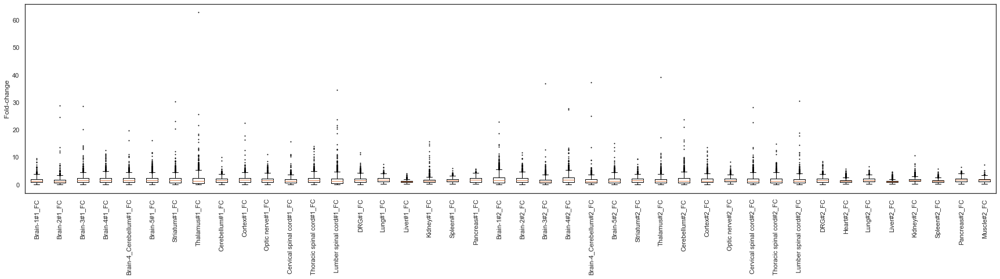

In [143]:
# FC値の変動幅 ---
rep1_columns = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC',
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC',
    'DRG#1_FC',
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Spleen#1_FC',
    'Pancreas#1_FC'
]

rep2_columns = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC',
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC',
    'DRG#2_FC',
    'Heart#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Spleen#2_FC',
    'Pancreas#2_FC',
    'Muscle#2_FC'
]

rep1_mod = rep12_sel.loc[:, rep1_columns]
rep2_mod = rep12_sel.loc[:, rep2_columns]
val1 = []
for i in range(len(rep1_mod.columns)):
    data = rep1_mod.iloc[:, i]
    val1.append(data)
val2 = []
for i in range(len(rep2_mod.columns)):
    data = rep2_mod.iloc[:, i]
    val2.append(data)

plt.figure(figsize=(30, 6))
flierprops = dict(markersize=1)
val12 = val1 + val2
label = rep1_columns + rep2_columns
plt.boxplot(val12, labels=label, flierprops=flierprops)
plt.xticks(rotation=90)
plt.ylabel('Fold-change')
plt.show()

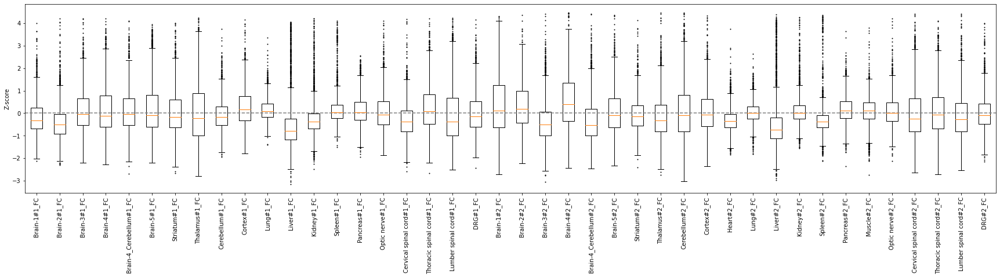

In [35]:
header = rep12_sel['AA_seq_ID']
rep1_FC = rep12_sel.loc[:, rep1_columns]
rep2_FC = rep12_sel.loc[:, rep2_columns]

z_rep1 = st.zscore(rep1_FC, axis=1, ddof=1)
z_rep2 = st.zscore(rep2_FC, axis=1, ddof=1)
z_val = pd.DataFrame(z_rep1)
z_val.columns = rep1_columns
rep1_z = pd.concat([header, z_val], axis=1)
z_val = pd.DataFrame(z_rep2)
z_val.columns = rep2_columns
rep2_z = pd.concat([header, z_val], axis=1)
# 比較対象とはならない欠損値がある行、配列は調査外とする
rep1_z_mod = rep1_z.dropna().reset_index(drop=True)
rep2_z_mod = rep2_z.dropna().reset_index(drop=True)

val1 = []
for i in range(1, len(rep1_z_mod.columns)):
    data = rep1_z_mod.iloc[:, i]
    val1.append(data)
val2 = []
for i in range(1, len(rep2_z_mod.columns)):
    data = rep2_z_mod.iloc[:, i]
    val2.append(data)
    
plt.figure(figsize=(30, 6))
flierprops = dict(markersize=1)
val12 = val1 + val2
label = rep1_columns + rep2_columns
plt.boxplot(val12, labels=label, flierprops=flierprops)
plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.axhline(y=0, color='gray', linestyle='--')
plt.show()

In [37]:
outfile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Common_Consensus_frequency_Zscore.xlsx'
with pd.ExcelWriter(outfile) as writer:
    rep1_z_mod.to_excel(writer, sheet_name='100-131', index=False)
    rep2_z_mod.to_excel(writer, sheet_name='200-231', index=False)

## 本番（20221019）Filtering

In [19]:
import seaborn as sns

In [2]:
# tissue grouping (DRG#1: 神経組織)----
infile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Common_Consensus_frequency.xlsx'
rep12 = pd.read_excel(infile, sheet_name='rep12')
headerID = rep12['AA_seq_ID']

In [3]:
rep12.head()

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Lumber spinal cord#2_FC,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR
0,AA_seq_8383,*AVGTSWET,"Seq_9360272,Seq_9363604,Seq_9363612,Seq_936366...",53,68,74,70,78,112,81,...,3.142857,1.879437e-02,2.392857,1.000000,2.821429,1.000000e+00,1.785714,1.0,2.785714,1.000000e+00
1,AA_seq_14623,*DRGENWTR,"Seq_9353648,Seq_9356112,Seq_9356113,Seq_935636...",15,25,30,33,33,45,37,...,0.377358,1.000000e+00,2.792453,0.000021,0.528302,1.000000e+00,0.452830,1.0,0.358491,1.000000e+00
2,AA_seq_103690,AAAGNTWDI,"Seq_7261944,Seq_7261958,Seq_7261959,Seq_726196...",4151,2735,4437,3435,3672,2620,4069,...,1.120042,1.000000e+00,0.850731,0.354056,1.066284,1.000000e+00,1.114301,1.0,0.728601,3.058894e-25
3,AA_seq_105617,AAAGTTWDI,"Seq_7261966,Seq_7271770,Seq_7559562,Seq_757957...",71,62,82,58,73,111,94,...,1.000000,1.000000e+00,0.709677,1.000000,0.838710,1.000000e+00,0.870968,1.0,0.677419,1.000000e+00
4,AA_seq_115540,AAIGGTWNA,"Seq_7262082,Seq_7262095,Seq_7271898,Seq_755364...",438,665,799,134,813,549,1096,...,0.459813,4.979992e-19,1.200000,1.000000,2.201869,2.689509e-25,1.420561,1.0,1.622430,2.435511e-07


In [145]:
print(rep12.shape)

(2457, 175)


In [4]:
print(rep12.shape)

(2457, 175)


In [5]:
brain_1_FC = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC'
]
nerve_1_FC = [
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC',
    'DRG#1_FC'
]
others_1_FC = [
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Pancreas#1_FC',
    'Spleen#1_FC'
]

# tissue grouping (DRG#2: 神経組織)----
brain_2_FC = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC'
]
nerve_2_FC = [
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC',
    'DRG#2_FC'
]
others_2_FC = [
    'Heart#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Pancreas#2_FC',
    'Muscle#2_FC',
    'Spleen#2_FC'
]

# FDR -----------------
brain_1_FDR = [
    'Brain-1#1_FDR',
    'Brain-2#1_FDR',
    'Brain-3#1_FDR',
    'Brain-4#1_FDR',
    'Brain-4_Cerebellum#1_FDR',
    'Brain-5#1_FDR',
    'Striatum#1_FDR',
    'Thalamus#1_FDR',
    'Cerebellum#1_FDR',
    'Cortex#1_FDR'
]
nerve_1_FDR = [
    'Optic nerve#1_FDR',
    'Cervical spinal cord#1_FDR',
    'Thoracic spinal cord#1_FDR',
    'Lumber spinal cord#1_FDR',
    'DRG#1_FDR'
]
others_1_FDR = [
    'Lung#1_FDR',
    'Liver#1_FDR',
    'Kidney#1_FDR',
    'Pancreas#1_FDR',
    'Spleen#1_FDR'
]

# tissue grouping (DRG#2: 神経組織)----
brain_2_FDR = [
    'Brain-1#2_FDR',
    'Brain-2#2_FDR',
    'Brain-3#2_FDR',
    'Brain-4#2_FDR',
    'Brain-4_Cerebellum#2_FDR',
    'Brain-5#2_FDR',
    'Striatum#2_FDR',
    'Thalamus#2_FDR',
    'Cerebellum#2_FDR',
    'Cortex#2_FDR'
]
nerve_2_FDR = [
    'Optic nerve#2_FDR',
    'Cervical spinal cord#2_FDR',
    'Thoracic spinal cord#2_FDR',
    'Lumber spinal cord#2_FDR',
    'DRG#2_FDR'
]
others_2_FDR = [
    'Heart#2_FDR',
    'Lung#2_FDR',
    'Liver#2_FDR',
    'Kidney#2_FDR',
    'Pancreas#2_FDR',
    'Muscle#2_FDR',
    'Spleen#2_FDR'
]

In [6]:
rep1_FC_list = brain_1_FC + nerve_1_FC + others_1_FC
rep1_FC = rep12.loc[:, rep1_FC_list]
rep1_FDR_list = brain_1_FDR + nerve_1_FDR + others_1_FDR
rep1_FDR = rep12.loc[:, rep1_FDR_list]
fdr1 = rep1_FDR.mask(rep1_FDR >= 0.05, 0).mask(rep1_FDR < 0.05, 1)

In [7]:
rep2_FC_list = brain_2_FC + nerve_2_FC + others_2_FC
rep2_FC = rep12.loc[:, rep2_FC_list]
rep2_FDR_list = brain_2_FDR + nerve_2_FDR + others_2_FDR
rep2_FDR = rep12.loc[:, rep2_FDR_list]
fdr2 = rep2_FDR.mask(rep2_FDR >= 0.05, 0).mask(rep2_FDR < 0.05, 1)

In [8]:
# 信頼性の高いデータを獲得するために、FDR閾値による重み付けしたFold Change値の算出（比率の問題に対応と特徴量の削減①）

init = rep12.loc[:, ['AA_seq_ID', 'AA_seq', 'Header_ID']]
for i, name in enumerate(rep1_FDR_list):
    ID = re.compile(r'(.*)_FDR').search(name).group(1)
    fc_mod = rep1_FC[f'{ID}_FC'] * fdr1[f'{ID}_FDR']
    fc_ID = rep12['AA_seq_ID']
    tmp_df = pd.concat([fc_ID, fc_mod], axis=1)
    tmp_df.columns = ['AA_seq_ID', ID]
    if i == 0:
        rep1_norm = pd.merge(init, tmp_df, how='left', on='AA_seq_ID')
    else:
        rep1_norm = pd.merge(rep1_norm, tmp_df, how='left', on='AA_seq_ID')

In [9]:
init = rep12.loc[:, ['AA_seq_ID', 'AA_seq', 'Header_ID']]
for i, name in enumerate(rep2_FDR_list):
    ID = re.compile(r'(.*)_FDR').search(name).group(1)
    fc_mod = rep2_FC[f'{ID}_FC'] * fdr2[f'{ID}_FDR']
    fc_ID = rep12['AA_seq_ID']
    tmp_df = pd.concat([fc_ID, fc_mod], axis=1)
    tmp_df.columns = ['AA_seq_ID', ID]
    if i == 0:
        rep2_norm = pd.merge(init, tmp_df, how='left', on='AA_seq_ID')
    else:
        rep2_norm = pd.merge(rep2_norm, tmp_df, how='left', on='AA_seq_ID')

In [10]:
rep2_norm

,AA_seq_ID,AA_seq,Header_ID,Brain-1#2,Brain-2#2,Brain-3#2,Brain-4#2,Brain-4_Cerebellum#2,Brain-5#2,Striatum#2,...,Thoracic spinal cord#2,Lumber spinal cord#2,DRG#2,Heart#2,Lung#2,Liver#2,Kidney#2,Pancreas#2,Muscle#2,Spleen#2
0,AA_seq_8383,*AVGTSWET,"Seq_9360272,Seq_9363604,Seq_9363612,Seq_936366...",0.000000,3.714286,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,3.142857,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,AA_seq_14623,*DRGENWTR,"Seq_9353648,Seq_9356112,Seq_9356113,Seq_935636...",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.792453
2,AA_seq_103690,AAAGNTWDI,"Seq_7261944,Seq_7261958,Seq_7261959,Seq_726196...",0.537578,0.687891,1.192589,0.668580,0.000000,0.530793,0.000000,...,0.000000,0.000000,0.728601,0.000000,0.852296,0.420668,1.533403,0.000000,0.000000,0.000000
3,AA_seq_105617,AAAGTTWDI,"Seq_7261966,Seq_7271770,Seq_7559562,Seq_757957...",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,AA_seq_115540,AAIGGTWNA,"Seq_7262082,Seq_7262095,Seq_7271898,Seq_755364...",0.000000,0.586916,0.585047,0.558879,2.100935,2.306542,0.000000,...,0.000000,0.459813,1.622430,0.000000,0.000000,0.000000,0.000000,2.201869,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2452,AA_seq_7353753,YSGGQDWAA,"Seq_9528227,Seq_9532342,Seq_9532343,Seq_953251...",2.263158,3.481781,0.283401,4.518219,2.360324,0.000000,2.587045,...,4.218623,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.550607,1.995951,0.000000
2453,AA_seq_7357223,YSNGNGWSE,"Seq_9292687,Seq_9434816,Seq_9434874,Seq_943487...",3.756701,2.212371,0.049485,0.682474,0.000000,0.057732,0.000000,...,0.253608,0.000000,1.849485,1.253608,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2454,AA_seq_7375288,YTTGENWAK,"Seq_9292628,Seq_9416545,Seq_9416561,Seq_941656...",1.585484,0.000000,0.335484,0.583871,1.230645,1.752419,0.000000,...,0.878226,0.000000,0.868548,0.000000,0.000000,0.000000,0.000000,1.607258,0.000000,0.000000
2455,AA_seq_7381199,YVNGTSWSQ,"Seq_9293889,Seq_9515060,Seq_9515098,Seq_951518...",2.075000,0.342857,0.000000,0.000000,0.000000,1.575000,0.000000,...,2.357143,0.205357,0.000000,0.000000,0.726786,0.508929,0.794643,0.000000,0.000000,0.605357


In [124]:
brain_1 = [
    'Brain-1#1',
    'Brain-2#1',
    'Brain-3#1',
    'Brain-4#1',
    'Brain-4_Cerebellum#1',
    'Brain-5#1',
    'Striatum#1',
    'Thalamus#1',
    'Cerebellum#1',
    'Cortex#1'
]
"""
nerve_1 = [
    'Optic nerve#1',
    'Cervical spinal cord#1',
    'Thoracic spinal cord#1',
    'Lumber spinal cord#1',
    'DRG#1'
]
others_1 = [
    'Lung#1',
    'Liver#1',
    'Kidney#1',
    'Pancreas#1',
    'Spleen#1'
]
"""
nerve_1 = [
    'Optic nerve#1',
    'Cervical spinal cord#1',
    'Thoracic spinal cord#1',
    'Lumber spinal cord#1'
]
others_1 = [
    'Lung#1',
    'Liver#1',
    'Kidney#1',
    'Pancreas#1',
    'Spleen#1',
    'DRG#1'
]

# tissue grouping (DRG#2: 神経組織)----
brain_2 = [
    'Brain-1#2',
    'Brain-2#2',
    'Brain-3#2',
    'Brain-4#2',
    'Brain-4_Cerebellum#2',
    'Brain-5#2',
    'Striatum#2',
    'Thalamus#2',
    'Cerebellum#2',
    'Cortex#2'
]
""""
nerve_2 = [
    'Optic nerve#2',
    'Cervical spinal cord#2',
    'Thoracic spinal cord#2',
    'Lumber spinal cord#2',
    'DRG#2'
]
others_2 = [
    'Heart#2',
    'Lung#2',
    'Liver#2',
    'Kidney#2',
    'Pancreas#2',
    'Muscle#2',
    'Spleen#2'
]
"""
nerve_2 = [
    'Optic nerve#2',
    'Cervical spinal cord#2',
    'Thoracic spinal cord#2',
    'Lumber spinal cord#2'
]
others_2 = [
    'Heart#2',
    'Lung#2',
    'Liver#2',
    'Kidney#2',
    'Pancreas#2',
    'Muscle#2',
    'Spleen#2',
    'DRG#2'
]

In [12]:
rep1_norm.head()

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1,Brain-2#1,Brain-3#1,Brain-4#1,Brain-4_Cerebellum#1,Brain-5#1,Striatum#1,...,Optic nerve#1,Cervical spinal cord#1,Thoracic spinal cord#1,Lumber spinal cord#1,DRG#1,Lung#1,Liver#1,Kidney#1,Pancreas#1,Spleen#1
0,AA_seq_8383,*AVGTSWET,"Seq_9360272,Seq_9363604,Seq_9363612,Seq_936366...",0.000000,2.956522,0.000000,0.000000,0.000000,4.869565,0.000000,...,4.695652,6.869565,4.043478,0.000000,0.000000,4.043478,0.0,0.000000,0.000000,0.000000
1,AA_seq_14623,*DRGENWTR,"Seq_9353648,Seq_9356112,Seq_9356113,Seq_935636...",0.164835,0.000000,0.329670,0.362637,0.362637,0.000000,0.000000,...,0.351648,0.000000,0.340659,0.373626,0.000000,0.000000,0.0,0.362637,0.373626,0.000000
2,AA_seq_103690,AAAGNTWDI,"Seq_7261944,Seq_7261958,Seq_7261959,Seq_726196...",2.456213,1.618343,2.625444,2.032544,2.172781,1.550296,2.407692,...,2.342012,2.020118,1.957396,3.098817,2.791124,3.156805,0.0,1.691716,3.284615,2.592308
3,AA_seq_105617,AAAGTTWDI,"Seq_7261966,Seq_7271770,Seq_7559562,Seq_757957...",0.000000,0.000000,0.000000,0.000000,0.000000,4.625000,3.916667,...,4.625000,3.583333,0.000000,3.791667,4.250000,4.166667,0.0,0.000000,0.000000,0.000000
4,AA_seq_115540,AAIGGTWNA,"Seq_7262082,Seq_7262095,Seq_7271898,Seq_755364...",0.000000,0.000000,0.000000,0.231834,0.000000,0.000000,1.896194,...,2.110727,1.214533,0.000000,0.000000,1.899654,1.685121,0.0,0.000000,2.766436,0.000000


In [125]:
# 組織グループの重み付き平均（特徴量を削減した情報量を反映）
def weight_mean(x):
    if x.sum() == 0:
        m = 0
    else:
        w = x / x.sum()
        v = (w * x).sum()
        w_total = round(w.sum())
        m = v / w_total
    return m 

In [126]:
weight_mean(rep1_norm.loc[0, brain_1])

4.17155862501962

In [581]:
v

4.17155862501962

In [127]:
group_1 = pd.DataFrame()
for i in range(len(rep1_norm)):
    #b = rep1_norm.loc[i, brain_1].mean()
    #n = rep1_norm.loc[i, nerve_1].mean()
    #o = rep1_norm.loc[i, others_1].mean()
    b = weight_mean(rep1_norm.loc[i, brain_1])
    n = weight_mean(rep1_norm.loc[i, nerve_1])
    o = weight_mean(rep1_norm.loc[i, others_1])
    col = pd.Series([b, n, o])
    group_1 = group_1.append(col, ignore_index=True)
group_1.columns = ['Brain#1', 'Nerve#1', 'Others#1']
rep1_group = pd.concat([headerID, group_1], axis=1)

In [128]:
# weighted mean ---
rep1_group.head()

,AA_seq_ID,Brain#1,Nerve#1,Others#1
0,AA_seq_8383,4.171559,5.483469,4.043478
1,AA_seq_14623,0.322606,0.355840,0.368214
2,AA_seq_103690,2.198978,2.442039,2.820720
3,AA_seq_105617,4.280556,4.050637,4.208746
4,AA_seq_115540,1.758624,1.783397,2.220283


In [17]:
# 大域的なフィルタリング（特徴量の削減②）
# brainグループ特異的に2倍以上有意に上昇する場合を考える
#group_1_sel = rep1_group[(rep1_group['Brain#1'] > 2) & (rep1_group['Others#1'] < 1) & (rep1_group['Nerve#1'] < 1)]
# (143, 4)
# DRG -> Nerve
group_1_sel = rep1_group[(rep1_group['Brain#1'] > 2) & (rep1_group['Others#1'] < 1)]
group_1_sel.shape

(300, 4)

In [129]:
# 大域的なフィルタリング（特徴量の削減②）
# brainグループ特異的に2倍以上有意に上昇する場合を考える
#group_1_sel = rep1_group[(rep1_group['Brain#1'] > 2) & (rep1_group['Others#1'] < 1) & (rep1_group['Nerve#1'] < 1)]
# (143, 4)
# DRG -> Others
group_1_sel = rep1_group[(rep1_group['Brain#1'] > 2) & (rep1_group['Others#1'] < 1)]
group_1_sel.shape

(265, 4)

<AxesSubplot:>

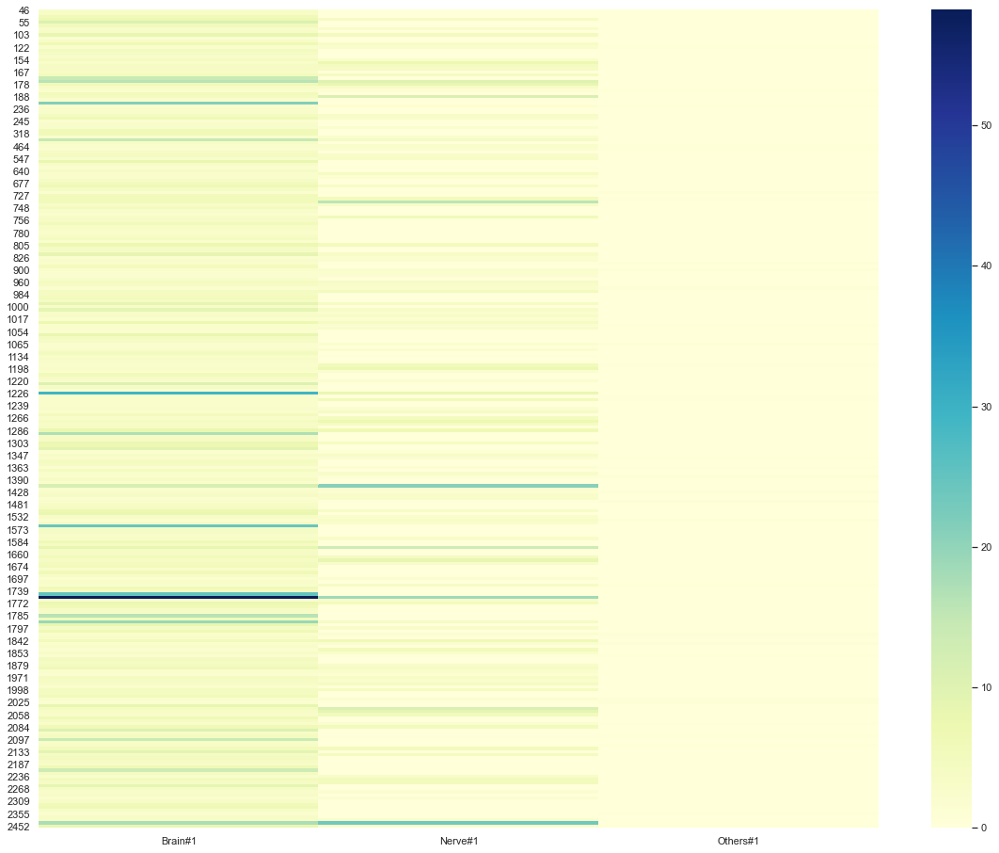

In [133]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(group_1_sel.iloc[:, 1:], cmap='YlGnBu')

In [131]:
group_2 = pd.DataFrame()
for i in range(len(rep2_norm)):
    #b = rep2_norm.loc[i, brain_2].mean()
    #n = rep2_norm.loc[i, nerve_2].mean()
    #o = rep2_norm.loc[i, others_2].mean()
    b = weight_mean(rep2_norm.loc[i, brain_2])
    n = weight_mean(rep2_norm.loc[i, nerve_2])
    o = weight_mean(rep2_norm.loc[i, others_2])
    col = pd.Series([b, n, o])
    group_2 = group_2.append(col, ignore_index=True)
group_2.columns = ['Brain#2', 'Nerve#2', 'Others#2']
rep2_group = pd.concat([headerID, group_2], axis=1)

In [22]:
# normal mean ---
rep2_group

,AA_seq_ID,Brain#2,Nerve#2,Others#2
0,AA_seq_8383,3.862434,3.142857,0.000000
1,AA_seq_14623,0.000000,0.000000,2.792453
2,AA_seq_103690,0.754801,1.141564,1.159754
3,AA_seq_105617,0.000000,0.000000,0.000000
4,AA_seq_115540,1.774617,2.402698,2.201869
...,...,...,...,...
2452,AA_seq_7353753,3.077722,3.560932,2.307112
2453,AA_seq_7357223,2.513087,1.922864,1.253608
2454,AA_seq_7375288,1.463985,0.873414,1.607258
2455,AA_seq_7381199,1.484273,1.810382,0.677289


In [23]:
# 大域的なフィルタリング（特徴量の削減②）
# brainグループ特異的に2倍以上有意に上昇する場合を考える
#group_2_sel = rep2_group[(rep2_group['Brain#2'] > 2) & (rep2_group['Others#2'] < 1) & (rep2_group['Nerve#2'] < 1)] 
# (122, 4)
# DRG -> Nerve
group_2_sel = rep2_group[(rep2_group['Brain#2'] > 2) & (rep2_group['Others#2'] < 1)]
group_2_sel.shape

(238, 4)

In [132]:
# 大域的なフィルタリング（特徴量の削減②）
# brainグループ特異的に2倍以上有意に上昇する場合を考える
#group_2_sel = rep2_group[(rep2_group['Brain#2'] > 2) & (rep2_group['Others#2'] < 1) & (rep2_group['Nerve#2'] < 1)] 
# (122, 4)
# DRG -> others
group_2_sel = rep2_group[(rep2_group['Brain#2'] > 2) & (rep2_group['Others#2'] < 1)]
group_2_sel.shape

(204, 4)

In [604]:
group_2_sel

,AA_seq_ID,Brain#2,Nerve#2,Others#2
12,AA_seq_142021,2.001843,0.632095,0.000000
52,AA_seq_222007,20.904762,0.000000,0.000000
57,AA_seq_224212,4.097561,0.000000,0.000000
110,AA_seq_373200,2.040998,0.000000,0.000000
125,AA_seq_413525,4.053745,0.000000,0.000000
...,...,...,...,...
2417,AA_seq_6780279,3.920000,0.000000,0.000000
2422,AA_seq_6786839,6.139130,0.000000,0.000000
2472,AA_seq_6970620,5.947368,0.000000,0.000000
2517,AA_seq_7146547,32.216226,0.000000,0.000000


<AxesSubplot:>

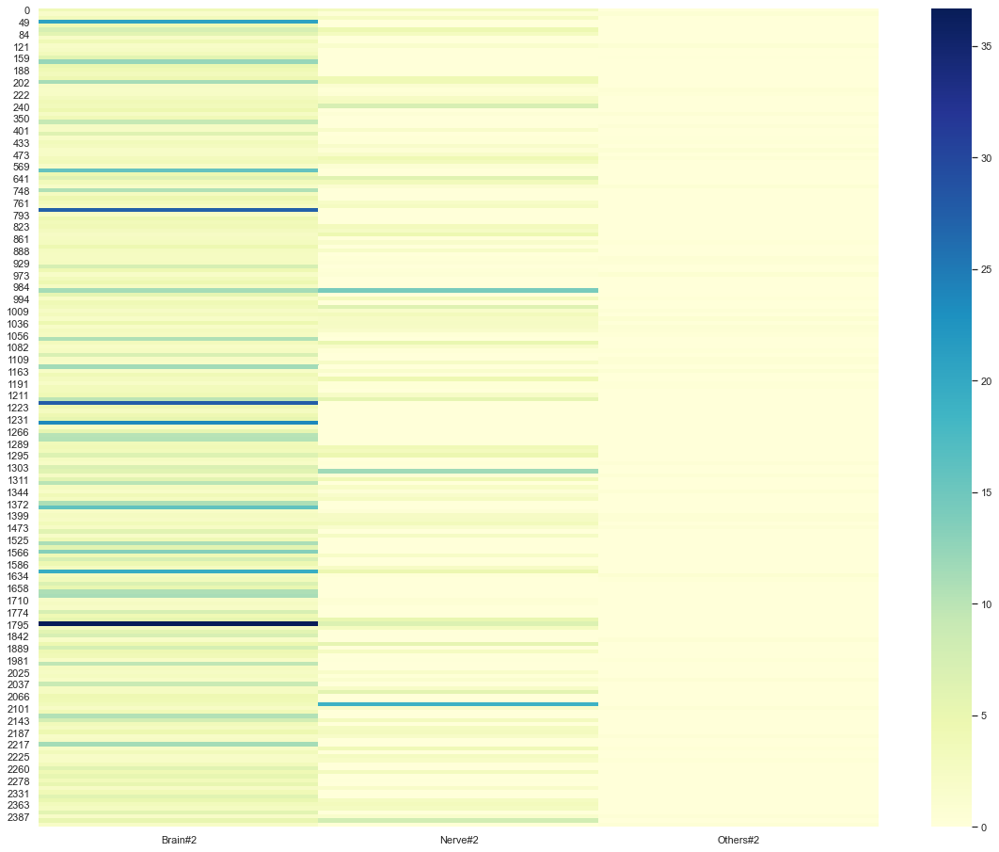

In [134]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(group_2_sel.iloc[:, 1:], cmap='YlGnBu')

In [375]:
#idx_rep1 = sorted([rep12[rep12['AA_seq_ID'] == seqID].index[0] for seqID in group_1_sel['AA_seq_ID']])
#rep1_FC_list = brain_1_FC + nerve_1_FC + others_1_FC
#rep1_FC_value = rep12.loc[idx_rep1, rep1_FC_list].reset_index(drop=True)
#rep1_FC_info = rep12.loc[idx_rep1, ['AA_seq_ID', 'AA_seq', 'Header_ID']].reset_index(drop=True)
#rep1_FC = pd.concat([rep1_FC_info, rep1_FC_value], axis=1)

#idx_rep2 = sorted([rep12[rep12['AA_seq_ID'] == seqID].index[0] for seqID in group_2_sel['AA_seq_ID']])
#rep2_FC_list = brain_2_FC + nerve_2_FC + others_2_FC
#rep2_FC_value = rep12.loc[idx_rep2, rep2_FC_list].reset_index(drop=True)
#rep2_FC_info = rep12.loc[idx_rep2, ['AA_seq_ID', 'AA_seq', 'Header_ID']].reset_index(drop=True)
#rep2_FC = pd.concat([rep2_FC_info, rep2_FC_value], axis=1)

In [163]:
rep1_norm.shape

(2457, 23)

In [164]:
rep2_norm.shape

(2457, 25)

In [135]:
idx_rep1 = sorted([rep1_norm[rep1_norm['AA_seq_ID'] == seqID].index[0] for seqID in group_1_sel['AA_seq_ID']])
rep1_sel = rep1_norm.loc[idx_rep1, :].reset_index(drop=True)

idx_rep2 = sorted([rep2_norm[rep2_norm['AA_seq_ID'] == seqID].index[0] for seqID in group_2_sel['AA_seq_ID']])
rep2_sel = rep2_norm.loc[idx_rep2, :].reset_index(drop=True)

<AxesSubplot:>

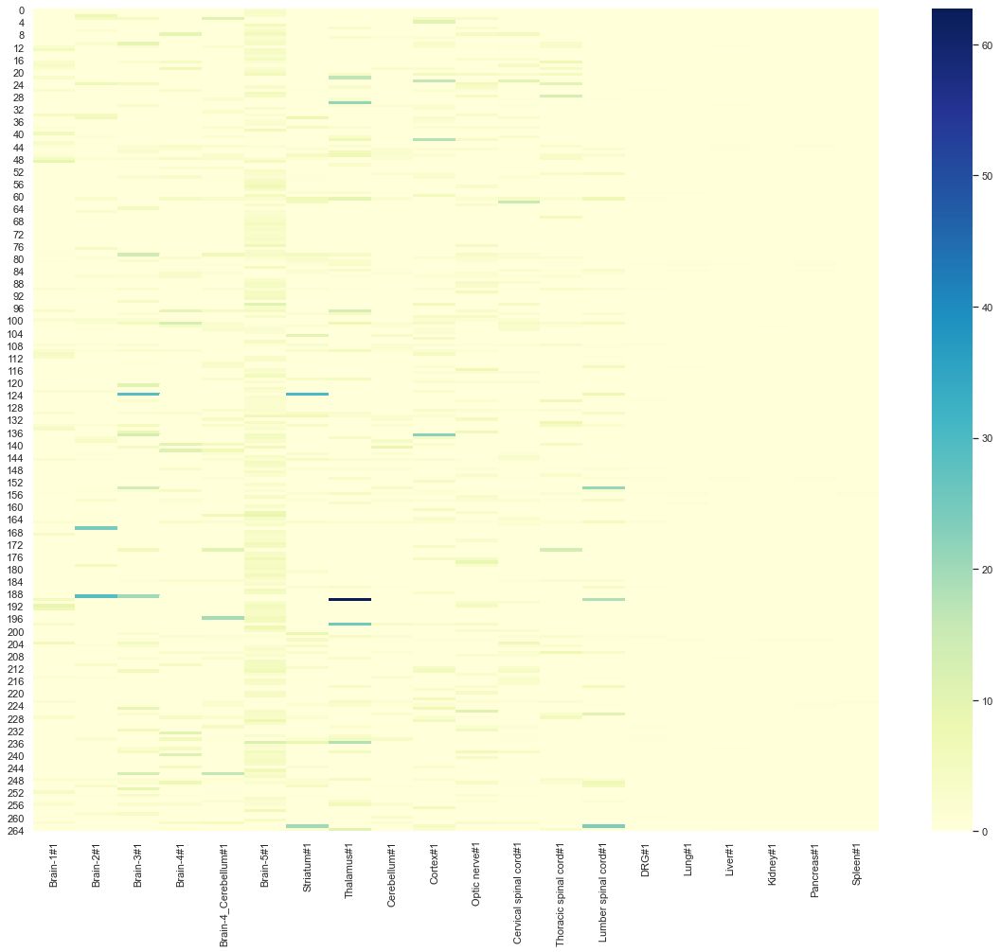

In [136]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_sel.iloc[:, 3:], cmap='YlGnBu')

<AxesSubplot:>

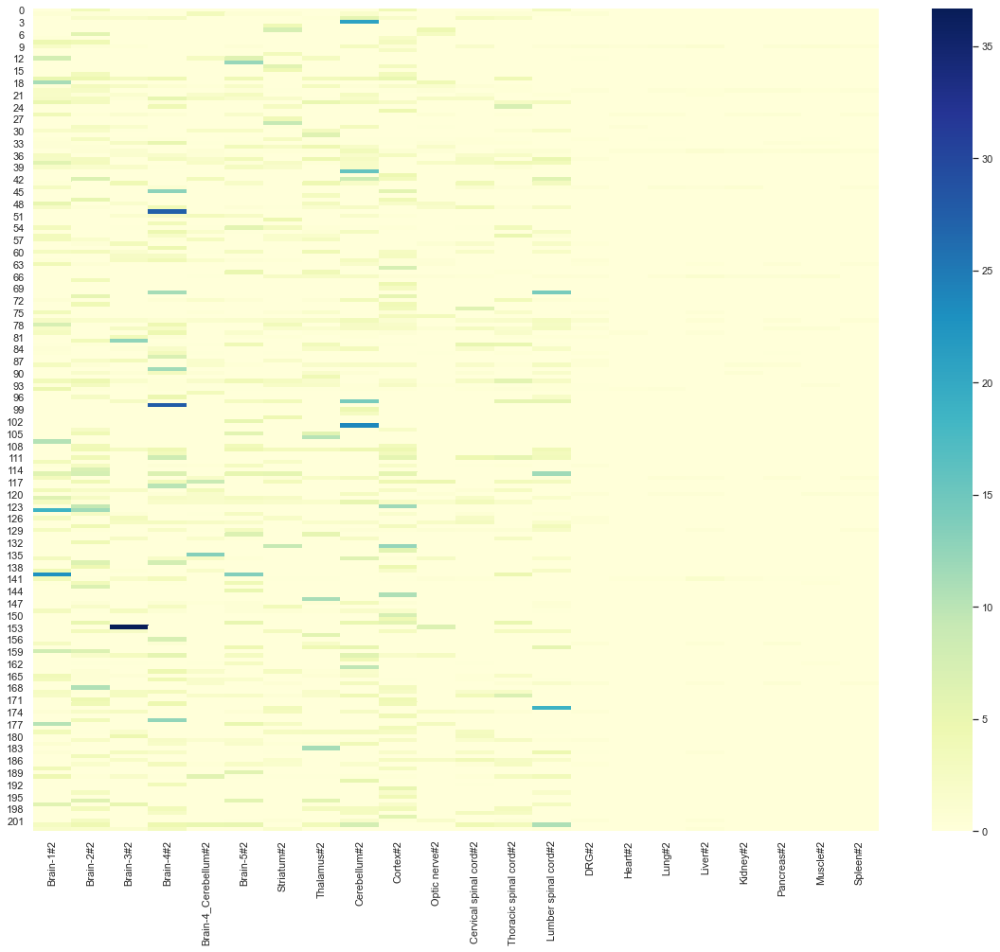

In [137]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_sel.iloc[:, 3:], cmap='YlGnBu')

In [260]:
#header1 = rep1_FC['AA_seq_ID']
#rep1_FC_v = rep1_FC.iloc[:, 3:]

#header2 = rep2_FC['AA_seq_ID']
#rep2_FC_v = rep2_FC.iloc[:, 3:]

#z_rep1 = st.zscore(rep1_FC_v, axis=1, ddof=1)
#z_rep2 = st.zscore(rep2_FC_v, axis=1, ddof=1)
#z_val = pd.DataFrame(z_rep1)
#z_val.columns = rep1_columns
#rep1_z = pd.concat([header1, z_val], axis=1)
#z_val = pd.DataFrame(z_rep2)
#z_val.columns = rep2_columns
#rep2_z = pd.concat([header2, z_val], axis=1)
# 比較対象とはならない欠損値がある行、配列は調査外とする
#rep1_z_mod = rep1_z.dropna().reset_index(drop=True)
#rep2_z_mod = rep2_z.dropna().reset_index(drop=True)

In [261]:
#print(rep1_z_mod.shape)
#print(rep2_z_mod.shape)

(90, 21)
(73, 23)


<AxesSubplot:>

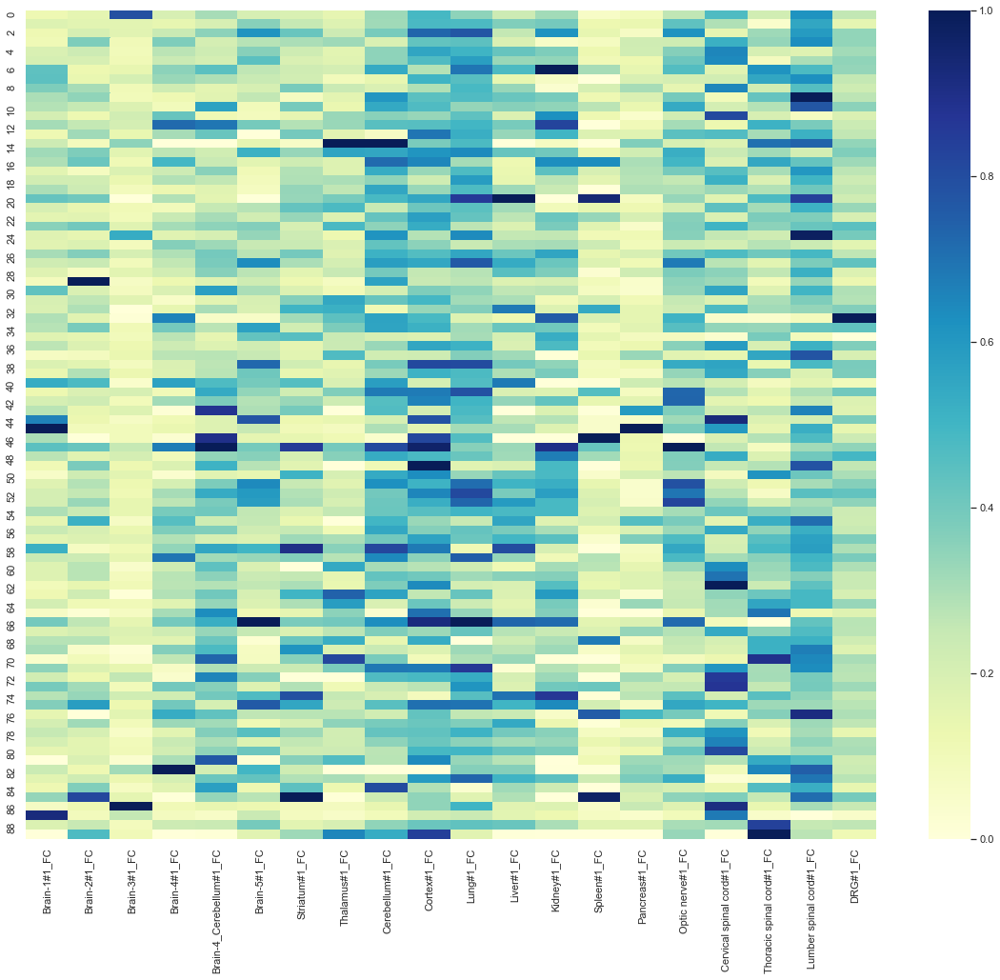

In [263]:
#sns.set(rc = {'figure.figsize':(20,16)})
#sns.heatmap(rep1_sel.iloc[:, 1:], cmap='YlGnBu')

<AxesSubplot:>

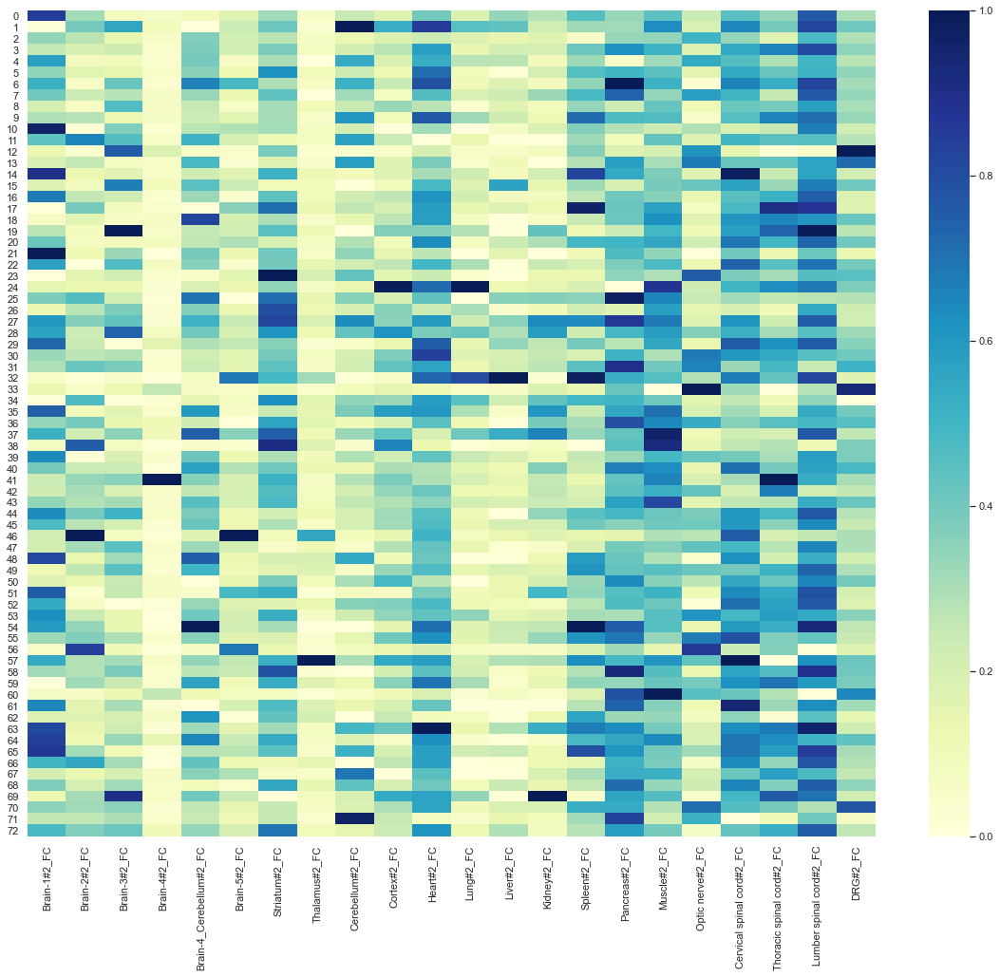

In [265]:
#sns.set(rc = {'figure.figsize':(20,16)})
#sns.heatmap(rep2_sel.iloc[:, 1:], cmap='YlGnBu')

In [618]:
# Denosingは不要
# 重み付き平均で解決
#rep1_filter = rep1_sel[
#    (rep1_sel['Optic nerve#1'] < 1) &
#    (rep1_sel['Cervical spinal cord#1'] < 1) &
#    (rep1_sel['Thoracic spinal cord#1'] < 1) &
#    (rep1_sel['Lumber spinal cord#1'] < 1) &
#    (rep1_sel['Lung#1'] < 1) &
#    (rep1_sel['Liver#1'] < 1) & 
#    (rep1_sel['Kidney#1'] < 1) &
#    (rep1_sel['Pancreas#1'] < 1) &
#    (rep1_sel['Spleen#1'] < 1) &
#    (rep1_sel['DRG#1'] < 1)
#]

In [619]:
rep1_filter

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1,Brain-2#1,Brain-3#1,Brain-4#1,Brain-4_Cerebellum#1,Brain-5#1,Striatum#1,...,Optic nerve#1,Cervical spinal cord#1,Thoracic spinal cord#1,Lumber spinal cord#1,DRG#1,Lung#1,Liver#1,Kidney#1,Pancreas#1,Spleen#1
0,AA_seq_174541,ADLGNNWSR,"Seq_7269678,Seq_7471364,Seq_7531738,Seq_753182...",0.00000,0.000000,7.233333,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
1,AA_seq_193078,ADRGSAWAV,"Seq_7260907,Seq_7270415,Seq_7516196,Seq_752957...",0.00000,0.000000,0.000000,0.0,0.0,6.857143,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2,AA_seq_216241,AEGGMHWNV,"Seq_7492843,Seq_7493175,Seq_7494075,Seq_749407...",0.00000,0.000000,0.000000,0.0,0.0,5.777778,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
3,AA_seq_221747,AELGAHWSK,"Seq_7270215,Seq_7488829,Seq_7501524,Seq_750175...",0.00000,0.000000,0.000000,0.0,0.0,2.872340,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
4,AA_seq_221834,AELGAKWSK,"Seq_7471251,Seq_7488787,Seq_7501484,Seq_750148...",0.00000,0.000000,0.000000,0.0,0.0,3.594595,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171,AA_seq_6707558,TSVGLTWSE,"Seq_1286189,Seq_1294512,Seq_1294513,Seq_171695...",0.00000,0.000000,0.000000,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
172,AA_seq_6762348,TTRGTRWEE,"Seq_1344354,Seq_1344356,Seq_1344362,Seq_134437...",0.00000,0.000000,0.000000,0.0,0.0,6.411765,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
173,AA_seq_6780279,TTVGQNWAQ,"Seq_1288234,Seq_1288541,Seq_1344481,Seq_134449...",0.00000,2.763158,3.684211,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
174,AA_seq_6889090,VDHGPAWAR,"Seq_8715393,Seq_8715394,Seq_8715396,Seq_889742...",0.28169,0.000000,0.000000,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.225352,0.253521,0.0,0.0,0.0,0.0,0.0


In [447]:
#rep2_filter = rep2_sel[
#    (rep2_sel['Heart#2'] < 1 ) &
#    (rep2_sel['Muscle#2'] < 1) &
#    (rep2_sel['Lung#2'] < 1 ) &
#    (rep2_sel['Liver#2'] < 1) & 
#    (rep2_sel['Kidney#2'] < 1) &
#    (rep2_sel['Pancreas#2'] < 1) &
#    (rep2_sel['Spleen#2'] < 1) &
#    (rep2_sel['DRG#2'] < 1)
#]

In [448]:
rep2_filter

,AA_seq_ID,AA_seq,Header_ID,Brain-1#2,Brain-2#2,Brain-3#2,Brain-4#2,Brain-4_Cerebellum#2,Brain-5#2,Striatum#2,...,Thoracic spinal cord#2,Lumber spinal cord#2,DRG#2,Heart#2,Lung#2,Liver#2,Kidney#2,Pancreas#2,Muscle#2,Spleen#2
1,AA_seq_167307,ADIGGMWEK,"Seq_7260965,Seq_7260966,Seq_7260969,Seq_727036...",3.373226,1.442936,0.300432,1.903146,0.311536,0.000000,0.000000,...,1.752622,1.323874,0.000000,0.674275,0.0,0.0,0.909315,0.829118,0.0,0.734732
2,AA_seq_222007,AELGANWSN,"Seq_7260789,Seq_7270212,Seq_7488804,Seq_750150...",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000
3,AA_seq_277315,AGMGASWNV,"Seq_7262750,Seq_7262752,Seq_7262753,Seq_727225...",2.050761,0.000000,1.840102,0.000000,1.766497,0.680203,2.208122,...,3.373096,0.063452,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.631980
6,AA_seq_413525,ANMGSTWAQ,"Seq_7256786,Seq_7294385,Seq_7294389,Seq_729440...",4.566667,4.200000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000
12,AA_seq_540747,ASPGGGWEV,"Seq_7369529,Seq_7369609,Seq_7370406,Seq_737040...",7.837838,0.000000,0.000000,0.000000,2.594595,6.351351,0.000000,...,0.000000,0.000000,0.243243,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237,AA_seq_6527960,TPAGPKWDI,"Seq_1277611,Seq_1289596,Seq_1471139,Seq_147123...",0.074266,1.611399,0.000000,3.227979,0.398964,2.293610,1.480138,...,2.628670,0.000000,0.414508,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000
243,AA_seq_6786839,TVAGSSWEV,"Seq_1284635,Seq_1683915,Seq_1683940,Seq_168394...",0.000000,6.400000,0.000000,0.000000,0.000000,6.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000
244,AA_seq_6794388,TVGGTSWSQ,"Seq_1284658,Seq_1293324,Seq_1684753,Seq_168522...",6.080537,0.000000,5.174497,0.000000,0.080537,0.000000,0.000000,...,0.000000,2.822148,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000
246,AA_seq_6904718,VDQGVKWAT,"Seq_8729454,Seq_8894505,Seq_8894506,Seq_889463...",0.000000,3.297297,0.000000,3.702703,0.000000,0.000000,0.000000,...,3.189189,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000


<AxesSubplot:>

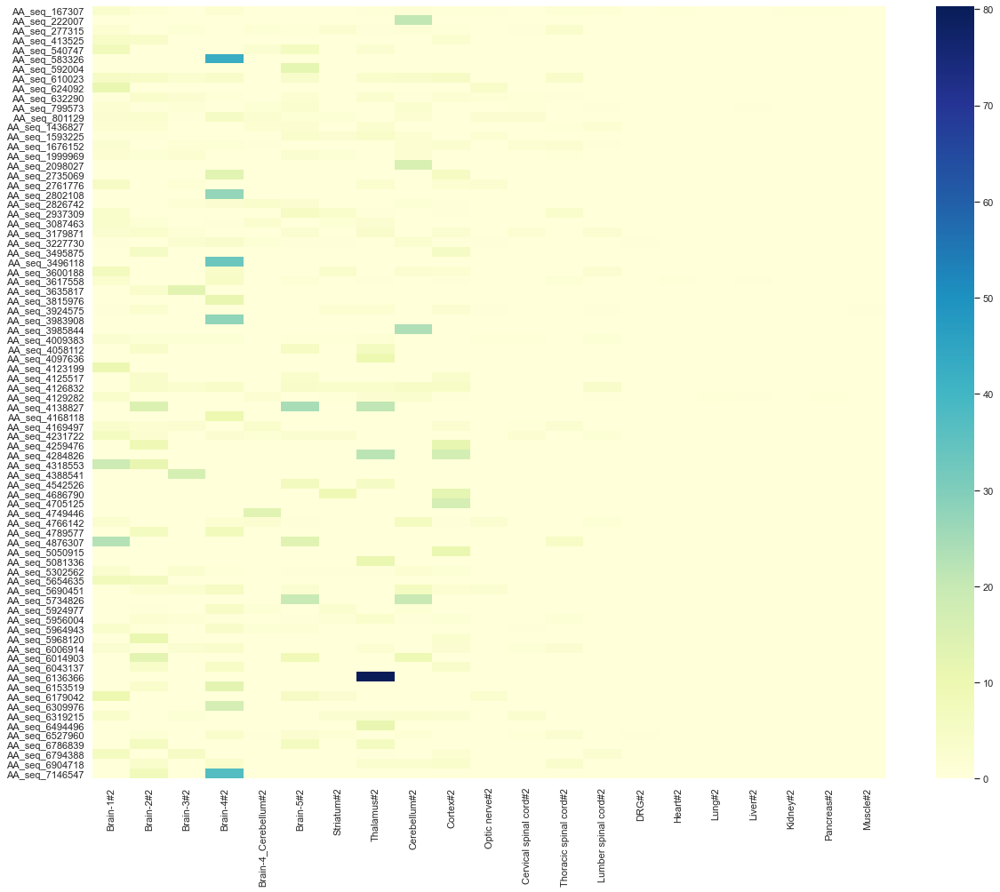

In [449]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_filter.iloc[:, 3:len(rep2_filter.columns) - 1], cmap='YlGnBu', yticklabels=rep2_filter['AA_seq_ID'])

In [621]:
rep1_sel.head()

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1,Brain-2#1,Brain-3#1,Brain-4#1,Brain-4_Cerebellum#1,Brain-5#1,Striatum#1,...,Optic nerve#1,Cervical spinal cord#1,Thoracic spinal cord#1,Lumber spinal cord#1,DRG#1,Lung#1,Liver#1,Kidney#1,Pancreas#1,Spleen#1
0,AA_seq_174541,ADLGNNWSR,"Seq_7269678,Seq_7471364,Seq_7531738,Seq_753182...",0.0,0.0,7.233333,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,AA_seq_193078,ADRGSAWAV,"Seq_7260907,Seq_7270415,Seq_7516196,Seq_752957...",0.0,0.0,0.000000,0.0,0.0,6.857143,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,AA_seq_216241,AEGGMHWNV,"Seq_7492843,Seq_7493175,Seq_7494075,Seq_749407...",0.0,0.0,0.000000,0.0,0.0,5.777778,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,AA_seq_221747,AELGAHWSK,"Seq_7270215,Seq_7488829,Seq_7501524,Seq_750175...",0.0,0.0,0.000000,0.0,0.0,2.872340,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,AA_seq_221834,AELGAKWSK,"Seq_7471251,Seq_7488787,Seq_7501484,Seq_750148...",0.0,0.0,0.000000,0.0,0.0,3.594595,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 最適なクラスター数の探索 

In [29]:
# 前回
# print(rep1_sel.shape)
# print(rep2_sel.shape)

(176, 23)
(135, 25)


In [168]:
# 今回（221024）
# DRG -> Nerve
print(rep1_sel.shape)
print(rep2_sel.shape)

(143, 23)
(122, 25)


In [28]:
# 今回（221024）
# DRG -> Nerve
print(rep1_sel.shape)
print(rep2_sel.shape)

(300, 23)
(238, 25)


In [138]:
# 今回（221024）
# DRG -> Others
print(rep1_sel.shape)
print(rep2_sel.shape)

(265, 23)
(204, 25)


In [29]:
rep1_sel[rep1_sel['AA_seq_ID'] == 'AA_seq_4127017']

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1,Brain-2#1,Brain-3#1,Brain-4#1,Brain-4_Cerebellum#1,Brain-5#1,Striatum#1,...,Optic nerve#1,Cervical spinal cord#1,Thoracic spinal cord#1,Lumber spinal cord#1,DRG#1,Lung#1,Liver#1,Kidney#1,Pancreas#1,Spleen#1
157,AA_seq_4127017,PDLGLKWAQ,"Seq_4732661,Seq_4737015,Seq_4737222,Seq_473741...",0.0,3.869565,0.0,0.0,0.0,3.26087,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [36]:
val = []
for i in range(len(rep1_sel)):
    data = rep1_sel.iloc[i, 3:].values
    val.append(data)

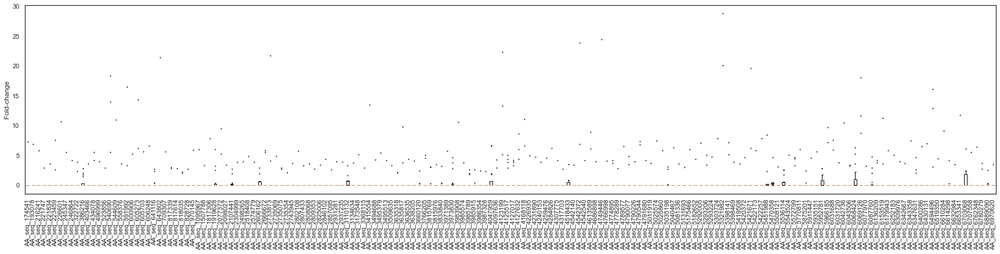

In [39]:
sns.set_style("white")
plt.figure(figsize=(30, 6))
flierprops = dict(markersize=1)
val12 = val
label = rep1_sel['AA_seq_ID'].values
plt.boxplot(val12, labels=label, flierprops=flierprops)
plt.xticks(rotation=90)
plt.ylabel('Fold-change')
plt.show()

In [30]:
from sklearn import preprocessing

In [140]:
# スケールを合わせて、出現パターンを探索
# 最小値0～最大値1にスケーリングすることで、極端に大きい・小さい値0を区別させる。

header1 = rep1_sel['AA_seq_ID'].reset_index(drop=True)
rep1_FC_v = rep1_sel.iloc[:, 3:].reset_index(drop=True)

header2 = rep2_sel['AA_seq_ID'].reset_index(drop=True)
rep2_FC_v = rep2_sel.iloc[:, 3:].reset_index(drop=True)

z_rep1 = st.zscore(rep1_FC_v, axis=1, ddof=1)
z_rep2 = st.zscore(rep2_FC_v, axis=1, ddof=1)

#z_rep1 = preprocessing.minmax_scale(rep1_FC_v, axis=1)
#z_rep2 = preprocessing.minmax_scale(rep2_FC_v, axis=1)

z_val = pd.DataFrame(z_rep1)
z_val.columns = rep1_sel.iloc[:, 3:].columns
rep1_z = pd.concat([header1, z_val], axis=1)
z_val = pd.DataFrame(z_rep2)
z_val.columns = rep2_sel.iloc[:, 3:].columns
rep2_z = pd.concat([header2, z_val], axis=1)
# 比較対象とはならない欠損値がある行、配列は調査外とする
rep1_z_mod = rep1_z.dropna().reset_index(drop=True)
rep2_z_mod = rep2_z.dropna().reset_index(drop=True)

In [182]:
rep2_sel[rep2_sel['AA_seq_ID'] == 'AA_seq_142021']

,AA_seq_ID,AA_seq,Header_ID,Brain-1#2,Brain-2#2,Brain-3#2,Brain-4#2,Brain-4_Cerebellum#2,Brain-5#2,Striatum#2,...,Thoracic spinal cord#2,Lumber spinal cord#2,DRG#2,Heart#2,Lung#2,Liver#2,Kidney#2,Pancreas#2,Muscle#2,Spleen#2
0,AA_seq_142021,AATGETWAK,"Seq_7261763,Seq_7271457,Seq_7548517,Seq_755027...",0.640977,0.518797,0.146617,0.0,3.323308,0.62406,0.714286,...,0.693609,0.330827,0.763158,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [171]:
rep2_z_mod

,AA_seq_ID,Brain-1#2,Brain-2#2,Brain-3#2,Brain-4#2,Brain-4_Cerebellum#2,Brain-5#2,Striatum#2,Thalamus#2,Cerebellum#2,...,Thoracic spinal cord#2,Lumber spinal cord#2,DRG#2,Heart#2,Lung#2,Liver#2,Kidney#2,Pancreas#2,Muscle#2,Spleen#2
0,AA_seq_142021,0.192873,0.156109,0.044118,0.000000,1.000000,0.187783,0.214932,0.007353,0.479638,...,0.208710,0.099548,0.229638,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,AA_seq_222007,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,AA_seq_224212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,AA_seq_373200,0.133333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,AA_seq_413525,1.000000,0.919708,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,AA_seq_540734,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,AA_seq_540741,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,AA_seq_540747,1.000000,0.000000,0.000000,0.000000,0.331034,0.810345,0.000000,0.348276,0.000000,...,0.000000,0.000000,0.031034,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,AA_seq_592004,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,AA_seq_592333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [172]:
rep1_z_mod

,AA_seq_ID,Brain-1#1,Brain-2#1,Brain-3#1,Brain-4#1,Brain-4_Cerebellum#1,Brain-5#1,Striatum#1,Thalamus#1,Cerebellum#1,...,Optic nerve#1,Cervical spinal cord#1,Thoracic spinal cord#1,Lumber spinal cord#1,DRG#1,Lung#1,Liver#1,Kidney#1,Pancreas#1,Spleen#1
0,AA_seq_221747,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
1,AA_seq_221834,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
2,AA_seq_223459,0.000000,1.000000,0.000000,0.000000,0.000000,0.346386,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
3,AA_seq_226601,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
4,AA_seq_245347,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
5,AA_seq_322722,0.000000,0.612903,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
6,AA_seq_386216,0.000000,0.000000,0.000000,0.113054,0.000000,0.732517,0.084499,1.000000,0.518065,...,0.088578,0.000000,0.000000,0.009324,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
7,AA_seq_403466,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
8,AA_seq_434078,1.000000,0.000000,0.000000,0.000000,0.000000,0.744186,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
9,AA_seq_496999,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [141]:
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import fcluster
from sklearn.metrics import davies_bouldin_score
from scipy.cluster.hierarchy import linkage

num = 22 # クラスター数を10個までの範囲で比較
NUM_CLUSTERS_RANGE = range(2, num+1)  
X1 = rep1_z_mod.iloc[:, 1:]
X2 = rep2_z_mod.iloc[:, 1:]

davies_bouldin_index1 = []
for i in NUM_CLUSTERS_RANGE:
    kmeans = KMeans(n_clusters=i,  init='k-means++',  random_state=1).fit(X1)
    labels = kmeans.labels_
    davies_bouldin_index1.append(davies_bouldin_score(X1, labels))

davies_bouldin_index2 = []
for i in NUM_CLUSTERS_RANGE:
    kmeans = KMeans(n_clusters=i,  init='k-means++',  random_state=1).fit(X2)
    labels = kmeans.labels_
    davies_bouldin_index2.append(davies_bouldin_score(X2, labels))

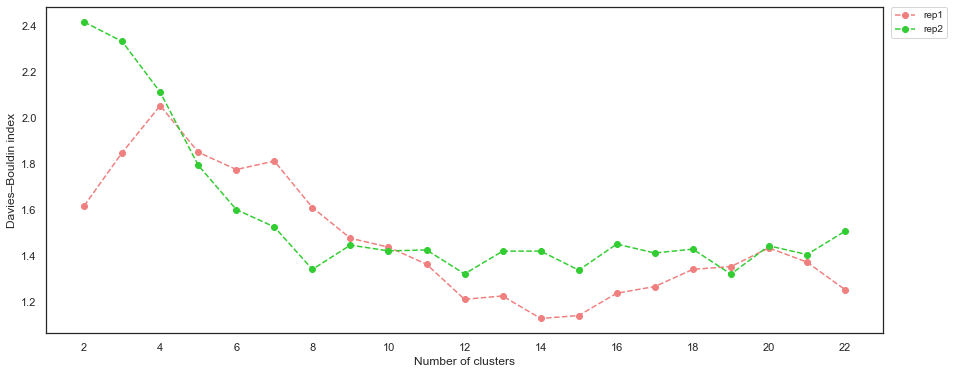

In [142]:
sns.set_style("white")
plt.figure(figsize=(15, 6))
plt.plot(NUM_CLUSTERS_RANGE, davies_bouldin_index1, marker='o', linestyle='--', c='lightcoral', label='rep1')
plt.plot(NUM_CLUSTERS_RANGE, davies_bouldin_index2, marker='o', linestyle='--', c='limegreen', label='rep2')
plt.xlabel('Number of clusters')
plt.ylabel('Davies–Bouldin index')
#plt.axvline(x=7, color='gray', linestyle='--')
plt.legend(
    bbox_to_anchor=(1.01, 1),
    loc='upper left',
    borderaxespad=0,
    fontsize=10
)
plt.xticks([2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22])
plt.show()

DRG -> Nerve <br>
クラスター数の決定については、rep1は14、2は13とした。

DRG -> Nerve <br>
クラスター数の決定については、rep1は14、2は12とした。

In [145]:
np.random.seed(0)
model = KMeans(n_clusters=14, init='k-means++',  random_state=1)
model.fit(rep1_z_mod.iloc[:, 1:])
rep1_z_mod['cluster'] = model.labels_
rep1_z_mod_sort = rep1_z_mod.sort_values('cluster')

<AxesSubplot:>

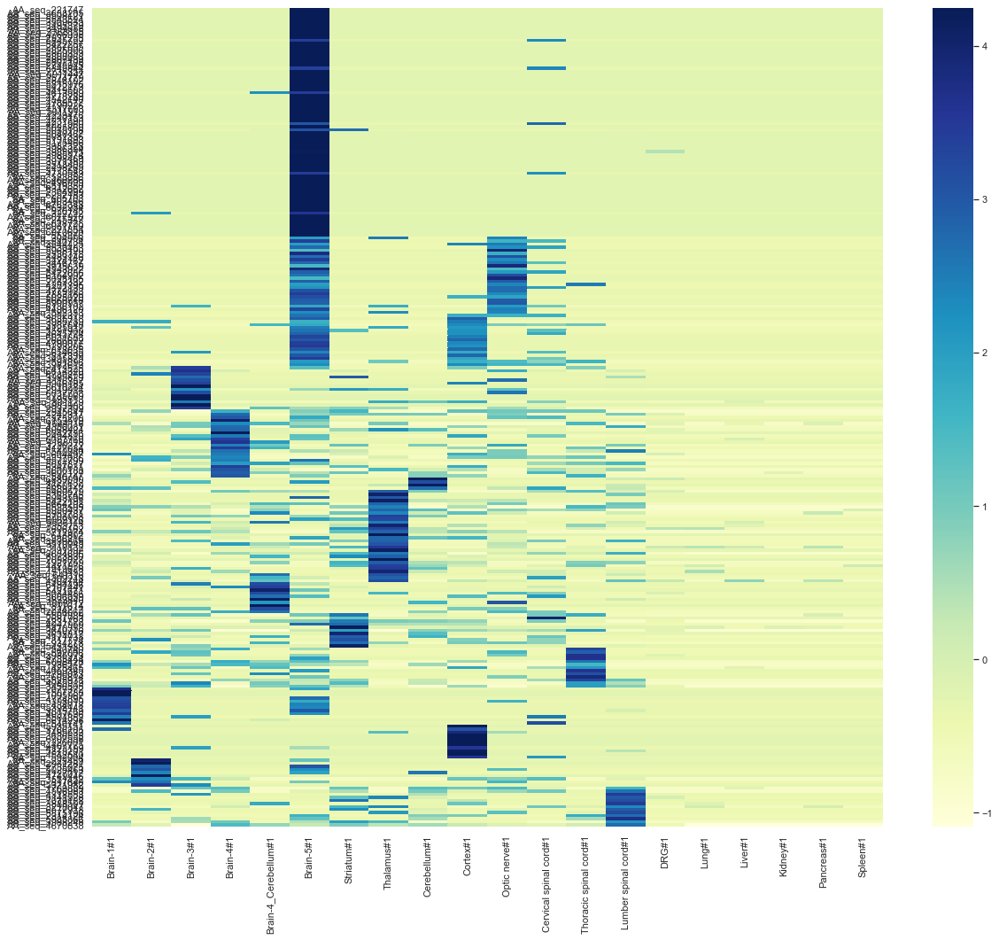

In [146]:
sns.set(rc = {'figure.figsize':(20,17)})
sns.heatmap(rep1_z_mod_sort.iloc[:, 1:len(rep1_z_mod_sort.columns) - 1], cmap='YlGnBu', yticklabels=rep1_z_mod_sort['AA_seq_ID'])

In [241]:
pd.set_option('display.max_columns', None)
rep1_z_mod_sort.mean(axis=1)

0     -7.665826e-17
89    -3.965082e-17
87    -3.965082e-17
85    -3.700743e-17
83    -3.700743e-17
81    -3.700743e-17
79    -4.229421e-17
78     5.551115e-17
77     5.551115e-17
69    -3.700743e-17
68     1.850372e-17
67     4.229421e-17
65    -3.436405e-17
62     6.079793e-17
60     1.850372e-17
56     5.551115e-17
52     2.643388e-18
50     2.643388e-18
49    -3.436405e-17
48     2.643388e-18
90     5.551115e-17
47     6.079793e-17
92     2.643388e-18
94    -3.436405e-17
139   -3.700743e-17
136    2.643388e-18
133   -7.401487e-17
131    1.321694e-17
129   -3.172066e-17
128   -3.436405e-17
125    1.850372e-17
120   -7.665826e-17
115   -3.965082e-17
112   -3.436405e-17
110    2.643388e-18
107   -3.436405e-17
106   -3.172066e-17
104    1.850372e-17
103   -3.965082e-17
99    -3.436405e-17
98    -3.436405e-17
97    -7.930164e-17
96     2.643388e-18
93     1.321694e-17
45    -7.665826e-17
142    6.079793e-17
20     1.850372e-17
28     1.850372e-17
27    -7.401487e-17
19    -7.401487e-17


In [265]:
# polishing ---

#rep1_filter = rep1_z_mod_sort[
#    (rep1_z_mod_sort['Lung#1'] < 0.5 ) &
#    (rep1_z_mod_sort['Liver#1'] < 0.5 ) & 
#    (rep1_z_mod_sort['Kidney#1'] < 0.5 ) &
#    (rep1_z_mod_sort['Pancreas#1'] < 0.5 ) &
#    (rep1_z_mod_sort['Spleen#1'] < 0.5 ) &
#    (rep1_z_mod_sort['DRG#1'] < 0.5)
#]

<AxesSubplot:>

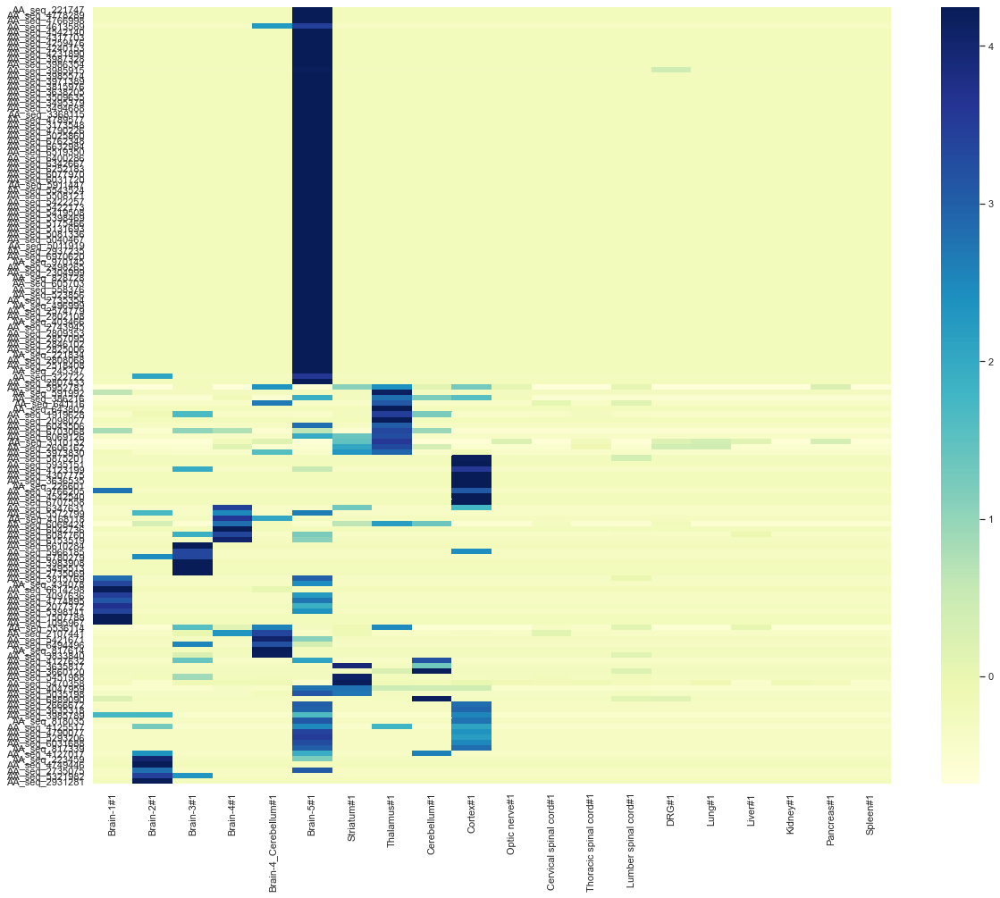

In [271]:
#sns.set(rc = {'figure.figsize':(20,16)})
#sns.heatmap(rep1_filter.iloc[:, 1:len(rep1_z_mod_sort.columns) - 1], cmap='YlGnBu', yticklabels=rep1_filter['AA_seq_ID'])

In [150]:
np.random.seed(0)
model = KMeans(n_clusters=12, init='k-means++',  random_state=1)
model.fit(rep2_z_mod.iloc[:, 1:])
rep2_z_mod['cluster'] = model.labels_
rep2_z_mod_sort = rep2_z_mod.sort_values('cluster')

<AxesSubplot:>

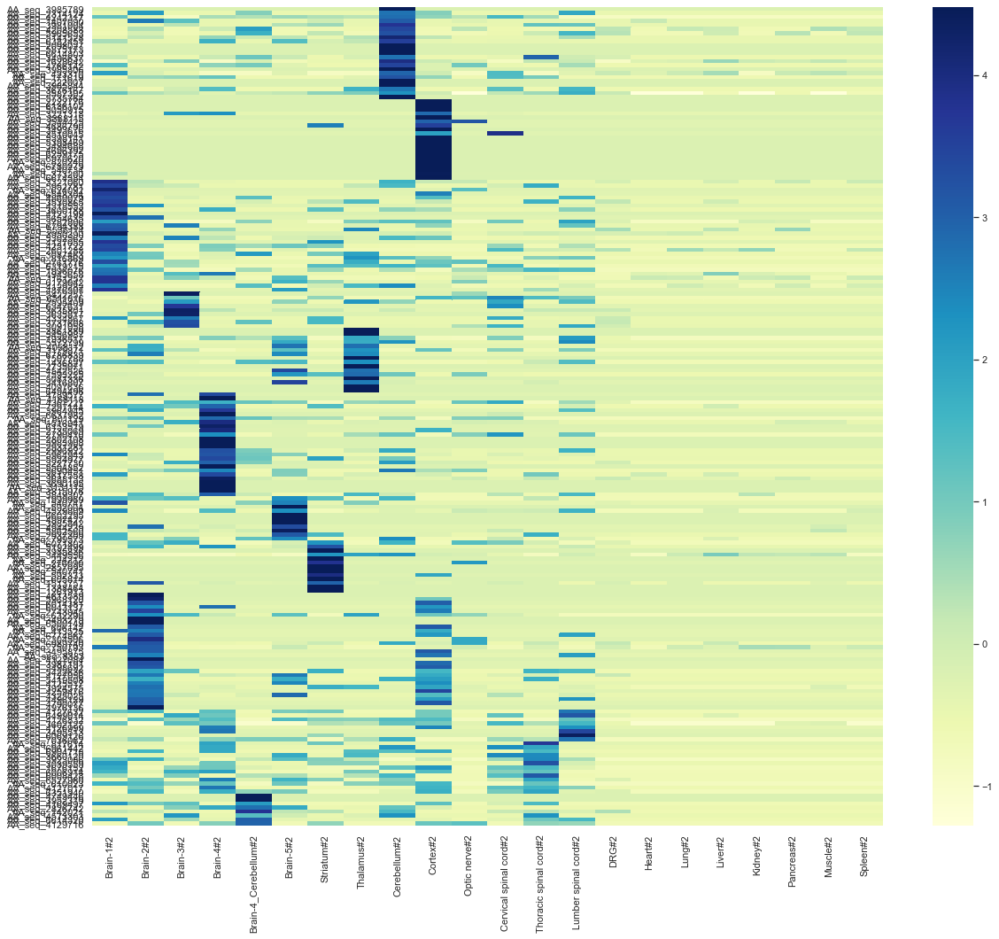

In [151]:
sns.set(rc = {'figure.figsize':(20,17)})
sns.heatmap(rep2_z_mod_sort.iloc[:, 1:len(rep2_z_mod_sort.columns) - 1], cmap='YlGnBu', yticklabels=rep2_z_mod_sort['AA_seq_ID'])

In [272]:
#rep2_filter = rep2_z_mod_sort[
#    (rep2_z_mod_sort['Heart#2'] < 0.5 ) &
#    (rep2_z_mod_sort['Muscle#2'] < 0.5 ) &
#    (rep2_z_mod_sort['Lung#2'] < 0.5 ) &
#    (rep2_z_mod_sort['Liver#2'] < 0.5 ) & 
#    (rep2_z_mod_sort['Kidney#2'] < 0.5 ) &
#    (rep2_z_mod_sort['Pancreas#2'] < 0.5 ) &
#    (rep2_z_mod_sort['Spleen#2'] < 0.5 ) &
#    (rep2_z_mod_sort['DRG#2'] < 0.5)
#]

<AxesSubplot:>

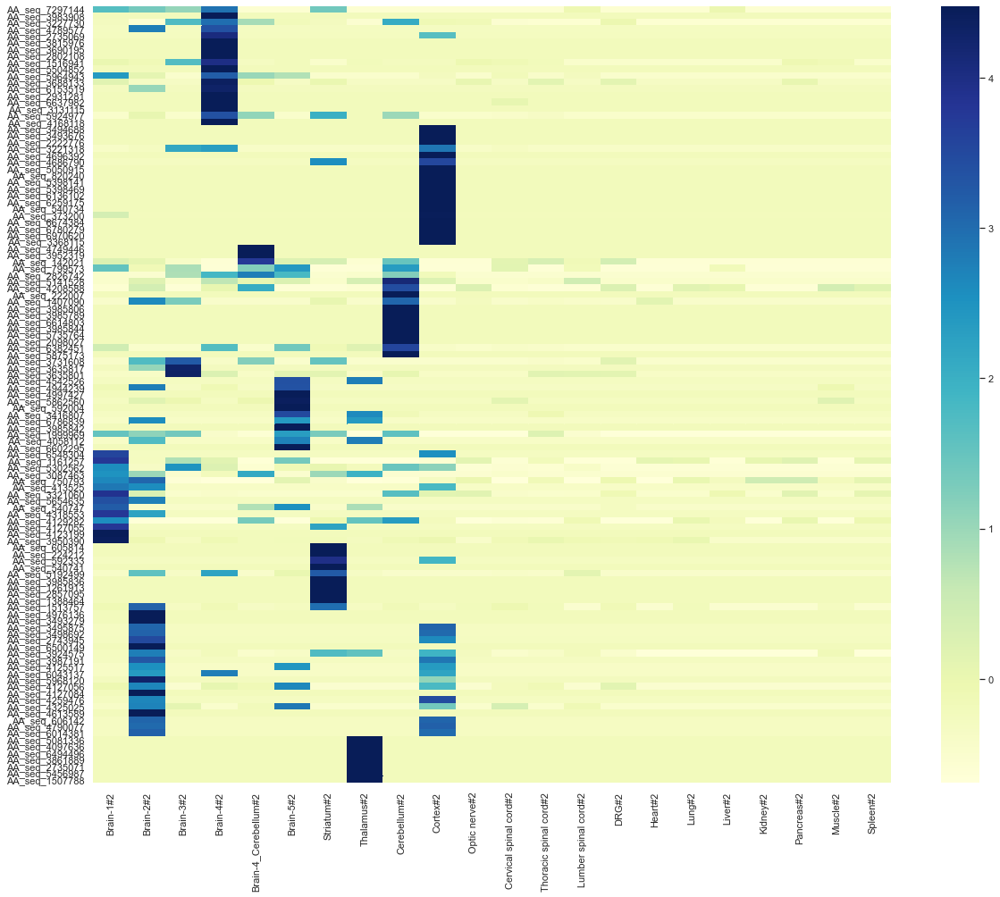

In [274]:
#sns.set(rc = {'figure.figsize':(20,16)})
#sns.heatmap(rep2_filter.iloc[:, 1:len(rep2_z_mod_sort.columns) - 1], cmap='YlGnBu', yticklabels=rep2_filter['AA_seq_ID'])

In [60]:
# z-scoreでpolishingは意味をなさないので、未実施
rep1_filter = rep1_z_mod_sort
rep2_filter = rep2_z_mod_sort

In [61]:
common_seq = list(set(rep1_filter['AA_seq_ID']) & set(rep2_filter['AA_seq_ID']))
print(common_seq)
print(len(common_seq))

['AA_seq_5966185', 'AA_seq_6614320', 'AA_seq_3227730', 'AA_seq_6347631', 'AA_seq_3815976', 'AA_seq_5398141', 'AA_seq_3510045', 'AA_seq_4789577', 'AA_seq_4976136', 'AA_seq_5654635', 'AA_seq_6540040', 'AA_seq_2684606', 'AA_seq_1936517', 'AA_seq_4876307', 'AA_seq_4749446', 'AA_seq_5422636', 'AA_seq_1507788', 'AA_seq_2937309', 'AA_seq_4496129', 'AA_seq_4097636', 'AA_seq_2314124', 'AA_seq_3635817', 'AA_seq_2996922', 'AA_seq_5419508', 'AA_seq_5398469', 'AA_seq_540747', 'AA_seq_7036062', 'AA_seq_3416807', 'AA_seq_540741', 'AA_seq_4790083', 'AA_seq_3494688', 'AA_seq_592004', 'AA_seq_3600188', 'AA_seq_5141528', 'AA_seq_2595409', 'AA_seq_3368115', 'AA_seq_4242317', 'AA_seq_6577918', 'AA_seq_3985789', 'AA_seq_4058112', 'AA_seq_6780279', 'AA_seq_3530865', 'AA_seq_2735069', 'AA_seq_6008428', 'AA_seq_592333', 'AA_seq_3952319', 'AA_seq_304506', 'AA_seq_3638205', 'AA_seq_6970620', 'AA_seq_5968120', 'AA_seq_5504852', 'AA_seq_3495513', 'AA_seq_6069126', 'AA_seq_2098027', 'AA_seq_4116337', 'AA_seq_615351

In [152]:
rep1_filter = rep1_z_mod_sort
rep2_filter = rep2_z_mod_sort

In [153]:
file = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Common_Consensus_frequency.xlsx'
rep12_sel = pd.read_excel(file, sheet_name='rep12')

In [154]:
idx_rep1 = [rep12_sel[rep12_sel['AA_seq_ID'] == seqID].index[0] for seqID in rep1_filter['AA_seq_ID']]
brain_rep1 = pd.concat(
   [rep12_sel.iloc[idx_rep1, :85].reset_index(drop=True), rep1_filter['cluster'].reset_index(drop=True)], axis=1
)
idx_rep2 = [rep12_sel[rep12_sel['AA_seq_ID'] == seqID].index[0] for seqID in rep2_filter['AA_seq_ID']]
brain_rep2 = pd.concat(
    [rep12_sel.iloc[idx_rep2, :3].reset_index(drop=True), rep12_sel.iloc[idx_rep2, 85:].reset_index(drop=True), rep2_filter['cluster'].reset_index(drop=True)], axis=1
)

In [68]:
brain_rep1

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR,cluster
0,AA_seq_221747,AELGAHWSK,"Seq_7270215,Seq_7488829,Seq_7501524,Seq_750175...",44,57,64,49,54,135,59,...,1.000000e+00,1.212766,1.000000e+00,1.744681,1.0,1.170213,1.0,0.787234,1.000000e+00,0
1,AA_seq_2937235,LDLGKTWTV,"Seq_5652151,Seq_5665572,Seq_5787656,Seq_578771...",28,17,12,40,35,81,41,...,1.000000e+00,1.333333,1.000000e+00,1.428571,1.0,1.380952,1.0,0.523810,1.000000e+00,0
2,AA_seq_5040467,QTTGSNWAT,"Seq_3543548,Seq_3547289,Seq_3549036,Seq_354987...",26,24,34,33,42,76,54,...,1.000000e+00,2.083333,1.000000e+00,2.416667,1.0,2.750000,1.0,1.916667,1.000000e+00,0
3,AA_seq_5081336,R*NGTVWEQ,"Seq_5350286,Seq_5350290,Seq_5479459,Seq_547947...",23,32,40,46,37,71,45,...,1.000000e+00,2.300000,1.000000e+00,2.000000,1.0,1.300000,1.0,1.500000,1.000000e+00,0
4,AA_seq_2857095,KTTGRDWMQ,"Seq_4045,Seq_4050,Seq_4149,Seq_4151,Seq_4179,S...",105,103,91,127,142,260,136,...,1.000000e+00,1.029703,1.000000e+00,1.277228,1.0,0.762376,1.0,0.653465,1.000000e+00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,AA_seq_5689217,SLPGLQWEM,"Seq_9553951,Seq_9553980,Seq_9953299,Seq_995383...",692,609,592,615,675,324,13,...,6.908040e-97,0.652482,1.755970e-07,1.397163,1.0,1.304965,1.0,1.498818,1.000000e+00,13
296,AA_seq_4127017,PDLGLKWAQ,"Seq_4732661,Seq_4737015,Seq_4737222,Seq_473741...",91,178,61,56,79,150,79,...,1.000000e+00,0.760870,1.000000e+00,2.239130,1.0,1.695652,1.0,0.673913,1.000000e+00,13
297,AA_seq_3660120,NHSGPNWES,"Seq_804220,Seq_804222,Seq_804300,Seq_804302,Se...",21,31,27,25,24,29,21,...,1.000000e+00,0.264706,1.893107e-03,1.705882,1.0,1.411765,1.0,0.485294,1.000000e+00,13
298,AA_seq_6889090,VDHGPAWAR,"Seq_8715393,Seq_8715394,Seq_8715396,Seq_889742...",20,36,42,30,32,98,39,...,1.000000e+00,0.225352,7.526998e-05,0.971831,1.0,0.591549,1.0,0.253521,1.438193e-04,13


In [155]:
outfile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
with pd.ExcelWriter(outfile) as writer:
    brain_rep1.to_excel(writer, sheet_name='100-131', index=False)
    brain_rep2.to_excel(writer, sheet_name='200-231', index=False)

In [156]:
infile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/DRG(Nerve)/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
brain_rep1_nerve = pd.read_excel(infile, sheet_name='100-131')
brain_rep2_nerve = pd.read_excel(infile, sheet_name='200-231')

In [157]:
infile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
brain_rep1_others = pd.read_excel(infile, sheet_name='100-131')
brain_rep2_others = pd.read_excel(infile, sheet_name='200-231')

In [159]:
print(brain_rep1_nerve.shape)
print(brain_rep1_others.shape)
print(brain_rep2_nerve.shape)
print(brain_rep2_others.shape)

(300, 86)
(265, 86)
(238, 94)
(204, 94)


In [164]:
common_seq = list(set(brain_rep1_nerve['AA_seq_ID']) & set(brain_rep2_nerve['AA_seq_ID']))
print(len(common_seq))

100


In [165]:
common_seq = list(set(brain_rep1_others['AA_seq_ID']) & set(brain_rep2_others['AA_seq_ID']))
print(len(common_seq))

77


In [161]:
common_seq = list(set(brain_rep1_nerve['AA_seq_ID']) & set(brain_rep1_others['AA_seq_ID']))
#print(common_seq)
print(len(common_seq))

264


In [162]:
common_seq = list(set(brain_rep2_nerve['AA_seq_ID']) & set(brain_rep2_others['AA_seq_ID']))
#print(common_seq)
print(len(common_seq))

204


In [70]:
infile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
brain_rep1 = pd.read_excel(infile, sheet_name='100-131')
brain_rep2 = pd.read_excel(infile, sheet_name='200-231')

In [71]:
rep1_sel_info = brain_rep1.loc[:, ['AA_seq_ID', 'AA_seq', 'Header_ID', 'cluster']]
rep2_sel_info = brain_rep2.loc[:, ['AA_seq_ID', 'AA_seq', 'Header_ID', 'cluster']]
rep1_scale = pd.merge(rep1_sel_info, rep1_z_mod, on='AA_seq_ID', how='left')
rep2_scale = pd.merge(rep2_sel_info, rep2_z_mod, on='AA_seq_ID', how='left')

In [283]:
# 前回
#print(rep1_scale.shape)
#print(rep2_scale.shape)

(143, 25)
(122, 27)


In [72]:
print(rep1_scale.shape)
print(rep2_scale.shape)

(300, 25)
(238, 27)


In [73]:
rep1_scale

,AA_seq_ID,AA_seq,Header_ID,cluster_x,Brain-1#1,Brain-2#1,Brain-3#1,Brain-4#1,Brain-4_Cerebellum#1,Brain-5#1,...,Cervical spinal cord#1,Thoracic spinal cord#1,Lumber spinal cord#1,DRG#1,Lung#1,Liver#1,Kidney#1,Pancreas#1,Spleen#1,cluster_y
0,AA_seq_221747,AELGAHWSK,"Seq_7270215,Seq_7488829,Seq_7501524,Seq_750175...",0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
1,AA_seq_2937235,LDLGKTWTV,"Seq_5652151,Seq_5665572,Seq_5787656,Seq_578771...",0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
2,AA_seq_5040467,QTTGSNWAT,"Seq_3543548,Seq_3547289,Seq_3549036,Seq_354987...",0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
3,AA_seq_5081336,R*NGTVWEQ,"Seq_5350286,Seq_5350290,Seq_5479459,Seq_547947...",0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
4,AA_seq_2857095,KTTGRDWMQ,"Seq_4045,Seq_4050,Seq_4149,Seq_4151,Seq_4179,S...",0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,AA_seq_5689217,SLPGLQWEM,"Seq_9553951,Seq_9553980,Seq_9953299,Seq_995383...",13,1.468693,1.224817,-0.564588,-0.564588,-0.564588,-0.564588,...,1.877112,-0.532267,0.246374,-0.564588,-0.564588,-0.564588,-0.564588,-0.564588,-0.564588,13
296,AA_seq_4127017,PDLGLKWAQ,"Seq_4732661,Seq_4737015,Seq_4737222,Seq_473741...",13,-0.406935,2.373655,-0.406935,-0.406935,-0.406935,1.936259,...,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,13
297,AA_seq_3660120,NHSGPNWES,"Seq_804220,Seq_804222,Seq_804300,Seq_804302,Se...",13,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,...,-0.274002,-0.274002,0.216748,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,13
298,AA_seq_6889090,VDHGPAWAR,"Seq_8715393,Seq_8715394,Seq_8715396,Seq_889742...",13,0.213938,-0.292424,-0.292424,-0.292424,-0.292424,-0.292424,...,-0.292424,-0.292424,0.112665,0.163302,-0.292424,-0.292424,-0.292424,-0.292424,-0.292424,13


In [74]:
rep2_scale

,AA_seq_ID,AA_seq,Header_ID,cluster_x,Brain-1#2,Brain-2#2,Brain-3#2,Brain-4#2,Brain-4_Cerebellum#2,Brain-5#2,...,Lumber spinal cord#2,DRG#2,Heart#2,Lung#2,Liver#2,Kidney#2,Pancreas#2,Muscle#2,Spleen#2,cluster_y
0,AA_seq_3981004,NTTGGPWGT,"Seq_34428,Seq_562844,Seq_563758,Seq_567627,Seq...",0,-0.430202,-0.464905,0.277723,-0.464905,-0.437143,0.349441,...,1.166100,-0.464905,-0.464905,-0.464905,-0.464905,-0.464905,-0.464905,-0.464905,-0.464905,0
1,AA_seq_2098027,HDLGSKWDI,"Seq_4296543,Seq_4296544,Seq_4296546,Seq_4298121",0,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,...,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,0
2,AA_seq_4573303,PTLGTSWDL,"Seq_4433767,Seq_4443086,Seq_4490706,Seq_450015...",0,-0.492149,-0.492149,2.189550,-0.492149,1.347986,-0.005424,...,-0.492149,-0.492149,-0.492149,-0.492149,-0.492149,-0.492149,-0.492149,-0.492149,-0.492149,0
3,AA_seq_4766142,QGHGEQWSL,"Seq_3483314,Seq_3909217,Seq_3920211,Seq_392149...",0,1.369610,-0.545076,-0.545076,0.722839,0.970089,-0.297825,...,0.498202,-0.545076,-0.545076,-0.545076,-0.545076,-0.545076,-0.545076,-0.545076,-0.545076,0
4,AA_seq_1094132,DTPGTTWSE,"Seq_6767606,Seq_6767607,Seq_6767608,Seq_676761...",0,-0.608398,-0.608398,-0.144710,1.500502,0.128365,-0.608398,...,-0.000061,1.135500,-0.608398,-0.608398,-0.112266,-0.608398,-0.608398,-0.608398,-0.608398,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,AA_seq_3039559,LKDGQSWPS,"Seq_5668798,Seq_5672473,Seq_5672550,Seq_567255...",12,2.072069,-0.454695,-0.496202,1.036978,-0.496202,-0.496202,...,-0.112259,-0.496202,-0.496202,-0.496202,-0.496202,-0.496202,-0.496202,-0.496202,-0.496202,12
234,AA_seq_3923086,NSTGPDWQV,"Seq_41326,Seq_1184096,Seq_1184097,Seq_1184123,...",12,1.189001,1.708307,0.034393,-0.640169,0.180727,1.337119,...,0.466256,-0.843609,-0.843609,-0.843609,-0.843609,-0.843609,-0.843609,-0.843609,-0.843609,12
235,AA_seq_5419508,SAVGKSWET,"Seq_9557533,Seq_9557534,Seq_9812026,Seq_981202...",12,-0.528660,1.714790,-0.528660,-0.528660,-0.528660,1.773828,...,-0.528660,-0.528660,-0.528660,-0.528660,-0.528660,-0.528660,-0.528660,-0.528660,-0.528660,12
236,AA_seq_817614,DGLGSNWAN,"Seq_7091633,Seq_7091884,Seq_7105770,Seq_710705...",12,-0.354467,-0.354467,-0.354467,1.944720,-0.354467,-0.354467,...,-0.354467,-0.354467,-0.354467,-0.354467,-0.354467,-0.354467,-0.354467,-0.354467,-0.354467,12


## 各グループの配列における特徴 

### タンパク質ドメイン機能解析

```bash
$ cd /export/home/uchiyamat/TEST/tools
$ conda install -c bioconda hmmer
$ gzip -dv Pfam-A.hmm.gz
$ wget ftp://ftp.ebi.ac.uk/pub/databases/Pfam/current_release/Pfam-A.hmm.gz
$ hmmpress Pfam-A.hmm
```

In [75]:
outfa = 'A:/PROJECT/PG4699/200_INFO/05_pfam/PG4699_AA_seq_rep1.fa'
with open(outfa, 'w') as wf:
    for i in range(len(brain_rep1)):
        ID = brain_rep1.loc[i, 'AA_seq_ID']
        seq = brain_rep1.loc[i, 'AA_seq']
        wf.write(f'>{ID}\n')
        wf.write(f'{seq}\n')

In [76]:
outfa = 'A:/PROJECT/PG4699/200_INFO/05_pfam/PG4699_AA_seq_rep2.fa'
with open(outfa, 'w') as wf:
    for i in range(len(brain_rep2)):
        ID = brain_rep2.loc[i, 'AA_seq_ID']
        seq = brain_rep2.loc[i, 'AA_seq']
        wf.write(f'>{ID}\n')
        wf.write(f'{seq}\n')

### 配列エンリッチメント度合いの算出

In [688]:
#def pwm(cnt, total, bg=0.05):
#    p = (cnt + (np.sqrt(total) * 0.05)) / (total + (20 * (np.sqrt(total) * 0.05)))
#    pwm_score = np.log2(p/bg)
#    return pwm_score

In [77]:
def score(ref, pwm_score):
    total = float(sum([pwm_score.loc[i, nucl] for i, nucl in enumerate(ref, 1)]))
    return total

In [78]:
# brain-specific ---
nucl = pd.DataFrame()
seqs = brain_rep1['AA_seq']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_cnt = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    F = col_list.count('F') / total
    L = col_list.count('L') / total
    I = col_list.count('I') / total
    V = col_list.count('V') / total
    S = col_list.count('S') / total
    
    P = col_list.count('P') / total
    T = col_list.count('T') / total
    A = col_list.count('A') / total
    Y = col_list.count('Y') / total
    H = col_list.count('H') / total
    
    Q = col_list.count('Q') / total
    N = col_list.count('N') / total
    K = col_list.count('K') / total
    D = col_list.count('D') / total
    E = col_list.count('E') / total
    
    C = col_list.count('C') / total
    W = col_list.count('W') / total
    R = col_list.count('R') / total
    G = col_list.count('G') / total
    M = col_list.count('M') / total
    a = col_list.count('*') / total
    
    freq = pd.Series(
        [
            F, L, I, V, S,
            P, T, A, Y, H, 
            Q, N, K, D, E,
            C, W, R, G, M, a
        ]
    )
    pos_cnt = pos_cnt.append(freq, ignore_index=True)

pos_cnt.columns = [
    'F', 'L', 'I', 'V', 'S',
    'P', 'T', 'A', 'Y', 'H', 
    'Q', 'N', 'K', 'D', 'E',
    'C', 'W', 'R', 'G', 'M', '*'
]
pos_cnt.index += 1

brain_aa_freq = pos_cnt

In [79]:
file = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Common_Consensus_frequency.xlsx'
all_rep1 = pd.read_excel(file, sheet_name='rep12')

In [80]:
# all
nucl = pd.DataFrame()
seqs = all_rep1['AA_seq']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_cnt = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    F = col_list.count('F') / total
    L = col_list.count('L') / total 
    I = col_list.count('I') / total
    V = col_list.count('V') / total
    S = col_list.count('S') / total
    
    P = col_list.count('P') / total
    T = col_list.count('T') / total
    A = col_list.count('A') / total
    Y = col_list.count('Y') / total
    H = col_list.count('H') / total
    
    Q = col_list.count('Q') / total
    N = col_list.count('N') / total
    K = col_list.count('K') / total
    D = col_list.count('D') / total
    E = col_list.count('E') / total
    
    C = col_list.count('C') / total
    W = col_list.count('W') / total
    R = col_list.count('R') / total
    G = col_list.count('G') / total
    M = col_list.count('M') / total
    a = col_list.count('*') / total
    
    freq = pd.Series(
        [
            F, L, I, V, S,
            P, T, A, Y, H, 
            Q, N, K, D, E,
            C, W, R, G, M, a
        ]
    )
    pos_cnt = pos_cnt.append(freq, ignore_index=True)

pos_cnt.columns = [
    'F', 'L', 'I', 'V', 'S',
    'P', 'T', 'A', 'Y', 'H', 
    'Q', 'N', 'K', 'D', 'E',
    'C', 'W', 'R', 'G', 'M', '*'
]
pos_cnt.index += 1

all_aa_freq = pos_cnt

In [81]:
brain_aa_freq

,F,L,I,V,S,P,T,A,Y,H,...,N,K,D,E,C,W,R,G,M,*
1,0.003333,0.046667,0.013333,0.013333,0.186667,0.126667,0.086667,0.106667,0.003333,0.020000,...,0.146667,0.073333,0.036667,0.010000,0.000000,0.0,0.023333,0.013333,0.023333,0.000000
2,0.013333,0.020000,0.016667,0.026667,0.150000,0.043333,0.180000,0.120000,0.006667,0.013333,...,0.053333,0.020000,0.086667,0.063333,0.000000,0.0,0.020000,0.133333,0.010000,0.003333
3,0.003333,0.160000,0.003333,0.086667,0.100000,0.130000,0.153333,0.040000,0.006667,0.036667,...,0.093333,0.016667,0.003333,0.010000,0.000000,0.0,0.036667,0.053333,0.030000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000
5,0.000000,0.060000,0.000000,0.016667,0.186667,0.093333,0.173333,0.073333,0.000000,0.016667,...,0.030000,0.053333,0.020000,0.016667,0.000000,0.0,0.070000,0.073333,0.023333,0.000000
6,0.000000,0.006667,0.013333,0.010000,0.183333,0.013333,0.113333,0.046667,0.013333,0.053333,...,0.193333,0.070000,0.093333,0.026667,0.003333,0.0,0.016667,0.090000,0.016667,0.003333
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.003333,0.016667,0.170000,0.010000,0.023333,0.176667,0.000000,0.000000,...,0.013333,0.000000,0.103333,0.346667,0.000000,0.0,0.006667,0.056667,0.060000,0.003333
9,0.003333,0.036667,0.086667,0.123333,0.046667,0.020000,0.153333,0.026667,0.000000,0.006667,...,0.023333,0.080000,0.006667,0.066667,0.003333,0.0,0.053333,0.010000,0.020000,0.003333


In [82]:
all_aa_freq

,F,L,I,V,S,P,T,A,Y,H,...,N,K,D,E,C,W,R,G,M,*
1,0.006512,0.045991,0.021164,0.037851,0.146927,0.111518,0.094424,0.085877,0.006105,0.021978,...,0.114367,0.044770,0.046805,0.054131,0.000000,0.000000,0.024420,0.045991,0.024013,0.000814
2,0.005291,0.035409,0.017501,0.045584,0.147741,0.049654,0.131054,0.080179,0.004884,0.026862,...,0.070818,0.027269,0.106227,0.047619,0.000407,0.000814,0.031339,0.100936,0.016687,0.000407
3,0.005698,0.086284,0.015466,0.060643,0.135938,0.087912,0.114367,0.063899,0.001221,0.031746,...,0.076923,0.035816,0.044770,0.021571,0.000000,0.000407,0.054945,0.063899,0.033374,0.001221
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
5,0.000407,0.037851,0.008954,0.034188,0.168498,0.066341,0.132275,0.106227,0.001628,0.028083,...,0.048433,0.039072,0.036223,0.059829,0.000407,0.000000,0.050061,0.063899,0.020350,0.000000
6,0.000407,0.011396,0.005291,0.015059,0.222629,0.008547,0.134717,0.046805,0.004884,0.031339,...,0.174603,0.047619,0.093610,0.047212,0.000814,0.000000,0.021978,0.072446,0.016687,0.001221
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
8,0.000407,0.000814,0.003663,0.020350,0.194139,0.013024,0.037037,0.136752,0.000407,0.004070,...,0.067562,0.000814,0.137159,0.259666,0.002849,0.000000,0.002442,0.061864,0.019536,0.001628
9,0.000407,0.045177,0.079772,0.187220,0.061457,0.004884,0.113553,0.047619,0.000407,0.002849,...,0.013024,0.069597,0.004477,0.061050,0.009361,0.002035,0.146520,0.004070,0.028490,0.001221


In [83]:
rep1_filter

,AA_seq_ID,Brain-1#1,Brain-2#1,Brain-3#1,Brain-4#1,Brain-4_Cerebellum#1,Brain-5#1,Striatum#1,Thalamus#1,Cerebellum#1,...,Cervical spinal cord#1,Thoracic spinal cord#1,Lumber spinal cord#1,DRG#1,Lung#1,Liver#1,Kidney#1,Pancreas#1,Spleen#1,cluster
0,AA_seq_221747,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
85,AA_seq_2937235,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
205,AA_seq_5040467,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
206,AA_seq_5081336,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
81,AA_seq_2857095,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
242,AA_seq_5689217,1.468693,1.224817,-0.564588,-0.564588,-0.564588,-0.564588,-0.526391,-0.520514,2.711581,...,1.877112,-0.532267,0.246374,-0.564588,-0.564588,-0.564588,-0.564588,-0.564588,-0.564588,13
157,AA_seq_4127017,-0.406935,2.373655,-0.406935,-0.406935,-0.406935,1.936259,-0.406935,-0.406935,2.607975,...,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,13
123,AA_seq_3660120,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,0.244012,4.197281,...,-0.274002,-0.274002,0.216748,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,13
295,AA_seq_6889090,0.213938,-0.292424,-0.292424,-0.292424,-0.292424,-0.292424,-0.292424,-0.292424,4.188876,...,-0.292424,-0.292424,0.112665,0.163302,-0.292424,-0.292424,-0.292424,-0.292424,-0.292424,13


In [84]:
brain_seq_1 = {}
for seq in brain_rep1['AA_seq']:
    total = sum([ np.log2(brain_aa_freq.loc[i, nucl] / all_aa_freq.loc[i, nucl]) for i, nucl in enumerate(seq, 1)])
    brain_seq_1[seq] = total

In [85]:
enrich_score_1 = pd.DataFrame([brain_seq_1.keys(), brain_seq_1.values()]).T
enrich_score_1.columns = ['AA_seq', 'Enrichment']
enrich_score_1_sort = enrich_score_1.sort_values('Enrichment', ascending=False)

In [86]:
enrich_score_1_sort

,AA_seq,Enrichment
28,NTTGRYWMQ,5.768576
81,ASPGGGWEF,4.861479
265,NTTGRDWM*,4.786824
215,SAVGTCWET,4.7163
4,KTTGRDWMQ,4.66847
...,...,...
241,LDRGTAWNV,-3.413698
214,HDSGVQWQT,-3.674896
68,SQRGAEWSV,-3.805213
240,TRIGDSWDR,-5.989318


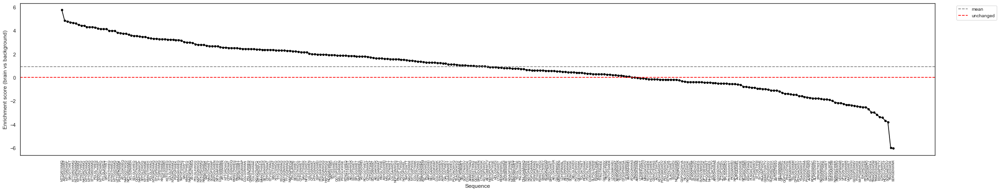

In [90]:
sns.set_style("white")

fig=plt.figure(figsize=(35, 6))
ax=fig.add_subplot(111)

x = enrich_score_1_sort['AA_seq']
y = enrich_score_1_sort['Enrichment']

ax.scatter(x, y, s=15.0, color='black')
ax.plot(x, y, color='black')
ax.axhline(y.mean(), linestyle='--', color='gray', label = 'mean')
ax.axhline(0, linestyle='--', color='red', label = 'unchanged')
#ax.axvspan('R*NGTVWEQ', 'NTTGRYWMQ', color = "blue")
#ax.set_title(f'{title}')
ax.set_xlabel('Sequence')
ax.set_ylabel('Enrichment score (brain vs background)')
plt.xticks(rotation=90, fontsize=7)
ax.legend(bbox_to_anchor=(1.07, 1), fontsize=10)
#plt.ylim(0, y.max() + 1)

plt.savefig('A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_AA_Seq_Enrichment_1.png', bbox_inches='tight')
plt.show()

In [783]:
pd.set_option('display.max_rows', None)
brain_seq1

,AA_seq,Enrichment,AA_seq_ID,cluster
0,R*NGTVWEQ,7.594491,AA_seq_5081336,0
1,RSNGTVWEP,6.821262,AA_seq_5293224,0
2,QGTGTNWAP,6.60154,AA_seq_4791680,0
3,KNNGTHWEP,6.503753,AA_seq_2735075,9
4,TAWGTHWET,6.35493,AA_seq_6179943,0
5,PGNGTNWAP,6.057954,AA_seq_4240153,0
6,QGHGTNWAP,5.671081,AA_seq_4766998,0
7,SAVGTCWET,5.243762,AA_seq_5421671,6
8,RSNGPVWEQ,5.129657,AA_seq_5292005,0
9,RTNGTVWEQ,5.100502,AA_seq_5321982,9


In [91]:
# brain-specific ---
nucl = pd.DataFrame()
seqs = brain_rep2['AA_seq']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_cnt = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    F = col_list.count('F') / total
    L = col_list.count('L') / total
    I = col_list.count('I') / total
    V = col_list.count('V') / total
    S = col_list.count('S') / total
    
    P = col_list.count('P') / total
    T = col_list.count('T') / total
    A = col_list.count('A') / total
    Y = col_list.count('Y') / total
    H = col_list.count('H') / total
    
    Q = col_list.count('Q') / total
    N = col_list.count('N') / total
    K = col_list.count('K') / total
    D = col_list.count('D') / total
    E = col_list.count('E') / total
    
    C = col_list.count('C') / total
    W = col_list.count('W') / total
    R = col_list.count('R') / total
    G = col_list.count('G') / total
    M = col_list.count('M') / total
    a = col_list.count('*') / total
    
    freq = pd.Series(
        [
            F, L, I, V, S,
            P, T, A, Y, H, 
            Q, N, K, D, E,
            C, W, R, G, M, a
        ]
    )
    pos_cnt = pos_cnt.append(freq, ignore_index=True)

pos_cnt.columns = [
    'F', 'L', 'I', 'V', 'S',
    'P', 'T', 'A', 'Y', 'H', 
    'Q', 'N', 'K', 'D', 'E',
    'C', 'W', 'R', 'G', 'M', '*'
]
pos_cnt.index += 1

brain_aa_freq = pos_cnt

In [92]:
brain_seq_2 = {}
for seq in brain_rep2['AA_seq']:
    total = sum([ np.log2(brain_aa_freq.loc[i, nucl] / all_aa_freq.loc[i, nucl]) for i, nucl in enumerate(seq, 1)])
    brain_seq_2[seq] = total

In [93]:
enrich_score_2 = pd.DataFrame([brain_seq_2.keys(), brain_seq_2.values()]).T
enrich_score_2.columns = ['AA_seq', 'Enrichment']
enrich_score_2_sort = enrich_score_2.sort_values('Enrichment', ascending=False)

In [94]:
enrich_score_2_sort

,AA_seq,Enrichment
222,NTTGRDWMH,6.552272
18,NTTGRDWKQ,5.92264
111,NTPGRDWMQ,5.839207
204,NATGRDWMQ,5.561116
128,R*NGTVWEQ,5.483969
...,...,...
186,PEDGIAWSR,-3.066292
118,LQNGSQWTV,-3.130711
225,ESRGADWSR,-3.464775
200,GTAGNSWSI,-3.620443


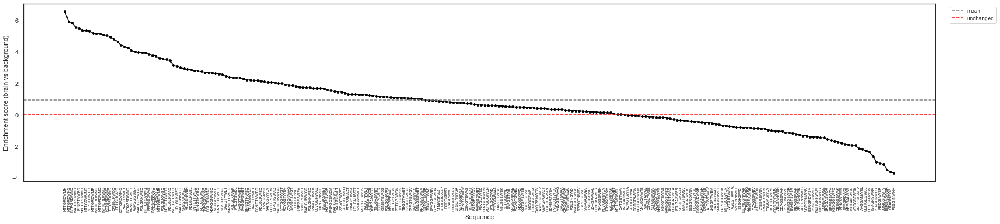

In [95]:
sns.set_style("white")

fig=plt.figure(figsize=(30, 6))
ax=fig.add_subplot(111)

x = enrich_score_2_sort['AA_seq']
y = enrich_score_2_sort['Enrichment']

ax.scatter(x, y, s=15.0, color='black')
ax.plot(x, y, color='black')
ax.axhline(y.mean(), linestyle='--', color='gray', label = 'mean')
ax.axhline(0, linestyle='--', color='red', label = 'unchanged')
#ax.axvspan('R*NGTVWEQ', 'NTTGRYWMQ', color = "blue")
#ax.set_title(f'{title}')
ax.set_xlabel('Sequence')
ax.set_ylabel('Enrichment score (brain vs background)')
plt.xticks(rotation=90, fontsize=7)
ax.legend(bbox_to_anchor=(1.07, 1), fontsize=10)
#plt.ylim(0, y.max() + 1)
plt.savefig('A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_AA_Seq_Enrichment_2.png', bbox_inches='tight')
plt.show()

In [97]:
brain_rep1_info = brain_rep1.loc[:, ['AA_seq', 'AA_seq_ID', 'cluster']]
brain_rep2_info = brain_rep2.loc[:, ['AA_seq', 'AA_seq_ID', 'cluster']]

brain_seq1 = pd.merge(enrich_score_1_sort, brain_rep1_info, how='left', on='AA_seq')
brain_seq2 = pd.merge(enrich_score_2_sort, brain_rep2_info, how='left', on='AA_seq')

outfile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_AA_Seq_Enrichment.xlsx'
with pd.ExcelWriter(outfile) as writer:
    brain_seq1.to_excel(writer, sheet_name='100-131', index=False)
    brain_seq2.to_excel(writer, sheet_name='200-231', index=False)

In [779]:
pd.set_option('display.max_rows', None)
brain_seq1

,AA_seq,Enrichment,AA_seq_ID,cluster
0,R*NGTVWEQ,7.594491,AA_seq_5081336,0
1,RSNGTVWEP,6.821262,AA_seq_5293224,0
2,QGTGTNWAP,6.60154,AA_seq_4791680,0
3,KNNGTHWEP,6.503753,AA_seq_2735075,9
4,TAWGTHWET,6.35493,AA_seq_6179943,0
5,PGNGTNWAP,6.057954,AA_seq_4240153,0
6,QGHGTNWAP,5.671081,AA_seq_4766998,0
7,SAVGTCWET,5.243762,AA_seq_5421671,6
8,RSNGPVWEQ,5.129657,AA_seq_5292005,0
9,RTNGTVWEQ,5.100502,AA_seq_5321982,9


In [780]:
pd.set_option('display.max_rows', None)
brain_seq2

,AA_seq,Enrichment,AA_seq_ID,cluster
0,NTTGRDWMH,7.817321,AA_seq_3985836,6
1,NTTGRDWKQ,7.201054,AA_seq_3985806,2
2,NTTGRDWMP,6.232358,AA_seq_3985842,3
3,ASPGGGWEF,5.543952,AA_seq_540734,1
4,NSTGRDWMQ,5.506299,AA_seq_3924575,4
5,NTTGPDWMQ,5.484589,AA_seq_3983908,0
6,PFPGSDWAS,5.39356,AA_seq_4208588,2
7,NTKGRDWMQ,5.355926,AA_seq_3952319,6
8,KTTGRDWMQ,5.348219,AA_seq_2857095,6
9,NAPGRNWGQ,5.172073,AA_seq_3496118,0


In [98]:
infile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_AA_Seq_Enrichment.xlsx'
rep1_e = pd.read_excel(infile, sheet_name='100-131')
rep2_e = pd.read_excel(infile, sheet_name='200-231')

In [308]:
rep1_e

,AA_seq,Enrichment,AA_seq_ID,cluster
0,R*NGTVWEQ,7.838298,AA_seq_5081336,0
1,KNNGTHWEP,6.509814,AA_seq_2735075,9
2,PGNGTNWAP,6.064807,AA_seq_4240153,0
3,QGHGTNWAP,5.784848,AA_seq_4766998,0
4,KTNGTHWEQ,5.346408,AA_seq_2846102,0
5,SAVGTCWET,5.243306,AA_seq_5421671,6
6,NTTGRDWRQ,5.169457,AA_seq_3985915,0
7,KNTGTHWEQ,5.103113,AA_seq_2743945,0
8,NTTGRYWMQ,5.067415,AA_seq_3987328,0
9,NAPGQNWGP,5.042381,AA_seq_3495379,0


In [99]:
rep1_scale

,AA_seq_ID,AA_seq,Header_ID,cluster_x,Brain-1#1,Brain-2#1,Brain-3#1,Brain-4#1,Brain-4_Cerebellum#1,Brain-5#1,...,Cervical spinal cord#1,Thoracic spinal cord#1,Lumber spinal cord#1,DRG#1,Lung#1,Liver#1,Kidney#1,Pancreas#1,Spleen#1,cluster_y
0,AA_seq_221747,AELGAHWSK,"Seq_7270215,Seq_7488829,Seq_7501524,Seq_750175...",0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
1,AA_seq_2937235,LDLGKTWTV,"Seq_5652151,Seq_5665572,Seq_5787656,Seq_578771...",0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
2,AA_seq_5040467,QTTGSNWAT,"Seq_3543548,Seq_3547289,Seq_3549036,Seq_354987...",0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
3,AA_seq_5081336,R*NGTVWEQ,"Seq_5350286,Seq_5350290,Seq_5479459,Seq_547947...",0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
4,AA_seq_2857095,KTTGRDWMQ,"Seq_4045,Seq_4050,Seq_4149,Seq_4151,Seq_4179,S...",0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,4.248529,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,AA_seq_5689217,SLPGLQWEM,"Seq_9553951,Seq_9553980,Seq_9953299,Seq_995383...",13,1.468693,1.224817,-0.564588,-0.564588,-0.564588,-0.564588,...,1.877112,-0.532267,0.246374,-0.564588,-0.564588,-0.564588,-0.564588,-0.564588,-0.564588,13
296,AA_seq_4127017,PDLGLKWAQ,"Seq_4732661,Seq_4737015,Seq_4737222,Seq_473741...",13,-0.406935,2.373655,-0.406935,-0.406935,-0.406935,1.936259,...,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,-0.406935,13
297,AA_seq_3660120,NHSGPNWES,"Seq_804220,Seq_804222,Seq_804300,Seq_804302,Se...",13,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,...,-0.274002,-0.274002,0.216748,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,-0.274002,13
298,AA_seq_6889090,VDHGPAWAR,"Seq_8715393,Seq_8715394,Seq_8715396,Seq_889742...",13,0.213938,-0.292424,-0.292424,-0.292424,-0.292424,-0.292424,...,-0.292424,-0.292424,0.112665,0.163302,-0.292424,-0.292424,-0.292424,-0.292424,-0.292424,13


In [100]:
rep1_merge = pd.merge(rep1_e, rep1_scale, on='AA_seq_ID', how='left')

In [101]:
rep1_merge_sort = rep1_merge.sort_values(by=['cluster_x', 'Enrichment'], ascending=[True, False]).drop('cluster_y', axis=1)
rep1_merge_sort.shape

(300, 27)

In [118]:
pd.set_option('display.max_rows', None)
rep1_merge_sort

,AA_seq_x,Enrichment,AA_seq_ID,cluster,AA_seq_y,Header_ID,cluster_x,Brain-1#1,Brain-2#1,Brain-3#1,...,Optic nerve#1,Cervical spinal cord#1,Thoracic spinal cord#1,Lumber spinal cord#1,DRG#1,Lung#1,Liver#1,Kidney#1,Pancreas#1,Spleen#1
0,NTTGRYWMQ,5.768576,AA_seq_3987328,0,NTTGRYWMQ,"Seq_562398,Seq_562807,Seq_563752,Seq_568237,Se...",0,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
4,KTTGRDWMQ,4.668470,AA_seq_2857095,0,KTTGRDWMQ,"Seq_4045,Seq_4050,Seq_4149,Seq_4151,Seq_4179,S...",0,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
5,NTTGRGWMQ,4.632693,AA_seq_3986354,0,NTTGRGWMQ,"Seq_562397,Seq_562613,Seq_562657,Seq_562660,Se...",0,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
7,R*NGTVWEQ,4.440919,AA_seq_5081336,0,R*NGTVWEQ,"Seq_5350286,Seq_5350290,Seq_5479459,Seq_547947...",0,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
10,NTTGRAWMQ,4.315404,AA_seq_3985574,0,NTTGRAWMQ,"Seq_34586,Seq_562656,Seq_562785,Seq_563748,Seq...",0,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
14,NTTGRDWRQ,4.145479,AA_seq_3985915,0,NTTGRDWRQ,"Seq_34582,Seq_562638,Seq_562733,Seq_563057,Seq...",0,-0.257844,-0.257844,-0.257844,...,-0.257844,-0.257844,-0.257844,-0.257844,0.445367,-0.257844,-0.257844,-0.257844,-0.257844,-0.257844
17,KTNGTHWEQ,4.000201,AA_seq_2846102,0,KTNGTHWEQ,"Seq_84416,Seq_84419,Seq_103957,Seq_104078,Seq_...",0,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
21,PGNGTNWAP,3.804678,AA_seq_4240153,0,PGNGTNWAP,"Seq_4806972,Seq_4806973,Seq_4807019,Seq_482770...",0,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
24,NPTGRDWMQ,3.661135,AA_seq_3815976,0,NPTGRDWMQ,"Seq_809885,Seq_809915,Seq_810253,Seq_812967,Se...",0,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
27,QGHGTNWAP,3.556899,AA_seq_4766998,0,QGHGTNWAP,"Seq_3909212,Seq_3921236,Seq_3921240,Seq_392124...",0,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607


In [119]:
palette = sns.hls_palette(13, l=0.8, s=1)
for i in palette:
    print(i)

(1.0, 0.6240000000000001, 0.6000000000000001)
(1.0, 0.8086153846153846, 0.6000000000000001)
(1.0, 0.9932307692307693, 0.6000000000000001)
(0.8221538461538461, 1.0, 0.6000000000000001)
(0.6375384615384616, 1.0, 0.6000000000000001)
(0.6000000000000001, 1.0, 0.7470769230769232)
(0.6000000000000001, 1.0, 0.9316923076923078)
(0.6000000000000001, 0.8836923076923074, 1.0)
(0.6000000000000001, 0.6990769230769229, 1.0)
(0.6855384615384614, 0.6000000000000001, 1.0)
(0.8701538461538464, 0.6000000000000001, 1.0)
(1.0, 0.6000000000000001, 0.9452307692307687)
(1.0, 0.6000000000000001, 0.7606153846153842)


In [104]:
sns.hls_palette(14, l=0.8, s=1)

[(1.0, 0.6240000000000001, 0.6000000000000001),
 (1.0, 0.7954285714285715, 0.6000000000000001),
 (1.0, 0.9668571428571429, 0.6000000000000001),
 (0.8617142857142858, 1.0, 0.6000000000000001),
 (0.6902857142857142, 1.0, 0.6000000000000001),
 (0.6000000000000001, 1.0, 0.6811428571428572),
 (0.6000000000000001, 1.0, 0.8525714285714286),
 (0.6000000000000001, 0.9759999999999999, 1.0),
 (0.6000000000000001, 0.8045714285714286, 1.0),
 (0.6000000000000001, 0.6331428571428572, 1.0),
 (0.738285714285714, 0.6000000000000001, 1.0),
 (0.9097142857142858, 0.6000000000000001, 1.0),
 (1.0, 0.6000000000000001, 0.9188571428571429),
 (1.0, 0.6000000000000001, 0.7474285714285717)]

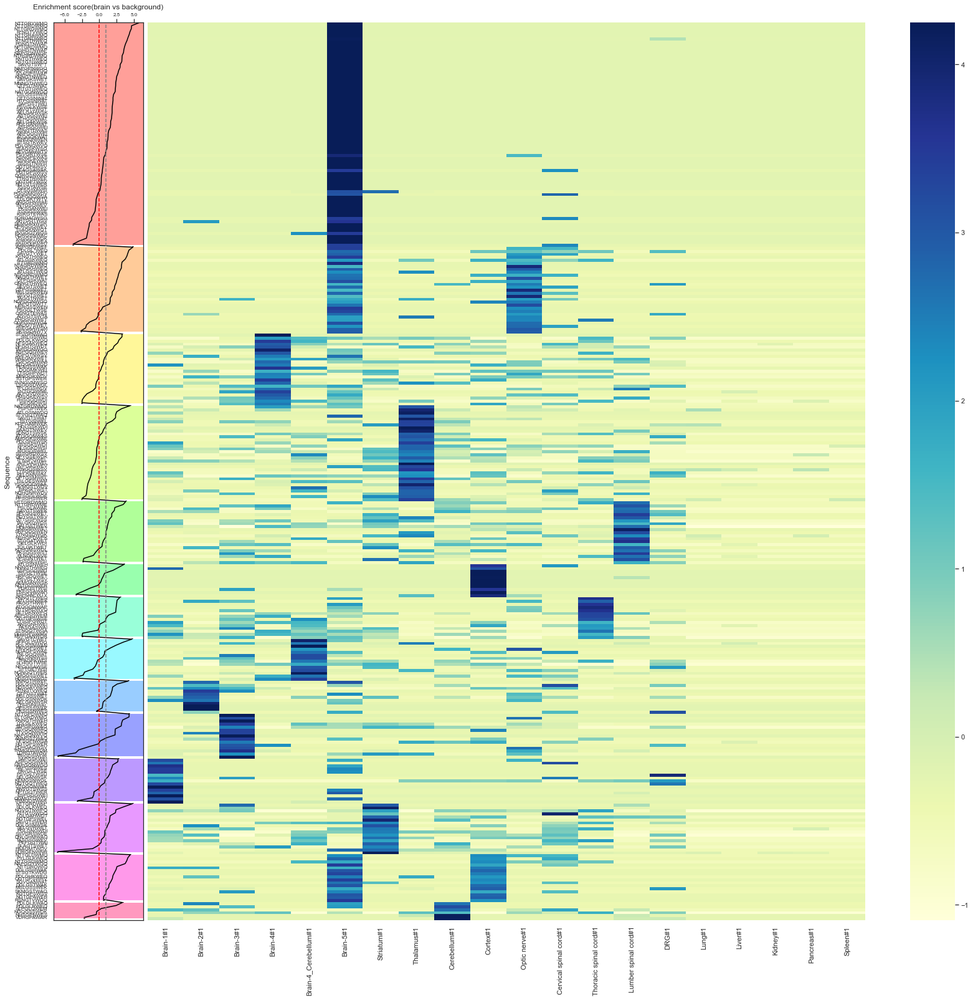

In [122]:
# Enrichment + freq pattern(rep1)

left  = 0.1 #散布図の左余白と、幅を定義
bottom = 0.1  #散布図の下余白と、高さを定義
spacing = 0.01 #散布図とヒストグラムの間隔
width = 0.2
height = 2

fig_histy = [left, bottom, width, height] #左の散布図の定義
fig_heatmap = [left + width + spacing, bottom, 2, height] #右のヒートマップの定義

fig = plt.figure(figsize=(10, 10)) #描写領域を正方形で生成

ax = fig.add_axes(fig_heatmap) #ヒートマップ図領域を生成
ax.tick_params(labelleft=False) #y軸ラベル無し

ax_histy = fig.add_axes(fig_histy, sharey=ax) #左の散布図領域を生成
ax_histy.tick_params(top=True, bottom=False, labeltop=True, labelbottom=False) #x軸ラベル上に変更

y = rep1_merge_sort['AA_seq_x']
x = rep1_merge_sort['Enrichment']
z = rep1_merge_sort.iloc[:, 7:]

sns.heatmap(z, cmap='YlGnBu', yticklabels=False, ax=ax)

ax_histy.scatter(x, y, color='black', s=4.0)
ax_histy.plot(x, y, color='black')
ax_histy.axvline(x=0, linestyle='--', color='red')
ax_histy.axvline(x=x.mean(), linestyle='--', color='gray')

ax_histy.axhspan('NTTGRYWMQ', 'SQRGAEWSV', color=(1.0, 0.6240000000000001, 0.6000000000000001))
ax_histy.axhspan('ASPGGGWEF', 'SKSGDAWTV', color=(1.0, 0.7954285714285715, 0.6000000000000001))
ax_histy.axhspan('STVGPNWAQ', 'ISKGNDWSI', color=(1.0, 0.9668571428571429, 0.6000000000000001))
ax_histy.axhspan('NATGRDWMQ', 'PPSGHSWER', color=(0.8617142857142858, 1.0, 0.6000000000000001))
ax_histy.axhspan('HTTGRDWMQ', 'TGSGESWSI', color=(0.6902857142857142, 1.0, 0.6000000000000001))
ax_histy.axhspan('ATLGSNWEH', 'ESHGAPWTV', color=(0.6000000000000001, 1.0, 0.6811428571428572))
ax_histy.axhspan('KNNGTPWEQ', 'MVPGANWDR', color=(0.6000000000000001, 1.0, 0.8525714285714286))
ax_histy.axhspan('SAVGTCWET', 'HDSGVQWQT', color=(0.6000000000000001, 0.9759999999999999, 1.0))
ax_histy.axhspan('KNNGTHWEP', 'PKSGSNWES', color=(0.6000000000000001, 0.8045714285714286, 1.0))
ax_histy.axhspan('NTTGPDWMQ', 'TRIGDSWDR', color=(0.6000000000000001, 0.6331428571428572, 1.0))
ax_histy.axhspan('SAPGSKWEI', 'TRMGDSWAR', color=(0.738285714285714, 0.6000000000000001, 1.0))
ax_histy.axhspan('NTTGRDWM*', 'SDRGENWNR', color=(0.9097142857142858, 0.6000000000000001, 1.0))
ax_histy.axhspan('NTTGLDWMQ', 'RSNGTVWDQ', color=(1.0, 0.6000000000000001, 0.9188571428571429))
ax_histy.axhspan('PDLGLKWAQ', 'VDHGPAWAR', color=(1.0, 0.6000000000000001, 0.7474285714285717))


ax_histy.set_title('Enrichment score(brain vs background)')
ax_histy.set_ylabel('Sequence')

#ax.legend(
#   bbox_to_anchor=(1.3, 1.4),
#    loc='upper right',
#        #borderaxespad=0,
#        fontsize=8
#)

plt.tick_params(labelsize=8)

#plt.savefig('test.png', bbox_inches='tight')
plt.savefig('A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_High_norm_with_enrich_1.png', bbox_inches='tight')
plt.show()

In [120]:
rep2_merge = pd.merge(rep2_e, rep2_scale, on='AA_seq_ID', how='left')
rep2_merge_sort = rep2_merge.sort_values(by=['cluster_x', 'Enrichment'], ascending=[True, False]).drop('cluster_y', axis=1)
rep2_merge_sort.shape

(238, 29)

In [121]:
pd.set_option('display.max_rows', None)
rep2_merge_sort

,AA_seq_x,Enrichment,AA_seq_ID,cluster,AA_seq_y,Header_ID,cluster_x,Brain-1#2,Brain-2#2,Brain-3#2,...,Thoracic spinal cord#2,Lumber spinal cord#2,DRG#2,Heart#2,Lung#2,Liver#2,Kidney#2,Pancreas#2,Muscle#2,Spleen#2
1,NTTGRDWKQ,5.922640,AA_seq_3985806,0,NTTGRDWKQ,"Seq_562401,Seq_562604,Seq_562635,Seq_562724,Se...",0,-0.213201,-0.213201,-0.213201,...,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201
23,HTTGRDWMQ,3.944627,AA_seq_2314124,0,HTTGRDWMQ,"Seq_4118626,Seq_4118660,Seq_4118984,Seq_412116...",0,-0.492426,2.124017,-0.492426,...,-0.492426,1.886158,-0.492426,-0.492426,-0.492426,-0.492426,-0.492426,-0.492426,-0.492426,-0.492426
24,PFPGSDWAS,3.848805,AA_seq_4208588,0,PFPGSDWAS,"Seq_4442364,Seq_4447672,Seq_4948553,Seq_494866...",0,-0.555641,0.399031,-0.627421,...,-0.627421,-0.591531,0.262649,-0.627421,0.172924,0.061665,-0.627421,-0.627421,0.416976,0.176513
26,NTTGRDWIQ,3.752715,AA_seq_3985789,0,NTTGRDWIQ,"Seq_562395,Seq_562516,Seq_562606,Seq_562609,Se...",0,-0.213201,-0.213201,-0.213201,...,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201
27,NTTGRDWMR,3.604739,AA_seq_3985844,0,NTTGRDWMR,"Seq_562644,Seq_562742,Seq_562748,Seq_563742,Se...",0,-0.213201,-0.213201,-0.213201,...,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201,-0.213201
49,PTLGTSWDL,2.343880,AA_seq_4573303,0,PTLGTSWDL,"Seq_4433767,Seq_4443086,Seq_4490706,Seq_450015...",0,-0.492149,-0.492149,2.189550,...,2.290035,-0.492149,-0.492149,-0.492149,-0.492149,-0.492149,-0.492149,-0.492149,-0.492149,-0.492149
58,NAPGSVWEV,2.075475,AA_seq_3496637,0,NAPGSVWEV,"Seq_38286,Seq_1004204,Seq_1004206,Seq_1004676,...",0,0.099684,-0.533443,-0.501113,...,2.952796,0.010777,-0.156261,-0.533443,-0.533443,-0.533443,-0.533443,-0.533443,-0.533443,-0.533443
62,NTTGGPWGT,2.007031,AA_seq_3981004,0,NTTGGPWGT,"Seq_34428,Seq_562844,Seq_563758,Seq_567627,Seq...",0,-0.430202,-0.464905,0.277723,...,1.203116,1.166100,-0.464905,-0.464905,-0.464905,-0.464905,-0.464905,-0.464905,-0.464905,-0.464905
63,RDYGSTWEV,1.923805,AA_seq_5141528,0,RDYGSTWEV,"Seq_2455052,Seq_2455058,Seq_5346479,Seq_536290...",0,-0.458958,0.211991,-0.458958,...,-0.402654,0.455972,-0.458958,-0.458958,-0.458958,-0.458958,-0.458958,-0.458958,-0.458958,-0.458958
68,SSVGPGWDT,1.740479,AA_seq_5965653,0,SSVGPGWDT,"Seq_2820805,Seq_9553315,Seq_9553317,Seq_955331...",0,-0.611885,-0.127612,-0.635881,...,0.077440,1.565162,0.323939,-0.662058,-0.662058,0.022905,-0.662058,0.332665,-0.662058,0.241046


In [86]:
palette = sns.hls_palette(9, l=0.8, s=1)
for i in palette:
    print(i)

(1.0, 0.6240000000000001, 0.6000000000000001)
(1.0, 0.8906666666666667, 0.6000000000000001)
(0.8426666666666666, 1.0, 0.6000000000000001)
(0.6000000000000001, 1.0, 0.6240000000000001)
(0.6000000000000001, 1.0, 0.8906666666666667)
(0.6000000000000001, 0.8426666666666666, 1.0)
(0.6240000000000001, 0.6000000000000001, 1.0)
(0.8906666666666663, 0.6000000000000001, 1.0)
(1.0, 0.6000000000000001, 0.8426666666666666)


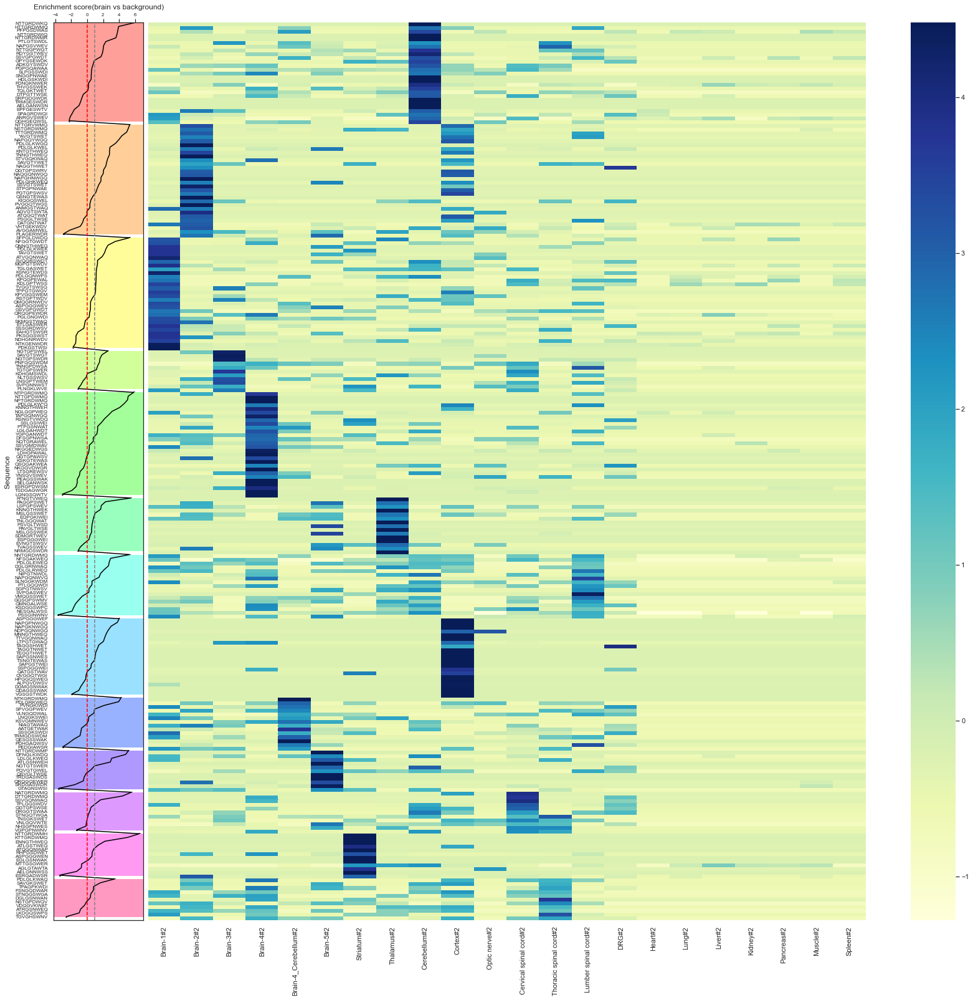

In [123]:
# Enrichment + freq pattern(rep2)

left  = 0.1 #散布図の左余白と、幅を定義
bottom = 0.1  #散布図の下余白と、高さを定義
spacing = 0.01 #散布図とヒストグラムの間隔
width = 0.2
height = 2

fig_histy = [left, bottom, width, height] #左の散布図の定義
fig_heatmap = [left + width + spacing, bottom, 2, height] #右のヒートマップの定義

fig = plt.figure(figsize=(10, 10)) #描写領域を正方形で生成

ax = fig.add_axes(fig_heatmap) #ヒートマップ図領域を生成
ax.tick_params(labelleft=False) #y軸ラベル無し

ax_histy = fig.add_axes(fig_histy, sharey=ax) #左の散布図領域を生成
ax_histy.tick_params(top=True, bottom=False, labeltop=True, labelbottom=False) #x軸ラベル上に変更

y = rep2_merge_sort['AA_seq_x']
x = rep2_merge_sort['Enrichment']
z = rep2_merge_sort.iloc[:, 7:]

sns.heatmap(z, cmap='YlGnBu', yticklabels=False, ax=ax)

ax_histy.scatter(x, y, color='black', s=4.0)
ax_histy.plot(x, y, color='black')
ax_histy.axvline(x=0, linestyle='--', color='red')
ax_histy.axvline(x=x.mean(), linestyle='--', color='gray')

ax_histy.axhspan('NTTGRDWKQ', 'QGHGEQWSL', color=(1.0, 0.6240000000000001, 0.6000000000000001))
ax_histy.axhspan('NTTGRVWMQ', 'PLAGERWDR', color=(1.0, 0.8086153846153846, 0.6000000000000001))
ax_histy.axhspan('SFPGLDWDQ', 'PDKGSTWSI', color=(1.0, 0.9932307692307693, 0.6000000000000001))
ax_histy.axhspan('NGTGPSWEL', 'PLNGKLWVE', color=(0.8221538461538461, 1.0, 0.6000000000000001))
ax_histy.axhspan('NTPGRDWMQ', 'LQNGSQWTV', color=(0.6375384615384616, 1.0, 0.6000000000000001))
ax_histy.axhspan('R*NGTVWEQ', 'NRMGDSWDR', color=(0.6000000000000001, 1.0, 0.7470769230769232))
ax_histy.axhspan('NNTGRDWMQ', 'PSSGINWNV', color=(0.6000000000000001, 1.0, 0.9316923076923078))
ax_histy.axhspan('ASPGGGWEF', 'VGSGSTWDK', color=(0.6000000000000001, 0.8836923076923074, 1.0))
ax_histy.axhspan('NTKGRDWMQ', 'PEDGIAWSR', color=(0.6000000000000001, 0.6990769230769229, 1.0))
ax_histy.axhspan('NTTGRDWMP', 'GTAGNSWSI', color=(0.6855384615384614, 0.6000000000000001, 1.0))
ax_histy.axhspan('NATGRDWMQ', 'VGPGPNWNV', color=(0.8701538461538464, 0.6000000000000001, 1.0))
ax_histy.axhspan('NTTGRDWMH', 'ESRGADWSR', color=(1.0, 0.6000000000000001, 0.9452307692307687))
ax_histy.axhspan('PDLGLKWAQ', 'TGVGHSWNV', color=(1.0, 0.6000000000000001, 0.7606153846153842))


ax_histy.set_title('Enrichment score(brain vs background)')
ax_histy.set_ylabel('Sequence')

#ax.legend(
#   bbox_to_anchor=(1.3, 1.4),
#    loc='upper right',
#        #borderaxespad=0,
#        fontsize=8
#)

plt.tick_params(labelsize=8)

#plt.savefig('test.png', bbox_inches='tight')
plt.savefig('A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_High_norm_with_enrich_2.png', bbox_inches='tight')
plt.show()

In [110]:
rep1_merge_drop = rep1_merge_sort.drop(['AA_seq_y', 'cluster_x'], axis=1)
info = ['AA_seq_ID', 'AA_seq_x', 'Header_ID', 'Enrichment', 'cluster']
sample = rep1_merge_drop.iloc[:, 5:].columns.values.tolist()
col = info + sample
tmp_df = rep1_merge_drop.loc[:, col]
rep1_merge_xlsx = tmp_df.rename(columns={'AA_seq_x': 'AA_seq'})

rep2_merge_drop = rep2_merge_sort.drop(['AA_seq_y', 'cluster_x'], axis=1)
info = ['AA_seq_ID', 'AA_seq_x', 'Header_ID', 'Enrichment', 'cluster']
sample = rep2_merge_drop.iloc[:, 5:].columns.values.tolist()
col = info + sample
tmp_df = rep2_merge_drop.loc[:, col]
rep2_merge_xlsx = tmp_df.rename(columns={'AA_seq_x': 'AA_seq'})

In [111]:
rep1_merge_xlsx

,AA_seq_ID,AA_seq,Header_ID,Enrichment,cluster,Brain-1#1,Brain-2#1,Brain-3#1,Brain-4#1,Brain-4_Cerebellum#1,...,Optic nerve#1,Cervical spinal cord#1,Thoracic spinal cord#1,Lumber spinal cord#1,DRG#1,Lung#1,Liver#1,Kidney#1,Pancreas#1,Spleen#1
0,AA_seq_3987328,NTTGRYWMQ,"Seq_562398,Seq_562807,Seq_563752,Seq_568237,Se...",5.768576,0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
4,AA_seq_2857095,KTTGRDWMQ,"Seq_4045,Seq_4050,Seq_4149,Seq_4151,Seq_4179,S...",4.668470,0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
5,AA_seq_3986354,NTTGRGWMQ,"Seq_562397,Seq_562613,Seq_562657,Seq_562660,Se...",4.632693,0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
7,AA_seq_5081336,R*NGTVWEQ,"Seq_5350286,Seq_5350290,Seq_5479459,Seq_547947...",4.440919,0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
10,AA_seq_3985574,NTTGRAWMQ,"Seq_34586,Seq_562656,Seq_562785,Seq_563748,Seq...",4.315404,0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
14,AA_seq_3985915,NTTGRDWRQ,"Seq_34582,Seq_562638,Seq_562733,Seq_563057,Seq...",4.145479,0,-0.257844,-0.257844,-0.257844,-0.257844,-0.257844,...,-0.257844,-0.257844,-0.257844,-0.257844,0.445367,-0.257844,-0.257844,-0.257844,-0.257844,-0.257844
17,AA_seq_2846102,KTNGTHWEQ,"Seq_84416,Seq_84419,Seq_103957,Seq_104078,Seq_...",4.000201,0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
21,AA_seq_4240153,PGNGTNWAP,"Seq_4806972,Seq_4806973,Seq_4807019,Seq_482770...",3.804678,0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
24,AA_seq_3815976,NPTGRDWMQ,"Seq_809885,Seq_809915,Seq_810253,Seq_812967,Se...",3.661135,0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607
27,AA_seq_4766998,QGHGTNWAP,"Seq_3909212,Seq_3921236,Seq_3921240,Seq_392124...",3.556899,0,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,...,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607,-0.223607


In [112]:
outfile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_High_norm_with_enrich.xlsx'
with pd.ExcelWriter(outfile) as writer:
    rep1_merge_xlsx.to_excel(writer, sheet_name='100-131', index=False)
    rep2_merge_xlsx.to_excel(writer, sheet_name='200-231', index=False)

In [115]:
file = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
rep1_sel = pd.read_excel(file, sheet_name='100-131')
rep2_sel = pd.read_excel(file, sheet_name='200-231')

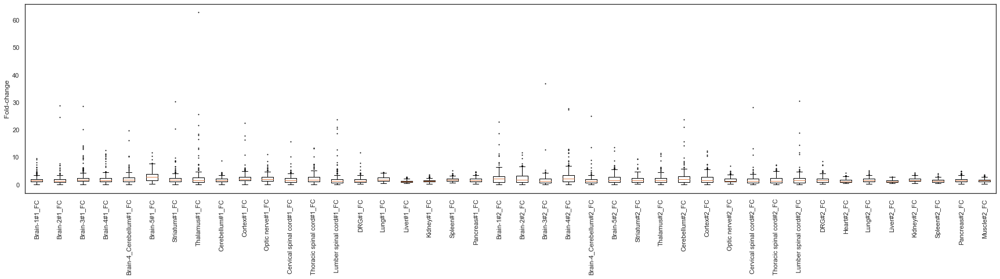

In [116]:
# FC値の変動幅 ---
sns.set_style("white")
rep1_columns = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC',
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC',
    'DRG#1_FC',
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Spleen#1_FC',
    'Pancreas#1_FC'
]

rep2_columns = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC',
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC',
    'DRG#2_FC',
    'Heart#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Spleen#2_FC',
    'Pancreas#2_FC',
    'Muscle#2_FC'
]

rep1_mod = rep1_sel.loc[:, rep1_columns]
rep2_mod = rep2_sel.loc[:, rep2_columns]
val1 = []
for i in range(len(rep1_mod.columns)):
    data = rep1_mod.iloc[:, i]
    val1.append(data)
val2 = []
for i in range(len(rep2_mod.columns)):
    data = rep2_mod.iloc[:, i]
    val2.append(data)

plt.figure(figsize=(30, 6))
flierprops = dict(markersize=1)
val12 = val1 + val2
label = rep1_columns + rep2_columns
plt.boxplot(val12, labels=label, flierprops=flierprops)
plt.xticks(rotation=90)
plt.ylabel('Fold-change')
plt.show()

### 前回と今回のDNA fragnementの比較

In [131]:
# 前回（220913）
file = 'A:/PROJECT/PG4699/600_NG/670_Nouhin/report_v02_220913/03_results/PG4699_Brain_High_Common_Consensus_frequency_nerve(DRG).xlsx'
before_1 = pd.read_excel(file, sheet_name='100-131')
dna_b1= before_1['Header_ID']
before_2 = pd.read_excel(file, sheet_name='200-231')
dna_b2= before_2['Header_ID']

print(len(dna_b1))
print(len(dna_b2))

dna_b1_list = dna_b1.to_list()
dna_b2_list = dna_b2.to_list()

92
66


In [128]:
dna_b1

0      Seq_7486878
1      Seq_4738532
2      Seq_7531902
3      Seq_4542598
4      Seq_3117150
5      Seq_9828750
6     Seq_10180795
7      Seq_5258311
8      Seq_5255799
9      Seq_5303391
10      Seq_161004
11     Seq_2190879
12    Seq_10285843
13    Seq_10280369
14    Seq_10018178
15     Seq_4736991
16       Seq_59947
17    Seq_10690405
18     Seq_3903935
19     Seq_1270375
20     Seq_1267521
21      Seq_546065
22     Seq_4911382
23     Seq_4739409
24     Seq_4876729
25     Seq_4989319
26     Seq_7496672
27    Seq_10167858
28     Seq_5175506
29     Seq_5221982
30     Seq_5223603
31     Seq_4791858
32     Seq_1067087
33     Seq_1429319
34     Seq_3948827
35     Seq_7761170
36     Seq_5976536
37     Seq_1034832
38     Seq_1239867
39     Seq_1148343
40     Seq_7943871
41      Seq_892707
42     Seq_9787160
43     Seq_4296546
44     Seq_9989540
45     Seq_9827936
46     Seq_9597000
47     Seq_8029382
48     Seq_4504735
49    Seq_10273097
50     Seq_8246047
51     Seq_8552813
52     Seq_8

In [126]:
# 今回（221024）
file = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
after_1 = pd.read_excel(file, sheet_name='100-131')
dna_a1 = after_1['Header_ID']
after_2 = pd.read_excel(file, sheet_name='200-231')
dna_a2 = after_2['Header_ID']

In [129]:
dna_a1_list = []
for seqs in dna_a1:
    for i in seqs.split(','):
        dna_a1_list.append(i)

dna_a2_list = []
for seqs in dna_a2:
    for i in seqs.split(','):
        dna_a2_list.append(i)

In [130]:
print(len(dna_a1_list))
print(len(dna_a2_list))

3442
2719


In [133]:
# 共通Seq
common_ID = list(set(dna_b1_list) & set(dna_a1_list))
print(len(common_ID))

19


In [134]:
common_ID = list(set(dna_b2_list) & set(dna_a2_list))
print(len(common_ID))

12


In [344]:
rep1_FC = rep12.loc[:, ['AA_seq_ID'] + rep1_columns]
rep2_FC = rep12.loc[:, ['AA_seq_ID'] + rep2_columns]

In [345]:
rep1_FC.head()

,AA_seq_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,Cortex#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC
0,AA_seq_8383,2.304348,2.956522,3.217391,3.043478,3.391304,4.869565,3.521739,3.130435,2.043478,4.217391,4.695652,6.869565,4.043478,2.826087,2.608696,4.043478,1.782609,2.260870,2.913043,3.652174
1,AA_seq_14623,0.164835,0.274725,0.329670,0.362637,0.362637,0.494505,0.406593,0.329670,0.296703,0.494505,0.351648,0.351648,0.340659,0.373626,0.483516,0.560440,1.406593,0.362637,1.428571,0.373626
2,AA_seq_103690,2.456213,1.618343,2.625444,2.032544,2.172781,1.550296,2.407692,1.569822,2.526036,2.306509,2.342012,2.020118,1.957396,3.098817,2.791124,3.156805,0.914793,1.691716,2.592308,3.284615
3,AA_seq_105617,2.958333,2.583333,3.416667,2.416667,3.041667,4.625000,3.916667,2.583333,3.541667,4.791667,4.625000,3.583333,3.416667,3.791667,4.250000,4.166667,1.250000,2.250000,3.791667,3.166667
4,AA_seq_115540,0.757785,1.150519,1.382353,0.231834,1.406574,0.949827,1.896194,0.025952,0.994810,1.833910,2.110727,1.214533,1.489619,0.967128,1.899654,1.685121,0.859862,1.266436,1.397924,2.766436


### 前回の手法で実施した場合

In [346]:
header1 = rep1_FC['AA_seq_ID']
rep1_FC_v = rep1_FC.iloc[:, 1:]

header2 = rep2_FC['AA_seq_ID']
rep2_FC_v = rep2_FC.iloc[:, 1:]

z_rep1 = st.zscore(rep1_FC_v, axis=1, ddof=1)
z_rep2 = st.zscore(rep2_FC_v, axis=1, ddof=1)
z_val = pd.DataFrame(z_rep1)
z_val.columns = rep1_columns
rep1_z = pd.concat([header1, z_val], axis=1)
z_val = pd.DataFrame(z_rep2)
z_val.columns = rep2_columns
rep2_z = pd.concat([header2, z_val], axis=1)
# 比較対象とはならない欠損値がある行、配列は調査外とする
rep1_z_mod = rep1_z.dropna().reset_index(drop=True)
rep2_z_mod = rep2_z.dropna().reset_index(drop=True)

In [350]:
brain_1 = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC'
]
nerve_1 = [
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC',
    'DRG#1_FC'
]
others_1 =[
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Spleen#1_FC',
    'Pancreas#1_FC'
]

brain_2 = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC'
]
nerve_2 = [
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC',
    'DRG#2_FC'
]
others_2 = [
    'Heart#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Spleen#2_FC',
    'Pancreas#2_FC',
    'Muscle#2_FC'
]

In [352]:
group_1 = pd.DataFrame()
for i in range(len(rep1_z_mod)):
    b = rep1_z_mod.loc[i, brain_1].mean()
    n = rep1_z_mod.loc[i, nerve_1].mean()
    o = rep1_z_mod.loc[i, others_1].mean()
    col = pd.Series([b, n, o])
    group_1 = group_1.append(col, ignore_index=True)

group_1.columns = ['Brain#1', 'Nerve#1', 'Others#1']
rep1_group = pd.concat([header1, group_1], axis=1)

In [353]:
group_2 = pd.DataFrame()
for i in range(len(rep2_z_mod)):
    b = rep2_z_mod.loc[i, brain_2].mean()
    n = rep2_z_mod.loc[i, nerve_2].mean()
    o = rep2_z_mod.loc[i, others_2].mean()
    col = pd.Series([b, n, o])
    group_2 = group_2.append(col, ignore_index=True)

group_2.columns = ['Brain#2', 'Nerve#2', 'Others#2']
rep2_group = pd.concat([header2, group_2], axis=1)

In [366]:
group_1_sel = rep1_group[(rep1_group['Brain#1'] > 0) & (rep1_group['Others#1'] < 0) & (rep1_group['Nerve#1'] < 0)]
group_2_sel = rep2_group[(rep2_group['Brain#2'] > 0)  & (rep2_group['Others#2'] < 0) & (rep2_group['Nerve#2'] < 0)]

In [368]:
print(group_1_sel.shape)
print(group_2_sel.shape)

(720, 4)
(715, 4)


In [369]:
group_1_sel.head()

,AA_seq_ID,Brain#1,Nerve#1,Others#1
8,AA_seq_127659,0.035895,-0.006745,-0.065045
11,AA_seq_138958,0.150096,-0.171200,-0.128993
14,AA_seq_148077,0.270191,-0.348247,-0.192136
15,AA_seq_159289,0.300646,-0.345152,-0.256141
20,AA_seq_171949,0.379764,-0.457665,-0.301864


In [371]:
idx_rep1 = sorted([rep1_z_mod[rep1_z_mod['AA_seq_ID'] == seqID].index[0] for seqID in group_1_sel['AA_seq_ID']])
rep1_sel = pd.concat([group_1_sel['AA_seq_ID'].reset_index(drop=True), rep1_z_mod.loc[idx_rep1, rep1_columns].reset_index(drop=True)], axis=1)
idx_rep2 = sorted([rep2_z_mod[rep2_z_mod['AA_seq_ID'] == seqID].index[0] for seqID in group_2_sel['AA_seq_ID']])
rep2_sel = pd.concat([group_2_sel['AA_seq_ID'].reset_index(drop=True), rep2_z_mod.loc[idx_rep2, rep2_columns].reset_index(drop=True)], axis=1)

In [372]:
rep1_sel

,AA_seq_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,Cortex#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC
0,AA_seq_127659,1.116365,-0.292943,-0.892803,-0.895212,-0.642259,-0.801258,0.964593,2.236584,-0.114672,-0.319443,-1.307163,-1.283072,1.347636,-0.348352,1.557225,0.106963,-0.712122,-0.295352,-2.013985e-01,0.776685
1,AA_seq_138958,-0.404239,-1.165461,0.838588,-0.785604,0.331358,-0.078647,-0.710235,-0.144971,2.091967,1.528210,-1.142097,-0.166828,1.954042,-1.182042,-0.319073,0.725535,-1.010956,-0.732846,1.866502e-01,0.186650
2,AA_seq_148077,-0.894634,-0.804570,3.383398,1.432015,-0.459326,0.726515,0.576408,-0.414294,-0.699496,-0.144102,0.096068,-0.444315,-0.219155,-0.939666,-0.234166,0.456323,-0.834591,-0.294208,-3.392404e-01,0.051036
3,AA_seq_159289,0.142066,0.704240,0.659735,1.566241,-1.176701,-0.267853,2.294725,0.010892,-0.143706,-0.783179,0.783882,-0.235059,-1.631125,-1.621755,0.978300,-0.176499,-1.005706,-0.019559,-4.107385e-01,0.331800
4,AA_seq_171949,1.372994,-0.769266,-0.379764,0.593990,-0.379764,0.983492,0.399239,-0.185013,0.593990,1.567745,-0.379764,-0.379764,0.983492,-1.937772,-0.574515,0.399239,-1.743021,-1.548270,7.887414e-01,0.593990
5,AA_seq_173956,-0.415835,0.534517,-0.696925,-0.058895,0.891457,1.208241,-0.616613,2.957246,-0.134745,-0.750466,0.351586,-1.107406,0.538979,0.775452,-1.522348,-0.317676,-1.004785,-0.563072,1.909628e-01,-0.259674
6,AA_seq_185541,-0.548012,-0.323335,-0.082351,0.339823,-1.211170,1.361740,2.229644,2.088315,-0.620488,-0.100470,-0.549824,-0.673033,-0.069668,-1.385113,0.267347,0.280030,-1.196675,-0.680281,3.723472e-02,0.836286
7,AA_seq_193661,0.769073,0.871555,1.189787,-0.709588,-0.317384,-0.577055,-0.732704,2.366397,0.307521,0.574898,-0.780477,-1.581066,-0.382880,1.920256,-0.410619,-0.260365,-0.735786,-0.416013,-2.010332e-01,-0.894517
8,AA_seq_209653,-0.424468,-0.871277,1.958512,-0.722341,-0.722341,1.809576,0.618085,0.469149,-0.424468,1.362767,0.171277,0.171277,0.915958,-0.722341,-0.722341,0.469149,-0.722341,-2.062767,-5.734046e-01,0.022340
9,AA_seq_221747,-0.932560,-0.364725,-0.058967,-0.714162,-0.495764,3.042285,-0.277366,0.552547,-0.015288,1.382460,0.072071,0.334149,0.421508,-0.364725,-1.238317,0.334149,-0.277366,-1.675113,7.272655e-01,-0.452084


In [375]:
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import fcluster
from sklearn.metrics import davies_bouldin_score
from scipy.cluster.hierarchy import linkage

num = 10 # クラスター数を10個までの範囲で比較
NUM_CLUSTERS_RANGE = range(2, num+1)  
X1 = rep1_sel.iloc[:, 1:]
X2 = rep2_sel.iloc[:, 1:]

davies_bouldin_index1 = []
for i in NUM_CLUSTERS_RANGE:
    kmeans = KMeans(n_clusters=i,  init='k-means++',  random_state=1).fit(X1)
    labels = kmeans.labels_
    davies_bouldin_index1.append(davies_bouldin_score(X1, labels))

davies_bouldin_index2 = []
for i in NUM_CLUSTERS_RANGE:
    kmeans = KMeans(n_clusters=i,  init='k-means++',  random_state=1).fit(X2)
    labels = kmeans.labels_
    davies_bouldin_index2.append(davies_bouldin_score(X2, labels))

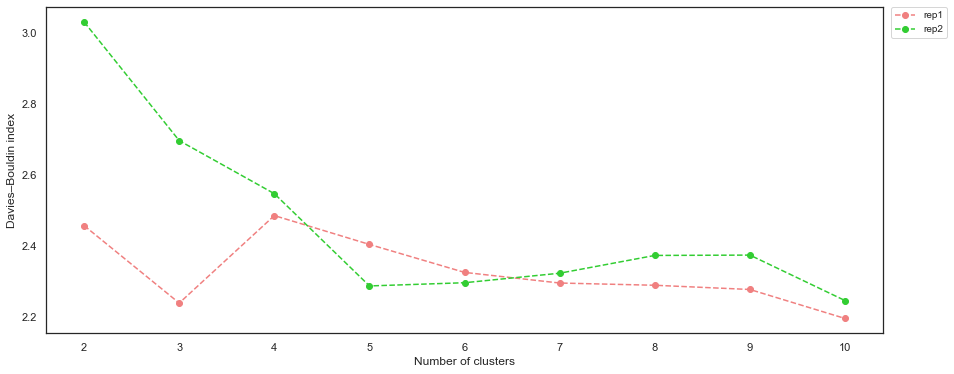

In [376]:
sns.set_style("white")
plt.figure(figsize=(15, 6))
plt.plot(NUM_CLUSTERS_RANGE, davies_bouldin_index1, marker='o', linestyle='--', c='lightcoral', label='rep1')
plt.plot(NUM_CLUSTERS_RANGE, davies_bouldin_index2, marker='o', linestyle='--', c='limegreen', label='rep2')
plt.xlabel('Number of clusters')
plt.ylabel('Davies–Bouldin index')
#plt.axvline(x=7, color='gray', linestyle='--')
plt.xticks(np.arange(2, num+1, step=1))
plt.legend(
    bbox_to_anchor=(1.01, 1),
    loc='upper left',
    borderaxespad=0,
    fontsize=10
)
plt.show()

In [377]:
np.random.seed(0)
model = KMeans(n_clusters=10, init='k-means++',  random_state=1)
model.fit(rep1_sel.iloc[:, 1:])
rep1_sel['cluster'] = model.labels_
rep1_sel_sort = rep1_sel.sort_values('cluster')

In [378]:
rep1_sel_sort.shape

(720, 22)

<AxesSubplot:>

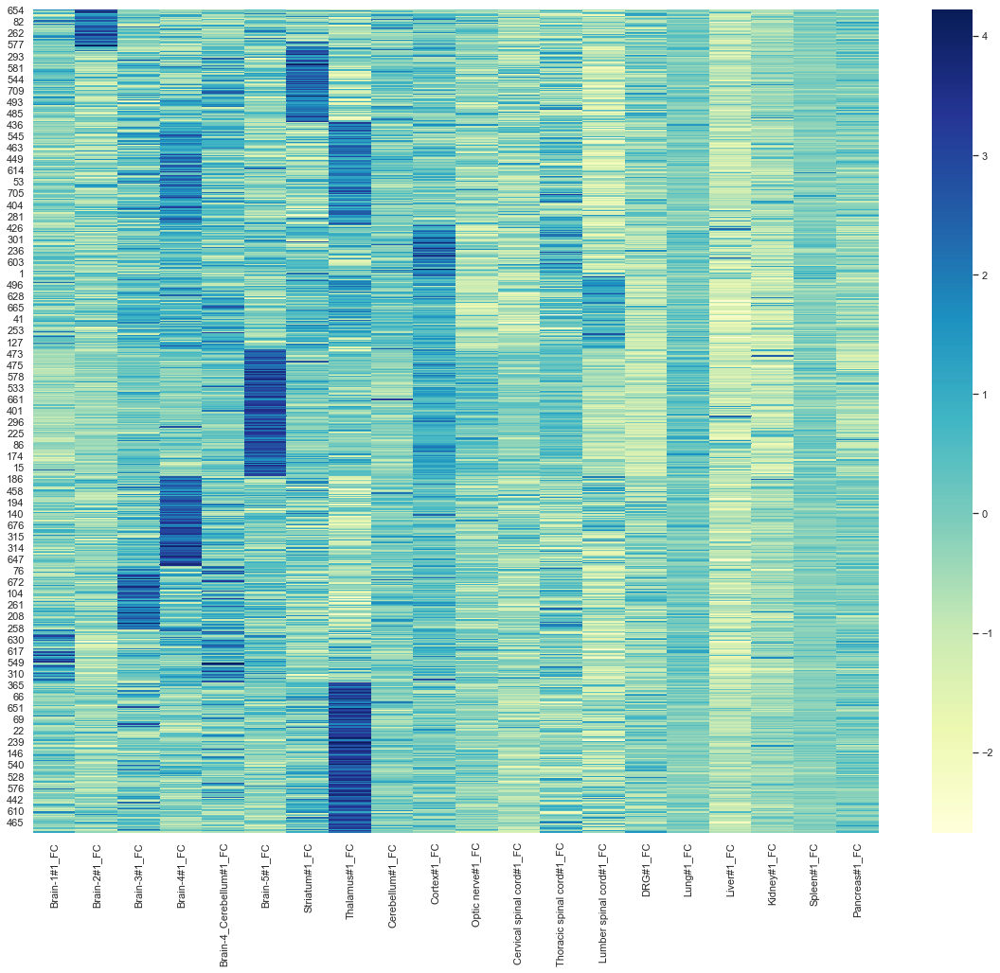

In [379]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_sel_sort.iloc[:, 1:len(rep1_sel_sort.columns) - 1], cmap='YlGnBu')

In [380]:
np.random.seed(0)
model = KMeans(n_clusters=10, init='k-means++',  random_state=1)
model.fit(rep2_sel.iloc[:, 1:])
rep2_sel['cluster'] = model.labels_
rep2_sel_sort = rep2_sel.sort_values('cluster')

<AxesSubplot:>

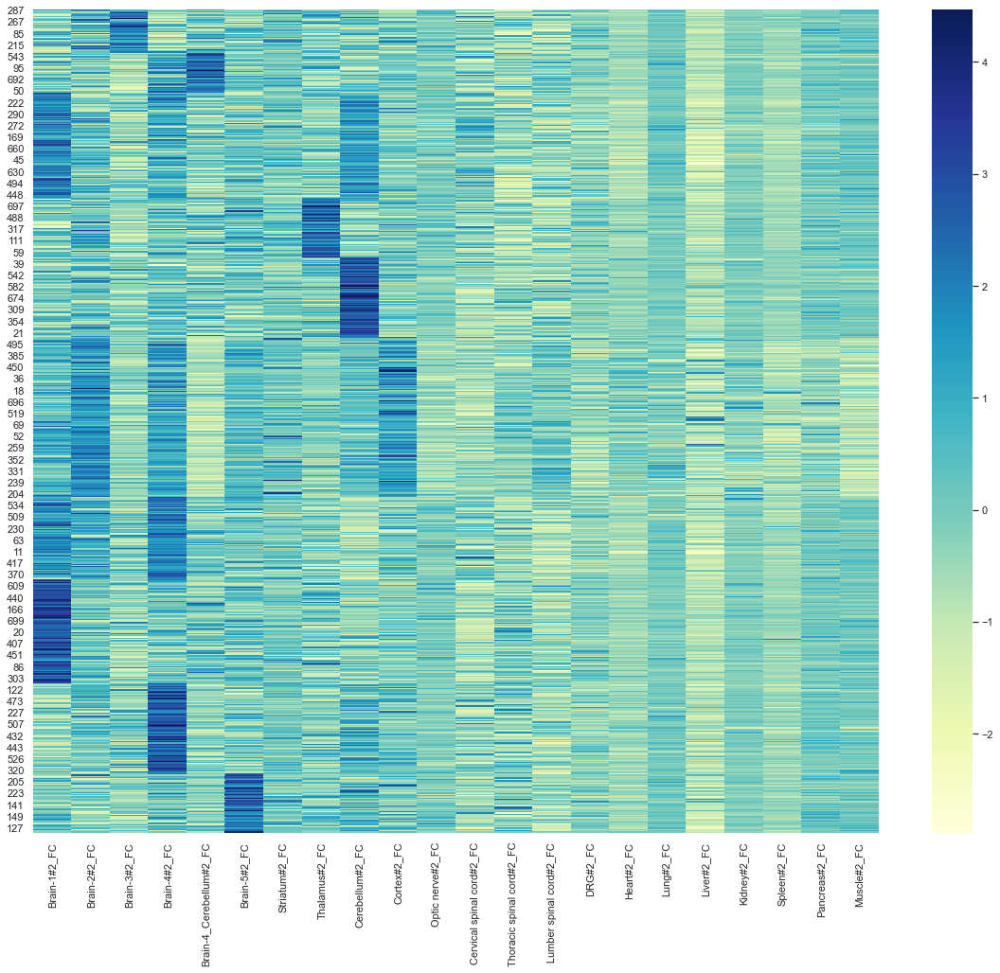

In [381]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_sel_sort.iloc[:, 1:len(rep2_sel_sort.columns) - 1], cmap='YlGnBu')

In [382]:
rep1_filter = rep1_sel_sort[
    (rep1_sel_sort['Lung#1_FC'] < 0 ) &
    (rep1_sel_sort['Liver#1_FC'] < 0) & 
    (rep1_sel_sort['Kidney#1_FC'] < 0) &
    (rep1_sel_sort['Pancreas#1_FC'] < 0) &
    (rep1_sel_sort['Spleen#1_FC'] < 0) &
    (rep1_sel_sort['DRG#1_FC'] < 0)
]

In [383]:
rep1_filter.shape

(84, 22)

In [384]:
rep2_filter = rep2_sel_sort[
    (rep2_sel_sort['Heart#2_FC'] < 0 ) &
    (rep2_sel_sort['Muscle#2_FC'] < 0) &
    (rep2_sel_sort['Lung#2_FC'] < 0 ) &
    (rep2_sel_sort['Liver#2_FC'] < 0) & 
    (rep2_sel_sort['Kidney#2_FC'] < 0) &
    (rep2_sel_sort['Pancreas#2_FC'] < 0) &
    (rep2_sel_sort['DRG#2_FC'] < 0)
]

In [385]:
rep2_filter.shape

(53, 24)

<AxesSubplot:>

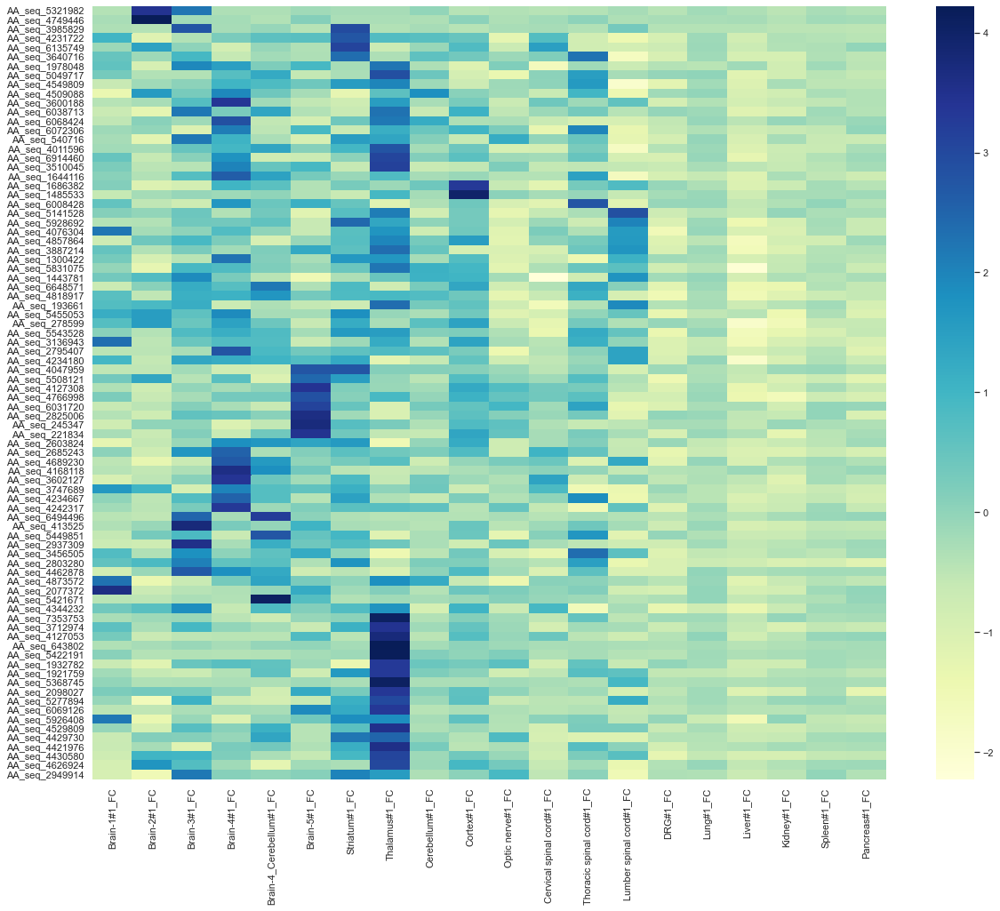

In [387]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep1_filter.iloc[:, 1:len(rep1_filter.columns) - 1], cmap='YlGnBu', yticklabels=rep1_filter['AA_seq_ID'])

<AxesSubplot:>

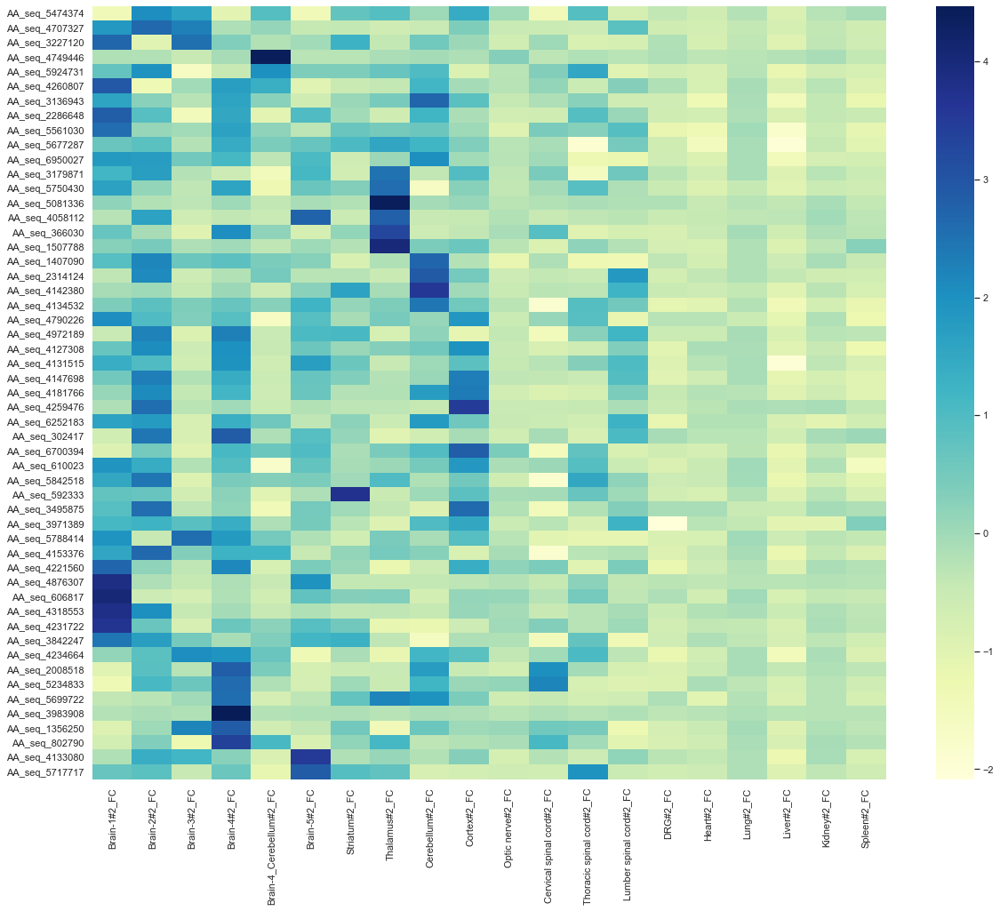

In [388]:
sns.set(rc = {'figure.figsize':(20,16)})
sns.heatmap(rep2_filter.iloc[:, 1:len(rep1_filter.columns) - 1], cmap='YlGnBu', yticklabels=rep2_filter['AA_seq_ID'])

In [389]:
rep1_before = rep1_filter
rep2_before = rep2_filter

In [390]:
rep1_before

,AA_seq_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,Cortex#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC,cluster
537,AA_seq_5321982,-0.407422,3.464602,2.231216,-0.336654,-0.336654,-0.185008,-0.255776,-0.245666,-0.013143,-0.427641,-0.366983,-0.417532,-0.397312,-0.255776,-0.417532,-0.195118,-0.336654,-0.468080,-0.265886,-0.366983,0
481,AA_seq_4749446,-0.272004,4.207106,-0.190566,-0.223141,-0.369730,0.118900,-0.288292,-0.304579,-0.337155,0.053749,-0.320867,-0.190566,0.037462,-0.320867,-0.272004,-0.272004,-0.239429,-0.402306,-0.190566,-0.223141,0
353,AA_seq_3985829,-0.319260,-0.392234,2.763878,-0.246286,-0.082095,-0.428720,2.982799,-0.383112,-0.237164,-0.437842,-0.273651,-0.255408,-0.383112,0.328382,-0.410477,-0.392234,-0.401355,-0.474329,-0.465207,-0.492572,1
411,AA_seq_4231722,1.010312,-1.116312,-0.380937,0.251750,0.629374,0.672437,2.736123,0.788374,0.682374,0.506812,-1.218999,0.768499,-0.834749,-1.440936,-0.910937,-0.142437,-0.824812,-0.341187,-0.394187,-0.440562,1
649,AA_seq_6135749,-0.116959,1.427536,0.024033,-0.841141,-0.072098,-0.354080,3.087387,-0.712967,-0.097733,0.799484,-0.706558,1.498032,-0.802689,-0.860367,-0.738602,-0.116959,-0.700150,-0.373306,-0.322037,-0.020828,1
302,AA_seq_3640716,0.501027,-0.138195,0.940230,-0.605373,-0.188550,-0.321429,2.376731,-0.325626,0.594742,0.363951,-0.111619,0.176520,2.266231,-1.703380,-0.964848,-0.168967,-0.914493,-0.915892,-0.349404,-0.511657,1
150,AA_seq_1978048,0.574250,-0.918634,1.936596,1.488018,0.205183,0.923143,-0.250515,2.253448,-0.313411,-1.078840,0.185008,-1.650835,-0.166258,-0.695532,-0.408348,-0.440389,-0.184059,-0.796403,-0.180499,-0.481924,2
520,AA_seq_5049717,0.315596,-0.365701,-0.377921,0.709710,1.256580,-0.576505,-0.298487,2.906357,0.425581,-0.872854,-1.364732,0.052854,1.504046,-0.252660,-0.047966,-0.005194,-1.135596,-0.839248,-0.454300,-0.579560,2
456,AA_seq_4549809,-0.621294,-0.180371,0.055370,1.018707,0.836808,0.395885,1.576046,2.002417,-0.145446,-0.720247,-0.155633,0.026266,1.619702,-1.951340,-1.197550,-0.209475,-1.065128,-0.283690,-0.506334,-0.494693,2
447,AA_seq_4509088,-1.352366,1.599632,0.287308,1.932828,0.407142,-0.238790,-1.247146,0.620504,1.818840,0.071023,-0.168644,-0.650901,0.988773,-1.437126,-0.165721,-0.025428,-0.960715,-0.797040,-0.300169,-0.382006,2


In [391]:
file = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
rep1_after = pd.read_excel(file, sheet_name='100-131')
rep2_after = pd.read_excel(file, sheet_name='200-231')

In [392]:
rep1_after

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,Thalamus#1_Count,Cerebellum#1_Count,Cortex#1_Count,Lung#1_Count,Liver#1_Count,Kidney#1_Count,Optic nerve#1_Count,Cervical spinal cord#1_Count,Thoracic spinal cord#1_Count,Lumber spinal cord#1_Count,Spleen#1_Count,Pancreas#1_Count,DRG#1_Count,AAV Library#1_Count,Brain-1#1_Freq,Brain-2#1_Freq,Brain-3#1_Freq,Brain-4#1_Freq,Brain-4_Cerebellum#1_Freq,Brain-5#1_Freq,Striatum#1_Freq,Thalamus#1_Freq,Cerebellum#1_Freq,Cortex#1_Freq,Lung#1_Freq,Liver#1_Freq,Kidney#1_Freq,Optic nerve#1_Freq,Cervical spinal cord#1_Freq,Thoracic spinal cord#1_Freq,Lumber spinal cord#1_Freq,Spleen#1_Freq,Pancreas#1_Freq,DRG#1_Freq,AAV Library#1_Freq,Brain-1#1_FC,Brain-1#1_FDR,Brain-2#1_FC,Brain-2#1_FDR,Brain-3#1_FC,Brain-3#1_FDR,Brain-4#1_FC,Brain-4#1_FDR,Brain-4_Cerebellum#1_FC,Brain-4_Cerebellum#1_FDR,Brain-5#1_FC,Brain-5#1_FDR,Striatum#1_FC,Striatum#1_FDR,Thalamus#1_FC,Thalamus#1_FDR,Cerebellum#1_FC,Cerebellum#1_FDR,Cortex#1_FC,Cortex#1_FDR,Lung#1_FC,Lung#1_FDR,Liver#1_FC,Liver#1_FDR,Kidney#1_FC,Kidney#1_FDR,Optic nerve#1_FC,Optic nerve#1_FDR,Cervical spinal cord#1_FC,Cervical spinal cord#1_FDR,Thoracic spinal cord#1_FC,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR,cluster
0,AA_seq_221747,AELGAHWSK,"Seq_7270215,Seq_7488829,Seq_7501524,Seq_750175...",44,57,64,49,54,135,59,78,65,97,73,59,27,67,73,75,57,82,55,37,47,0.000007,0.000011,0.000009,0.000007,0.000008,0.000024,0.000009,0.000012,0.000010,0.000014,0.000011,0.000011,4.294326e-06,0.000011,0.000014,0.000011,0.000008,0.000011,0.000008,0.000005,0.000008,0.936170,1.000000e+00,1.212766,1.000000e+00,1.361702,1.000000e+00,1.042553,1.000000e+00,1.148936,1.000000e+00,2.872340,7.523077e-06,1.255319,1.000000e+00,1.659574,1.000000e+00,1.382979,1.000000e+00,2.063830,1.000000e+00,1.553191,1.000000,1.255319,1.000000e+00,0.574468,1.000000,1.425532,1.000000e+00,1.553191,1.000000e+00,1.595745,1.000000e+00,1.212766,1.000000e+00,1.744681,1.000000,1.170213,1.000000e+00,0.787234,1.000000e+00,0
1,AA_seq_4778289,QGPGGQWVA,"Seq_3909249,Seq_3909251,Seq_3909310,Seq_392243...",41,57,55,49,60,136,63,75,46,84,69,27,49,95,61,62,68,85,104,58,49,0.000007,0.000011,0.000008,0.000007,0.000009,0.000024,0.000010,0.000011,0.000007,0.000012,0.000010,0.000005,7.793407e-06,0.000015,0.000012,0.000009,0.000010,0.000012,0.000015,0.000008,0.000008,0.836735,1.000000e+00,1.163265,1.000000e+00,1.122449,1.000000e+00,1.000000,1.000000e+00,1.224490,1.000000e+00,2.775510,1.751697e-05,1.285714,1.000000e+00,1.530612,1.000000e+00,0.938776,1.000000e+00,1.714286,1.000000e+00,1.408163,1.000000,0.551020,1.000000e+00,1.000000,1.000000,1.938776,1.000000e+00,1.244898,1.000000e+00,1.265306,1.000000e+00,1.387755,1.000000e+00,1.734694,1.000000,2.122449,1.000000e+00,1.183673,1.000000e+00,0
2,AA_seq_4766998,QGHGTNWAP,"Seq_3909212,Seq_3921236,Seq_3921240,Seq_392124...",40,24,31,42,42,89,38,53,35,56,34,10,6,46,43,48,20,22,18,20,22,0.000007,0.000005,0.000005,0.000006,0.000006,0.000016,0.000006,0.000008,0.000005,0.000008,0.000005,0.000002,9.542947e-07,0.000007,0.000008,0.000007,0.000003,0.000003,0.000003,0.000003,0.000004,1.818182,1.000000e+00,1.090909,1.000000e+00,1.409091,1.000000e+00,1.909091,1.000000e+00,1.909091,1.000000e+00,4.045455,4.175015e-05,1.727273,1.000000e+00,2.409091,1.000000e+00,1.590909,1.000000e+00,2.545455,1.000000e+00,1.545455,1.000000,0.454545,1.000000e+00,0.272727,1.000000,2.090909,1.000000e+00,1.954545,1.000000e+00,2.181818,1.000000e+00,0.909091,1.000000e+00,1.000000,1.000000,0.818182,1.000000e+00,0.909091,1.000000e+00,0
3,AA_seq_4613589,PVGGQTWGS,"Seq_4855619,Seq_4863586,Seq_4864002,Seq_487557...",43,53,48,43,220,323,36,43,88,60,80,45,61,71,61,57,36,75,57,52,36,0.000007,0.000010,0.000007,0.000006,0.000032,0.000057,0.000006,0.000006,0.000014,0.000009,0.000012,0.000009,9.701996e-06,0.000012,0.000012,0.

In [393]:
common_ID = list(set(rep1_before['AA_seq_ID']) & set(rep1_after['AA_seq_ID']))
print(len(common_ID))

17


In [394]:
common_ID = list(set(rep2_before['AA_seq_ID']) & set(rep2_after['AA_seq_ID']))
print(len(common_ID))

10


In [395]:
rep1_before

,AA_seq_ID,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,Cortex#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Spleen#1_FC,Pancreas#1_FC,cluster
537,AA_seq_5321982,-0.407422,3.464602,2.231216,-0.336654,-0.336654,-0.185008,-0.255776,-0.245666,-0.013143,-0.427641,-0.366983,-0.417532,-0.397312,-0.255776,-0.417532,-0.195118,-0.336654,-0.468080,-0.265886,-0.366983,0
481,AA_seq_4749446,-0.272004,4.207106,-0.190566,-0.223141,-0.369730,0.118900,-0.288292,-0.304579,-0.337155,0.053749,-0.320867,-0.190566,0.037462,-0.320867,-0.272004,-0.272004,-0.239429,-0.402306,-0.190566,-0.223141,0
353,AA_seq_3985829,-0.319260,-0.392234,2.763878,-0.246286,-0.082095,-0.428720,2.982799,-0.383112,-0.237164,-0.437842,-0.273651,-0.255408,-0.383112,0.328382,-0.410477,-0.392234,-0.401355,-0.474329,-0.465207,-0.492572,1
411,AA_seq_4231722,1.010312,-1.116312,-0.380937,0.251750,0.629374,0.672437,2.736123,0.788374,0.682374,0.506812,-1.218999,0.768499,-0.834749,-1.440936,-0.910937,-0.142437,-0.824812,-0.341187,-0.394187,-0.440562,1
649,AA_seq_6135749,-0.116959,1.427536,0.024033,-0.841141,-0.072098,-0.354080,3.087387,-0.712967,-0.097733,0.799484,-0.706558,1.498032,-0.802689,-0.860367,-0.738602,-0.116959,-0.700150,-0.373306,-0.322037,-0.020828,1
302,AA_seq_3640716,0.501027,-0.138195,0.940230,-0.605373,-0.188550,-0.321429,2.376731,-0.325626,0.594742,0.363951,-0.111619,0.176520,2.266231,-1.703380,-0.964848,-0.168967,-0.914493,-0.915892,-0.349404,-0.511657,1
150,AA_seq_1978048,0.574250,-0.918634,1.936596,1.488018,0.205183,0.923143,-0.250515,2.253448,-0.313411,-1.078840,0.185008,-1.650835,-0.166258,-0.695532,-0.408348,-0.440389,-0.184059,-0.796403,-0.180499,-0.481924,2
520,AA_seq_5049717,0.315596,-0.365701,-0.377921,0.709710,1.256580,-0.576505,-0.298487,2.906357,0.425581,-0.872854,-1.364732,0.052854,1.504046,-0.252660,-0.047966,-0.005194,-1.135596,-0.839248,-0.454300,-0.579560,2
456,AA_seq_4549809,-0.621294,-0.180371,0.055370,1.018707,0.836808,0.395885,1.576046,2.002417,-0.145446,-0.720247,-0.155633,0.026266,1.619702,-1.951340,-1.197550,-0.209475,-1.065128,-0.283690,-0.506334,-0.494693,2
447,AA_seq_4509088,-1.352366,1.599632,0.287308,1.932828,0.407142,-0.238790,-1.247146,0.620504,1.818840,0.071023,-0.168644,-0.650901,0.988773,-1.437126,-0.165721,-0.025428,-0.960715,-0.797040,-0.300169,-0.382006,2


In [398]:
idx_rep1 = [rep12[rep12['AA_seq_ID'] == seqID].index[0] for seqID in rep1_before['AA_seq_ID']]
rep1_filter_seq = rep12.iloc[idx_rep1, :].reset_index(drop=True)

idx_rep2 = [rep12[rep12['AA_seq_ID'] == seqID].index[0] for seqID in rep2_before['AA_seq_ID']]
rep2_filter_seq = rep12.loc[idx_rep2, :].reset_index(drop=True)

In [399]:
rep1_filter_seq

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,Thalamus#1_Count,Cerebellum#1_Count,Cortex#1_Count,Lung#1_Count,Liver#1_Count,Kidney#1_Count,Optic nerve#1_Count,Cervical spinal cord#1_Count,Thoracic spinal cord#1_Count,Lumber spinal cord#1_Count,Spleen#1_Count,Pancreas#1_Count,DRG#1_Count,AAV Library#1_Count,Brain-1#1_Freq,Brain-2#1_Freq,Brain-3#1_Freq,Brain-4#1_Freq,Brain-4_Cerebellum#1_Freq,Brain-5#1_Freq,Striatum#1_Freq,Thalamus#1_Freq,Cerebellum#1_Freq,Cortex#1_Freq,Lung#1_Freq,Liver#1_Freq,Kidney#1_Freq,Optic nerve#1_Freq,Cervical spinal cord#1_Freq,Thoracic spinal cord#1_Freq,Lumber spinal cord#1_Freq,Spleen#1_Freq,Pancreas#1_Freq,DRG#1_Freq,AAV Library#1_Freq,Brain-1#1_FC,Brain-1#1_FDR,Brain-2#1_FC,Brain-2#1_FDR,Brain-3#1_FC,Brain-3#1_FDR,Brain-4#1_FC,Brain-4#1_FDR,Brain-4_Cerebellum#1_FC,Brain-4_Cerebellum#1_FDR,Brain-5#1_FC,Brain-5#1_FDR,Striatum#1_FC,Striatum#1_FDR,Thalamus#1_FC,Thalamus#1_FDR,Cerebellum#1_FC,Cerebellum#1_FDR,Cortex#1_FC,Cortex#1_FDR,Lung#1_FC,Lung#1_FDR,Liver#1_FC,Liver#1_FDR,Kidney#1_FC,Kidney#1_FDR,Optic nerve#1_FC,Optic nerve#1_FDR,Cervical spinal cord#1_FC,Cervical spinal cord#1_FDR,Thoracic spinal cord#1_FC,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR,Brain-1#2_Count,Brain-2#2_Count,Brain-3#2_Count,Brain-4#2_Count,Brain-4_Cerebellum#2_Count,Brain-5#2_Count,Striatum#2_Count,Thalamus#2_Count,Cerebellum#2_Count,Cortex#2_Count,Heart#2_Count,Lung#2_Count,Liver#2_Count,Kidney#2_Count,Optic nerve#2_Count,Cervical spinal cord#2_Count,Thoracic spinal cord#2_Count,Lumber spinal cord#2_Count,Spleen#2_Count,Pancreas#2_Count,Muscle#2_Count,DRG#2_Count,AAV Library#2_Count,Brain-1#2_Freq,Brain-2#2_Freq,Brain-3#2_Freq,Brain-4#2_Freq,Brain-4_Cerebellum#2_Freq,Brain-5#2_Freq,Striatum#2_Freq,Thalamus#2_Freq,Cerebellum#2_Freq,Cortex#2_Freq,Heart#2_Freq,Lung#2_Freq,Liver#2_Freq,Kidney#2_Freq,Optic nerve#2_Freq,Cervical spinal cord#2_Freq,Thoracic spinal cord#2_Freq,Lumber spinal cord#2_Freq,Spleen#2_Freq,Pancreas#2_Freq,Muscle#2_Freq,DRG#2_Freq,AAV Library#2_Freq,Brain-1#2_FC,Brain-1#2_FDR,Brain-2#2_FC,Brain-2#2_FDR,Brain-3#2_FC,Brain-3#2_FDR,Brain-4#2_FC,Brain-4#2_FDR,Brain-4_Cerebellum#2_FC,Brain-4_Cerebellum#2_FDR,Brain-5#2_FC,Brain-5#2_FDR,Striatum#2_FC,Striatum#2_FDR,Thalamus#2_FC,Thalamus#2_FDR,Cerebellum#2_FC,Cerebellum#2_FDR,Cortex#2_FC,Cortex#2_FDR,Heart#2_FC,Heart#2_FDR,Lung#2_FC,Lung#2_FDR,Liver#2_FC,Liver#2_FDR,Kidney#2_FC,Kidney#2_FDR,Optic nerve#2_FC,Optic nerve#2_FDR,Cervical spinal cord#2_FC,Cervical spinal cord#2_FDR,Thoracic spinal cord#2_FC,Thoracic spinal cord#2_FDR,Lumber spinal cord#2_FC,Lumber spinal cord#2_FDR,Spleen#2_FC,Spleen#2_FDR,Pancreas#2_FC,Pancreas#2_FDR,Muscle#2_FC,Muscle#2_FDR,DRG#2_FC,DRG#2_FDR
0,AA_seq_5321982,RTNGTVWEQ,"Seq_2386935,Seq_2391859,Seq_5335422,Seq_533542...",20,403,281,27,27,42,35,36,59,18,41,27,14,24,19,21,35,34,24,19,14,0.000003,0.000080,0.000041,0.000004,0.000004,0.000007,0.000006,0.000005,0.000009,0.000003,0.000006,0.000005,2.226688e-06,3.893106e-06,3.662051e-06,0.000003,0.000005,0.000005,0.000003,0.000003,0.000002,1.428571,1.000000e+00,28.785714,2.221288e-89,20.071429,2.137529e-40,1.928571,1.000000e+00,1.928571,1.000000e+00,3.000000,1.000000e+00,2.500000,1.000000e+00,2.571429,1.000000e+00,4.214286,7.271079e-01,1.285714,1.000000e+00,2.928571,1.000000e+00,1.928571,1.000000e+00,1.000000,1.000000e+00,1.714286,1.000000e+00,1.357143,1.000000e+00,1.500000,1.000000e+00,2.500000,1.000000e+00,2.428571,1.000000e+00,1.714286,1.000000e+00,1.357143,1.000000e+00,25,17,15,16,11,21,17,18,16,23,11,21,7,18,16,21,27,24,16,12,54,20,16,0.000003,0.000003,0.000003,0.000002,0.000002,0.000003,0.000003,0.000003,0.000003,0.000004,0.000002,0.000003,0.000002,0.000003,0.000002,0.000003,4.200498e-06,0.000004,0.000003,0.000002,0.000008,0.000003,0.000003,1.562500,1.000000e+00,1.062500,1.000

In [400]:
outfile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_before.xlsx'
with pd.ExcelWriter(outfile) as writer:
    rep1_filter_seq.to_excel(writer, sheet_name='100-131', index=False)
    rep2_filter_seq.to_excel(writer, sheet_name='200-231', index=False)

In [421]:
rep1_after

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,Thalamus#1_Count,Cerebellum#1_Count,Cortex#1_Count,Lung#1_Count,Liver#1_Count,Kidney#1_Count,Optic nerve#1_Count,Cervical spinal cord#1_Count,Thoracic spinal cord#1_Count,Lumber spinal cord#1_Count,Spleen#1_Count,Pancreas#1_Count,DRG#1_Count,AAV Library#1_Count,Brain-1#1_Freq,Brain-2#1_Freq,Brain-3#1_Freq,Brain-4#1_Freq,Brain-4_Cerebellum#1_Freq,Brain-5#1_Freq,Striatum#1_Freq,Thalamus#1_Freq,Cerebellum#1_Freq,Cortex#1_Freq,Lung#1_Freq,Liver#1_Freq,Kidney#1_Freq,Optic nerve#1_Freq,Cervical spinal cord#1_Freq,Thoracic spinal cord#1_Freq,Lumber spinal cord#1_Freq,Spleen#1_Freq,Pancreas#1_Freq,DRG#1_Freq,AAV Library#1_Freq,Brain-1#1_FC,Brain-1#1_FDR,Brain-2#1_FC,Brain-2#1_FDR,Brain-3#1_FC,Brain-3#1_FDR,Brain-4#1_FC,Brain-4#1_FDR,Brain-4_Cerebellum#1_FC,Brain-4_Cerebellum#1_FDR,Brain-5#1_FC,Brain-5#1_FDR,Striatum#1_FC,Striatum#1_FDR,Thalamus#1_FC,Thalamus#1_FDR,Cerebellum#1_FC,Cerebellum#1_FDR,Cortex#1_FC,Cortex#1_FDR,Lung#1_FC,Lung#1_FDR,Liver#1_FC,Liver#1_FDR,Kidney#1_FC,Kidney#1_FDR,Optic nerve#1_FC,Optic nerve#1_FDR,Cervical spinal cord#1_FC,Cervical spinal cord#1_FDR,Thoracic spinal cord#1_FC,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR,cluster
0,AA_seq_221747,AELGAHWSK,"Seq_7270215,Seq_7488829,Seq_7501524,Seq_750175...",44,57,64,49,54,135,59,78,65,97,73,59,27,67,73,75,57,82,55,37,47,0.000007,0.000011,0.000009,0.000007,0.000008,0.000024,0.000009,0.000012,0.000010,0.000014,0.000011,0.000011,4.294326e-06,0.000011,0.000014,0.000011,0.000008,0.000011,0.000008,0.000005,0.000008,0.936170,1.000000e+00,1.212766,1.000000e+00,1.361702,1.000000e+00,1.042553,1.000000e+00,1.148936,1.000000e+00,2.872340,7.523077e-06,1.255319,1.000000e+00,1.659574,1.000000e+00,1.382979,1.000000e+00,2.063830,1.000000e+00,1.553191,1.000000,1.255319,1.000000e+00,0.574468,1.000000,1.425532,1.000000e+00,1.553191,1.000000e+00,1.595745,1.000000e+00,1.212766,1.000000e+00,1.744681,1.000000,1.170213,1.000000e+00,0.787234,1.000000e+00,0
1,AA_seq_4778289,QGPGGQWVA,"Seq_3909249,Seq_3909251,Seq_3909310,Seq_392243...",41,57,55,49,60,136,63,75,46,84,69,27,49,95,61,62,68,85,104,58,49,0.000007,0.000011,0.000008,0.000007,0.000009,0.000024,0.000010,0.000011,0.000007,0.000012,0.000010,0.000005,7.793407e-06,0.000015,0.000012,0.000009,0.000010,0.000012,0.000015,0.000008,0.000008,0.836735,1.000000e+00,1.163265,1.000000e+00,1.122449,1.000000e+00,1.000000,1.000000e+00,1.224490,1.000000e+00,2.775510,1.751697e-05,1.285714,1.000000e+00,1.530612,1.000000e+00,0.938776,1.000000e+00,1.714286,1.000000e+00,1.408163,1.000000,0.551020,1.000000e+00,1.000000,1.000000,1.938776,1.000000e+00,1.244898,1.000000e+00,1.265306,1.000000e+00,1.387755,1.000000e+00,1.734694,1.000000,2.122449,1.000000e+00,1.183673,1.000000e+00,0
2,AA_seq_4766998,QGHGTNWAP,"Seq_3909212,Seq_3921236,Seq_3921240,Seq_392124...",40,24,31,42,42,89,38,53,35,56,34,10,6,46,43,48,20,22,18,20,22,0.000007,0.000005,0.000005,0.000006,0.000006,0.000016,0.000006,0.000008,0.000005,0.000008,0.000005,0.000002,9.542947e-07,0.000007,0.000008,0.000007,0.000003,0.000003,0.000003,0.000003,0.000004,1.818182,1.000000e+00,1.090909,1.000000e+00,1.409091,1.000000e+00,1.909091,1.000000e+00,1.909091,1.000000e+00,4.045455,4.175015e-05,1.727273,1.000000e+00,2.409091,1.000000e+00,1.590909,1.000000e+00,2.545455,1.000000e+00,1.545455,1.000000,0.454545,1.000000e+00,0.272727,1.000000,2.090909,1.000000e+00,1.954545,1.000000e+00,2.181818,1.000000e+00,0.909091,1.000000e+00,1.000000,1.000000,0.818182,1.000000e+00,0.909091,1.000000e+00,0
3,AA_seq_4613589,PVGGQTWGS,"Seq_4855619,Seq_4863586,Seq_4864002,Seq_487557...",43,53,48,43,220,323,36,43,88,60,80,45,61,71,61,57,36,75,57,52,36,0.000007,0.000010,0.000007,0.000006,0.000032,0.000057,0.000006,0.000006,0.000014,0.000009,0.000012,0.000009,9.701996e-06,0.000012,0.000012,0.

In [422]:
cluster_seq1 = {}
for i in range(len(rep1_after)):
    c = rep1_after.loc[i, 'cluster']
    if cluster_seq1.get(c):
        cluster_seq1[c] += ',' + rep1_after.loc[i, 'AA_seq']
    else:
        cluster_seq1[c] = rep1_after.loc[i, 'AA_seq']

cluster_seq2 = {}
for i in range(len(rep2_after)):
    c = rep2_after.loc[i, 'cluster']
    if cluster_seq2.get(c):
        cluster_seq2[c] += ',' + rep2_after.loc[i, 'AA_seq']
    else:
        cluster_seq2[c] = rep2_after.loc[i, 'AA_seq']

In [423]:
cluster_seq1

{0: 'AELGAHWSK,QGPGGQWVA,QGHGTNWAP,PVGGQTWGS,PSVGLKWSE,PKSGANWEI,PGTGPSWSV,PGNGTNWAP,PGLGNQWVQ,NTTGRYWMQ,NTTGRGWMQ,NTTGRDWRQ,NTTGRAWMQ,NTRGRDWMQ,NPTGRDWMQ,NGTGTSWER,NATGQNWGQ,NAPGQNWGP,NAPGPNWGQ,MNNGTHWEQ,QGTGPAWSV,LSLGSSWEN,QGTGPTWSV,QTPGTNWAT,TTRGTRWEE,TSAGKNWQT,TNTGSQWEV,TITGTGWEQ,TGSGTAWSE,TEAGSKWSQ,SVRGEGWEA,STSGTKWEV,SSGGTNWSI,SGAGPSWAP,SEMGANWSR,SAVGTSWGT,SAVGTSW*T,SAVGKSWET,SAPGSTWEI,RGLGANWAT,RDRGSNWAC,R*NGTVWEQ,QTTGSNWAT,QTHGSNWAT,LDLGKTWTV,VGSGSTWDK,DPRGGQWEV,ISNGGNWEN,HTPGSNWAT,DGRGSNWAK,ATQGQKWAT,ASTGGGWEI,ASHGGGWEI,KNNGTNWEQ,ARPGGGWEI,KAPGQNWGQ,KSKGTEWAS,ANGGHNWAE,KNTGTHWEQ,KSNGTDWAS,KTTGRDWMQ,KTNGTHWEQ,KSTGTGWEQ,AELGAKWSK,KSNGPEWAS,ITGGGSWSE,AEVGMHWTV,AHTGGTWSV,KSNGKEWAS',
 1: 'SSSGRDWSV,ATLGSNWDQ,AMGGKSWAE,AVMGSTWDV,AVPGASWEL,GPTGSMWEL,HDLGSKWDI,STVGQTWAQ,PSPGPIWEK,TSTGSIWEL,SVPGASWEV,LPNGQSWSV,KDPGAMWEK,NTSGGLWQE',
 2: 'SRPGDGWET,SSPGGGWEI,PDKGSTWSI,PKEGSAWAR,NGTGQSWER,AEMGANWSK,NNNGTHWEQ,PSVGLTWSV,TSVGLTWSE',
 3: 'TGTGPSWER,SGPGTNWSV,PEAGSSWAK,SVNGVMWSQ,STVGPNWAQ,SVTG

In [426]:
outdir = 'A:/PROJECT/PG4699/200_INFO/06_meme/rep1'
for i in cluster_seq1.keys():
    name = 'AA_seq_' + str(i) + '.fa'
    fa = os.path.join(outdir, name)
    cnt = 0
    with open(fa, 'w') as wf:
        for seq in cluster_seq1[i].split(','):
            cnt += 1
            ID = '>seq_' + str(cnt)
            wf.write(f'{ID}\n')
            wf.write(f'{seq}\n')
        

In [427]:
outdir = 'A:/PROJECT/PG4699/200_INFO/06_meme/rep2'
for i in cluster_seq2.keys():
    name = 'AA_seq_' + str(i) + '.fa'
    fa = os.path.join(outdir, name)
    cnt = 0
    with open(fa, 'w') as wf:
        for seq in cluster_seq2[i].split(','):
            cnt += 1
            ID = '>seq_' + str(cnt)
            wf.write(f'{ID}\n')
            wf.write(f'{seq}\n')

## 配列クラスタリング　

In [8]:
# Enrichment scoreを基準に代表配列を選ぶ ---
#outf = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/PG4699_AA_enrh_1.fa'
#with open(outf, 'w') as wf:
#    for i in range(len(df_enrh_1)):
#        ID = df_enrh_1.loc[i, 'AA_seq_ID']
#        seq = df_enrh_1.loc[i, 'AA_seq']
#        if not '*' in seq:
#            wf.write(f'>{ID}\n')
#            wf.write(f'{seq}\n')

In [55]:
#outf = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/PG4699_AA_enrh_2.fa'
#with open(outf, 'w') as wf:
#    for i in range(len(df_enrh_2)):
#        ID = df_enrh_2.loc[i, 'AA_seq_ID']
#        seq = df_enrh_2.loc[i, 'AA_seq']
#        if not '*' in seq:
#            wf.write(f'>{ID}\n')
#            wf.write(f'{seq}\n')

In [100]:
# FC + merge_count
file = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/DRG(Nerve)/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
df_1 = pd.read_excel(file, sheet_name='100-131')
df_2 = pd.read_excel(file, sheet_name='200-231')

In [105]:
df_1.head()

,AA_seq_ID,AA_seq,Header_ID,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Thoracic spinal cord#1_FDR,Lumber spinal cord#1_FC,Lumber spinal cord#1_FDR,Spleen#1_FC,Spleen#1_FDR,Pancreas#1_FC,Pancreas#1_FDR,DRG#1_FC,DRG#1_FDR,cluster
0,AA_seq_221747,AELGAHWSK,"Seq_7270215,Seq_7488829,Seq_7501524,Seq_750175...",44,57,64,49,54,135,59,...,1.0,1.212766,1.0,1.744681,1.0,1.170213,1.0,0.787234,1.0,0
1,AA_seq_2937235,LDLGKTWTV,"Seq_5652151,Seq_5665572,Seq_5787656,Seq_578771...",28,17,12,40,35,81,41,...,1.0,1.333333,1.0,1.428571,1.0,1.380952,1.0,0.523810,1.0,0
2,AA_seq_5040467,QTTGSNWAT,"Seq_3543548,Seq_3547289,Seq_3549036,Seq_354987...",26,24,34,33,42,76,54,...,1.0,2.083333,1.0,2.416667,1.0,2.750000,1.0,1.916667,1.0,0
3,AA_seq_5081336,R*NGTVWEQ,"Seq_5350286,Seq_5350290,Seq_5479459,Seq_547947...",23,32,40,46,37,71,45,...,1.0,2.300000,1.0,2.000000,1.0,1.300000,1.0,1.500000,1.0,0
4,AA_seq_2857095,KTTGRDWMQ,"Seq_4045,Seq_4050,Seq_4149,Seq_4151,Seq_4179,S...",105,103,91,127,142,260,136,...,1.0,1.029703,1.0,1.277228,1.0,0.762376,1.0,0.653465,1.0,0


In [80]:
# 配列クラスタリング（クラスター数が最小になる、40%以上類似した配列をまとめる）
seqs = df_1.loc[:, ['AA_seq_ID', 'AA_seq']].sample(frac=1)
outf = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/raw_data/PG4699_AA_shuf_1.fa'
with open(outf, 'w') as wf:
    for i in range(len(seqs)):
        ID = seqs.loc[i, 'AA_seq_ID']
        seq = seqs.loc[i, 'AA_seq']
        if not '*' in seq:
            wf.write(f'>{ID}\n')
            wf.write(f'{seq}\n')

In [171]:
# 配列クラスタリング（クラスター数が最小になる、40%以上類似した配列をまとめる）
seqs = df_2.loc[:, ['AA_seq_ID', 'AA_seq']].sample(frac=1)
outf = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/raw_data/PG4699_AA_shuf_2.fa'
with open(outf, 'w') as wf:
    for i in range(len(seqs)):
        ID = seqs.loc[i, 'AA_seq_ID']
        seq = seqs.loc[i, 'AA_seq']
        if not '*' in seq:
            wf.write(f'>{ID}\n')
            wf.write(f'{seq}\n')

In [106]:
rep1_seqID = {}
for i in range(len(df1)):
    ID = df1.loc[i, 'AA_seq_ID']
    rep1_seqID[ID] = df1.loc[i, 'AA_seq']

rep2_seqID = {}
for i in range(len(df2)):
    ID = df2.loc[i, 'AA_seq_ID']
    rep2_seqID[ID] = df2.loc[i, 'AA_seq']

In [107]:
outf = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/raw_data/PG4699_AA_shuf_cluster_1.fa.clstr'
clster_rep1 = {}
with open(outf, 'r') as rf:
    flag = 0
    for line in rf.readlines():
        line = line.rstrip('\n')
        if '>Cluster' in line:
            ID = re.compile(r'>(.*)').search(line).group(1)
            ID = ID.replace(' ','')
            flag = 1
            cnt = 0
        else:
            tmp = line.split('\t')
            if flag == 1:
                cnt += 1
                sID = re.compile(r'.*,\s>(.*)...\s.*').search(tmp[1]).group(1)
                if cnt == 1:
                    sID = re.compile(r'.*,\s>(.*)...\s.*').search(tmp[1]).group(1)
                    clster_rep1[ID] = sID
                else:
                    sID = re.compile(r'.*,\s>(.*)...\sat').search(tmp[1]).group(1)
                    if clster_rep1.get(ID):
                        clster_rep1[ID] += ',' + sID
                    
clster_seq1 = {}
for i in clster_rep1.keys():
    tmp = []
    for seqID in clster_rep1[i].split(','):
        tmp.append(rep1_seqID[seqID])
    clster_seq1[i] = ','.join(tmp)

In [108]:
df_crep1 = pd.DataFrame([clster_rep1.keys(), clster_rep1.values()]).T
df_crep1.columns = ['cluster', 'AA_seq_ID']
df_cseq1 = pd.DataFrame([clster_seq1.keys(), clster_seq1.values()]).T
df_cseq1.columns = ['cluster', 'AA_seq']
df_cluster1 = pd.merge(df_crep1, df_cseq1, how='left', on='cluster')

In [109]:
df_cluster1

,cluster,AA_seq_ID,AA_seq
0,Cluster0,"AA_seq_221747,AA_seq_5508121,AA_seq_6252183,AA...","AELGAHWSK,SEMGANWSR,TEAGSKWSQ,AEVGMHWTV,SQRGAE..."
1,Cluster1,"AA_seq_2937235,AA_seq_5660716,AA_seq_4127084,A...","LDLGKTWTV,SKSGDAWTV,PDLGLKWGQ,PMSGKEWSV,PDLGNS..."
2,Cluster2,"AA_seq_5040467,AA_seq_2857095,AA_seq_5035198,A...","QTTGSNWAT,KTTGRDWMQ,QTSGSMWSI,RDRGSNWAC,NTTGRG..."
3,Cluster3,"AA_seq_2846102,AA_seq_2825006,AA_seq_2809353,A...","KTNGTHWEQ,KSTGTGWEQ,KSNGTDWAS,KSNGPEWAS,KSNGKE..."
4,Cluster4,"AA_seq_5398469,AA_seq_5419508,AA_seq_5422257,A...","SAPGSTWEI,SAVGKSWET,SAVGTSWGT,KAPGQNWGQ,PKSGAN..."
5,Cluster5,"AA_seq_2518408,AA_seq_4221560,AA_seq_4542140,A...","ITGGGSWSE,PGGGMGWDV,PSVGLKWSE,PSVGRTWSE,PSGGLT..."
6,Cluster6,"AA_seq_3971389,AA_seq_3815976,AA_seq_3985915,A...","NTRGRDWMQ,NPTGRDWMQ,NTTGRDWRQ,TTRGTRWEE,SQRGAD..."
7,Cluster7,"AA_seq_4231890,AA_seq_4259476,AA_seq_4778289,A...","PGLGNQWVQ,PGTGPSWSV,QGPGGQWVA,QGPGVQWGA,PLNGKL..."
8,Cluster8,"AA_seq_5543524,AA_seq_304506,AA_seq_4168118,AA...","SGAGPSWAP,AGVGTSWTA,PEAGSSWAK,PGPGQAWAA,SGPGTN..."
9,Cluster9,"AA_seq_6632984,AA_seq_5911447,AA_seq_6136102,A...","TSAGKNWQT,SSGGTNWSI,TAGGTNWET,LAAGMNWET,HDSGVQWQT"


In [111]:
outf = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/raw_data/PG4699_AA_shuf_cluster_2.fa.clstr'
clster_rep2 = {}
with open(outf, 'r') as rf:
    flag = 0
    for line in rf.readlines():
        line = line.rstrip('\n')
        if '>Cluster' in line:
            ID = re.compile(r'>(.*)').search(line).group(1)
            ID = ID.replace(' ','')
            flag = 1
            cnt = 0
        else:
            tmp = line.split('\t')
            if flag == 1:
                cnt += 1
                sID = re.compile(r'.*,\s>(.*)...\s.*').search(tmp[1]).group(1)
                if cnt == 1:
                    sID = re.compile(r'.*,\s>(.*)...\s.*').search(tmp[1]).group(1)
                    clster_rep2[ID] = sID
                else:
                    sID = re.compile(r'.*,\s>(.*)...\sat').search(tmp[1]).group(1)
                    if clster_rep2.get(ID):
                        clster_rep2[ID] += ',' + sID
                    
clster_seq2 = {}
for i in clster_rep2.keys():
    tmp = []
    for seqID in clster_rep2[i].split(','):
        tmp.append(rep2_seqID[seqID])
    clster_seq2[i] = ','.join(tmp)

In [112]:
df_crep2 = pd.DataFrame([clster_rep2.keys(), clster_rep2.values()]).T
df_crep2.columns = ['cluster', 'AA_seq_ID']
df_cseq2 = pd.DataFrame([clster_seq2.keys(), clster_seq2.values()]).T
df_cseq2.columns = ['cluster', 'AA_seq']
df_cluster2 = pd.merge(df_crep2, df_cseq2, how='left', on='cluster')

In [142]:
df_cluster2

,cluster,AA_seq_ID,AA_seq
0,Cluster0,"AA_seq_3981004,AA_seq_2314124,AA_seq_3987191,A...","NTTGGPWGT,HTTGRDWMQ,NTTGRVWMQ,PKSGGSWST,NTKGEN..."
1,Cluster1,"AA_seq_2098027,AA_seq_4573303,AA_seq_5141528,A...","HDLGSKWDI,PTLGTSWDL,RDYGSTWEV,GPYGSEWDK,SLPGSS..."
2,Cluster2,"AA_seq_4766142,AA_seq_4790077,AA_seq_2595409,A...","QGHGEQWSL,QGTGPSWRV,KDHGMSWDL,PDHGAQWSV,QGTGPSWSE"
3,Cluster3,"AA_seq_1094132,AA_seq_4496129,AA_seq_750793,AA...","DTPGTTWSE,PSGGLTWSE,DATGNTWAT,TPPGTGWGV,TVGGTS..."
4,Cluster4,"AA_seq_1407090,AA_seq_171619,AA_seq_6614803,AA...","EPFGESWTV,ADKGYSWDV,TRMGESWDR,VHTGEKWDV,AGVGTS..."
5,Cluster5,"AA_seq_3496637,AA_seq_6382451,AA_seq_4208588,A...","NAPGSVWEV,THVGSSWEK,PFPGSDWAS,ANRGVSWEV,SAVGTY..."
6,Cluster6,"AA_seq_5965653,AA_seq_5875173,AA_seq_5735764,A...","SSVGPGWDT,SRPGDGWDK,SNGGPNWAE,STPGPNWAE,GSVGPG..."
7,Cluster7,"AA_seq_1628642,AA_seq_6577918,AA_seq_6500149,A...","FDNGKNWER,TQLGKTWET,TNNGTHWEQ,PDLGQNWPS,ETLGAS..."
8,Cluster8,"AA_seq_5776802,AA_seq_3985789,AA_seq_3985806,A...","SPAGRDWQI,NTTGRDWIQ,NTTGRDWKQ,NTTGRDWMR,NSTGRD..."
9,Cluster9,"AA_seq_222007,AA_seq_6319215,AA_seq_6071802,AA...","AELGANWSN,TGLGASWET,SVPGNNWST,YGPGANWDT,SELGAN..."


In [114]:
outfile = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/PG4699_AA_seq_cluster.xlsx'
with pd.ExcelWriter(outfile) as writer:
    df_cluster1.to_excel(writer, sheet_name='100-131', index=False)
    df_cluster2.to_excel(writer, sheet_name='200-231', index=False)

In [116]:
infile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/DRG(Nerve)/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
brain_rep1 = pd.read_excel(infile, sheet_name='100-131')
brain_rep2 = pd.read_excel(infile, sheet_name='200-231')

In [117]:
# brain-specific ---
# rep1 ---
nucl = pd.DataFrame()
seqs = brain_rep1['AA_seq']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_cnt = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    F = col_list.count('F') / total
    L = col_list.count('L') / total
    I = col_list.count('I') / total
    V = col_list.count('V') / total
    S = col_list.count('S') / total
    
    P = col_list.count('P') / total
    T = col_list.count('T') / total
    A = col_list.count('A') / total
    Y = col_list.count('Y') / total
    H = col_list.count('H') / total
    
    Q = col_list.count('Q') / total
    N = col_list.count('N') / total
    K = col_list.count('K') / total
    D = col_list.count('D') / total
    E = col_list.count('E') / total
    
    C = col_list.count('C') / total
    W = col_list.count('W') / total
    R = col_list.count('R') / total
    G = col_list.count('G') / total
    M = col_list.count('M') / total
    a = col_list.count('*') / total
    
    freq = pd.Series(
        [
            F, L, I, V, S,
            P, T, A, Y, H, 
            Q, N, K, D, E,
            C, W, R, G, M, a
        ]
    )
    pos_cnt = pos_cnt.append(freq, ignore_index=True)

pos_cnt.columns = [
    'F', 'L', 'I', 'V', 'S',
    'P', 'T', 'A', 'Y', 'H', 
    'Q', 'N', 'K', 'D', 'E',
    'C', 'W', 'R', 'G', 'M', '*'
]
pos_cnt.index += 1
brain_aa_freq_1 = pos_cnt

In [128]:
brain_aa_freq_1.sum(axis=1)

1    1.0
2    1.0
3    1.0
4    1.0
5    1.0
6    1.0
7    1.0
8    1.0
9    1.0
dtype: float64

In [118]:
# rep2 ---
nucl = pd.DataFrame()
seqs = brain_rep2['AA_seq']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_cnt = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    F = col_list.count('F') / total
    L = col_list.count('L') / total
    I = col_list.count('I') / total
    V = col_list.count('V') / total
    S = col_list.count('S') / total
    
    P = col_list.count('P') / total
    T = col_list.count('T') / total
    A = col_list.count('A') / total
    Y = col_list.count('Y') / total
    H = col_list.count('H') / total
    
    Q = col_list.count('Q') / total
    N = col_list.count('N') / total
    K = col_list.count('K') / total
    D = col_list.count('D') / total
    E = col_list.count('E') / total
    
    C = col_list.count('C') / total
    W = col_list.count('W') / total
    R = col_list.count('R') / total
    G = col_list.count('G') / total
    M = col_list.count('M') / total
    a = col_list.count('*') / total
    
    freq = pd.Series(
        [
            F, L, I, V, S,
            P, T, A, Y, H, 
            Q, N, K, D, E,
            C, W, R, G, M, a
        ]
    )
    pos_cnt = pos_cnt.append(freq, ignore_index=True)

pos_cnt.columns = [
    'F', 'L', 'I', 'V', 'S',
    'P', 'T', 'A', 'Y', 'H', 
    'Q', 'N', 'K', 'D', 'E',
    'C', 'W', 'R', 'G', 'M', '*'
]
pos_cnt.index += 1
brain_aa_freq_2 = pos_cnt

In [129]:
brain_aa_freq_2.sum(axis=1)

1    1.0
2    1.0
3    1.0
4    1.0
5    1.0
6    1.0
7    1.0
8    1.0
9    1.0
dtype: float64

In [119]:
file = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Common_Consensus_frequency.xlsx'
all_rep1 = pd.read_excel(file, sheet_name='rep12')

In [120]:
all_rep1.shape

(2457, 175)

In [121]:
# all
nucl = pd.DataFrame()
seqs = all_rep1['AA_seq']
for seq in seqs:
    insert = pd.Series([str(i) for i in seq])
    nucl = nucl.append(insert, ignore_index=True)

col = [str(i) for i in range(1, nucl.columns.size + 1)]
nucl.columns = col
total = nucl.index.size
pos_cnt = pd.DataFrame()
for pos in col:
    col_list = list(nucl[pos])
    F = col_list.count('F') / total
    L = col_list.count('L') / total 
    I = col_list.count('I') / total
    V = col_list.count('V') / total
    S = col_list.count('S') / total
    
    P = col_list.count('P') / total
    T = col_list.count('T') / total
    A = col_list.count('A') / total
    Y = col_list.count('Y') / total
    H = col_list.count('H') / total
    
    Q = col_list.count('Q') / total
    N = col_list.count('N') / total
    K = col_list.count('K') / total
    D = col_list.count('D') / total
    E = col_list.count('E') / total
    
    C = col_list.count('C') / total
    W = col_list.count('W') / total
    R = col_list.count('R') / total
    G = col_list.count('G') / total
    M = col_list.count('M') / total
    a = col_list.count('*') / total
    
    freq = pd.Series(
        [
            F, L, I, V, S,
            P, T, A, Y, H, 
            Q, N, K, D, E,
            C, W, R, G, M, a
        ]
    )
    pos_cnt = pos_cnt.append(freq, ignore_index=True)

pos_cnt.columns = [
    'F', 'L', 'I', 'V', 'S',
    'P', 'T', 'A', 'Y', 'H', 
    'Q', 'N', 'K', 'D', 'E',
    'C', 'W', 'R', 'G', 'M', '*'
]
pos_cnt.index += 1

all_aa_freq = pos_cnt

In [130]:
all_aa_freq.sum(axis=1)

1    1.0
2    1.0
3    1.0
4    1.0
5    1.0
6    1.0
7    1.0
8    1.0
9    1.0
dtype: float64

In [122]:
score = brain_aa_freq_1 / all_aa_freq
erch_score_1 = score.fillna(0).T
score = brain_aa_freq_2 / all_aa_freq
erch_score_2 = score.fillna(0).T

In [166]:
outfile = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/AA_pos_freq_score/raw_data/PG4699_enrh_score_matrix_1.xlsx'
with pd.ExcelWriter(outfile) as writer:
    erch_score_1.to_excel(writer, sheet_name='erch_score')
    brain_aa_freq_1.T.to_excel(writer, sheet_name='brain_aa_freq')
    all_aa_freq.T.to_excel(writer, sheet_name='all_aa_freq')

In [167]:
outfile = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/AA_pos_freq_score/raw_data/PG4699_enrh_score_matrix_2.xlsx'
with pd.ExcelWriter(outfile) as writer:
    erch_score_2.to_excel(writer, sheet_name='erch_score')
    brain_aa_freq_2.T.to_excel(writer, sheet_name='brain_aa_freq')
    all_aa_freq.T.to_excel(writer, sheet_name='all_aa_freq')

In [141]:
erch_score_1

,1,2,3,4,5,6,7,8,9
F,0.511875,2.520000,0.585000,0.0,0.000000,0.000000,0.0,0.000000,8.190000
L,1.014690,0.564828,1.854340,0.0,1.585161,0.585000,0.0,0.000000,0.811622
I,0.630000,0.952326,0.215526,0.0,0.000000,2.520000,0.0,0.910000,1.086429
V,0.352258,0.585000,1.429128,0.0,0.487500,0.664054,0.0,0.819000,0.658761
S,1.270471,1.015289,0.735629,0.0,1.107826,0.823492,0.0,0.875660,0.759338
P,1.135839,0.872705,1.478750,0.0,1.406871,1.560000,0.0,0.767813,4.095000
T,0.917845,1.373478,1.340712,0.0,1.310400,0.841269,0.0,0.630000,1.350323
A,1.242085,1.496650,0.625987,0.0,0.690345,0.997043,0.0,1.291875,0.560000
Y,0.546000,1.365000,5.460000,0.0,0.000000,2.730000,0.0,0.000000,0.000000
H,0.910000,0.496364,1.155000,0.0,0.593478,1.701818,0.0,0.000000,2.340000


In [142]:
erch_score_2

,1,2,3,4,5,6,7,8,9
F,1.290441,4.764706,1.474790,0.0,0.000000,0.000000,0.0,0.000000,10.323529
L,0.913587,0.830629,1.753052,0.0,1.554080,1.106092,0.0,0.000000,1.209062
I,0.000000,0.720246,0.000000,0.0,0.938503,2.382353,0.0,1.147059,0.895408
V,0.777040,0.921744,1.593565,0.0,0.614496,1.395072,0.0,0.412941,0.852813
S,0.915105,0.995382,0.463632,0.0,0.847826,1.132380,0.0,0.714206,1.025516
P,1.243345,0.930810,1.768382,0.0,1.836702,1.474790,0.0,0.967831,1.720588
T,1.156947,1.122123,1.249110,0.0,1.207059,0.748534,0.0,0.567227,1.147059
A,0.929607,1.310093,0.526040,0.0,0.672414,0.628389,0.0,1.136817,0.794118
Y,1.376471,0.000000,6.882353,0.0,2.580882,1.720588,0.0,0.000000,0.000000
H,0.573529,0.625668,0.794118,0.0,0.448849,1.474790,0.0,0.000000,4.424370


In [131]:
cnt = 0
for i in range(len(df_cluster1)):
    seqs = df_cluster1.loc[i, 'AA_seq'].split(',')
    name = df_cluster1.loc[i, 'cluster']
    if len(seqs) >= 5:
        cnt += 1
    print(f'{name} {len(seqs)}')
print('')
print(f'{cnt}')

Cluster0 15
Cluster1 13
Cluster2 53
Cluster3 46
Cluster4 36
Cluster5 18
Cluster6 24
Cluster7 11
Cluster8 19
Cluster9 5
Cluster10 19
Cluster11 8
Cluster12 2
Cluster13 3
Cluster14 10
Cluster15 3
Cluster16 5
Cluster17 2
Cluster18 2
Cluster19 2

14


In [133]:
pd.set_option('display.max_columns', None)
rep1_otu = {}
for i in range(len(df_cluster1)):
    nucl = pd.DataFrame()
    seqs = df_cluster1.loc[i, 'AA_seq'].split(',')
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    total = nucl.index.size
    pos_freq = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        F = col_list.count('F') / total
        L = col_list.count('L') / total
        I = col_list.count('I') / total
        V = col_list.count('V') / total
        S = col_list.count('S') / total
    
        P = col_list.count('P') / total
        T = col_list.count('T') / total
        A = col_list.count('A') / total
        Y = col_list.count('Y') / total
        H = col_list.count('H') / total
    
        Q = col_list.count('Q') / total
        N = col_list.count('N') / total
        K = col_list.count('K') / total
        D = col_list.count('D') / total
        E = col_list.count('E') / total
    
        C = col_list.count('C') / total
        W = col_list.count('W') / total
        R = col_list.count('R') / total
        G = col_list.count('G') / total
        M = col_list.count('M') / total
        a = col_list.count('*') / total
        freq = pd.Series(
            [
                F, L, I, V, S,
                P, T, A, Y, H, 
                Q, N, K, D, E,
                C, W, R, G, M, a
            ]
        )
        pos_freq = pos_freq.append(freq, ignore_index=True)
    
    pos_freq.columns = [
        'F', 'L', 'I', 'V', 'S',
        'P', 'T', 'A', 'Y', 'H', 
        'Q', 'N', 'K', 'D', 'E',
        'C', 'W', 'R', 'G', 'M', '*'
    ]
    pos_freq.index += 1
    name = df_cluster1.loc[i, 'cluster']
    print(f'{name}')
    AA_table = pos_freq.T
    AA_otu = AA_table * erch_score_1
    rep1_otu[name] = ''.join(AA_otu.idxmax().to_list())
    #outf = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/raw_data/AA_pos_freq_score/rep2/PG4699_AA_pos_freq_score_' + name + '_1.xlsx'
    #AA_otu.to_excel(outf)
    print(AA_otu)
    print()
    print(rep1_otu[name])
    print()

Cluster0
          1         2         3    4         5         6    7         8  \
F  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
L  0.067646  0.037655  0.865358  0.0  0.000000  0.000000  0.0  0.000000   
I  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
V  0.000000  0.000000  0.095275  0.0  0.065000  0.000000  0.0  0.000000   
S  0.338792  0.067686  0.000000  0.0  0.073855  0.000000  0.0  0.642151   
P  0.000000  0.000000  0.098583  0.0  0.000000  0.000000  0.0  0.000000   
T  0.061190  0.000000  0.089381  0.0  0.000000  0.056085  0.0  0.042000   
A  0.662445  0.000000  0.041732  0.0  0.322161  0.066470  0.0  0.000000   
Y  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
H  0.000000  0.033091  0.000000  0.0  0.000000  0.340364  0.0  0.000000   
Q  0.000000  0.025008  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
N  0.000000  0.000000  0.000000  0.0  0.082588  0.369091  0.0  0.013157   
K  0.109200  0.0

Cluster6
          1         2         3    4         5         6    7         8  \
F  0.000000  0.105000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
L  0.042279  0.023534  0.000000  0.0  0.132097  0.024375  0.0  0.000000   
I  0.026250  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.037917   
V  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.034125   
S  0.211745  0.084607  0.091954  0.0  0.092319  0.000000  0.0  0.182429   
P  0.000000  0.036363  0.061615  0.0  0.117239  0.065000  0.0  0.031992   
T  0.038244  0.972880  0.726219  0.0  0.054600  0.000000  0.0  0.000000   
A  0.000000  0.062360  0.026083  0.0  0.028764  0.000000  0.0  0.000000   
Y  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
H  0.037917  0.000000  0.048125  0.0  0.000000  0.000000  0.0  0.000000   
Q  0.000000  0.015630  0.000000  0.0  0.000000  0.000000  0.0  0.011634   
N  0.854947  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
K  0.000000  0.0

Cluster11
          1         2         3    4         5         6    7         8  \
F  0.063984  0.315000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
L  0.253673  0.000000  0.695377  0.0  0.198145  0.000000  0.0  0.000000   
I  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
V  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
S  0.158809  0.126911  0.367814  0.0  0.138478  0.102936  0.0  0.000000   
P  0.141980  0.000000  0.000000  0.0  0.175859  0.195000  0.0  0.000000   
T  0.000000  0.343370  0.000000  0.0  0.163800  0.000000  0.0  0.000000   
A  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
Y  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
H  0.113750  0.062045  0.000000  0.0  0.074185  0.000000  0.0  0.000000   
Q  0.000000  0.000000  0.000000  0.0  0.119937  0.000000  0.0  0.000000   
N  0.160302  0.000000  0.000000  0.0  0.077426  0.000000  0.0  0.000000   
K  0.000000  0.

Cluster19
          1         2         3    4         5         6    7        8  \
F  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.00000   
L  0.000000  0.000000  0.000000  0.0  1.585161  0.000000  0.0  0.00000   
I  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.00000   
V  0.000000  0.000000  1.429128  0.0  0.000000  0.000000  0.0  0.00000   
S  0.000000  0.507645  0.000000  0.0  0.000000  0.000000  0.0  0.87566   
P  1.135839  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.00000   
T  0.000000  0.000000  0.000000  0.0  0.000000  0.841269  0.0  0.00000   
A  0.000000  0.748325  0.000000  0.0  0.000000  0.000000  0.0  0.00000   
Y  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.00000   
H  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.00000   
Q  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.00000   
N  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.00000   
K  0.000000  0.000000  0.000

In [134]:
cnt = 0
for i in range(len(df_cluster2)):
    seqs = df_cluster2.loc[i, 'AA_seq'].split(',')
    name = df_cluster2.loc[i, 'cluster']
    if len(seqs) >= 5:
        cnt += 1
    print(f'{name} {len(seqs)}')
print('')
print(f'{cnt}')

Cluster0 11
Cluster1 26
Cluster2 5
Cluster3 7
Cluster4 8
Cluster5 27
Cluster6 16
Cluster7 19
Cluster8 21
Cluster9 12
Cluster10 10
Cluster11 17
Cluster12 10
Cluster13 8
Cluster14 12
Cluster15 6
Cluster16 11
Cluster17 5
Cluster18 1
Cluster19 2
Cluster20 1

18


In [135]:
rep2_otu = {}
for i in range(len(df_cluster2)):
    nucl = pd.DataFrame()
    seqs = df_cluster2.loc[i, 'AA_seq'].split(',')
    for seq in seqs:
        insert = pd.Series([str(i) for i in seq])
        nucl = nucl.append(insert, ignore_index=True)
    col = [str(i) for i in range(1, nucl.columns.size + 1)]
    nucl.columns = col
    total = nucl.index.size
    pos_freq = pd.DataFrame()
    for pos in col:
        col_list = list(nucl[pos])
        F = col_list.count('F') / total
        L = col_list.count('L') / total
        I = col_list.count('I') / total
        V = col_list.count('V') / total
        S = col_list.count('S') / total
    
        P = col_list.count('P') / total
        T = col_list.count('T') / total
        A = col_list.count('A') / total
        Y = col_list.count('Y') / total
        H = col_list.count('H') / total
    
        Q = col_list.count('Q') / total
        N = col_list.count('N') / total
        K = col_list.count('K') / total
        D = col_list.count('D') / total
        E = col_list.count('E') / total
    
        C = col_list.count('C') / total
        W = col_list.count('W') / total
        R = col_list.count('R') / total
        G = col_list.count('G') / total
        M = col_list.count('M') / total
        a = col_list.count('*') / total
        freq = pd.Series(
            [
                F, L, I, V, S,
                P, T, A, Y, H, 
                Q, N, K, D, E,
                C, W, R, G, M, a
            ]
        )
        pos_freq = pos_freq.append(freq, ignore_index=True)
    
    pos_freq.columns = [
        'F', 'L', 'I', 'V', 'S',
        'P', 'T', 'A', 'Y', 'H', 
        'Q', 'N', 'K', 'D', 'E',
        'C', 'W', 'R', 'G', 'M', '*'
    ]
    pos_freq.index += 1
    name = df_cluster2.loc[i, 'cluster']
    print(f'{name}')
    AA_table = pos_freq.T
    AA_otu = AA_table * erch_score_1
    rep2_otu[name] = ''.join(AA_otu.idxmax().to_list())
    #outf = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/raw_data/AA_pos_freq_score/rep2/PG4699_AA_pos_freq_score_' + name + '_2.xlsx'
    #AA_otu.to_excel(outf)
    print(AA_otu)
    print()
    print(rep2_otu[name])
    print()

Cluster0
          1         2         3    4         5         6    7         8  \
F  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
L  0.000000  0.000000  0.168576  0.0  0.000000  0.000000  0.0  0.000000   
I  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
V  0.000000  0.000000  0.129921  0.0  0.044318  0.060369  0.0  0.000000   
S  0.115497  0.000000  0.066875  0.0  0.000000  0.224589  0.0  0.079605   
P  0.103258  0.000000  0.134432  0.0  0.127897  0.283636  0.0  0.000000   
T  0.000000  0.624308  0.487532  0.0  0.238255  0.000000  0.0  0.000000   
A  0.000000  0.136059  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
Y  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
H  0.082727  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
Q  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
N  0.816085  0.000000  0.000000  0.0  0.000000  0.100661  0.0  0.000000   
K  0.000000  0.2

*  0.000000  

NTLGKNWEQ

Cluster8
          1         2         3    4         5         6    7         8  \
F  0.000000  0.120000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
L  0.000000  0.000000  0.000000  0.0  0.075484  0.000000  0.0  0.000000   
I  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.043333   
V  0.000000  0.000000  0.068054  0.0  0.000000  0.000000  0.0  0.000000   
S  0.241994  0.193388  0.035030  0.0  0.000000  0.039214  0.0  0.083396   
P  0.000000  0.124672  0.140833  0.0  0.133988  0.000000  0.0  0.000000   
T  0.087414  0.719441  0.829964  0.0  0.000000  0.000000  0.0  0.000000   
A  0.000000  0.071269  0.089427  0.0  0.000000  0.000000  0.0  0.061518   
Y  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
H  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.000000   
Q  0.000000  0.000000  0.000000  0.0  0.000000  0.000000  0.0  0.026591   
N  0.732811  0.035862  0.000000  0.0  0.029496  0.000000  0.0  0.

*  0.000000  

TAGGKHWET

Cluster18
          1      2        3    4         5         6    7         8         9
F  0.000000  0.000  0.00000  0.0  0.000000  0.000000  0.0  0.000000  0.000000
L  0.000000  0.000  0.00000  0.0  0.000000  0.000000  0.0  0.000000  0.000000
I  0.000000  0.000  0.00000  0.0  0.000000  0.000000  0.0  0.000000  1.086429
V  0.000000  0.585  0.00000  0.0  0.000000  0.000000  0.0  0.000000  0.000000
S  0.000000  0.000  0.00000  0.0  0.000000  0.000000  0.0  0.000000  0.000000
P  0.000000  0.000  0.00000  0.0  0.000000  0.000000  0.0  0.000000  0.000000
T  0.000000  0.000  0.00000  0.0  0.000000  0.841269  0.0  0.000000  0.000000
A  0.000000  0.000  0.00000  0.0  0.000000  0.000000  0.0  0.000000  0.000000
Y  0.000000  0.000  0.00000  0.0  0.000000  0.000000  0.0  0.000000  0.000000
H  0.000000  0.000  0.00000  0.0  0.000000  0.000000  0.0  0.000000  0.000000
Q  1.004908  0.000  0.00000  0.0  0.959498  0.000000  0.0  0.000000  0.000000
N  0.000000  0.000  0.00000 

In [170]:
rep2_otu

{'Cluster0': 'NTTGGDWMQ',
 'Cluster1': 'PDLGSKWEQ',
 'Cluster2': 'QGHGPSWRL',
 'Cluster3': 'PAPGTTWSE',
 'Cluster4': 'AGVGPSWMV',
 'Cluster5': 'NAPGSNWEQ',
 'Cluster6': 'SSPGPGWEF',
 'Cluster7': 'NTLGKNWEQ',
 'Cluster8': 'NTTGRDWMQ',
 'Cluster9': 'SGLGANWSP',
 'Cluster10': 'PGLGPAWAQ',
 'Cluster11': 'KNTGQSWEL',
 'Cluster12': 'KSNGTEWAS',
 'Cluster13': 'NRLGPSWDQ',
 'Cluster14': 'ATVGSNWAQ',
 'Cluster15': 'NTPGRNWDV',
 'Cluster16': 'KNNGTHWEQ',
 'Cluster17': 'TAGGKHWET',
 'Cluster18': 'QVGGQTWGI',
 'Cluster19': 'TRMGASWDS',
 'Cluster20': 'VNLGQVWTE'}

In [136]:
file = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
rep1_sel = pd.read_excel(file, sheet_name='100-131')
rep2_sel = pd.read_excel(file, sheet_name='200-231')

In [137]:
print(rep1_sel.shape)
print(rep2_sel.shape)

(300, 86)
(238, 94)


In [138]:
brain_1_FC = [
    'Brain-1#1_Count',
    'Brain-2#1_Count',
    'Brain-3#1_Count',
    'Brain-4#1_Count',
    'Brain-4_Cerebellum#1_Count',
    'Brain-5#1_Count',
    'Striatum#1_Count',
    'Thalamus#1_Count',
    'Cerebellum#1_Count',
    'Cortex#1_Count'
]
nerve_1_FC = [
    'Optic nerve#1_Count',
    'Cervical spinal cord#1_Count',
    'Thoracic spinal cord#1_Count',
    'Lumber spinal cord#1_Count',
    'DRG#1_Count'
]
others_1_FC = [
    'Lung#1_Count',
    'Liver#1_Count',
    'Kidney#1_Count',
    'Pancreas#1_Count',
    'Spleen#1_Count',
    'AAV Library#1_Count'
]
rep1_cnt = brain_1_FC + nerve_1_FC + others_1_FC

# tissue grouping (DRG#2: 神経組織)----
brain_2_FC = [
    'Brain-1#2_Count',
    'Brain-2#2_Count',
    'Brain-3#2_Count',
    'Brain-4#2_Count',
    'Brain-4_Cerebellum#2_Count',
    'Brain-5#2_Count',
    'Striatum#2_Count',
    'Thalamus#2_Count',
    'Cerebellum#2_Count',
    'Cortex#2_Count'
]
nerve_2_FC = [
    'Optic nerve#2_Count',
    'Cervical spinal cord#2_Count',
    'Thoracic spinal cord#2_Count',
    'Lumber spinal cord#2_Count',
    'DRG#2_Count'
]
others_2_FC = [
    'Heart#2_Count',
    'Lung#2_Count',
    'Liver#2_Count',
    'Kidney#2_Count',
    'Pancreas#2_Count',
    'Muscle#2_Count',
    'Spleen#2_Count',
    'AAV Library#2_Count'
]
rep2_cnt = brain_2_FC + nerve_2_FC + others_2_FC

In [139]:
rep1_c = rep1_sel.loc[:, ['AA_seq_ID'] + rep1_cnt]
rep2_c = rep2_sel.loc[:, ['AA_seq_ID'] + rep2_cnt]

In [140]:
rep1_c.head()

,AA_seq_ID,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,Thalamus#1_Count,Cerebellum#1_Count,Cortex#1_Count,Optic nerve#1_Count,Cervical spinal cord#1_Count,Thoracic spinal cord#1_Count,Lumber spinal cord#1_Count,DRG#1_Count,Lung#1_Count,Liver#1_Count,Kidney#1_Count,Pancreas#1_Count,Spleen#1_Count,AAV Library#1_Count
0,AA_seq_221747,44,57,64,49,54,135,59,78,65,97,67,73,75,57,37,73,59,27,55,82,47
1,AA_seq_2937235,28,17,12,40,35,81,41,11,27,37,30,32,27,28,11,29,18,31,29,30,21
2,AA_seq_5040467,26,24,34,33,42,76,54,24,25,57,47,32,33,25,23,46,29,18,33,29,12
3,AA_seq_5081336,23,32,40,46,37,71,45,35,23,39,43,39,29,46,30,39,23,28,26,40,20
4,AA_seq_2857095,105,103,91,127,142,260,136,129,149,155,161,145,128,104,66,150,72,55,77,129,101


In [141]:
df_cluster1.head()

,cluster,AA_seq_ID,AA_seq
0,Cluster0,"AA_seq_221747,AA_seq_5508121,AA_seq_6252183,AA...","AELGAHWSK,SEMGANWSR,TEAGSKWSQ,AEVGMHWTV,SQRGAE..."
1,Cluster1,"AA_seq_2937235,AA_seq_5660716,AA_seq_4127084,A...","LDLGKTWTV,SKSGDAWTV,PDLGLKWGQ,PMSGKEWSV,PDLGNS..."
2,Cluster2,"AA_seq_5040467,AA_seq_2857095,AA_seq_5035198,A...","QTTGSNWAT,KTTGRDWMQ,QTSGSMWSI,RDRGSNWAC,NTTGRG..."
3,Cluster3,"AA_seq_2846102,AA_seq_2825006,AA_seq_2809353,A...","KTNGTHWEQ,KSTGTGWEQ,KSNGTDWAS,KSNGPEWAS,KSNGKE..."
4,Cluster4,"AA_seq_5398469,AA_seq_5419508,AA_seq_5422257,A...","SAPGSTWEI,SAVGKSWET,SAVGTSWGT,KAPGQNWGQ,PKSGAN..."


In [143]:
count_table_1 = pd.DataFrame()
for i in range(len(df_cluster1)):
    cluster = df_cluster1.loc[i, 'cluster']
    IDs = df_cluster1.loc[i, 'AA_seq_ID'].split(',')
    num = len(IDs)
    clster_data = pd.DataFrame()
    #if num >= 5:
    for seqID in IDs:
        idx = rep1_c[rep1_c['AA_seq_ID'] == seqID].index[0]
        col = rep1_c.iloc[idx, 1:]
        clster_data = clster_data.append(col, ignore_index=True)
    clster_data = clster_data.loc[:, rep1_cnt]
    sum_data = np.sum(clster_data.to_numpy(), axis=0)
    merge_data = pd.DataFrame([sum_data], columns=clster_data.columns)
    otu_seq = pd.DataFrame([rep1_otu[cluster]], columns=['rep_AA_seq'])
    clster =  pd.DataFrame([cluster], columns=['cluster'])
    otu_data = pd.concat([clster, otu_seq, merge_data], axis=1)
    count_table_1 = count_table_1.append(otu_data, ignore_index=True)        

In [144]:
cols = count_table_1.columns
for i in range(2, len(cols)-1):
    name = re.compile(r'(.*)_Count').search(cols[i]).group(1)
    fc = name + "_FC"
    count_table_1[fc] = count_table_1[cols[i]] / count_table_1['AAV Library#1_Count']

In [145]:
count_table_1

,cluster,rep_AA_seq,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,Thalamus#1_Count,Cerebellum#1_Count,Cortex#1_Count,Optic nerve#1_Count,Cervical spinal cord#1_Count,Thoracic spinal cord#1_Count,Lumber spinal cord#1_Count,DRG#1_Count,Lung#1_Count,Liver#1_Count,Kidney#1_Count,Pancreas#1_Count,Spleen#1_Count,AAV Library#1_Count,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,Cortex#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Pancreas#1_FC,Spleen#1_FC
0,Cluster0,AELGANWSK,2303.0,2247.0,2491.0,3103.0,2987.0,3374.0,4040.0,3296.0,2160.0,3208.0,2463.0,1747.0,2387.0,1506.0,2784.0,2170.0,1401.0,1873.0,2262.0,2000.0,1704.0,1.351526,1.318662,1.461854,1.821009,1.752934,1.980047,2.370892,1.934272,1.267606,1.882629,1.445423,1.025235,1.400822,0.883803,1.633803,1.273474,0.822183,1.099178,1.327465,1.173709
1,Cluster1,PDLGLKWEQ,2996.0,2921.0,4633.0,3823.0,3722.0,3082.0,4369.0,2589.0,2576.0,3323.0,2532.0,2026.0,1375.0,4193.0,3107.0,2449.0,1792.0,2388.0,2810.0,2579.0,1998.0,1.499499,1.461962,2.318819,1.913413,1.862863,1.542543,2.186687,1.295796,1.289289,1.663163,1.267267,1.014014,0.688188,2.098599,1.555055,1.225726,0.896897,1.195195,1.406406,1.290791
2,Cluster2,QTLGSNWAQ,5205.0,5077.0,5986.0,5193.0,5511.0,7683.0,5323.0,6668.0,5043.0,5386.0,6215.0,5237.0,6947.0,4567.0,5442.0,5415.0,3313.0,3566.0,5053.0,5029.0,3066.0,1.697652,1.655903,1.952381,1.693738,1.797456,2.505871,1.736138,2.174821,1.644814,1.756686,2.027071,1.708089,2.265819,1.489563,1.774951,1.766145,1.080561,1.163079,1.648076,1.640248
3,Cluster3,KSNGTHWEQ,6698.0,6760.0,7942.0,12168.0,8650.0,9732.0,11401.0,11719.0,9339.0,8294.0,7979.0,9283.0,10431.0,6831.0,5791.0,7530.0,5466.0,5053.0,7096.0,7369.0,5254.0,1.274838,1.286639,1.511610,2.315950,1.646365,1.852303,2.169966,2.230491,1.777503,1.578607,1.518652,1.766844,1.985344,1.300152,1.102208,1.433194,1.040350,0.961743,1.350590,1.402550
4,Cluster4,SAPGSGWEI,5176.0,3464.0,6419.0,6919.0,7874.0,7270.0,6782.0,8158.0,5248.0,7250.0,4816.0,4885.0,6643.0,4372.0,5846.0,5550.0,3375.0,4951.0,5165.0,5472.0,3979.0,1.300829,0.870570,1.613219,1.738879,1.978889,1.827092,1.704448,2.050264,1.318924,1.822066,1.210354,1.227695,1.669515,1.098769,1.469213,1.394823,0.848203,1.244282,1.298065,1.375220
5,Cluster5,PSVGGSWSE,4811.0,4140.0,6195.0,6161.0,5940.0,6027.0,6332.0,5838.0,4858.0,6892.0,4617.0,4300.0,3277.0,5470.0,5924.0,5126.0,3253.0,4332.0,4710.0,4692.0,3778.0,1.273425,1.095818,1.639756,1.630757,1.572260,1.595289,1.676019,1.545262,1.285866,1.824246,1.222075,1.138168,0.867390,1.447856,1.568025,1.356803,0.861038,1.146638,1.246691,1.241927
6,Cluster6,NTTGRDWMQ,5795.0,3541.0,6683.0,6307.0,7981.0,5696.0,7661.0,11752.0,5021.0,7123.0,5474.0,3645.0,5299.0,7729.0,5178.0,5614.0,3575.0,3962.0,4707.0,5216.0,4216.0,1.374526,0.839896,1.585152,1.495968,1.893027,1.351044,1.817125,2.787476,1.190939,1.689516,1.298387,0.864564,1.256879,1.833254,1.228178,1.331594,0.847960,0.939753,1.116461,1.237192
7,Cluster7,PGLGLQWAQ,2800.0,2817.0,2745.0,3797.0,3189.0,2576.0,2805.0,2267.0,3495.0,3035.0,2643.0,3032.0,2519.0,5036.0,2795.0,2973.0,1648.0,2290.0,2733.0,3134.0,2041.0,1.371877,1.380206,1.344929,1.860363,1.562469,1.262126,1.374326,1.110730,1.712396,1.487016,1.294953,1.485546,1.234199,2.467418,1.369427,1.456639,0.807447,1.121999,1.339049,1.535522
8,Cluster8,SGTGPSWAP,4393.0,2818.0,5784.0,7103.0,7337.0,5066.0,6233.0,4447.0,5162.0,4134.0,4253.0,3171.0,6191.0,3734.0,3994.0,4369.0,2693.0,3500.0,4205.0,4324.0,3031.0,1.449357,0.929726,1.908281,2.343451,2.420653,1.671396,2.056417,1.467173,1.703068,1.363906,1.403167,1.046189,2.042560,1.231937,1.317717,1.441438,0.888486,1.154734,1.387331,1.426592
9,Cluster9,TAGGTNWET,553.0,426.0,322.0,873.0,1206.0,746.0,241.0,755.0,544.0,370.0,799.0,340.0,246.0,1422.0,661.0,613.0,367.0,770.0,670.0,795.0,495.0,1.

In [146]:
count_table_2 = pd.DataFrame()
for i in range(len(df_cluster2)):
    cluster = df_cluster2.loc[i, 'cluster']
    IDs = df_cluster2.loc[i, 'AA_seq_ID'].split(',')
    num = len(IDs)
    clster_data = pd.DataFrame()
    #if num >= 5:
    for seqID in IDs:
        idx = rep2_c[rep2_c['AA_seq_ID'] == seqID].index[0]
        col = rep2_c.iloc[idx, 1:]
        clster_data = clster_data.append(col, ignore_index=True)
    clster_data = clster_data.loc[:, rep2_cnt]
    sum_data = np.sum(clster_data.to_numpy(), axis=0)
    merge_data = pd.DataFrame([sum_data], columns=clster_data.columns)
    otu_seq = pd.DataFrame([rep2_otu[cluster]], columns=['rep_AA_seq'])
    clster =  pd.DataFrame([cluster], columns=['cluster'])
    otu_data = pd.concat([clster, otu_seq, merge_data], axis=1)
    count_table_2 = count_table_2.append(otu_data, ignore_index=True)        

In [147]:
cols = count_table_2.columns
for i in range(2, len(cols)-1):
    name = re.compile(r'(.*)_Count').search(cols[i]).group(1)
    fc = name + "_FC"
    count_table_2[fc] = count_table_2[cols[i]] / count_table_2['AAV Library#2_Count']

In [148]:
count_table_2

,cluster,rep_AA_seq,Brain-1#2_Count,Brain-2#2_Count,Brain-3#2_Count,Brain-4#2_Count,Brain-4_Cerebellum#2_Count,Brain-5#2_Count,Striatum#2_Count,Thalamus#2_Count,Cerebellum#2_Count,Cortex#2_Count,Optic nerve#2_Count,Cervical spinal cord#2_Count,Thoracic spinal cord#2_Count,Lumber spinal cord#2_Count,DRG#2_Count,Heart#2_Count,Lung#2_Count,Liver#2_Count,Kidney#2_Count,Pancreas#2_Count,Muscle#2_Count,Spleen#2_Count,AAV Library#2_Count,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,Cerebellum#2_FC,Cortex#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,DRG#2_FC,Heart#2_FC,Lung#2_FC,Liver#2_FC,Kidney#2_FC,Pancreas#2_FC,Muscle#2_FC,Spleen#2_FC
0,Cluster0,NTTGGDWMQ,4985.0,2173.0,1483.0,5239.0,1497.0,2312.0,1998.0,1147.0,3629.0,1405.0,1975.0,1186.0,2803.0,2453.0,1203.0,1400.0,1856.0,1296.0,1853.0,1631.0,1733.0,1517.0,1727.0,2.886508,1.258251,0.858715,3.033584,0.866821,1.338738,1.156920,0.664157,2.101332,0.813550,1.143602,0.686740,1.623046,1.420382,0.696584,0.810654,1.074696,0.750434,1.072959,0.944412,1.003474,0.878402
1,Cluster1,PDLGSKWEQ,14770.0,8726.0,7051.0,9953.0,7881.0,8926.0,9427.0,7792.0,14230.0,8060.0,8956.0,7344.0,6025.0,7485.0,8143.0,6500.0,7674.0,4868.0,8437.0,8361.0,9300.0,5852.0,6700.0,2.204478,1.302388,1.052388,1.485522,1.176269,1.332239,1.407015,1.162985,2.123881,1.202985,1.336716,1.096119,0.899254,1.117164,1.215373,0.970149,1.145373,0.726567,1.259254,1.247910,1.388060,0.873433
2,Cluster2,QGHGPSWRL,1553.0,999.0,1800.0,1541.0,1895.0,1101.0,866.0,2064.0,3864.0,696.0,1633.0,2015.0,1029.0,2421.0,1049.0,941.0,1167.0,631.0,1368.0,1159.0,1245.0,954.0,856.0,1.814252,1.167056,2.102804,1.800234,2.213785,1.286215,1.011682,2.411215,4.514019,0.813084,1.907710,2.353972,1.202103,2.828271,1.225467,1.099299,1.363318,0.737150,1.598131,1.353972,1.454439,1.114486
3,Cluster3,PAPGTTWSE,6508.0,2821.0,2911.0,3386.0,1509.0,2884.0,1866.0,1913.0,4092.0,1329.0,2327.0,2330.0,1895.0,2433.0,2646.0,1907.0,2038.0,1386.0,2120.0,2437.0,2533.0,1830.0,2290.0,2.841921,1.231878,1.271179,1.478603,0.658952,1.259389,0.814847,0.835371,1.786900,0.580349,1.016157,1.017467,0.827511,1.062445,1.155459,0.832751,0.889956,0.605240,0.925764,1.064192,1.106114,0.799127
4,Cluster4,AGVGPSWMV,3833.0,5231.0,2415.0,3500.0,2462.0,3167.0,1978.0,3284.0,4808.0,3032.0,3075.0,3290.0,2906.0,2154.0,1641.0,2032.0,2766.0,1750.0,2787.0,2438.0,2479.0,2217.0,2206.0,1.737534,2.371260,1.094742,1.586582,1.116047,1.435630,0.896646,1.488667,2.179510,1.374433,1.393926,1.491387,1.317316,0.976428,0.743880,0.921124,1.253853,0.793291,1.263373,1.105168,1.123753,1.004986
5,Cluster5,NAPGSNWEQ,6227.0,7045.0,4892.0,8159.0,7510.0,5702.0,5269.0,4466.0,9908.0,5631.0,5126.0,5704.0,6736.0,6567.0,4502.0,3817.0,5258.0,3802.0,5475.0,5103.0,5137.0,4147.0,4404.0,1.413942,1.599682,1.110808,1.852634,1.705268,1.294732,1.196412,1.014078,2.249773,1.278610,1.163942,1.295186,1.529519,1.491144,1.022252,0.866712,1.193915,0.863306,1.243188,1.158719,1.166440,0.941644
6,Cluster6,SSPGPGWEF,6640.0,2907.0,2082.0,3371.0,3012.0,2655.0,3092.0,2168.0,6730.0,3140.0,3112.0,2112.0,2652.0,3620.0,3036.0,2581.0,2827.0,2178.0,3423.0,3249.0,3429.0,2549.0,2588.0,2.565688,1.123261,0.804482,1.302550,1.163833,1.025889,1.194745,0.837713,2.600464,1.213292,1.202473,0.816074,1.024730,1.398764,1.173107,0.997295,1.092349,0.841577,1.322643,1.255410,1.324961,0.984930
7,Cluster7,NTLGKNWEQ,9125.0,5522.0,5705.0,7476.0,7084.0,6819.0,5948.0,6855.0,10452.0,4665.0,5527.0,5168.0,5538.0,4929.0,6584.0,4242.0,5067.0,4717.0,6412.0,5198.0,5927.0,4531.0,5169.0,1.765332,1.068292,1.103695,1.446315,1.370478,1.319211,1.150706,1.326175,2.022055,0.902496,1.069259,0.999807,1.071387,0.953569,1.273747,0.820662,0.980267,0.912556,1.240472,1.005610,1.146643,0.876572
8,Cluster8,NTTGRDWMQ,11218.0,7060.0,5109.0,8610.0,4289.0,8231.0,7667.0,6582.0,9248.0,5234.0,5509.0,6008.0,6422.0,4654.0,5393.0,4719.0,6437.0,3845.0,6159.0,5643.0,5633.0,4887.0,4919.0,2.280545,1.435251

In [150]:
rep1_columns = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC',
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC',
    'DRG#1_FC',
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Spleen#1_FC',
    'Pancreas#1_FC'
]
rep2_columns = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC',
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC',
    'DRG#2_FC',
    'Heart#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Spleen#2_FC',
    'Pancreas#2_FC',
    'Muscle#2_FC'
]

In [161]:
r1 = count_table_1.loc[:, rep1_columns]
r2 = count_table_2.loc[:, rep2_columns]

In [164]:
r2.max()

Brain-1#2_FC                  3.268116
Brain-2#2_FC                  2.371260
Brain-3#2_FC                  2.625321
Brain-4#2_FC                  3.033584
Brain-4_Cerebellum#2_FC       4.463768
Brain-5#2_FC                  5.636029
Striatum#2_FC                 2.362832
Thalamus#2_FC                 2.411215
Cerebellum#2_FC               4.514019
Cortex#2_FC                  10.789474
Optic nerve#2_FC              2.643382
Cervical spinal cord#2_FC     3.709559
Thoracic spinal cord#2_FC     3.500000
Lumber spinal cord#2_FC       2.828271
DRG#2_FC                      2.043443
Heart#2_FC                    3.052632
Lung#2_FC                     1.533607
Liver#2_FC                    1.110740
Kidney#2_FC                   1.598131
Spleen#2_FC                   1.389706
Pancreas#2_FC                 1.593797
Muscle#2_FC                   1.531148
dtype: float64

In [165]:
val1 = []
for i in range(len(r1.columns)):
    data = r1.iloc[:, i]
    val1.append(data)
val2 = []
for i in range(len(r2.columns)):
    num = i
    data = r2.iloc[:, i]
    val2.append(data)

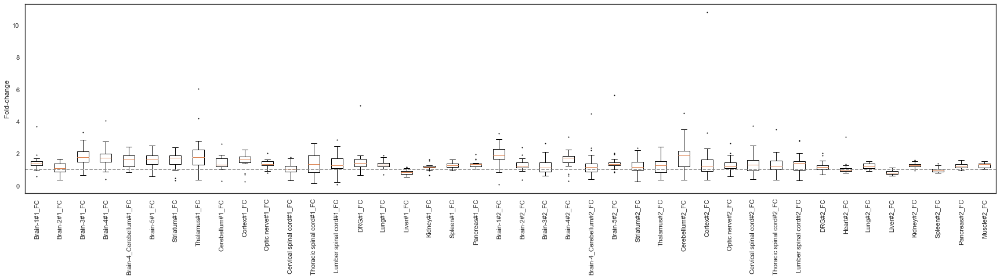

In [167]:
sns.set_style("white")
plt.figure(figsize=(30, 6))
flierprops = dict(markersize=1)
val12 = val1 + val2
label = r1.columns.tolist() + r2.columns.tolist()
plt.boxplot(val12, labels=label, flierprops=flierprops)
#plt.ylim(0, 5)
plt.axhline(y=1, color='gray', linestyle='--')
plt.xticks(rotation=90)
plt.ylabel('Fold-change')
plt.show()

In [189]:
df1 = pd.merge(df_cluster1, count_table_1, how='left', on='cluster')
df2 = pd.merge(df_cluster2, count_table_2, how='left', on='cluster')

In [190]:
df1

,cluster,AA_seq_ID,AA_seq,rep_AA_seq,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,Thalamus#1_Count,Cerebellum#1_Count,Cortex#1_Count,Optic nerve#1_Count,Cervical spinal cord#1_Count,Thoracic spinal cord#1_Count,Lumber spinal cord#1_Count,DRG#1_Count,Lung#1_Count,Liver#1_Count,Kidney#1_Count,Pancreas#1_Count,Spleen#1_Count,AAV Library#1_Count,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,Cortex#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Pancreas#1_FC,Spleen#1_FC
0,Cluster0,"AA_seq_221747,AA_seq_5508121,AA_seq_6252183,AA...","AELGAHWSK,SEMGANWSR,TEAGSKWSQ,AEVGMHWTV,SQRGAE...",AELGANWSK,2303.0,2247.0,2491.0,3103.0,2987.0,3374.0,4040.0,3296.0,2160.0,3208.0,2463.0,1747.0,2387.0,1506.0,2784.0,2170.0,1401.0,1873.0,2262.0,2000.0,1704.0,1.351526,1.318662,1.461854,1.821009,1.752934,1.980047,2.370892,1.934272,1.267606,1.882629,1.445423,1.025235,1.400822,0.883803,1.633803,1.273474,0.822183,1.099178,1.327465,1.173709
1,Cluster1,"AA_seq_2937235,AA_seq_5660716,AA_seq_4127084,A...","LDLGKTWTV,SKSGDAWTV,PDLGLKWGQ,PMSGKEWSV,PDLGNS...",PDLGLKWEQ,2996.0,2921.0,4633.0,3823.0,3722.0,3082.0,4369.0,2589.0,2576.0,3323.0,2532.0,2026.0,1375.0,4193.0,3107.0,2449.0,1792.0,2388.0,2810.0,2579.0,1998.0,1.499499,1.461962,2.318819,1.913413,1.862863,1.542543,2.186687,1.295796,1.289289,1.663163,1.267267,1.014014,0.688188,2.098599,1.555055,1.225726,0.896897,1.195195,1.406406,1.290791
2,Cluster2,"AA_seq_5040467,AA_seq_2857095,AA_seq_5035198,A...","QTTGSNWAT,KTTGRDWMQ,QTSGSMWSI,RDRGSNWAC,NTTGRG...",QTLGSNWAQ,5205.0,5077.0,5986.0,5193.0,5511.0,7683.0,5323.0,6668.0,5043.0,5386.0,6215.0,5237.0,6947.0,4567.0,5442.0,5415.0,3313.0,3566.0,5053.0,5029.0,3066.0,1.697652,1.655903,1.952381,1.693738,1.797456,2.505871,1.736138,2.174821,1.644814,1.756686,2.027071,1.708089,2.265819,1.489563,1.774951,1.766145,1.080561,1.163079,1.648076,1.640248
3,Cluster3,"AA_seq_2846102,AA_seq_2825006,AA_seq_2809353,A...","KTNGTHWEQ,KSTGTGWEQ,KSNGTDWAS,KSNGPEWAS,KSNGKE...",KSNGTHWEQ,6698.0,6760.0,7942.0,12168.0,8650.0,9732.0,11401.0,11719.0,9339.0,8294.0,7979.0,9283.0,10431.0,6831.0,5791.0,7530.0,5466.0,5053.0,7096.0,7369.0,5254.0,1.274838,1.286639,1.511610,2.315950,1.646365,1.852303,2.169966,2.230491,1.777503,1.578607,1.518652,1.766844,1.985344,1.300152,1.102208,1.433194,1.040350,0.961743,1.350590,1.402550
4,Cluster4,"AA_seq_5398469,AA_seq_5419508,AA_seq_5422257,A...","SAPGSTWEI,SAVGKSWET,SAVGTSWGT,KAPGQNWGQ,PKSGAN...",SAPGSGWEI,5176.0,3464.0,6419.0,6919.0,7874.0,7270.0,6782.0,8158.0,5248.0,7250.0,4816.0,4885.0,6643.0,4372.0,5846.0,5550.0,3375.0,4951.0,5165.0,5472.0,3979.0,1.300829,0.870570,1.613219,1.738879,1.978889,1.827092,1.704448,2.050264,1.318924,1.822066,1.210354,1.227695,1.669515,1.098769,1.469213,1.394823,0.848203,1.244282,1.298065,1.375220
5,Cluster5,"AA_seq_2518408,AA_seq_4221560,AA_seq_4542140,A...","ITGGGSWSE,PGGGMGWDV,PSVGLKWSE,PSVGRTWSE,PSGGLT...",PSVGGSWSE,4811.0,4140.0,6195.0,6161.0,5940.0,6027.0,6332.0,5838.0,4858.0,6892.0,4617.0,4300.0,3277.0,5470.0,5924.0,5126.0,3253.0,4332.0,4710.0,4692.0,3778.0,1.273425,1.095818,1.639756,1.630757,1.572260,1.595289,1.676019,1.545262,1.285866,1.824246,1.222075,1.138168,0.867390,1.447856,1.568025,1.356803,0.861038,1.146638,1.246691,1.241927
6,Cluster6,"AA_seq_3971389,AA_seq_3815976,AA_seq_3985915,A...","NTRGRDWMQ,NPTGRDWMQ,NTTGRDWRQ,TTRGTRWEE,SQRGAD...",NTTGRDWMQ,5795.0,3541.0,6683.0,6307.0,7981.0,5696.0,7661.0,11752.0,5021.0,7123.0,5474.0,3645.0,5299.0,7729.0,5178.0,5614.0,3575.0,3962.0,4707.0,5216.0,4216.0,1.374526,0.839896,1.585152,1.495968,1.893027,1.351044,1.817125,2.787476,1.190939,1.689516,1.298387,0.864564,1.256879,1.833254,1.228178,1.331594,0.847960,0.939753,1.116461,1.237192
7,Cluster7,"AA_seq_4231890,AA_seq_4259476,AA_seq_4778289,A...","PGLGNQWVQ,PGTGPSWSV,QGPGGQWVA,QGPGVQWG

In [191]:
outfile = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/PG4699_AA_seq_cluster_FC.xlsx'
with pd.ExcelWriter(outfile) as writer:
    df1.to_excel(writer, sheet_name='100-131', index=False)
    df2.to_excel(writer, sheet_name='200-231', index=False)

In [154]:
import seaborn as sns

In [156]:
count_table_1

,cluster,rep_AA_seq,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,Thalamus#1_Count,Cerebellum#1_Count,Cortex#1_Count,Optic nerve#1_Count,Cervical spinal cord#1_Count,Thoracic spinal cord#1_Count,Lumber spinal cord#1_Count,DRG#1_Count,Lung#1_Count,Liver#1_Count,Kidney#1_Count,Pancreas#1_Count,Spleen#1_Count,AAV Library#1_Count,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,Cortex#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Pancreas#1_FC,Spleen#1_FC
0,Cluster0,AELGANWSK,2303.0,2247.0,2491.0,3103.0,2987.0,3374.0,4040.0,3296.0,2160.0,3208.0,2463.0,1747.0,2387.0,1506.0,2784.0,2170.0,1401.0,1873.0,2262.0,2000.0,1704.0,1.351526,1.318662,1.461854,1.821009,1.752934,1.980047,2.370892,1.934272,1.267606,1.882629,1.445423,1.025235,1.400822,0.883803,1.633803,1.273474,0.822183,1.099178,1.327465,1.173709
1,Cluster1,PDLGLKWEQ,2996.0,2921.0,4633.0,3823.0,3722.0,3082.0,4369.0,2589.0,2576.0,3323.0,2532.0,2026.0,1375.0,4193.0,3107.0,2449.0,1792.0,2388.0,2810.0,2579.0,1998.0,1.499499,1.461962,2.318819,1.913413,1.862863,1.542543,2.186687,1.295796,1.289289,1.663163,1.267267,1.014014,0.688188,2.098599,1.555055,1.225726,0.896897,1.195195,1.406406,1.290791
2,Cluster2,QTLGSNWAQ,5205.0,5077.0,5986.0,5193.0,5511.0,7683.0,5323.0,6668.0,5043.0,5386.0,6215.0,5237.0,6947.0,4567.0,5442.0,5415.0,3313.0,3566.0,5053.0,5029.0,3066.0,1.697652,1.655903,1.952381,1.693738,1.797456,2.505871,1.736138,2.174821,1.644814,1.756686,2.027071,1.708089,2.265819,1.489563,1.774951,1.766145,1.080561,1.163079,1.648076,1.640248
3,Cluster3,KSNGTHWEQ,6698.0,6760.0,7942.0,12168.0,8650.0,9732.0,11401.0,11719.0,9339.0,8294.0,7979.0,9283.0,10431.0,6831.0,5791.0,7530.0,5466.0,5053.0,7096.0,7369.0,5254.0,1.274838,1.286639,1.511610,2.315950,1.646365,1.852303,2.169966,2.230491,1.777503,1.578607,1.518652,1.766844,1.985344,1.300152,1.102208,1.433194,1.040350,0.961743,1.350590,1.402550
4,Cluster4,SAPGSGWEI,5176.0,3464.0,6419.0,6919.0,7874.0,7270.0,6782.0,8158.0,5248.0,7250.0,4816.0,4885.0,6643.0,4372.0,5846.0,5550.0,3375.0,4951.0,5165.0,5472.0,3979.0,1.300829,0.870570,1.613219,1.738879,1.978889,1.827092,1.704448,2.050264,1.318924,1.822066,1.210354,1.227695,1.669515,1.098769,1.469213,1.394823,0.848203,1.244282,1.298065,1.375220
5,Cluster5,PSVGGSWSE,4811.0,4140.0,6195.0,6161.0,5940.0,6027.0,6332.0,5838.0,4858.0,6892.0,4617.0,4300.0,3277.0,5470.0,5924.0,5126.0,3253.0,4332.0,4710.0,4692.0,3778.0,1.273425,1.095818,1.639756,1.630757,1.572260,1.595289,1.676019,1.545262,1.285866,1.824246,1.222075,1.138168,0.867390,1.447856,1.568025,1.356803,0.861038,1.146638,1.246691,1.241927
6,Cluster6,NTTGRDWMQ,5795.0,3541.0,6683.0,6307.0,7981.0,5696.0,7661.0,11752.0,5021.0,7123.0,5474.0,3645.0,5299.0,7729.0,5178.0,5614.0,3575.0,3962.0,4707.0,5216.0,4216.0,1.374526,0.839896,1.585152,1.495968,1.893027,1.351044,1.817125,2.787476,1.190939,1.689516,1.298387,0.864564,1.256879,1.833254,1.228178,1.331594,0.847960,0.939753,1.116461,1.237192
7,Cluster7,PGLGLQWAQ,2800.0,2817.0,2745.0,3797.0,3189.0,2576.0,2805.0,2267.0,3495.0,3035.0,2643.0,3032.0,2519.0,5036.0,2795.0,2973.0,1648.0,2290.0,2733.0,3134.0,2041.0,1.371877,1.380206,1.344929,1.860363,1.562469,1.262126,1.374326,1.110730,1.712396,1.487016,1.294953,1.485546,1.234199,2.467418,1.369427,1.456639,0.807447,1.121999,1.339049,1.535522
8,Cluster8,SGTGPSWAP,4393.0,2818.0,5784.0,7103.0,7337.0,5066.0,6233.0,4447.0,5162.0,4134.0,4253.0,3171.0,6191.0,3734.0,3994.0,4369.0,2693.0,3500.0,4205.0,4324.0,3031.0,1.449357,0.929726,1.908281,2.343451,2.420653,1.671396,2.056417,1.467173,1.703068,1.363906,1.403167,1.046189,2.042560,1.231937,1.317717,1.441438,0.888486,1.154734,1.387331,1.426592
9,Cluster9,TAGGTNWET,553.0,426.0,322.0,873.0,1206.0,746.0,241.0,755.0,544.0,370.0,799.0,340.0,246.0,1422.0,661.0,613.0,367.0,770.0,670.0,795.0,495.0,1.

In [160]:
count_table_2

,cluster,rep_AA_seq,Brain-1#2_Count,Brain-2#2_Count,Brain-3#2_Count,Brain-4#2_Count,Brain-4_Cerebellum#2_Count,Brain-5#2_Count,Striatum#2_Count,Thalamus#2_Count,Cerebellum#2_Count,Cortex#2_Count,Optic nerve#2_Count,Cervical spinal cord#2_Count,Thoracic spinal cord#2_Count,Lumber spinal cord#2_Count,DRG#2_Count,Heart#2_Count,Lung#2_Count,Liver#2_Count,Kidney#2_Count,Pancreas#2_Count,Muscle#2_Count,Spleen#2_Count,AAV Library#2_Count,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,Cerebellum#2_FC,Cortex#2_FC,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,DRG#2_FC,Heart#2_FC,Lung#2_FC,Liver#2_FC,Kidney#2_FC,Pancreas#2_FC,Muscle#2_FC,Spleen#2_FC
0,Cluster0,NTTGGDWMQ,4985.0,2173.0,1483.0,5239.0,1497.0,2312.0,1998.0,1147.0,3629.0,1405.0,1975.0,1186.0,2803.0,2453.0,1203.0,1400.0,1856.0,1296.0,1853.0,1631.0,1733.0,1517.0,1727.0,2.886508,1.258251,0.858715,3.033584,0.866821,1.338738,1.156920,0.664157,2.101332,0.813550,1.143602,0.686740,1.623046,1.420382,0.696584,0.810654,1.074696,0.750434,1.072959,0.944412,1.003474,0.878402
1,Cluster1,PDLGSKWEQ,14770.0,8726.0,7051.0,9953.0,7881.0,8926.0,9427.0,7792.0,14230.0,8060.0,8956.0,7344.0,6025.0,7485.0,8143.0,6500.0,7674.0,4868.0,8437.0,8361.0,9300.0,5852.0,6700.0,2.204478,1.302388,1.052388,1.485522,1.176269,1.332239,1.407015,1.162985,2.123881,1.202985,1.336716,1.096119,0.899254,1.117164,1.215373,0.970149,1.145373,0.726567,1.259254,1.247910,1.388060,0.873433
2,Cluster2,QGHGPSWRL,1553.0,999.0,1800.0,1541.0,1895.0,1101.0,866.0,2064.0,3864.0,696.0,1633.0,2015.0,1029.0,2421.0,1049.0,941.0,1167.0,631.0,1368.0,1159.0,1245.0,954.0,856.0,1.814252,1.167056,2.102804,1.800234,2.213785,1.286215,1.011682,2.411215,4.514019,0.813084,1.907710,2.353972,1.202103,2.828271,1.225467,1.099299,1.363318,0.737150,1.598131,1.353972,1.454439,1.114486
3,Cluster3,PAPGTTWSE,6508.0,2821.0,2911.0,3386.0,1509.0,2884.0,1866.0,1913.0,4092.0,1329.0,2327.0,2330.0,1895.0,2433.0,2646.0,1907.0,2038.0,1386.0,2120.0,2437.0,2533.0,1830.0,2290.0,2.841921,1.231878,1.271179,1.478603,0.658952,1.259389,0.814847,0.835371,1.786900,0.580349,1.016157,1.017467,0.827511,1.062445,1.155459,0.832751,0.889956,0.605240,0.925764,1.064192,1.106114,0.799127
4,Cluster4,AGVGPSWMV,3833.0,5231.0,2415.0,3500.0,2462.0,3167.0,1978.0,3284.0,4808.0,3032.0,3075.0,3290.0,2906.0,2154.0,1641.0,2032.0,2766.0,1750.0,2787.0,2438.0,2479.0,2217.0,2206.0,1.737534,2.371260,1.094742,1.586582,1.116047,1.435630,0.896646,1.488667,2.179510,1.374433,1.393926,1.491387,1.317316,0.976428,0.743880,0.921124,1.253853,0.793291,1.263373,1.105168,1.123753,1.004986
5,Cluster5,NAPGSNWEQ,6227.0,7045.0,4892.0,8159.0,7510.0,5702.0,5269.0,4466.0,9908.0,5631.0,5126.0,5704.0,6736.0,6567.0,4502.0,3817.0,5258.0,3802.0,5475.0,5103.0,5137.0,4147.0,4404.0,1.413942,1.599682,1.110808,1.852634,1.705268,1.294732,1.196412,1.014078,2.249773,1.278610,1.163942,1.295186,1.529519,1.491144,1.022252,0.866712,1.193915,0.863306,1.243188,1.158719,1.166440,0.941644
6,Cluster6,SSPGPGWEF,6640.0,2907.0,2082.0,3371.0,3012.0,2655.0,3092.0,2168.0,6730.0,3140.0,3112.0,2112.0,2652.0,3620.0,3036.0,2581.0,2827.0,2178.0,3423.0,3249.0,3429.0,2549.0,2588.0,2.565688,1.123261,0.804482,1.302550,1.163833,1.025889,1.194745,0.837713,2.600464,1.213292,1.202473,0.816074,1.024730,1.398764,1.173107,0.997295,1.092349,0.841577,1.322643,1.255410,1.324961,0.984930
7,Cluster7,NTLGKNWEQ,9125.0,5522.0,5705.0,7476.0,7084.0,6819.0,5948.0,6855.0,10452.0,4665.0,5527.0,5168.0,5538.0,4929.0,6584.0,4242.0,5067.0,4717.0,6412.0,5198.0,5927.0,4531.0,5169.0,1.765332,1.068292,1.103695,1.446315,1.370478,1.319211,1.150706,1.326175,2.022055,0.902496,1.069259,0.999807,1.071387,0.953569,1.273747,0.820662,0.980267,0.912556,1.240472,1.005610,1.146643,0.876572
8,Cluster8,NTTGRDWMQ,11218.0,7060.0,5109.0,8610.0,4289.0,8231.0,7667.0,6582.0,9248.0,5234.0,5509.0,6008.0,6422.0,4654.0,5393.0,4719.0,6437.0,3845.0,6159.0,5643.0,5633.0,4887.0,4919.0,2.280545,1.435251

In [157]:
seq_1 = count_table_1.loc[:, ['rep_AA_seq'] + rep1_columns]
seq_2 = count_table_2.loc[:, ['rep_AA_seq'] + rep2_columns]

<AxesSubplot:>

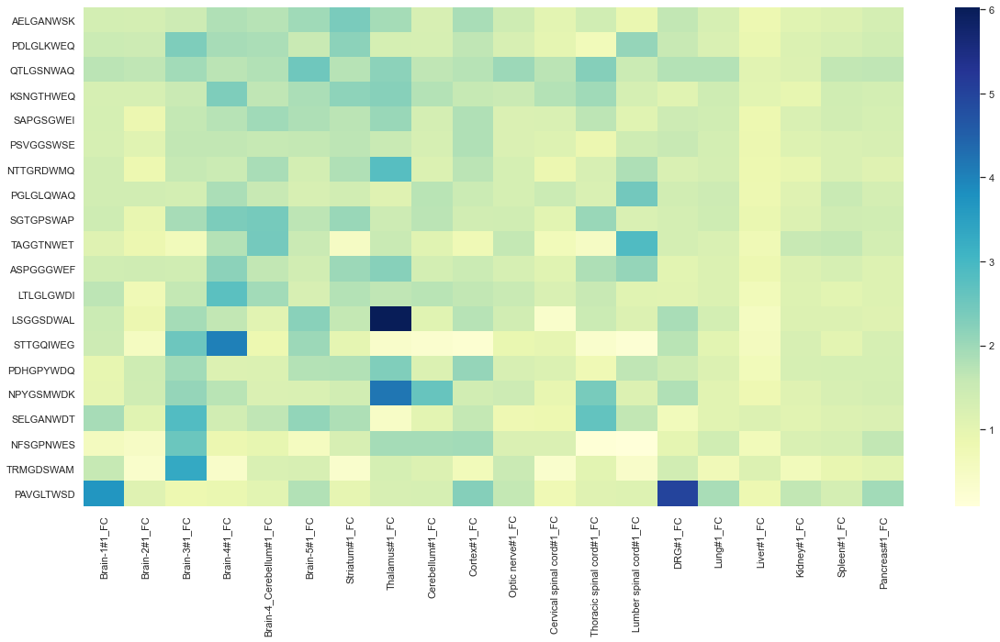

In [187]:
sns.set(rc = {'figure.figsize':(20,10)})
sns.heatmap(seq_1.iloc[:, 1:], cmap='YlGnBu', yticklabels=seq_1['rep_AA_seq'])

<AxesSubplot:>

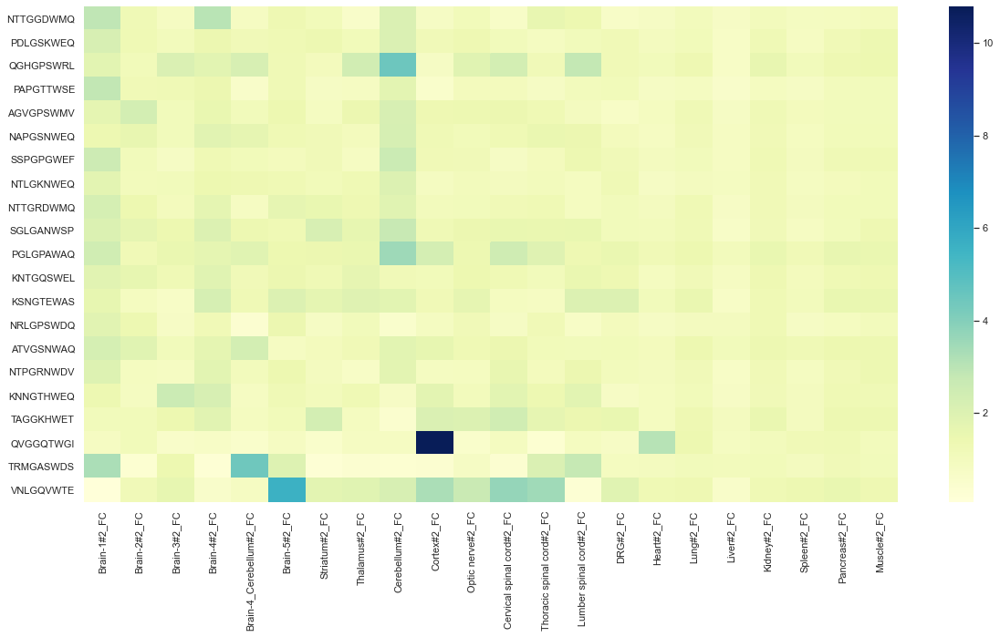

In [185]:
sns.set(rc = {'figure.figsize':(20,10)})
sns.heatmap(seq_2.iloc[:, 1:], cmap='YlGnBu', yticklabels=seq_2['rep_AA_seq'])

In [321]:
# 共通Seq
common_seq = list(set(seq_1['rep_AA_seq']) & set(seq_2['rep_AA_seq']))
print(len(common_seq))

1


## 個体間で配列クラスタリング

In [192]:
file = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/PG4699_AA_seq_cluster_FC.xlsx'
df1 = pd.read_excel(file, sheet_name='100-131')
df2 = pd.read_excel(file, sheet_name='200-231')

In [193]:
df1_c = {}
for i in range(len(df1)):
    cluster = df1.loc[i, 'cluster'] + '_1'
    df1_c[cluster] = df1.loc[i, 'rep_AA_seq']
    
df2_c = {}
for i in range(len(df2)):
    cluster = df2.loc[i, 'cluster'] + '_2'
    df2_c[cluster] = df2.loc[i, 'rep_AA_seq'] 

In [194]:
df1_mod = pd.DataFrame([df1_c.keys(), df1_c.values()]).T
df1_mod.columns = ['cluster', 'rep_AA_seq']
df2_mod = pd.DataFrame([df2_c.keys(), df2_c.values()]).T
df2_mod.columns = ['cluster', 'rep_AA_seq']

In [195]:
df12 = pd.concat([df1_mod, df2_mod]).sample(frac=1).reset_index(drop=True)

In [196]:
outdir = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit'
fa = os.path.join(outdir, 'PG4699_AA_shuf_rep12.fa')
with open(fa, 'w') as wf:
    for i in range(len(df12)):
        ID = df12.loc[i, 'cluster']
        seq = df12.loc[i, 'rep_AA_seq']
        wf.write(f'>{ID}\n')
        wf.write(f'{seq}\n')

## 個体間で共通する脳指向性候補配列の評価方法について

In [2]:
file = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
df1 = pd.read_excel(file, sheet_name='100-131')
df2 = pd.read_excel(file, sheet_name='200-231')

In [3]:
print(df1.shape)
print(df2.shape)

(300, 86)
(238, 94)


In [4]:
# tissue grouping (DRG#1: 内臓組織)----
brain_1 = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC'
]
nerve_1 = [
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC',
    'DRG#1_FC'
]
others_1 = [
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Pancreas#1_FC',
    'Spleen#1_FC',
]
# tissue grouping (DRG#2: 内臓組織)----
brain_2 = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC'
]
nerve_2 = [
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC',
    'DRG#2_FC'
]
others_2 = [
    #'Heart#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Pancreas#2_FC',
    #'Muscle#2_FC',
    'Spleen#2_FC'
]

In [5]:
rep1_FC = brain_1 + nerve_1 + others_1
rep2_FC = brain_2 + nerve_2 + others_2

In [50]:
# 終止コドンを含む配列のIDを獲得
stpcdn_seq = {}
for i in range(len(df1)):
    AA_seq_ID = df1.loc[i, 'AA_seq_ID']
    AA_seq = df1.loc[i, 'AA_seq']
    if '*' in AA_seq:
        stpcdn_seq[AA_seq_ID] = '-'

In [51]:
# 個体間で共通する配列リストの作成
common_seq = []
for i in list(set(df1['AA_seq_ID']) & set(df2['AA_seq_ID'])):
    if stpcdn_seq.get(i):
        pass
    else:
        common_seq.append(i)

In [53]:
# 個体間で共通する配列リストの作成
common_seq = []
for i in list(set(df1['AA_seq_ID']) & set(df2['AA_seq_ID'])):
    if stpcdn_seq.get(i):
        pass
    else:
        common_seq.append(i)
common_idx_rep1 = sorted([df1[df1['AA_seq_ID'] == seqID].index[0] for seqID in common_seq])
rep1_com = df1.loc[common_idx_rep1, ['AA_seq_ID', 'AA_seq'] + rep1_FC].reset_index(drop=True)
common_idx_rep2 = sorted([df2[df2['AA_seq_ID'] == seqID].index[0] for seqID in common_seq])
rep2_com = df2.loc[common_idx_rep2, ['AA_seq_ID', 'AA_seq'] + rep2_FC].reset_index(drop=True)

In [54]:
pd.set_option('display.max_rows', None)
rep1_com

,AA_seq_ID,AA_seq,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,...,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Pancreas#1_FC,Spleen#1_FC
0,AA_seq_2857095,KTTGRDWMQ,1.039604,1.019802,0.900990,1.257426,1.405941,2.574257,1.346535,1.277228,...,1.594059,1.435644,1.267327,1.029703,0.653465,1.485149,0.712871,0.544554,0.762376,1.277228
1,AA_seq_2802108,KSKGTEWAS,2.090909,3.181818,2.454545,1.818182,2.272727,5.727273,3.545455,2.363636,...,4.454545,4.454545,3.909091,2.181818,3.090909,3.727273,2.818182,2.727273,2.636364,3.363636
2,AA_seq_2743945,KNTGTHWEQ,1.195652,1.260870,1.891304,2.000000,1.804348,3.673913,1.826087,1.695652,...,2.326087,1.565217,1.956522,1.326087,1.391304,2.173913,0.869565,1.152174,1.630435,1.521739
3,AA_seq_5398469,SAPGSTWEI,1.600000,1.350000,2.000000,1.450000,2.950000,3.850000,2.350000,1.800000,...,2.350000,2.150000,1.600000,1.800000,1.000000,2.950000,1.100000,1.500000,1.150000,1.250000
4,AA_seq_5419508,SAVGKSWET,1.233333,1.666667,1.933333,1.900000,1.666667,3.600000,2.066667,2.033333,...,2.966667,2.133333,2.600000,1.633333,1.466667,2.633333,1.066667,1.100000,1.900000,1.800000
5,AA_seq_5422257,SAVGTSWGT,3.300000,1.700000,2.900000,2.100000,2.500000,7.900000,1.700000,2.700000,...,2.100000,1.900000,2.100000,1.800000,2.500000,1.600000,1.400000,3.500000,3.200000,2.700000
6,AA_seq_3815976,NPTGRDWMQ,0.790698,1.232558,1.209302,1.209302,1.395349,3.534884,1.209302,1.348837,...,1.674419,1.069767,1.651163,0.860465,0.488372,1.767442,0.883721,0.813953,0.837209,1.441860
7,AA_seq_4259476,PGTGPSWSV,1.419355,1.838710,1.903226,1.419355,1.709677,4.580645,1.741935,1.516129,...,2.354839,1.774194,1.387097,1.580645,1.064516,1.774194,1.032258,1.483871,2.322581,1.806452
8,AA_seq_3638205,NGTGTSWER,0.708333,0.708333,1.166667,0.729167,0.875000,4.041667,0.625000,0.937500,...,1.187500,0.729167,0.937500,0.645833,0.479167,1.916667,1.729167,1.020833,1.479167,1.395833
9,AA_seq_4613589,PVGGQTWGS,1.194444,1.472222,1.333333,1.194444,6.111111,8.972222,1.000000,1.194444,...,1.972222,1.694444,1.583333,1.000000,1.444444,2.222222,1.250000,1.694444,1.583333,2.083333


In [55]:
rep1_com.head()

,AA_seq_ID,AA_seq,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,...,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Pancreas#1_FC,Spleen#1_FC
0,AA_seq_2857095,KTTGRDWMQ,1.039604,1.019802,0.900990,1.257426,1.405941,2.574257,1.346535,1.277228,...,1.594059,1.435644,1.267327,1.029703,0.653465,1.485149,0.712871,0.544554,0.762376,1.277228
1,AA_seq_2802108,KSKGTEWAS,2.090909,3.181818,2.454545,1.818182,2.272727,5.727273,3.545455,2.363636,...,4.454545,4.454545,3.909091,2.181818,3.090909,3.727273,2.818182,2.727273,2.636364,3.363636
2,AA_seq_2743945,KNTGTHWEQ,1.195652,1.260870,1.891304,2.000000,1.804348,3.673913,1.826087,1.695652,...,2.326087,1.565217,1.956522,1.326087,1.391304,2.173913,0.869565,1.152174,1.630435,1.521739
3,AA_seq_5398469,SAPGSTWEI,1.600000,1.350000,2.000000,1.450000,2.950000,3.850000,2.350000,1.800000,...,2.350000,2.150000,1.600000,1.800000,1.000000,2.950000,1.100000,1.500000,1.150000,1.250000
4,AA_seq_5419508,SAVGKSWET,1.233333,1.666667,1.933333,1.900000,1.666667,3.600000,2.066667,2.033333,...,2.966667,2.133333,2.600000,1.633333,1.466667,2.633333,1.066667,1.100000,1.900000,1.800000


In [56]:
# 個体間のFC平均の算出準備
rep12_com = pd.merge(rep1_com, rep2_com, on='AA_seq_ID', how='left').drop('AA_seq_y', axis=1)

In [57]:
rep12_com.shape

(99, 42)

In [58]:
rep12_FC1 =  rep12_com.loc[:, rep1_FC]
rep12_FC2 =  rep12_com.loc[:, rep2_FC]

In [59]:
rep12_FC1.head()

,Brain-1#1_FC,Brain-2#1_FC,Brain-3#1_FC,Brain-4#1_FC,Brain-4_Cerebellum#1_FC,Brain-5#1_FC,Striatum#1_FC,Thalamus#1_FC,Cerebellum#1_FC,Cortex#1_FC,Optic nerve#1_FC,Cervical spinal cord#1_FC,Thoracic spinal cord#1_FC,Lumber spinal cord#1_FC,DRG#1_FC,Lung#1_FC,Liver#1_FC,Kidney#1_FC,Pancreas#1_FC,Spleen#1_FC
0,1.039604,1.019802,0.900990,1.257426,1.405941,2.574257,1.346535,1.277228,1.475248,1.534653,1.594059,1.435644,1.267327,1.029703,0.653465,1.485149,0.712871,0.544554,0.762376,1.277228
1,2.090909,3.181818,2.454545,1.818182,2.272727,5.727273,3.545455,2.363636,3.454545,3.454545,4.454545,4.454545,3.909091,2.181818,3.090909,3.727273,2.818182,2.727273,2.636364,3.363636
2,1.195652,1.260870,1.891304,2.000000,1.804348,3.673913,1.826087,1.695652,1.239130,2.260870,2.326087,1.565217,1.956522,1.326087,1.391304,2.173913,0.869565,1.152174,1.630435,1.521739
3,1.600000,1.350000,2.000000,1.450000,2.950000,3.850000,2.350000,1.800000,1.850000,2.400000,2.350000,2.150000,1.600000,1.800000,1.000000,2.950000,1.100000,1.500000,1.150000,1.250000
4,1.233333,1.666667,1.933333,1.900000,1.666667,3.600000,2.066667,2.033333,1.600000,2.900000,2.966667,2.133333,2.600000,1.633333,1.466667,2.633333,1.066667,1.100000,1.900000,1.800000


In [60]:
brain = [
    'Brain-1_FC',
    'Brain-2_FC',
    'Brain-3_FC',
    'Brain-4_FC',
    'Brain-4_Cerebellum_FC',
    'Brain-5_FC',
    'Striatum_FC',
    'Thalamus_FC',
    'Cerebellum_FC',
    'Cortex_FC'
]
nerve = [
    'Optic nerve_FC',
    'Cervical spinal cord_FC',
    'Thoracic spinal cord_FC',
    'Lumber spinal cord_FC',
    'DRG_FC'
]
others = [
    'Lung_FC',
    'Liver_FC',
    'Kidney_FC',
    'Pancreas_FC',
    'Spleen_FC',
]
FC_col = brain + nerve + others

In [61]:
brain = [
    'Brain-1_std',
    'Brain-2_std',
    'Brain-3_std',
    'Brain-4_std',
    'Brain-4_Cerebellum_std',
    'Brain-5_std',
    'Striatum_std',
    'Thalamus_std',
    'Cerebellum_std',
    'Cortex_std'
]
nerve = [
    'Optic nerve_std',
    'Cervical spinal cord_std',
    'Thoracic spinal cord_std',
    'Lumber spinal cord_std',
    'DRG_std'
]
others = [
    'Lung_std',
    'Liver_std',
    'Kidney_std',
    'Pancreas_std',
    'Spleen_std',
]
std_col = brain + nerve + others

In [62]:
ave = (np.array(rep12_FC1) + np.array(rep12_FC2)) / 2
FC_ave = pd.DataFrame(ave, columns=FC_col)
rep12_FC = pd.concat([rep12_com.loc[:, ['AA_seq_ID', 'AA_seq_x'] ], FC_ave], axis=1)

In [63]:
# 標準偏差
total = ((((np.array(rep12_FC1) - ave) **2) + ((np.array(rep12_FC2) - ave) **2))) / 2
std = np.sqrt(total)
FC_std = pd.DataFrame(std, columns=std_col)
rep12_std = pd.concat([rep12_com.loc[:, ['AA_seq_ID', 'AA_seq_x'] ], FC_std], axis=1)

In [64]:
# FC値の平均と標準偏差の表
df_stats = pd.merge(rep12_FC, rep12_std.drop('AA_seq_x', axis=1), on='AA_seq_ID', how='left')
outf = 'A:/PROJECT/PG4699/200_INFO/08_rep_perfomance/PG4699_rep12_comAAseq_FC_stats.xlsx'
df_stats.to_excel(outf, index=False)

In [21]:
# 組織間での順位(横)
seq_FC = np.array(rep12_FC.iloc[:, 2:])
seq_sum = np.sum(seq_FC, axis=1, keepdims=True)
seq_val = (seq_FC / seq_sum) * 100
df_seq = pd.DataFrame(seq_val, columns=rep12_FC.iloc[:, 2:].columns)
tissue_rank = pd.concat([rep12_FC.loc[:, ['AA_seq_ID', 'AA_seq_x'] ], df_seq], axis=1)

In [65]:
tissue_rank.sum(axis=1)

0     100.0
1     100.0
2     100.0
3     100.0
4     100.0
5     100.0
6     100.0
7     100.0
8     100.0
9     100.0
10    100.0
11    100.0
12    100.0
13    100.0
14    100.0
15    100.0
16    100.0
17    100.0
18    100.0
19    100.0
20    100.0
21    100.0
22    100.0
23    100.0
24    100.0
25    100.0
26    100.0
27    100.0
28    100.0
29    100.0
30    100.0
31    100.0
32    100.0
33    100.0
34    100.0
35    100.0
36    100.0
37    100.0
38    100.0
39    100.0
40    100.0
41    100.0
42    100.0
43    100.0
44    100.0
45    100.0
46    100.0
47    100.0
48    100.0
49    100.0
50    100.0
51    100.0
52    100.0
53    100.0
54    100.0
55    100.0
56    100.0
57    100.0
58    100.0
59    100.0
60    100.0
61    100.0
62    100.0
63    100.0
64    100.0
65    100.0
66    100.0
67    100.0
68    100.0
69    100.0
70    100.0
71    100.0
72    100.0
73    100.0
74    100.0
75    100.0
76    100.0
77    100.0
78    100.0
79    100.0
80    100.0
81    100.0
82    100.0
83  

In [66]:
tissue_rank.max()

AA_seq_ID                  AA_seq_817614
AA_seq_x                       VMQGSSWET
Brain-1_FC                     21.054798
Brain-2_FC                      26.46891
Brain-3_FC                     27.828531
Brain-4_FC                     34.259503
Brain-4_Cerebellum_FC          18.749552
Brain-5_FC                     19.932345
Striatum_FC                    17.471441
Thalamus_FC                    18.244765
Cerebellum_FC                  26.314888
Cortex_FC                      23.494983
Optic nerve_FC                 12.096501
Cervical spinal cord_FC        25.232425
Thoracic spinal cord_FC        17.189484
Lumber spinal cord_FC          22.777818
DRG_FC                         14.280576
Lung_FC                         7.851432
Liver_FC                        6.006926
Kidney_FC                       9.137442
Pancreas_FC                     8.935076
Spleen_FC                       6.824833
dtype: object

In [67]:
tissue_rank.head()

,AA_seq_ID,AA_seq_x,Brain-1_FC,Brain-2_FC,Brain-3_FC,Brain-4_FC,Brain-4_Cerebellum_FC,Brain-5_FC,Striatum_FC,Thalamus_FC,...,Optic nerve_FC,Cervical spinal cord_FC,Thoracic spinal cord_FC,Lumber spinal cord_FC,DRG_FC,Lung_FC,Liver_FC,Kidney_FC,Pancreas_FC,Spleen_FC
0,AA_seq_5081336,R*NGTVWEQ,4.524098,4.001212,4.167930,5.562292,3.811761,6.964232,4.887845,17.467414,...,4.448318,4.478630,4.023947,5.031828,3.940588,4.327069,2.856926,4.031525,2.379509,3.940588
1,AA_seq_2857095,KTTGRDWMQ,4.341025,6.040691,3.726878,6.002898,4.335776,7.790399,9.576151,4.585984,...,4.535593,5.267670,4.675919,5.314562,3.430477,5.418845,3.244308,2.440492,3.395483,4.303231
2,AA_seq_2802108,KSKGTEWAS,3.669725,4.600262,4.364351,20.989515,2.647444,5.858453,4.429882,2.712975,...,5.157274,4.148100,4.619921,3.374836,4.462647,4.056356,3.977720,4.200524,4.711664,3.650066
3,AA_seq_2743945,KNTGTHWEQ,5.965411,6.800902,4.948896,5.700838,4.155179,7.608544,5.650709,4.107834,...,4.625839,4.230373,4.695463,4.689893,5.141059,5.046370,3.389311,3.999220,4.873702,3.673378
4,AA_seq_5398469,SAPGSTWEI,4.321346,5.118910,4.857889,5.379930,6.540023,7.801624,5.553944,5.278422,...,4.538863,2.929234,5.408933,3.755800,3.915313,6.902552,2.871230,3.480278,3.581787,3.915313


In [69]:
tissue = {
    'Brain-1_FC': 'brain',
    'Brain-2_FC': 'brain',
    'Brain-3_FC': 'brain',
    'Brain-4_FC': 'brain',
    'Brain-4_Cerebellum_FC': 'brain',
    'Brain-5_FC': 'brain',
    'Striatum_FC': 'brain',
    'Thalamus_FC': 'brain',
    'Cerebellum_FC': 'brain',
    'Cortex_FC': 'brain',
    'Optic nerve_FC': 'nerve',
    'Cervical spinal cord_FC': 'nerve',
    'Thoracic spinal cord_FC': 'nerve',
    'Lumber spinal cord_FC': 'nerve',
    'DRG_FC': 'nerve',
    'Lung_FC': 'others',
    'Liver_FC': 'others',
    'Kidney_FC': 'others',
    'Pancreas_FC': 'others',
    'Spleen_FC': 'others',
}

In [70]:
X = tissue_rank.iloc[:, 2:].T
X.columns = tissue_rank['AA_seq_ID'].tolist()
X.head()

,AA_seq_5081336,AA_seq_2857095,AA_seq_2802108,AA_seq_2743945,AA_seq_5398469,AA_seq_5419508,AA_seq_5422257,AA_seq_3815976,AA_seq_4259476,AA_seq_3638205,...,AA_seq_4125517,AA_seq_3985789,AA_seq_5293206,AA_seq_3495875,AA_seq_4790077,AA_seq_3416807,AA_seq_5654635,AA_seq_4127632,AA_seq_4127017,AA_seq_3660120
Brain-1_FC,4.524098,4.341025,3.669725,5.965411,4.321346,4.640178,4.778637,3.420976,3.989266,2.574111,...,5.404276,5.880166,3.107960,5.085950,6.145031,1.700453,7.734539,5.373399,3.468983,1.312109
Brain-2_FC,4.001212,6.040691,4.600262,6.800902,5.118910,5.612670,3.865074,4.485764,12.578056,3.086531,...,5.817993,6.122303,2.203136,6.836198,6.998258,1.731048,6.466979,6.106501,8.844475,1.698415
Brain-3_FC,4.167930,3.726878,4.364351,4.948896,4.857889,4.612392,27.828531,2.825392,4.011199,2.802298,...,4.917040,4.420899,2.159193,4.423924,5.263063,1.530347,5.966414,4.919574,2.638983,1.298788
Brain-4_FC,5.562292,6.002898,20.989515,5.700838,5.379930,5.529314,3.092059,19.877978,4.389224,2.708221,...,6.244684,5.087432,11.529012,4.688166,6.166586,2.040055,6.902955,6.176321,10.839793,1.312109
Brain-4_Cerebellum_FC,3.811761,4.335776,2.647444,4.155179,6.540023,3.778827,4.638089,3.803021,3.154513,2.750255,...,4.599905,4.312069,2.356936,2.739025,4.382892,3.468215,4.440497,4.296571,4.186932,1.385374


In [71]:
num = 10
tissue_score = {}
tissue_rank_list = {} # グラフの作成に使う
for AA_seq_ID in X.columns:
    cnt = 0
    tmp = []
    tissue_list = X.sort_values(AA_seq_ID, ascending=False).index.values
    for i,  t in enumerate(tissue_list):
        tmp.append(t)
        if i < num:
            if tissue[t] == 'brain':
                cnt += 1
    tissue_score[AA_seq_ID] = cnt / num
    tissue_rank_list[AA_seq_ID] = tmp

In [72]:
tissue_score

{'AA_seq_5081336': 0.6,
 'AA_seq_2857095': 0.6,
 'AA_seq_2802108': 0.6,
 'AA_seq_2743945': 0.7,
 'AA_seq_5398469': 0.8,
 'AA_seq_5419508': 0.6,
 'AA_seq_5422257': 0.6,
 'AA_seq_3815976': 0.7,
 'AA_seq_4259476': 0.5,
 'AA_seq_3638205': 0.3,
 'AA_seq_4613589': 0.4,
 'AA_seq_3494688': 0.7,
 'AA_seq_4789577': 0.9,
 'AA_seq_3368115': 0.7,
 'AA_seq_6970620': 0.6,
 'AA_seq_4976136': 0.2,
 'AA_seq_3544425': 0.6,
 'AA_seq_540734': 0.6,
 'AA_seq_4496129': 0.6,
 'AA_seq_304506': 0.5,
 'AA_seq_3952319': 0.7,
 'AA_seq_3483146': 0.5,
 'AA_seq_4876307': 0.5,
 'AA_seq_5968120': 0.5,
 'AA_seq_6136102': 0.7,
 'AA_seq_5422636': 0.5,
 'AA_seq_592333': 0.5,
 'AA_seq_4168118': 0.4,
 'AA_seq_4127084': 0.5,
 'AA_seq_5924977': 0.6,
 'AA_seq_4242317': 0.8,
 'AA_seq_373200': 0.4,
 'AA_seq_3600188': 0.8,
 'AA_seq_3602127': 0.8,
 'AA_seq_5572799': 0.5,
 'AA_seq_6347631': 0.6,
 'AA_seq_540747': 0.6,
 'AA_seq_6540040': 0.5,
 'AA_seq_6153519': 0.5,
 'AA_seq_5952781': 0.7,
 'AA_seq_6069126': 0.6,
 'AA_seq_5950437': 0.

In [73]:
df_tissue_score = pd.DataFrame([tissue_score.keys(), tissue_score.values()]).T
df_tissue_score.columns = ['AA_seq_ID', 'tissue_score']
df_tissue_score.head()

,AA_seq_ID,tissue_score
0,AA_seq_5081336,0.6
1,AA_seq_2857095,0.6
2,AA_seq_2802108,0.6
3,AA_seq_2743945,0.7
4,AA_seq_5398469,0.8


In [74]:
# 配列間での順位（縦）
seq_FC = np.array(rep12_FC.iloc[:, 2:]).T
tissue_sum = np.sum(seq_FC, axis=1, keepdims=True)
seq_val = (seq_FC / tissue_sum) * 100
df_seq = pd.DataFrame(seq_val.T, columns=rep12_FC.iloc[:, 2:].columns)
seq_rank = pd.concat([rep12_FC.loc[:, ['AA_seq_ID', 'AA_seq_x'] ], df_seq], axis=1)

In [75]:
seq_rank.sum()

AA_seq_ID                  AA_seq_2857095AA_seq_2802108AA_seq_2743945AA_s...
AA_seq_x                   KTTGRDWMQKSKGTEWASKNTGTHWEQSAPGSTWEISAVGKSWETS...
Brain-1_FC                                                             100.0
Brain-2_FC                                                             100.0
Brain-3_FC                                                             100.0
Brain-4_FC                                                             100.0
Brain-4_Cerebellum_FC                                                  100.0
Brain-5_FC                                                             100.0
Striatum_FC                                                            100.0
Thalamus_FC                                                            100.0
Cerebellum_FC                                                          100.0
Cortex_FC                                                              100.0
Optic nerve_FC                                                         100.0

In [76]:
seq_rank.max()

AA_seq_ID                  AA_seq_817614
AA_seq_x                       VMQGSSWET
Brain-1_FC                       5.60138
Brain-2_FC                      5.678047
Brain-3_FC                       8.43776
Brain-4_FC                      4.937627
Brain-4_Cerebellum_FC           6.308887
Brain-5_FC                      3.004928
Striatum_FC                     3.168134
Thalamus_FC                     4.397197
Cerebellum_FC                   4.217706
Cortex_FC                       4.997463
Optic nerve_FC                   3.37811
Cervical spinal cord_FC         7.621965
Thoracic spinal cord_FC         3.982862
Lumber spinal cord_FC           7.700131
DRG_FC                           3.67228
Lung_FC                         2.278533
Liver_FC                        2.333262
Kidney_FC                       2.066411
Pancreas_FC                     2.551429
Spleen_FC                       2.810204
dtype: object

In [77]:
# brainグループのみに着目
brain = [
    'Brain-1_FC',
    'Brain-2_FC',
    'Brain-3_FC',
    'Brain-4_FC',
    'Brain-4_Cerebellum_FC',
    'Brain-5_FC',
    'Striatum_FC',
    'Thalamus_FC',
    'Cerebellum_FC',
    'Cortex_FC'
]
Y = seq_rank.loc[:, ['AA_seq_ID'] + brain]
num_seq = Y.shape[0]
num_tissue = len(brain)
seq_score_brain = {}
for AA_seq_ID in Y['AA_seq_ID']:
    rank_score = 0
    for tissue in Y.iloc[:, 1:].columns:
        tissue_i = Y.sort_values(tissue, ascending=False).reset_index()
        rank = tissue_i[tissue_i['AA_seq_ID'] == AA_seq_ID].index[0] + 1
        rank_score += (num_seq - rank) / (num_seq - 1)
    seq_score_brain[AA_seq_ID] = rank_score / num_tissue

In [78]:
df_seq_score_brain = pd.DataFrame([seq_score_brain.keys(), seq_score_brain.values()]).T
df_seq_score_brain.columns = ['AA_seq_ID', 'seq_score_brain']
df_seq_score_brain.head()

,AA_seq_ID,seq_score_brain
0,AA_seq_2857095,0.422449
1,AA_seq_2802108,0.74898
2,AA_seq_2743945,0.691837
3,AA_seq_5398469,0.671429
4,AA_seq_5419508,0.803061


In [79]:
# othersグループのみに着目
others = [
    'Lung_FC',
    'Liver_FC',
    'Kidney_FC',
    'Pancreas_FC',
    'Spleen_FC',
]
Z = seq_rank.loc[:, ['AA_seq_ID'] + others]
num_seq = Z.shape[0]
num_tissue = len(others)
seq_score_others = {}
for AA_seq_ID in Z['AA_seq_ID']:
    rank_score = 0
    for tissue in Z.iloc[:, 1:].columns:
        tissue_i = Z.sort_values(tissue).reset_index()
        rank = tissue_i[tissue_i['AA_seq_ID'] == AA_seq_ID].index[0] + 1
        rank_score += (num_seq - rank) / (num_seq - 1)
    seq_score_others[AA_seq_ID] = rank_score / num_tissue

In [80]:
df_seq_score_others = pd.DataFrame([seq_score_others.keys(), seq_score_others.values()]).T
df_seq_score_others.columns = ['AA_seq_ID', 'seq_score_others']
df_seq_score_others.head()

,AA_seq_ID,seq_score_others
0,AA_seq_2857095,0.742857
1,AA_seq_2802108,0.063265
2,AA_seq_2743945,0.218367
3,AA_seq_5398469,0.377551
4,AA_seq_5419508,0.122449


In [81]:
# 組織間スコアと配列間スコアの対応表
df_tmp = pd.merge(df_tissue_score, df_seq_score_brain, on='AA_seq_ID', how='left')
df_score = pd.merge(df_tmp, df_seq_score_others, on='AA_seq_ID', how='left')
df_score['g_mean'] = (df_score['tissue_score'] * df_score['seq_score_brain'] * df_score['seq_score_others'])**(1/3)
df_seq = rep12_FC.loc[:, ['AA_seq_ID', 'AA_seq_x']]
df_merge = pd.merge(df_seq, df_score, on='AA_seq_ID', how='left')
brain_com = df_merge.sort_values('g_mean', ascending=False).reset_index(drop=True)

In [82]:
brain_com

,AA_seq_ID,AA_seq_x,tissue_score,seq_score_brain,seq_score_others,g_mean
0,AA_seq_3600188,NFGGTGWDT,0.8,0.70102,0.571429,0.684323
1,AA_seq_3416815,MSLGSSWET,0.8,0.634694,0.614286,0.678175
2,AA_seq_3602127,NFSGAKWEQ,0.8,0.435714,0.881633,0.674828
3,AA_seq_4242317,PGPGQAWAA,0.8,0.459184,0.791837,0.662579
4,AA_seq_2684606,KIQGQSWEL,0.7,0.589796,0.673469,0.652688
5,AA_seq_4231722,PGLGNGWDI,0.7,0.443878,0.830612,0.636678
6,AA_seq_1936517,GQSGPSWMV,0.7,0.560204,0.616327,0.6229
7,AA_seq_801129,DFSGPNWSA,0.7,0.453061,0.755102,0.620993
8,AA_seq_3510045,NATGRDWMQ,0.6,0.487755,0.804082,0.617378
9,AA_seq_3952319,NTKGRDWMQ,0.7,0.42449,0.791837,0.617353


In [83]:
outf = 'A:/PROJECT/PG4699/200_INFO/08_rep_perfomance/PG4699_rep12_comAAseq_performance.xlsx'
brain_com.to_excel(outf, index=False)

In [84]:
# top10の抽出
top10 = brain_com.loc[:9, ['AA_seq_ID', 'AA_seq_x']]

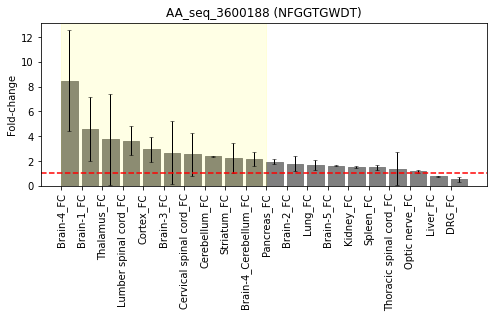

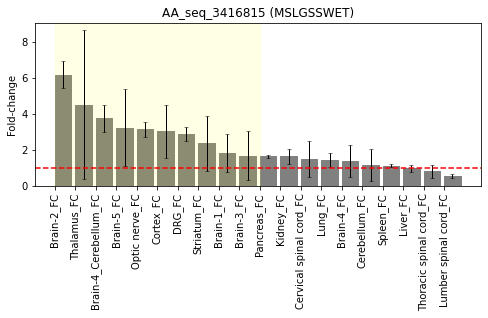

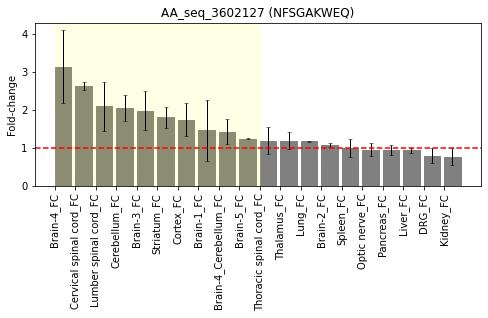

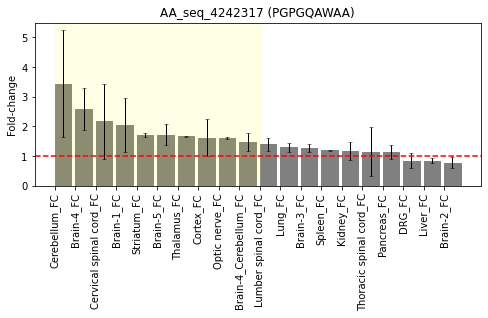

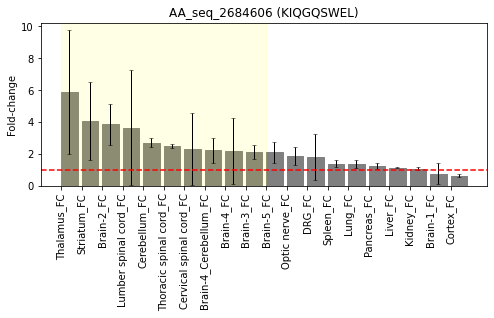

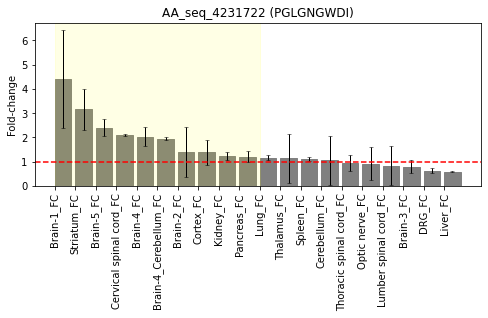

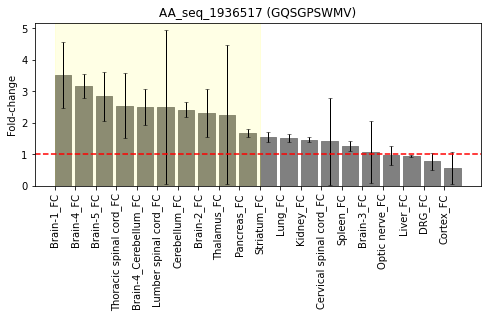

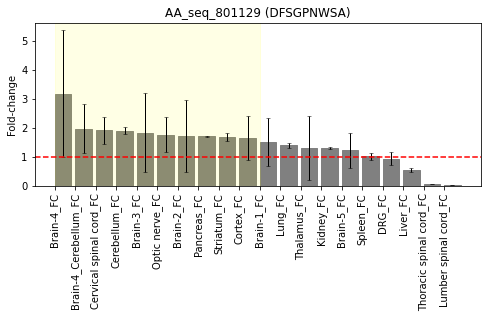

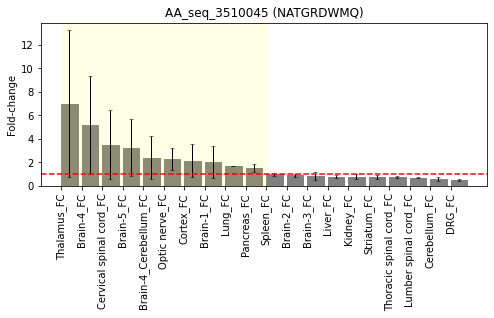

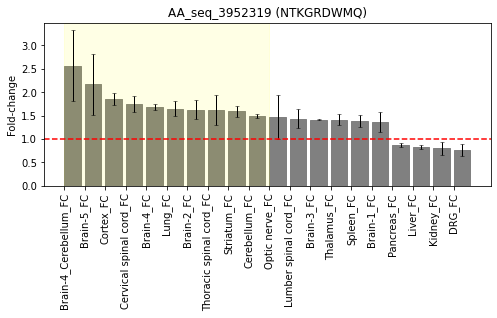

In [97]:
# 組織で順位付け
for i in range(len(top10)):
    seqID = top10.loc[i, 'AA_seq_ID']
    AA_seq = top10.loc[i, 'AA_seq_x']
    x = tissue_rank_list[seqID]
    y = rep12_FC[rep12_FC['AA_seq_ID'] == seqID].loc[:, x].values[0].tolist()
    xx = [name.replace('FC', 'std') for name in x]
    z = rep12_std[rep12_std['AA_seq_ID'] == seqID].loc[:, xx].values[0].tolist()
    
    fig, ax = plt.subplots(figsize=(8, 3))
    error_bar_set = dict(lw=1, capthick=0.5, capsize=2)
    ax.bar(x, y, color='gray', edgecolor='gray', yerr=z , error_kw=error_bar_set, align='edge')
    ax.axvspan(x[0],  x[10], color='yellow', alpha=0.1)
    #plt.ylim(0, 30)
    plt.xticks(rotation=90)
    plt.axhline(y=1, color='red', linestyle='--')
    plt.title(f'{seqID} ({AA_seq})')
    plt.ylabel('Fold-change')
    fname = 'PG4699_' + 'tissue_score_' + 'rank_' + str(i+1) + '.png'
    plt.savefig('A:/PROJECT/PG4699/200_INFO/08_rep_perfomance/' + fname, bbox_inches='tight', dpi=300)
    plt.show()

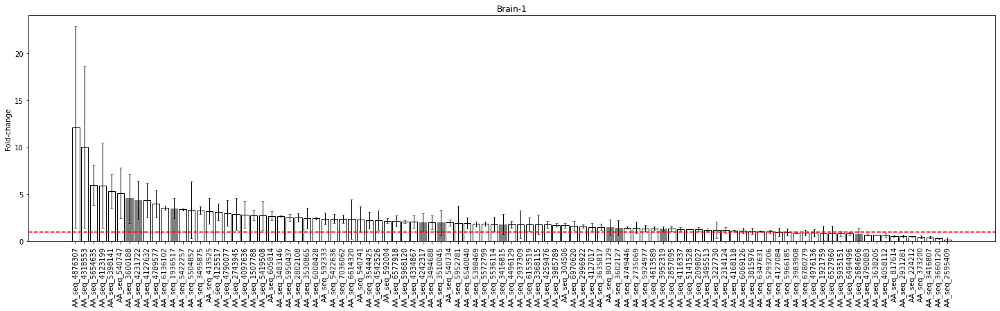

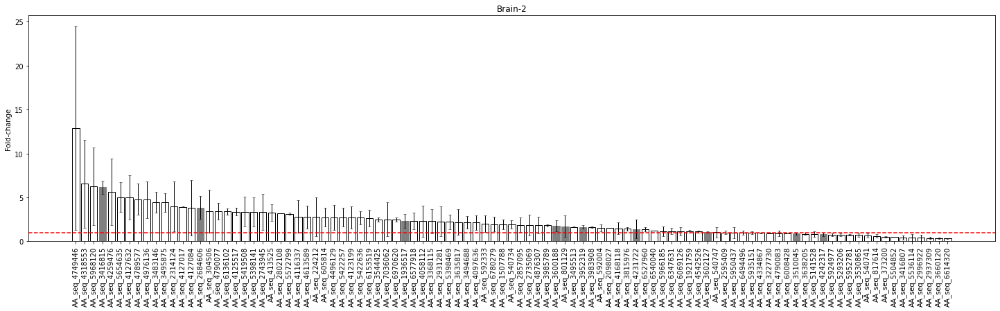

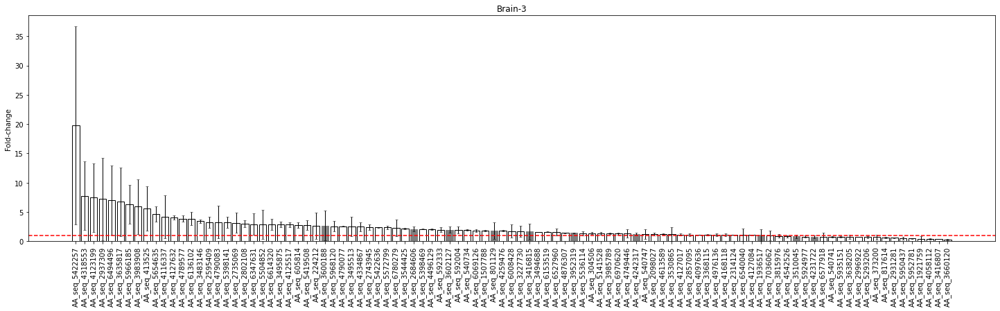

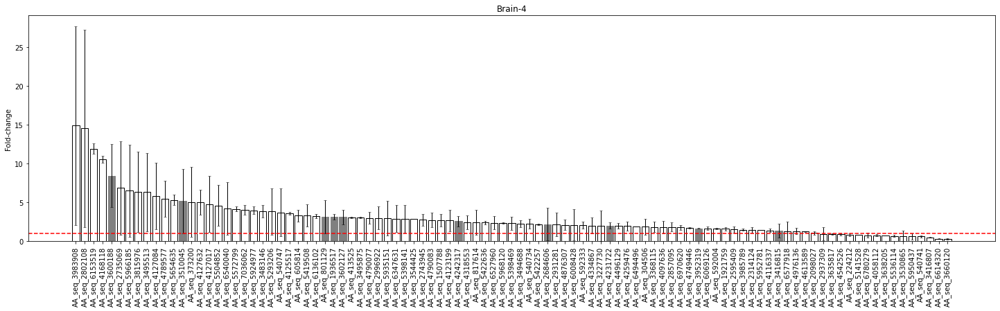

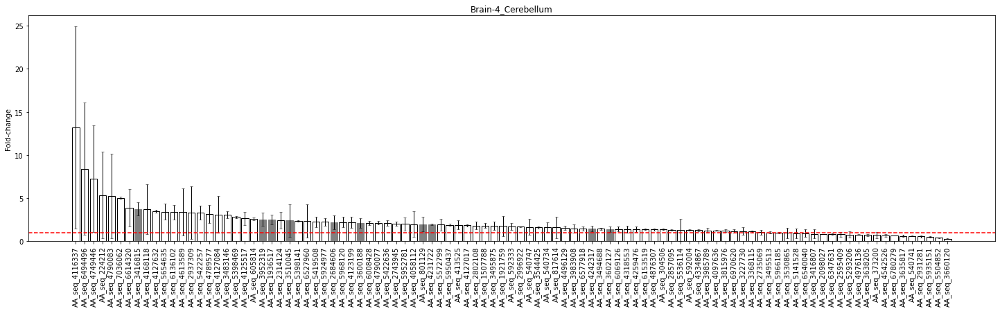

...

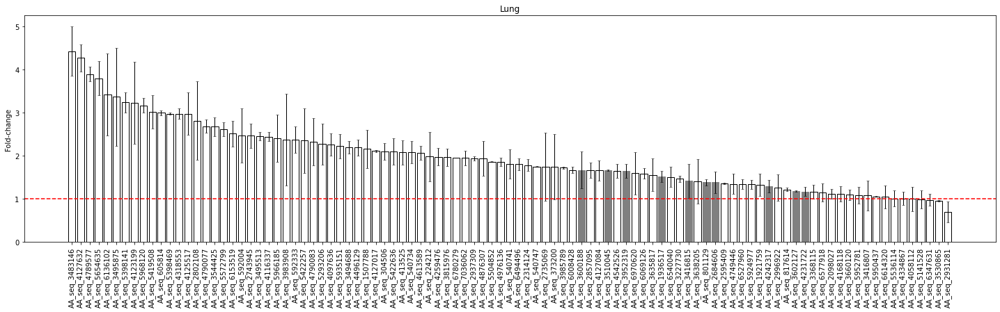

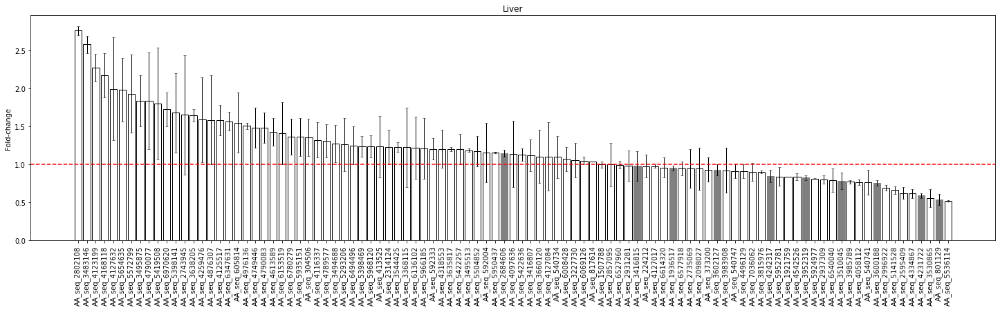

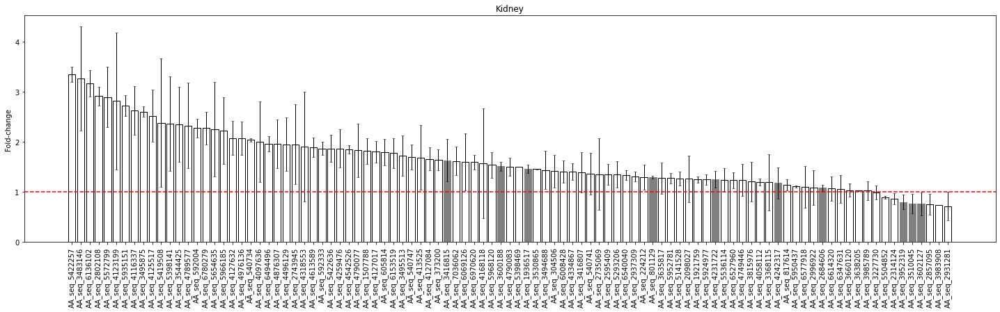

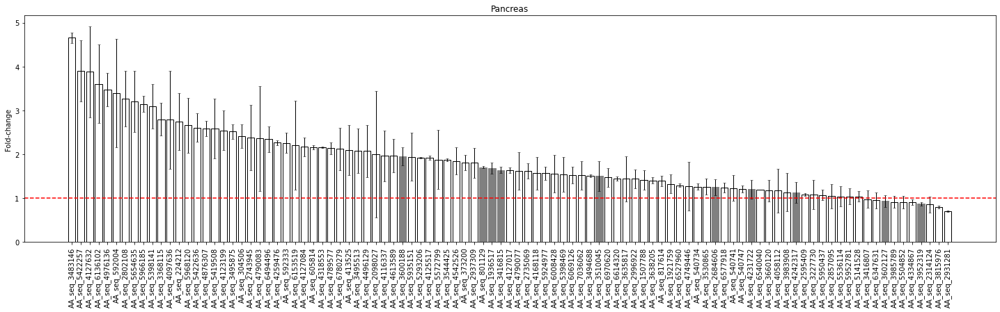

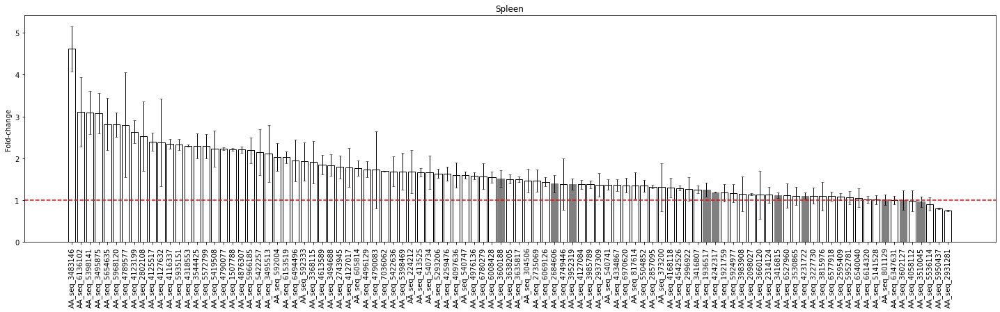

In [98]:
# 10個の脳組織で配列の順位(斜線はTop10配列)
brain = [
    'Brain-1',
    'Brain-2',
    'Brain-3',
    'Brain-4',
    'Brain-4_Cerebellum',
    'Brain-5',
    'Striatum',
    'Thalamus',
    'Cerebellum',
    'Cortex'
]
nerve = [
    'Optic nerve',
    'Cervical spinal cord',
    'Thoracic spinal cord',
    'Lumber spinal cord',
    'DRG'
]
others = [
    'Lung',
    'Liver',
    'Kidney',
    'Pancreas',
    'Spleen',
]

all_tissues = brain + nerve + others

for tissue in all_tissues:
    tissue_FC = tissue + '_FC'
    tissue_std = tissue + '_std'
    df_sort = df_stats.sort_values(tissue_FC, ascending=False).reset_index()
    x = df_sort['AA_seq_ID'].tolist()
    y = df_sort[tissue_FC].values.tolist()
    z = df_sort[tissue_std].values.tolist()

    fig, ax = plt.subplots(figsize=(25, 6))
    error_bar_set = dict(lw=1, capthick=0.5, capsize=2)
    bar = ax.bar(x, y, color='white', edgecolor='black', yerr=z , error_kw=error_bar_set)

    for AA_seq_ID in top10['AA_seq_ID']:
        idx = x.index(AA_seq_ID)
        bar[idx].set_color('gray')

    plt.xticks(rotation=90)
    plt.axhline(y=1, color='red', linestyle='--')
    #ax.legend(
    #    bbox_to_anchor=(1.05, 1),
    #    loc='upper right',
    #    #borderaxespad=0,
    #    fontsize=8
    #)
    #plt.ylim(0, 30)
    plt.title(f'{tissue}')
    plt.ylabel('Fold-change')
    fname = 'PG4699_' + 'seq_score_' + tissue + '.png'
    plt.savefig('A:/PROJECT/PG4699/200_INFO/08_rep_perfomance/' + fname, bbox_inches='tight', dpi=300)
    plt.show()

In [199]:
# 代表配列の決定
file = 'A:/PROJECT/PG4699/200_INFO/07_cd-hit/PG4699_AA_seq_cluster.xlsx'
df1_c = pd.read_excel(file, sheet_name='100-131')
df2_c = pd.read_excel(file, sheet_name='200-231')

## 個体別での脳指向性候補配列の評価方法について

In [3]:
file = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/DRG(Nerve)/PG4699_Brain_Cluster_Common_Consensus_frequency.xlsx'
df1 = pd.read_excel(file, sheet_name='100-131')
df2 = pd.read_excel(file, sheet_name='200-231')

In [5]:
print(df1.shape)
print(df2.shape)

(300, 86)
(238, 94)


In [6]:
# tissue grouping (DRG#1: 内臓組織)----
brain_1 = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC'
]
nerve_1 = [
    'Optic nerve#1_FC',
    'Cervical spinal cord#1_FC',
    'Thoracic spinal cord#1_FC',
    'Lumber spinal cord#1_FC',
    'DRG#1_FC'
]
others_1 = [
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Pancreas#1_FC',
    'Spleen#1_FC',
]
# tissue grouping (DRG#2: 内臓組織)----
brain_2 = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC'
]
nerve_2 = [
    'Optic nerve#2_FC',
    'Cervical spinal cord#2_FC',
    'Thoracic spinal cord#2_FC',
    'Lumber spinal cord#2_FC',
    'DRG#2_FC'
]
others_2 = [
    #'Heart#2_FC',
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Pancreas#2_FC',
    #'Muscle#2_FC',
    'Spleen#2_FC'
]

rep1_FC = brain_1 + nerve_1 + others_1
rep2_FC = brain_2 + nerve_2 + others_2

In [7]:
# 終止コドンを含む配列のIDを獲得
stpcdn_seq1 = {}
for i in range(len(df1)):
    AA_seq_ID = df1.loc[i, 'AA_seq_ID']
    AA_seq = df1.loc[i, 'AA_seq']
    if '*' in AA_seq:
        stpcdn_seq1[AA_seq_ID] = '-'
        
stpcdn_seq2 = {}
for i in range(len(df2)):
    AA_seq_ID = df2.loc[i, 'AA_seq_ID']
    AA_seq = df2.loc[i, 'AA_seq']
    if '*' in AA_seq:
        stpcdn_seq2[AA_seq_ID] = '-'

In [8]:
# 個体間で共通する配列リストの作成
seq1 = []
for i in df1['AA_seq_ID']:
    if stpcdn_seq1.get(i):
        pass
    else:
        seq1.append(i)

seq2 = []
for i in df2['AA_seq_ID']:
    if stpcdn_seq2.get(i):
        pass
    else:
        seq2.append(i)

In [9]:
print(len(seq1))
print(len(seq2))

296
235


In [10]:
common_idx_rep1 = sorted([df1[df1['AA_seq_ID'] == seqID].index[0] for seqID in seq1])
rep1 = df1.loc[common_idx_rep1, ['AA_seq_ID', 'AA_seq'] + rep1_FC].reset_index(drop=True)
common_idx_rep2 = sorted([df2[df2['AA_seq_ID'] == seqID].index[0] for seqID in seq2])
rep2 = df2.loc[common_idx_rep2, ['AA_seq_ID', 'AA_seq'] + rep2_FC].reset_index(drop=True)

In [13]:
# 組織間での順位(横)
seq_FC = np.array(rep1.iloc[:, 2:])
seq_sum = np.sum(seq_FC, axis=1, keepdims=True)
seq_val = (seq_FC / seq_sum) * 100
df_seq = pd.DataFrame(seq_val, columns=rep1.iloc[:, 2:].columns)
tissue_rank_1 = pd.concat([rep1.loc[:, ['AA_seq_ID', 'AA_seq'] ], df_seq], axis=1)

seq_FC = np.array(rep2.iloc[:, 2:])
seq_sum = np.sum(seq_FC, axis=1, keepdims=True)
seq_val = (seq_FC / seq_sum) * 100
df_seq = pd.DataFrame(seq_val, columns=rep2.iloc[:, 2:].columns)
tissue_rank_2 = pd.concat([rep2.loc[:, ['AA_seq_ID', 'AA_seq'] ], df_seq], axis=1)

In [23]:
tissue_1 = {
    'Brain-1#1_FC': 'brain',
    'Brain-2#1_FC': 'brain',
    'Brain-3#1_FC': 'brain',
    'Brain-4#1_FC': 'brain',
    'Brain-4_Cerebellum#1_FC': 'brain',
    'Brain-5#1_FC': 'brain',
    'Striatum#1_FC': 'brain',
    'Thalamus#1_FC': 'brain',
    'Cerebellum#1_FC': 'brain',
    'Cortex#1_FC': 'brain',
    'Optic nerve#1_FC': 'nerve',
    'Cervical spinal cord#1_FC': 'nerve',
    'Thoracic spinal cord#1_FC': 'nerve',
    'Lumber spinal cord#1_FC': 'nerve',
    'DRG#1_FC': 'nerve',
    'Lung#1_FC': 'others',
    'Liver#1_FC': 'others',
    'Kidney#1_FC': 'others',
    'Pancreas#1_FC': 'others',
    'Spleen#1_FC': 'others',
}
tissue_2 = {
    'Brain-1#2_FC': 'brain',
    'Brain-2#2_FC': 'brain',
    'Brain-3#2_FC': 'brain',
    'Brain-4#2_FC': 'brain',
    'Brain-4_Cerebellum#2_FC': 'brain',
    'Brain-5#2_FC': 'brain',
    'Striatum#2_FC': 'brain',
    'Thalamus#2_FC': 'brain',
    'Cerebellum#2_FC': 'brain',
    'Cortex#2_FC': 'brain',
    'Optic nerve#2_FC': 'nerve',
    'Cervical spinal cord#2_FC': 'nerve',
    'Thoracic spinal cord#2_FC': 'nerve',
    'Lumber spinal cord#2_FC': 'nerve',
    'DRG#2_FC': 'nerve',
    'Lung#2_FC': 'others',
    'Liver#2_FC': 'others',
    'Kidney#2_FC': 'others',
    'Pancreas#2_FC': 'others',
    'Spleen#2_FC': 'others',
}

In [24]:
X1 = tissue_rank_1.iloc[:, 2:].T
X1.columns = tissue_rank_1['AA_seq_ID'].tolist()
X2 = tissue_rank_2.iloc[:, 2:].T
X2.columns = tissue_rank_2['AA_seq_ID'].tolist()

In [25]:
num = 10
tissue_score_1 = {}
tissue_rank_list_1 = {} # グラフの作成に使う
for AA_seq_ID in X1.columns:
    cnt = 0
    tmp = []
    tissue_list = X1.sort_values(AA_seq_ID, ascending=False).index.values
    for i,  t in enumerate(tissue_list):
        tmp.append(t)
        if i < num:
            if tissue_1[t] == 'brain':
                cnt += 1
    tissue_score_1[AA_seq_ID] = cnt / num
    tissue_rank_list_1[AA_seq_ID] = tmp
    
num = 10
tissue_score_2 = {}
tissue_rank_list_2 = {} # グラフの作成に使う
for AA_seq_ID in X2.columns:
    cnt = 0
    tmp = []
    tissue_list = X2.sort_values(AA_seq_ID, ascending=False).index.values
    for i,  t in enumerate(tissue_list):
        tmp.append(t)
        if i < num:
            if tissue_2[t] == 'brain':
                cnt += 1
    tissue_score_2[AA_seq_ID] = cnt / num
    tissue_rank_list_2[AA_seq_ID] = tmp

In [26]:
df_tissue_score_1 = pd.DataFrame([tissue_score_1.keys(), tissue_score_1.values()]).T
df_tissue_score_1.columns = ['AA_seq_ID', 'tissue_score']
df_tissue_score_2 = pd.DataFrame([tissue_score_2.keys(), tissue_score_2.values()]).T
df_tissue_score_2.columns = ['AA_seq_ID', 'tissue_score']

In [28]:
df_tissue_score_1.head()

,AA_seq_ID,tissue_score
0,AA_seq_221747,0.5
1,AA_seq_2937235,0.5
2,AA_seq_5040467,0.6
3,AA_seq_2857095,0.6
4,AA_seq_2846102,0.5


In [38]:
# 配列間での順位（縦）
seq_FC = np.array(rep1.iloc[:, 2:]).T
tissue_sum = np.sum(seq_FC, axis=1, keepdims=True)
seq_val = (seq_FC / tissue_sum) * 100
df_seq = pd.DataFrame(seq_val.T, columns=rep1.iloc[:, 2:].columns)
seq_rank_1 = pd.concat([rep1.loc[:, ['AA_seq_ID', 'AA_seq'] ], df_seq], axis=1)

seq_FC = np.array(rep2.iloc[:, 2:]).T
tissue_sum = np.sum(seq_FC, axis=1, keepdims=True)
seq_val = (seq_FC / tissue_sum) * 100
df_seq = pd.DataFrame(seq_val.T, columns=rep2.iloc[:, 2:].columns)
seq_rank_2 = pd.concat([rep2.loc[:, ['AA_seq_ID', 'AA_seq'] ], df_seq], axis=1)

In [39]:
seq_rank_2.head()

,AA_seq_ID,AA_seq,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,...,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,DRG#2_FC,Lung#2_FC,Liver#2_FC,Kidney#2_FC,Pancreas#2_FC,Spleen#2_FC
0,AA_seq_3981004,NTTGGPWGT,0.020851,0.128596,0.666782,0.232359,0.026133,0.575199,0.845824,0.411449,...,0.511212,0.012074,1.467395,1.228585,0.131382,0.467766,0.420917,0.250885,0.244820,0.444988
1,AA_seq_2098027,HDLGSKWDI,0.189279,0.286016,0.267959,0.130778,0.234108,0.128821,0.212693,0.261802,...,0.192048,0.201911,0.379230,0.312229,0.235392,0.263501,0.445399,0.442368,0.906514,0.362395
2,AA_seq_4573303,PTLGTSWDL,0.160545,0.232174,0.630405,0.181576,0.453512,0.090010,0.167430,0.056710,...,0.298145,0.284631,0.640809,0.305933,0.274300,0.331010,0.221863,0.326911,0.390060,0.266855
3,AA_seq_4766142,QGHGEQWSL,0.546121,0.237775,0.156149,0.316501,0.677062,0.082904,0.206572,0.267056,...,0.674028,0.025524,0.331800,0.373058,0.208296,0.324795,0.258675,0.401611,0.405186,0.372303
4,AA_seq_1094132,DTPGTTWSE,0.212452,0.249400,0.111002,0.295672,0.184912,0.209015,0.202867,0.148874,...,0.372535,0.546164,0.306301,0.122177,0.412576,0.262228,0.161523,0.235454,0.314038,0.254071


In [31]:
seq_rank_1.sum()

AA_seq_ID                    AA_seq_221747AA_seq_2937235AA_seq_5040467AA_se...
AA_seq                       AELGAHWSKLDLGKTWTVQTTGSNWATKTTGRDWMQKTNGTHWEQK...
Brain-1#1_FC                                                             100.0
Brain-2#1_FC                                                             100.0
Brain-3#1_FC                                                             100.0
Brain-4#1_FC                                                             100.0
Brain-4_Cerebellum#1_FC                                                  100.0
Brain-5#1_FC                                                             100.0
Striatum#1_FC                                                            100.0
Thalamus#1_FC                                                            100.0
Cerebellum#1_FC                                                          100.0
Cortex#1_FC                                                              100.0
Optic nerve#1_FC                                    

In [41]:
# brainグループのみに着目
brain_1 = [
    'Brain-1#1_FC',
    'Brain-2#1_FC',
    'Brain-3#1_FC',
    'Brain-4#1_FC',
    'Brain-4_Cerebellum#1_FC',
    'Brain-5#1_FC',
    'Striatum#1_FC',
    'Thalamus#1_FC',
    'Cerebellum#1_FC',
    'Cortex#1_FC'
]
brain_2 = [
    'Brain-1#2_FC',
    'Brain-2#2_FC',
    'Brain-3#2_FC',
    'Brain-4#2_FC',
    'Brain-4_Cerebellum#2_FC',
    'Brain-5#2_FC',
    'Striatum#2_FC',
    'Thalamus#2_FC',
    'Cerebellum#2_FC',
    'Cortex#2_FC'
]

In [42]:
seq_rank_2

,AA_seq_ID,AA_seq,Brain-1#2_FC,Brain-2#2_FC,Brain-3#2_FC,Brain-4#2_FC,Brain-4_Cerebellum#2_FC,Brain-5#2_FC,Striatum#2_FC,Thalamus#2_FC,...,Optic nerve#2_FC,Cervical spinal cord#2_FC,Thoracic spinal cord#2_FC,Lumber spinal cord#2_FC,DRG#2_FC,Lung#2_FC,Liver#2_FC,Kidney#2_FC,Pancreas#2_FC,Spleen#2_FC
0,AA_seq_3981004,NTTGGPWGT,0.020851,0.128596,0.666782,0.232359,0.026133,0.575199,0.845824,0.411449,...,0.511212,0.012074,1.467395,1.228585,0.131382,0.467766,0.420917,0.250885,0.244820,0.444988
1,AA_seq_2098027,HDLGSKWDI,0.189279,0.286016,0.267959,0.130778,0.234108,0.128821,0.212693,0.261802,...,0.192048,0.201911,0.379230,0.312229,0.235392,0.263501,0.445399,0.442368,0.906514,0.362395
2,AA_seq_4573303,PTLGTSWDL,0.160545,0.232174,0.630405,0.181576,0.453512,0.090010,0.167430,0.056710,...,0.298145,0.284631,0.640809,0.305933,0.274300,0.331010,0.221863,0.326911,0.390060,0.266855
3,AA_seq_4766142,QGHGEQWSL,0.546121,0.237775,0.156149,0.316501,0.677062,0.082904,0.206572,0.267056,...,0.674028,0.025524,0.331800,0.373058,0.208296,0.324795,0.258675,0.401611,0.405186,0.372303
4,AA_seq_1094132,DTPGTTWSE,0.212452,0.249400,0.111002,0.295672,0.184912,0.209015,0.202867,0.148874,...,0.372535,0.546164,0.306301,0.122177,0.412576,0.262228,0.161523,0.235454,0.314038,0.254071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230,AA_seq_3039559,LKDGQSWPS,0.605883,0.010412,0.349353,0.316545,0.403657,0.217992,0.400977,0.413089,...,0.286786,0.015948,1.296589,0.113553,0.384119,0.302172,0.368149,0.355920,0.387137,0.300553
231,AA_seq_3923086,NSTGPDWQV,0.648387,0.865614,0.418526,0.056795,0.511917,0.817760,0.716319,0.457464,...,0.292926,0.669192,1.536922,0.523831,0.334593,0.335441,0.278808,0.289476,0.413571,0.364466
232,AA_seq_5419508,SAVGKSWET,0.777040,0.966098,0.964652,0.742819,0.805333,1.096147,0.893309,0.942487,...,1.028196,0.986481,1.330221,0.929194,0.900374,0.895904,0.923192,0.941816,0.859727,0.869749
233,AA_seq_817614,DGLGSNWAN,0.118703,0.150393,0.132092,0.643206,0.106833,0.130635,0.620104,0.178157,...,0.217225,0.164535,1.893273,0.180477,0.276005,0.334016,0.379816,0.264094,0.333610,0.339937


In [44]:
Y1 = seq_rank_1.loc[:, ['AA_seq_ID'] + brain_1]
num_seq = Y1.shape[0]
num_tissue = len(brain_1)
seq_score_brain_1 = {}
for AA_seq_ID in Y1['AA_seq_ID']:
    rank_score = 0
    for tissue in Y1.iloc[:, 1:].columns:
        tissue_i = Y1.sort_values(tissue, ascending=False).reset_index()
        rank = tissue_i[tissue_i['AA_seq_ID'] == AA_seq_ID].index[0] + 1
        rank_score += (num_seq - rank) / (num_seq - 1)
    seq_score_brain_1[AA_seq_ID] = rank_score / num_tissue

df_seq_score_brain_1 = pd.DataFrame([seq_score_brain_1.keys(), seq_score_brain_1.values()]).T
df_seq_score_brain_1.columns = ['AA_seq_ID', 'seq_score_brain']

Y2 = seq_rank_2.loc[:, ['AA_seq_ID'] + brain_2]
num_seq = Y2.shape[0]
num_tissue = len(brain_2)
seq_score_brain_2 = {}
for AA_seq_ID in Y2['AA_seq_ID']:
    rank_score = 0
    for tissue in Y2.iloc[:, 1:].columns:
        tissue_i = Y2.sort_values(tissue, ascending=False).reset_index()
        rank = tissue_i[tissue_i['AA_seq_ID'] == AA_seq_ID].index[0] + 1
        rank_score += (num_seq - rank) / (num_seq - 1)
    seq_score_brain_2[AA_seq_ID] = rank_score / num_tissue

df_seq_score_brain_2 = pd.DataFrame([seq_score_brain_2.keys(), seq_score_brain_2.values()]).T
df_seq_score_brain_2.columns = ['AA_seq_ID', 'seq_score_brain']

In [45]:
# othersグループのみに着目
others_1 = [
    'Lung#1_FC',
    'Liver#1_FC',
    'Kidney#1_FC',
    'Pancreas#1_FC',
    'Spleen#1_FC',
]
Z1 = seq_rank_1.loc[:, ['AA_seq_ID'] + others_1]
num_seq = Z1.shape[0]
num_tissue = len(others_1)
seq_score_others_1 = {}
for AA_seq_ID in Z1['AA_seq_ID']:
    rank_score = 0
    for tissue in Z1.iloc[:, 1:].columns:
        tissue_i = Z1.sort_values(tissue).reset_index()
        rank = tissue_i[tissue_i['AA_seq_ID'] == AA_seq_ID].index[0] + 1
        rank_score += (num_seq - rank) / (num_seq - 1)
    seq_score_others_1[AA_seq_ID] = rank_score / num_tissue

df_seq_score_others_1 = pd.DataFrame([seq_score_others_1.keys(), seq_score_others_1.values()]).T
df_seq_score_others_1.columns = ['AA_seq_ID', 'seq_score_others']

others_2 = [
    'Lung#2_FC',
    'Liver#2_FC',
    'Kidney#2_FC',
    'Pancreas#2_FC',
    'Spleen#2_FC',
]
Z2 = seq_rank_2.loc[:, ['AA_seq_ID'] + others_2]
num_seq = Z2.shape[0]
num_tissue = len(others_2)
seq_score_others_2 = {}
for AA_seq_ID in Z2['AA_seq_ID']:
    rank_score = 0
    for tissue in Z2.iloc[:, 1:].columns:
        tissue_i = Z2.sort_values(tissue).reset_index()
        rank = tissue_i[tissue_i['AA_seq_ID'] == AA_seq_ID].index[0] + 1
        rank_score += (num_seq - rank) / (num_seq - 1)
    seq_score_others_2[AA_seq_ID] = rank_score / num_tissue

df_seq_score_others_2 = pd.DataFrame([seq_score_others_2.keys(), seq_score_others_2.values()]).T
df_seq_score_others_2.columns = ['AA_seq_ID', 'seq_score_others']

In [46]:
df_seq_score_others_2.head()

,AA_seq_ID,seq_score_others
0,AA_seq_3981004,0.569231
1,AA_seq_2098027,0.42735
2,AA_seq_4573303,0.682051
3,AA_seq_4766142,0.559829
4,AA_seq_1094132,0.829915


In [47]:
# 組織間スコアと配列間スコアの対応表
df_tmp = pd.merge(df_tissue_score_1, df_seq_score_brain_1, on='AA_seq_ID', how='left')
df_score = pd.merge(df_tmp, df_seq_score_others_1, on='AA_seq_ID', how='left')
df_score['g_mean'] = (df_score['tissue_score'] * df_score['seq_score_brain'] * df_score['seq_score_others'])**(1/3)
df_seq = rep1.loc[:, ['AA_seq_ID', 'AA_seq']]
df_merge = pd.merge(df_seq, df_score, on='AA_seq_ID', how='left')
brain_1 = df_merge.sort_values('g_mean', ascending=False).reset_index(drop=True)

# 組織間スコアと配列間スコアの対応表
df_tmp = pd.merge(df_tissue_score_2, df_seq_score_brain_2, on='AA_seq_ID', how='left')
df_score = pd.merge(df_tmp, df_seq_score_others_2, on='AA_seq_ID', how='left')
df_score['g_mean'] = (df_score['tissue_score'] * df_score['seq_score_brain'] * df_score['seq_score_others'])**(1/3)
df_seq = rep2.loc[:, ['AA_seq_ID', 'AA_seq']]
df_merge = pd.merge(df_seq, df_score, on='AA_seq_ID', how='left')
brain_2 = df_merge.sort_values('g_mean', ascending=False).reset_index(drop=True)

In [48]:
outfile = 'A:/PROJECT/PG4699/200_INFO/08_rep_perfomance/PG4699_comAAseq_performance.xlsx'
with pd.ExcelWriter(outfile) as writer:
    brain_1.to_excel(writer, sheet_name='100-131', index=False)
    brain_2.to_excel(writer, sheet_name='200-231', index=False)

In [49]:
# top10の抽出
top10_1 = brain_1.loc[:9, ['AA_seq_ID', 'AA_seq']]
top10_2 = brain_2.loc[:9, ['AA_seq_ID', 'AA_seq']]

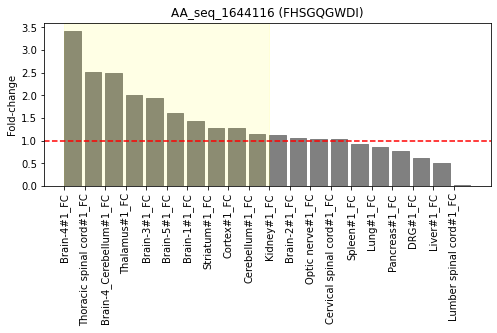

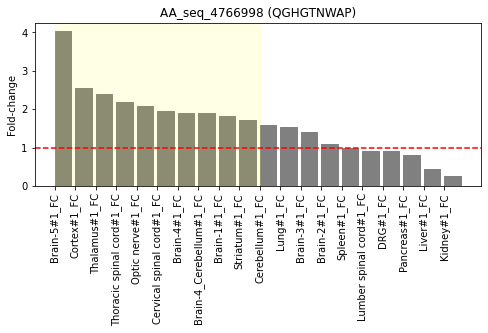

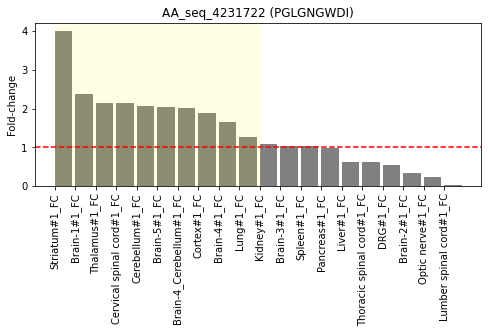

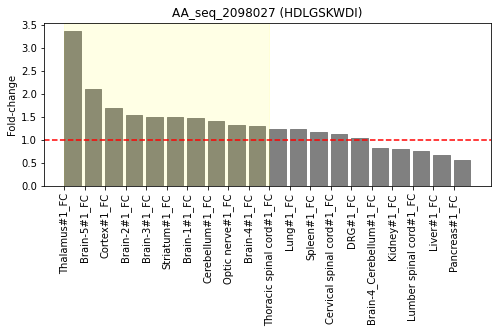

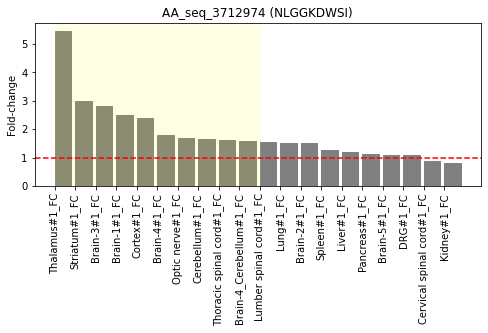

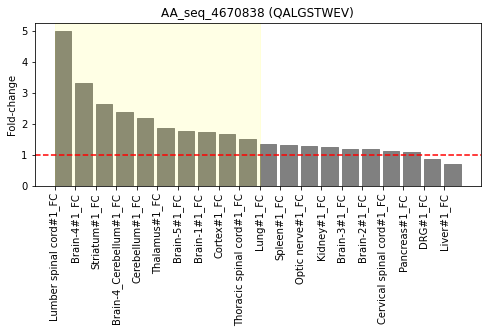

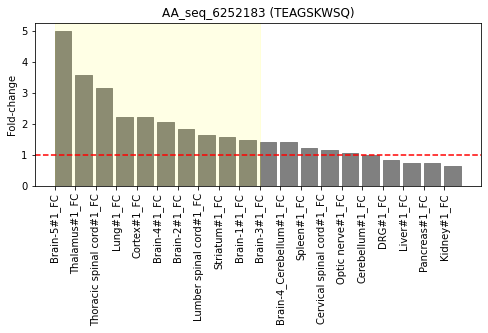

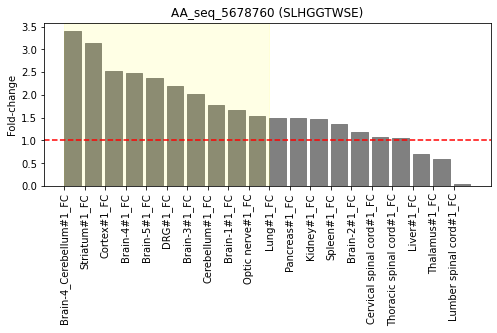

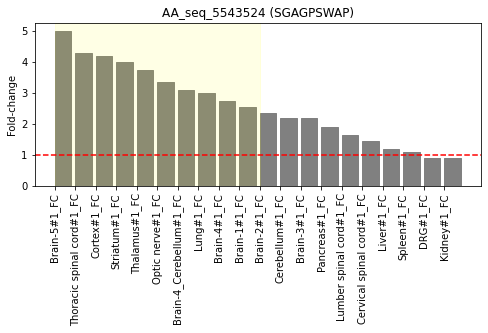

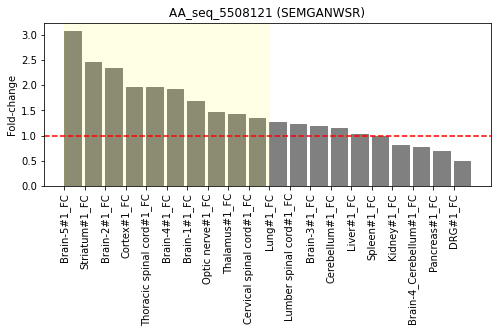

In [51]:
# 組織で順位付け
for i in range(len(top10_1)):
    seqID = top10_1.loc[i, 'AA_seq_ID']
    AA_seq = top10_1.loc[i, 'AA_seq']
    x = tissue_rank_list_1[seqID]
    y = rep1[rep1['AA_seq_ID'] == seqID].loc[:, x].values[0].tolist()
    #xx = [name.replace('FC', 'std') for name in x]
    #z = rep12_std[rep12_std['AA_seq_ID'] == seqID].loc[:, xx].values[0].tolist()
    
    fig, ax = plt.subplots(figsize=(8, 3))
    #error_bar_set = dict(lw=1, capthick=0.5, capsize=2)
    #ax.bar(x, y, color='gray', edgecolor='gray', yerr=z , error_kw=error_bar_set, align='edge')
    ax.bar(x, y, color='gray', edgecolor='gray', align='edge')
    ax.axvspan(x[0],  x[10], color='yellow', alpha=0.1)
    #plt.ylim(0, 30)
    plt.xticks(rotation=90)
    plt.axhline(y=1, color='red', linestyle='--')
    plt.title(f'{seqID} ({AA_seq})')
    plt.ylabel('Fold-change')
    #fname = 'PG4699_' + 'tissue_score_' + 'rank_' + str(i+1) + '.png'
    #plt.savefig('A:/PROJECT/PG4699/200_INFO/08_rep_perfomance/' + fname, bbox_inches='tight', dpi=300)
    plt.show()

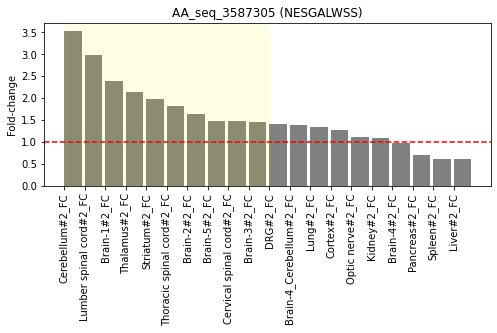

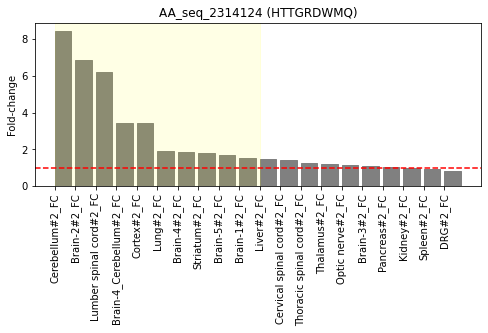

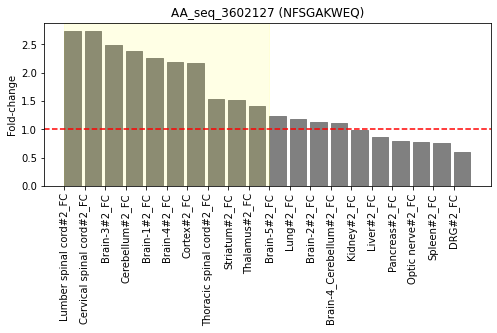

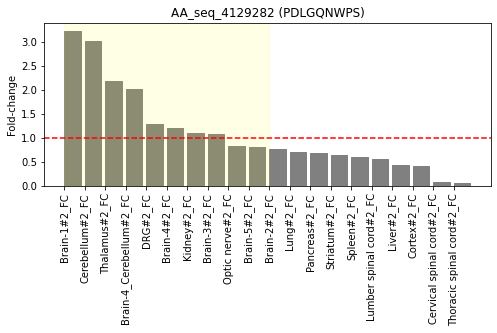

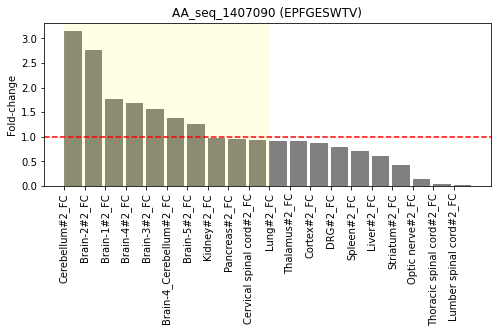

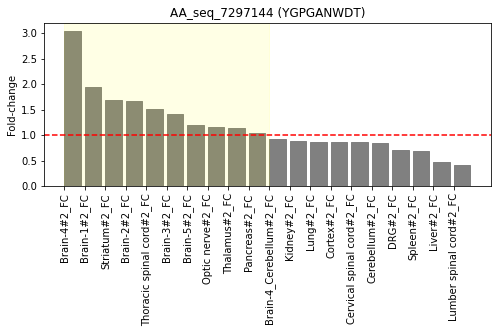

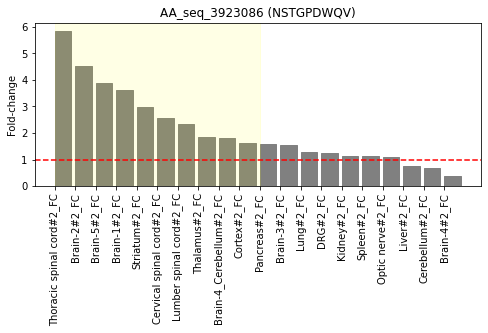

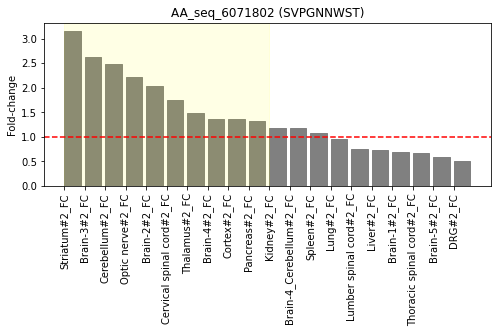

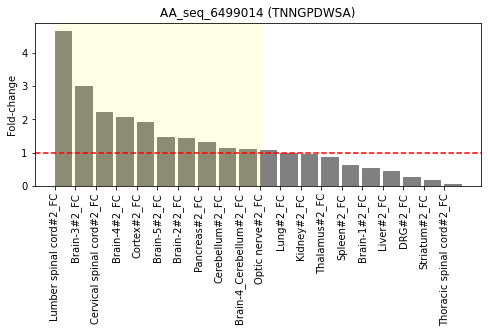

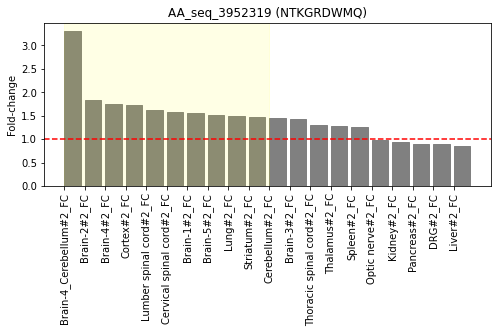

In [52]:
# 組織で順位付け
for i in range(len(top10_2)):
    seqID = top10_2.loc[i, 'AA_seq_ID']
    AA_seq = top10_2.loc[i, 'AA_seq']
    x = tissue_rank_list_2[seqID]
    y = rep2[rep2['AA_seq_ID'] == seqID].loc[:, x].values[0].tolist()
    #xx = [name.replace('FC', 'std') for name in x]
    #z = rep12_std[rep12_std['AA_seq_ID'] == seqID].loc[:, xx].values[0].tolist()
    
    fig, ax = plt.subplots(figsize=(8, 3))
    #error_bar_set = dict(lw=1, capthick=0.5, capsize=2)
    #ax.bar(x, y, color='gray', edgecolor='gray', yerr=z , error_kw=error_bar_set, align='edge')
    ax.bar(x, y, color='gray', edgecolor='gray', align='edge')
    ax.axvspan(x[0],  x[10], color='yellow', alpha=0.1)
    #plt.ylim(0, 30)
    plt.xticks(rotation=90)
    plt.axhline(y=1, color='red', linestyle='--')
    plt.title(f'{seqID} ({AA_seq})')
    plt.ylabel('Fold-change')
    #fname = 'PG4699_' + 'tissue_score_' + 'rank_' + str(i+1) + '.png'
    #plt.savefig('A:/PROJECT/PG4699/200_INFO/08_rep_perfomance/' + fname, bbox_inches='tight', dpi=300)
    plt.show()

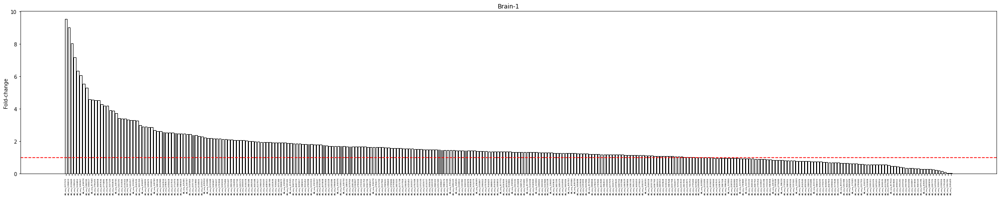

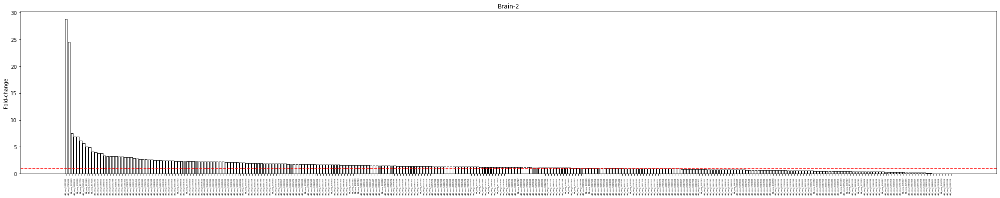

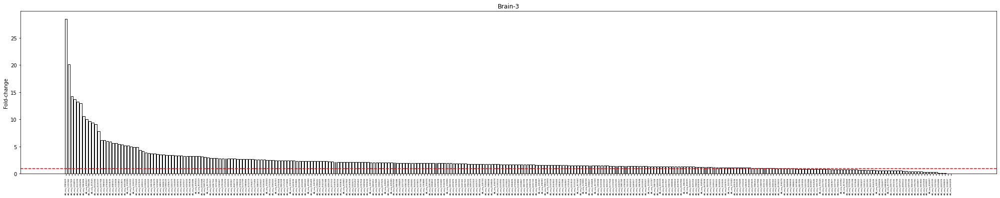

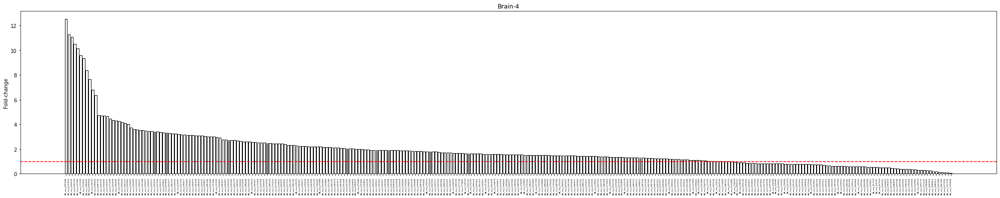

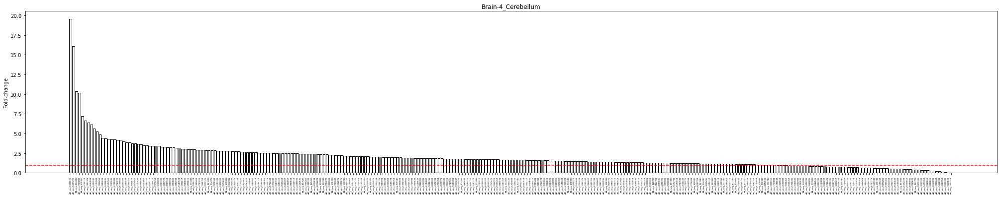

...

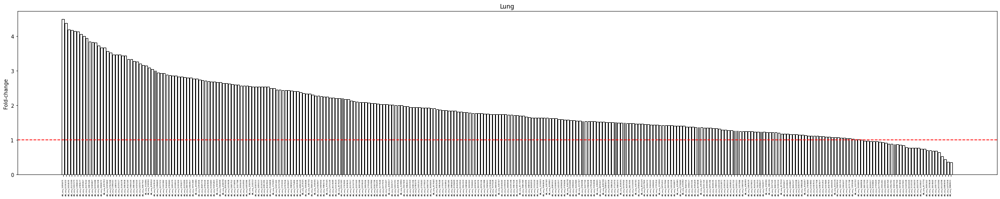

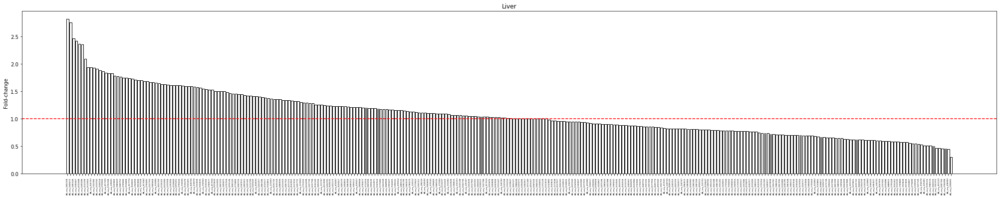

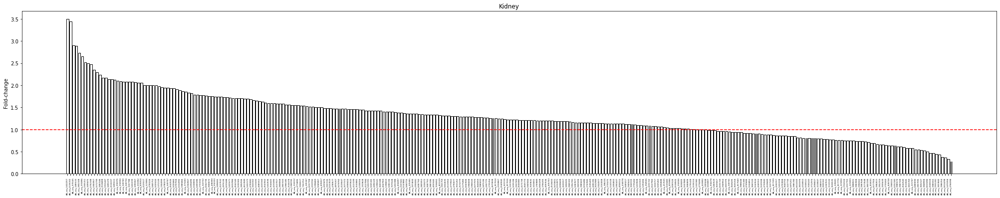

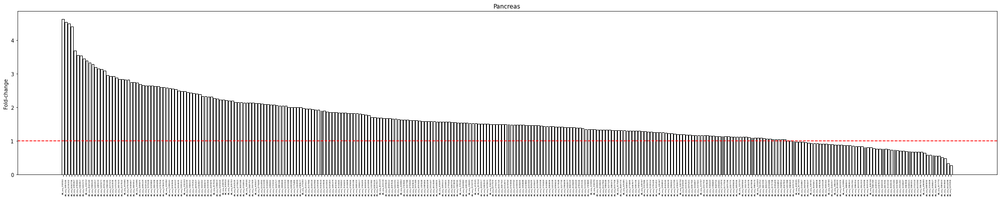

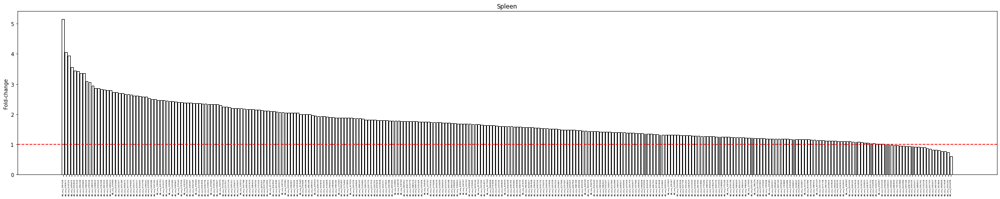

In [54]:
# 10個の脳組織で配列の順位(斜線はTop10配列)
brain = [
    'Brain-1',
    'Brain-2',
    'Brain-3',
    'Brain-4',
    'Brain-4_Cerebellum',
    'Brain-5',
    'Striatum',
    'Thalamus',
    'Cerebellum',
    'Cortex'
]
nerve = [
    'Optic nerve',
    'Cervical spinal cord',
    'Thoracic spinal cord',
    'Lumber spinal cord',
    'DRG'
]
others = [
    'Lung',
    'Liver',
    'Kidney',
    'Pancreas',
    'Spleen',
]

all_tissues = brain + nerve + others

for tissue in all_tissues:
    tissue_FC = tissue + '#1_FC'
    #tissue_std = tissue + '_std'
    df_sort = df1.sort_values(tissue_FC, ascending=False).reset_index()
    x = df_sort['AA_seq_ID'].tolist()
    y = df_sort[tissue_FC].values.tolist()
    #z = df_sort[tissue_std].values.tolist()

    fig, ax = plt.subplots(figsize=(35, 6))
    #error_bar_set = dict(lw=1, capthick=0.5, capsize=2)
    #bar = ax.bar(x, y, color='white', edgecolor='black', yerr=z , error_kw=error_bar_set)
    bar = ax.bar(x, y, color='white', edgecolor='black')

    for AA_seq_ID in top10_1['AA_seq_ID']:
        idx = x.index(AA_seq_ID)
        bar[idx].set_color('gray')

    plt.xticks(rotation=90)
    plt.xticks(fontsize=4)
    plt.axhline(y=1, color='red', linestyle='--')
    #ax.legend(
    #    bbox_to_anchor=(1.05, 1),
    #    loc='upper right',
    #    #borderaxespad=0,
    #    fontsize=8
    #)
    #plt.ylim(0, 30)
    plt.title(f'{tissue}')
    plt.ylabel('Fold-change')
    #fname = 'PG4699_' + 'seq_score_' + tissue + '.png'
    #plt.savefig('A:/PROJECT/PG4699/200_INFO/08_rep_perfomance/' + fname, bbox_inches='tight', dpi=300)
    plt.show()

### DNA配列の抽出 (20221108)

In [114]:
file = 'A:/PROJECT/PG4699/200_INFO/09_candidate/再解析_DNA配列情報依頼_221108.xlsx'
df_info = pd.read_excel(file, header=None)
df_info.columns = ['AA_seq_ID', 'AA_seq', 'Header_ID']

outf = 'A:/PROJECT/PG4699/200_INFO/09_candidate/PG4699_再解析_DNA配列情報依頼_221108.tmp'
with open(outf, 'w') as wf:
    wf.write(f'AA_seq_ID\tAA_seq\tHeader_ID\n')
    for i in range(len(df_info)):
        ID = df_info.loc[i, 'AA_seq_ID']
        AA_seq = df_info.loc[i, 'AA_seq']
        for seq in df_info.loc[i, 'Header_ID'].split(','):
            wf.write(f'{ID}\t{AA_seq}\t{seq}\n')

In [117]:
file = 'A:/PROJECT/PG4699/200_INFO/02_cnt/PG4699_target_count_summary.txt'
cnt_dna = pd.read_csv(file, sep='\t').drop(axis=)

,Header_ID,Sequence,AA_seq,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Optic nerve#2_Count,Cervical spinal cord#2_Count,Thoracic spinal cord#2_Count,Lumber spinal cord#2_Count,Spleen#2_Count,Pancreas#2_Count,Muscle#2_Count,DRG#2_Count,AAV Library#1_Count,AAV Library#2_Count
0,Seq_148,AAAAAAAAAGGGAGTTCTTGGTATATT,KKKGSSWYI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Seq_150,AAAAAAAAAGGGCGTGATTGGATTAAA,KKKGRDWIK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Seq_154,AAAAAAAAAGGGGCGAGGTGGGAAATT,KKKGARWEI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Seq_155,AAAAAAAAAGGGGCTAATTGGTCTAAT,KKKGANWSN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,Seq_156,AAAAAAAAAGGGGTAAACTGGATTAAG,KKKGVNWIK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [115]:
df_tmp = pd.read_csv(outf, sep='\t')

In [125]:
pd.merge(df_tmp, cnt_dna, how='left', on='Header_ID')

MemoryError: Unable to allocate 3.06 GiB for an array with shape (44, 9331575) and data type float64

In [123]:
df_tm

,AA_seq_ID,AA_seq,Header_ID
0,AA_seq_5441882,SDGGTSWAQ,Seq_2715351
1,AA_seq_5441882,SDGGTSWAQ,Seq_2715750
2,AA_seq_5441882,SDGGTSWAQ,Seq_9550657
3,AA_seq_5441882,SDGGTSWAQ,Seq_9550663
4,AA_seq_5441882,SDGGTSWAQ,Seq_9556970
...,...,...,...
349,AA_seq_3985843,NTTGRDWMQ,Seq_619374
350,AA_seq_3985843,NTTGRDWMQ,Seq_620818
351,AA_seq_3985843,NTTGRDWMQ,Seq_620826
352,AA_seq_3985843,NTTGRDWMQ,Seq_620987


In [124]:
cnt_dna

,Header_ID,Sequence,AA_seq,Brain-1#1_Count,Brain-2#1_Count,Brain-3#1_Count,Brain-4#1_Count,Brain-4_Cerebellum#1_Count,Brain-5#1_Count,Striatum#1_Count,...,Optic nerve#2_Count,Cervical spinal cord#2_Count,Thoracic spinal cord#2_Count,Lumber spinal cord#2_Count,Spleen#2_Count,Pancreas#2_Count,Muscle#2_Count,DRG#2_Count,AAV Library#1_Count,AAV Library#2_Count
0,Seq_148,AAAAAAAAAGGGAGTTCTTGGTATATT,KKKGSSWYI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Seq_150,AAAAAAAAAGGGCGTGATTGGATTAAA,KKKGRDWIK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Seq_154,AAAAAAAAAGGGGCGAGGTGGGAAATT,KKKGARWEI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Seq_155,AAAAAAAAAGGGGCTAATTGGTCTAAT,KKKGANWSN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,Seq_156,AAAAAAAAAGGGGTAAACTGGATTAAG,KKKGVNWIK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9331570,Seq_10752884,TTTTTTTTGGGGGCGTCTTGGGAGTTG,FFLGASWEL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
9331571,Seq_10752885,TTTTTTTTGGGGGGTAATTGGGGCCGC,FFLGGNWGR,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9331572,Seq_10752886,TTTTTTTTGGGGTCGTATTGGTATGAG,FFLGSYWYE,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9331573,Seq_10752887,TTTTTTTTGGGGTCTACGTGGGGGGAT,FFLGSTWGD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [4]:
#file = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/DRG(Nerve)/PG4699_Brain_AA_Seq_Enrichment.xlsx'
#df_enrh_1 = pd.read_excel(file, sheet_name='100-131')
#df_enrh_2 = pd.read_excel(file, sheet_name='200-231')

In [ ]:
#rep1_seqID = {}
#rep1_score = {}
#for i in range(len(df_enrh_1)):
#    ID = df_enrh_1.loc[i, 'AA_seq_ID']
#    rep1_seqID[ID] = df_enrh_1.loc[i, 'AA_seq']
#    rep1_score[ID] = df_enrh_1.loc[i, 'Enrichment']

#rep2_seqID = {}
#rep2_score = {}
#for i in range(len(df_enrh_2)):
#    ID = df_enrh_2.loc[i, 'AA_seq_ID']
#    rep2_seqID[ID] = df_enrh_2.loc[i, 'AA_seq']
#    rep2_score[ID] = df_enrh_2.loc[i, 'Enrichment']

In [ ]:
#clster_otu1 = {}
#for i in clster_rep1.keys():
#    _, otu = i.split('#') 
#    clster_otu1[i] = rep1_seqID[otu]

#clster_mean1 = {}
#for i in clster_sum1.keys():
#    n = len(clster_rep1[i].split(','))
#   clster_mean1[i] = clster_sum1[i] / n

In [50]:
#df_crep1 = pd.DataFrame([clster_rep1.keys(), clster_rep1.values()]).T
#df_crep1.columns = ['cluster', 'AA_seq_ID']
#df_csum1 = pd.DataFrame([clster_sum1.keys(), clster_sum1.values()]).T
#df_csum1.columns = ['cluster', 'score_sum']
#df_cseq1 = pd.DataFrame([clster_seq1.keys(), clster_seq1.values()]).T
#df_cseq1.columns = ['cluster', 'AA_seq']
#df_cotu1 = pd.DataFrame([clster_otu1.keys(), clster_otu1.values()]).T
#df_cotu1.columns = ['cluster', 'rep_AA_seq']
#df_cave1 = pd.DataFrame([clster_mean1.keys(), clster_mean1.values()]).T
#df_cave1.columns = ['cluster', 'score_mean']

In [51]:
#df_new = pd.merge(cnt_index, df_mod, how='left', on='Sequence')

#df_cluster1 = pd.merge(df_cluster1, df_csum1, how='left', on='cluster')
#df_cluster1 = pd.merge(df_cluster1, df_cave1, how='left', on='cluster')

In [57]:
#df_crep2 = pd.DataFrame([clster_rep2.keys(), clster_rep2.values()]).T
#df_crep2.columns = ['cluster', 'AA_seq_ID']
#df_csum2 = pd.DataFrame([clster_sum2.keys(), clster_sum2.values()]).T
#df_csum2.columns = ['cluster', 'score_sum']
#df_cseq2 = pd.DataFrame([clster_seq2.keys(), clster_seq2.values()]).T
#df_cseq2.columns = ['cluster', 'AA_seq']
#df_cotu2 = pd.DataFrame([clster_otu2.keys(), clster_otu2.values()]).T
#df_cotu2.columns = ['cluster', 'rep_AA_seq']
#df_cave2 = pd.DataFrame([clster_mean2.keys(), clster_mean2.values()]).T
#df_cave2.columns = ['cluster', 'score_mean']

In [58]:
#df_tmp = pd.merge(df_cotu2, df_crep2, how='left', on='cluster')
#df_cluster2 = pd.merge(df_tmp, df_cseq2, how='left', on='cluster')
#df_cluster2 = pd.merge(df_cluster2, df_csum2, how='left', on='cluster')
#df_cluster2 = pd.merge(df_cluster2, df_cave2, how='left', on='cluster')

In [64]:
#outfile = 'A:/PROJECT/PG4699/200_INFO/04_reanalysis/PG4699_Brain_AA_Seq_cluster_enrichment.xlsx'
#with pd.ExcelWriter(outfile) as writer:
#    df_cluster1.to_excel(writer, sheet_name='100-131', index=False)
#    df_cluster2.to_excel(writer, sheet_name='200-231', index=False)